# Documentation for Hydra Multi-Asset Verification Test
ACTION_LIST = [['test_add', 'test_q_for_r', 'test_r_for_r','test_r_for_q', 'test_remove']]



## Model Description

The methodology for the tests is to create two universes - one for Hydra and one for Uniswap - to subsequently be able to represent sequences of actions on each side. As the Hydra system is unique in its design and has no counterpart yet for approprate comparisons the role of the benchmark will be fulfilled by assembling several Uniswaps together in a way that everything that can be done in Hydra can be accordingly reproduced. This allows next to compare the implications on both systems and ultimately assess the quantitative and qualitative differences of results and impacts on the Hydra system and its agents. 

This approach necessitates the definition and specification of two models:
   - 1 Hydra Omnipool model with one instance that is defined in line with the [Hydra Mathematical Specification](https://hackmd.io/M7OeWimITKGVxBDHGQa6gQ?view)
   - 1 Uniswap model with several instances that each are responsible for a particular mechanism
        - which of 1 instance is used for liquidity provision in asset $R_i$: this is modeled as a Uniswap of $R_i$ and $Q$
        - which of 1 instance is used for liquidity provision in asset $R_j$: this is modeled as a Uniswap of $R_j$ and $Q$
        - which of 1 instance is used for swaps between assets $R_i$ and $R_j$: this is modeled as a Uniswap of $R_i$ and $R_j$
        
![](https://i.imgur.com/yb6Zh3T.png)
        
## Test cases

A variety of testcases can be explored with this model resulting from a combination of the following parameters
   
   - Event: Add Liquidity, Remove Liquidity, Swap Asset, Swap Asset for Base
   - Asset: $R_i$, $R_j$, $R_k$, $Q$
   - Multiple Action Type: Alternating, $i$ only, $j$ only
   - Composite Action Type: Alternating, Trade Bias
   - Enable Symmetric Liquidity: True, False
    
In addition to these settings also a fee structure can be imposed:

   - Fixed Fee

## Test agents

The model specifies a number of eight agents that each have their local balances, can interact with the system and are modeled to be responsible for **one action only**. This allows to track for each testcase how the balances will develop and to show independently which events will trigger changes to local and global states. Most importantly directly and indirectly affected variables can be easily identified.

Two dataframes of agents are initialized identically for both the Uniswap and the Hydra world and then work their way through on each side according to the testcase. Afterwards the effects on both sides can be compared.

![](https://i.imgur.com/r9IAJMr.png)



## Composite Action Tests

Besides being able to test all mechanisms individually also compositions of actions can be performed. This means selecting and combining two from the above testcases and letting the respective agents take the actions repeadetly. A composition action test therefore is defined as two actions which each can be a combination of *event* and *asset* selected from the list of testcases above, for example:
- Add liquidity in $R_i$ and Add liquidity in $R_j$
- Add liquidity in $R_i$ and Swap $R_i$ for $Q$
- Remove liquidity in $R_j$ and Swap $R_i$ for $Q$
- ...

In total there would be 28 composit pairs which can be derived from this decision tree:
selecting any one of the four primitive mechanisms of: **trade in/out** or **add/remove liquidity** of some given asset and then the subsequent action could be the three remaining mechanisms of the same asset or doing anyone of the four mechanisms in another asset.  

These basic combinations can be explored before further proceeding with
- trade sizes,
- trade frequencies,
- randomization,...



## Introduction to Uniswap
>Uniswap is an automated market maker for exchanging ERC20 tokens. Anyone can become a liquidity provider, and invest in the liquidity pool of an ERC20 token. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://uniswap.io/

There are basically eight ways (_mechanisms_) in which an agent can interact with an instance of Uniswap (https://github.com/Uniswap/uniswap-v1/blob/master/contracts/uniswap_exchange.vy):
1. `addLiquidity`: deposit ETH and tokens in the liquidity pool; mint UNI tokens - "shares" of that Uniswap instance - in exchange;
1. `removeLiquidity`: burn UNI tokens; withdraw a proportional amount of ETH and tokens in exchange;
1. `ethToTokenInput`: user specifies an exact amount of ETH they send; receives corresponding amount of tokens
1. `ethToTokenOutput`: user sends some ETH and specifies an exact amount of tokens they want to buy; Uniswap refunds ETH sent in excess
1. `tokenToEthInput`: user specifies an exact amount of tokens they send; receives corresponding amount of ETH
1. `tokenToEthOutput`: user specifies an exact amount of ETH they want to buy; Uniswap takes the corresponding amount of tokens from the user account
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" (effectively a `tokenToEthInput` in instance A combined with a `ethToTokenInput` in instance B)
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Uniswap takes the corresponding amount of "token A" from the user account (effectively a `ethToTokenOutput` in instance B combined with a `tokenToEthOutput` in instance A)

## Limitations and simplifications of this model
* When triggering mechanisms, Uniswap users may include conditions they would like to apply to the transaction. For example, they could define a minimum amount of UNI tokens they wish to receive as a result of adding liquidity to the pool; or the maximum number of tokens they are willing to pay for the amount of ETH requested in a `tokenToEthOutput` operation; or a deadline after which the transaction should not be processed. **This simplified model does not account for this kind conditioning.**

* The `ethToTokenOutput`, `tokenToEthOutput` mechanisms are not implemented. **All swaps are treated as of the "input defined" type.**

* The `tokenToToken` mechanism are not implemented, as they are merely a `tokenToEth` in the context of a single Uniswap instance.

* **User _behavior_ has not been modeled**. User _actions_ are derived from the history of events of the Uniswap instance being analyzed.

## Introduction to Hydra
>Hydra is an automated market maker that generalizes the concept of Uniswap and Balancer to a) an arbitrary number of dimensions and b) a variant weight distaribution of assets in the pool that changes in accordance with action sequences in the pool. Anyone can become a liquidity provider, and invest in the 'Omnipool'. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://hydradx.io/

There is a predefined set of (_mechanisms_) in which an agent can interact with an the Hydra Protocol :
1. `addLiquidity`: deposit a risk asset in the omnipool; mint HDX tokens - "shares" of this risk asset - in exchange;
1. `removeLiquidity`: burn HDX tokens; withdraw a proportional amount of the risk asset in exchange;
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" 
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Hydra takes the corresponding amount of "token A" from the user account 



## Model File structure

The folder **model** contains:

 - a file config.py: 

    This file configures the simulation experiments by setting the number of monte carlo runs, the number of timesteps for the simulation and the simulation parameters. It also aggregates the partial states and the initial state variables.
    
    The purpose of this file is to *configure and initialize* the experiment.
    
    
 - a file partial_state_update_block.py

    This file defines each partial state update block individually. This feature allows cadCAD to divide each simulation timestep into several 'blocks' where different state variables are mutated conditioned upon the policy input.
    
    In the current setting 
    - the first block maps the user action to the appropriate mechanism in the uniswap world
    - the second block maps the user action to the appropriate mechanism in the hydra world
    - the third block resolves the quantities of HDX and weights in the hydra world
    - the forth block calculates the metrics: the swap prices in the uniswap world and the pool prices in the hydra world

    This file corresponds to the system specification diagram, where each column is one partial state update block 
    
    The purpose of this file is to *define* the sequence and details of state updates for each simulation timestep. The relevant mechanisms are imported from the files in the **parts** folder
    
    
 - a file plot_utils.py

    This file defines all plot functions that can be called in the jupyter notebook to visualize the results. In general there are three types of plots:
    - plots related to the uniswap world (do not contain the word 'hydra')
    - plots related to the hydra world (contain the word 'hydra')
    - general plots applicable to both worlds (f.e Impermanent Loss)

    It also can be distinguished between plots related to global system variables and local agent variables:
    - global variables (do not contain the word 'agent')
    - local variables (contain the word 'agent')

    The purpose of this file is to *define* the way how particular properties can be plotted over time.
    

 - a file run.py

    This file *defines* the run and postprocessing methods and is used to execute the simulation run:
    - run() is used to execute the simulation and create a dataframe
    - postprocessing is used to extract relevant metrics from the simulation output in the dataframe

     The purpose of this file is to *execute* the simulation and *create* metrics.
     
     
 - a file state_variables.py

    This file *sets* the number of agents and *defines* the local (agent-level) state variables, *sets* the number of assets and *defines* the global (system-state) variables of the system, *computes* the prices of the assets and *defines* the initial state object
    - the agent states describe their holdings of assets that agents have contributed to the pool or still hold outside as well as their quantities of shares they received for their contribution
    - the global states describe the quantities of assets in the system
    - price variables are computed from the states both in the uniswap and hydra world
    - the initial state object consists of 
        - two agent dataframes, one for each world respectively
        - two sets of global variables, one for each world respectively
        - prices for each world (? is pool = prices ?)

    The purpose of this file is to *define* the global and local states of the system.
    
    
 - a file sys_params.py

    This file *contains* the system parameters and allows to select items from a list for them. Following parameters can be defined:
    - trade action type
    - liquidity action type
    - multiple asset action type
    - composite action type
    - liquidity add type (symmetry)

    In addition the following is set
    - initial values for assets 
    - hard coded fee value
    - choice of the system parameters from the list above
    

 - a folder **parts** which itself contains general files relevant for both instances, files related specifically to Uniswap and files related specifically to Hydra 
      - [action.py](model/parts/action.py)
       This is an action dictionary which drives the model. As there are no behavioral assumptions in the model yet, currently actions are prescribed actions in testing mode derived from events. However, action schema respects https://www.kaggle.com/markusbkoch/uniswap-ethdai-exchange as much as possible, allowing for future analysis against uniswap transaction datasets.
        This file contains a function called 'actionDecoder' which takes its inputs from the file sys_params.py and maps those encoded events to agent actions. At first an arbitrary action dictionary is defined which then is adapted according to the choices of system parameters. In particular relevant are the parameter definitions of the asset, the composite and whether there is a trade or liquidity event defined.
        
    - [uniswap.py](model/parts/uniswap.py)
     Reads in action output and directs the action to the appropriate Uniswap mechanism for each corresponding Uniswap instance. Currently there are two instances in place, namely the R_i<>Q pair and the R_j<>Q pair. Both instances have their respective requisite state variables: UNI_Qx, UNI_Rx, and UNI_Sx.

    - [utils.py](model/parts/utils.py)
    Computes the state update for each Uniswap state variable and outputs the updated global state variables.
        
     - [agent_utils.py](model/parts/agent_utils.py)
     Computes the corresponding agent local state for each Uniswap agent resolving their action and outputs the updates local state variables.

      -  [hydra.py](model/prts/hydra.py)
     Reads in action output and directs the action to the appropriate Hydra mechanism for each state variable: Q, Sq, and pool.
    
      - [hydra_utils.py](model/parts/hydra_utils.py)
     Computes the state update for each Hydra state variable

    -  [asset_utils.py](model/parts/asset_utils.py)
     Computes the state update for each Reserve Asset in a Hydra Omnipool

    -  [hydra_agent_utils_class.py](model/parts/hydra_agent_utils_class.py)
     Computes the corresponding agent local state for each Hydra agent resolving their action and outputs the updates local state variables.
     
     #### The interrelations between the files are shown here:
     
    ![](https://i.imgur.com/mNhfQE4.png)



# Testcase Definition

#### Simulation Settings
- There are 100 timesteps for each simulation run
- Each testcase has 100 MC runs with different randomized variables
- Block 1 randomizes starting liquidity balances (explained below in section 'Block 1')



#### Agent Activities - Action Sequence

There are two agents acting during the simulation. The trading agent performs "R-for-R" trades of equal size but varying direction over most simulation timesteps. The liquidity agent provides liquidity to the pool at timestep 10 and removes the liquidity from the pool at timestep 90.

##### Trading agent

- One Agent performs random "R-for-R" trades during the simulation. 
- The direction of the trade is a random coin flip for each timestep.
- The size of the trade is fixed at $1000$ for each timestep.
- The agent does not act at timestep 10 nor timestep 90.

##### Liquidity agent

- One Agent provides liquidity in Asset "i" to the pool 
- He provides the liquidity at timestep 10
- He removes the liquidity at timestep 90
- He does not act at other timesteps

#### Block 1:

| #   |   Run   | a  | $\mu_i$ |          $\sigma_i$          | $\mu_j$ |          $\sigma_j$          | $\mu$ | $\sigma$ | Total runs         |
| --- |:-------:|:-------:|:-------:|:----------------------------:|:-------:|:----------------------------:| ----- | -------- | ------------------ |
| 1   | 001-100 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 2   | 101-200 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 3   | 201-300 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 4   | 301-400 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$  | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 5   | 401-500 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 6   | 501-600 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |

All tests in block 1 are performed as 100 **MonteCarlo Experiments** with the following randomization:
- The initial balances of the liquidity pools are drawn randomly for each MC run from the same lognormal distribution with $\mu_i$ and $\mu_j$ fixed at $100000$
    - The underlying mean for the lognormal liquidity draw is $\log{100000}$
    - The underlying standard deviation for the lognormal liquidity draw is $\sqrt{\log{1 + \frac{2000^2}{100000^2}}}$
- The action sequence of the agents is randomized in that sense that:
    - For each individual MC run the sequence is identical for the Uniswap and Hydra side of the model. For each timestep of the simulation exactly the same event takes place on both sides.
    - For each individual MC run the trading directions are randomized for each timestep. Therefore the event sequence for each run will be different.
    - For all MC runs the trading amount is always equal to $1000$




# Testcase in this notebook


This notebook documents the results of the following experiment:
- Settings from Block 1 as outlined above
- Testcases **2**, **4** and **6**
- Sweep over three values for $a \in \{0.5, 1, 1.5 \}$ with a fixed $\mu$-to-$\sigma$-ratio of $50$.

The experiment result dataframe is saved into a pickle file and analyzed throughout this notebook.

## Run Model

The following command lines import all packages, experiments and run the model 

This is the execution of cadcad. This writes the config object, does the execution and returns the rdf - which is a data object that shows the rows and columns of results in a dataframe

Here is one additional option as well. The postprocessing causes the index of the results to be every forth because of the cadcad architecture where the partial state updates are the substeps. With this option selected we see only the end of each timestep - the last substep. Therefore only final results are shown. To get a line for each substep the postprocessing needs to be deactivated. 

In [1]:
from model.config_wrapper import ConfigWrapper

from model import run_wrapper
from cadCAD import configs

# parametric_experiment = ConfigWrapper()
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']
# parametric_experiment.get_config()

running file: config_wrapper.py
end of file: config_wrapper.py
running file: run_wrapper.py
end of file: run_wrapper.py


In [2]:
# import model as model


In [3]:
# parametric_experiment = ConfigWrapper(model)


In [4]:
# del configs[:]

# parametric_experiment.append()

In [5]:
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']

In [6]:
# Dependences
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Experiments
from model import run
from model.parts.utils import *
from model.plot_utils import *

pd.options.display.float_format = '{:.2f}'.format

%matplotlib inline

# df = run.run()
# rdf = run.postprocessing(df)
# rdf = df # debugging substeps
# pd.set_option("mode.chained_assignment", None)


running file: run.py
running file: state_variables.py
running file: initialize_liquidity.py
end of file: initialize_liquidity.py
running file: asset_utils.py
end of file: asset_utils.py
end of file: state_variables.py
running file: partial_state_update_block.py
end of file: action_list.py
end of file: partial_state_update_block.py
running file: sim_setup.py
end of file: sim_setup.py
[100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 10000

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

In [7]:
(data, tensor_field, sessions) = run_wrapper.run(drop_midsteps=True)

experiments = data



                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 100
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 3, 22)
Execution Method: local_simulations
SimIDs   : [0, 0, 0, 1, 1, 1, 2, 2, 2, 3, 3, 3, 4, 4, 4, 5, 5, 5, 6, 6, 6, 7, 7, 7, 8, 8, 8, 9, 9, 9, 10, 10, 10, 11, 11, 11, 12, 12, 12, 13, 13, 13, 14, 14, 14, 15, 15, 15, 16, 16, 16, 17, 17, 17, 18, 18, 18, 19, 19, 19, 20, 20, 20, 21, 21, 21, 22, 22, 22, 23, 23, 23, 24, 24, 24, 25, 25, 25, 26, 26, 26, 27, 27, 27, 28, 28, 28, 29, 29, 29, 30, 30, 30, 31, 31, 31, 32, 32, 32, 33, 33, 33, 34, 34, 34, 35, 35, 35, 36, 36, 36, 37, 37, 37, 38, 38, 38, 39, 39, 39, 40, 40, 40, 41, 41, 41, 42, 42, 42, 43, 43, 43, 44, 44, 44, 45, 45, 45, 46, 46, 46, 47, 47, 47, 48, 48, 48, 49, 49, 49, 50, 50, 50, 51, 51, 51, 52, 52, 52, 53, 

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82618.15 110000.00 137974.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 118377.58 110000.00 137807.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  6066.852795379721
H_agent r out =  118377.5766222484
**********
Q ADDED INTO POOL: 962 to existing amount 22193
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6066.852795379721 from reserve 81622.42337775162
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90382.54 110000.00 138971.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -8734.671354063801
H_agent r out =  90382.5420193108


POOL ADD LIQUIDITY Timestep === 74559.5664264135    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82027.18 110000.00 137981.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7799.510698773352
H_agent r out =  82027.17880406685

********************
Q ADDED INTO POOL: 965 to existing amount 22520.93031502079
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5730.209419580374 from reserve 79631.56642641351
**********
 delta_Ri = 
Q ADDED INTO POOL: 1001 to existing amount 27304.082078444622
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7799.510698773352 from reserve 139990.17880406685
**********
4062.32711675114341081135.50387243449 
-6425.074005457371
 addliq - Sq delta SqH_agent r out = H_agent r out = delta W  74736.13890631894
**********
Q ADDED INTO POOL: 1059 to existing amount 22440.23850405084
**********
**********
POOL RESERVE ONE REMOVING ASS

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 60613.57 110000.00 135144.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  -6044.269812078126
H_agent r out =  60613.56865625653
**********
Q ADDED INTO POOL: 1030 to existing amount 29190.557670937356
**********
**********
H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 57601.34 110000.00 133798.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 6044.269812078126 from reserve 118634.56865625651
delta_Ri =  -4643.434860497312
H_agent r out =  57601.34362207117
**********
Q ADDED INTO POOL: 1000 to existing amount 34197.876647697376
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4643.434860497312 from reserve 115514.34362207119 6078.341928658195
H_agent

0 130000.00 180000.00 160000.00  **********
delta_Ri =  -4882.773845358075
H_agent r out =  44628.385525578444
**********
Q ADDED INTO POOL: 1044 to existing amount 31540.055931667364
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4882.773845358075 from reserve 105697.38552557843
**********

POOL RESERVE ONE REMOVING ASSET i in amount 3087.2088999534144 from reserve 102543.41550839235
**********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 159672.79 110000.00 127752.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 37458.45 110000.00 128755.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3551.9213853112497
H_agent r out =  37458.45320736757
**********   m  r_i_out    r_i_in         

27517.47924882362delta_Ri =  -2532.996298212568
H_agent r out =  28203.36192592613
**********
Q ADDED INTO POOL: 899 to existing amount 41065.52234438544
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2532.996298212568 from reserve 90236.36192592618
**********

********** H_chosen_agent
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 161671.16 110000.00 130060.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 170269.33 110000.00 123707.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentQ ADDED INTO POOL: 1004 to existing amount 40740.63168727883   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 174729.44 110000.00 124123.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       

delta_Ri =  -2936.274642697963
H_agent r out =  20071.377380698916
**********
Q ADDED INTO POOL: 1077 to existing amount 41498.229026869274
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2936.274642697963 from reserve 89019.37738069896
**********


delta_Ri =  1917.8655661077069
H_agent r out =  182107.74233602508
**********
Q ADDED INTO POOL: 957 to existing amount 50650.097225349135
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1917.8655661077069 from reserve 83194.25766397496
**********
delta_Ri =  H_chosen_agent********** -2664.2472757180867
H_agent r out =  7723.063567774527
**********
Q ADDED INTO POOL: 1027 to existing amount 40044.60616334258
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2664.2472757180867 from reserve 79778.06356777457
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 20034.40 110000.00 126229.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s

H_chosen_agentH_chosen_agentH_chosen_agent H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9058.84 110000.00 122441.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 189288.92 110000.00 118028.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2093.362323435865
H_agent r out =  189288.9187361035
**********
Q ADDED INTO POOL: 1059 to existing amount 48281.17399846299
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2093.362323435865 from reserve 77550.08126389647
**********
H_chosen_agent  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2258.35 110000.00 117892.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2328.514

  -2394.4773335507725
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 193580.90 110000.00 115982.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1929.1350865078864
H_agent r out =  193580.90281029037
**********
Q ADDED INTO POOL: 912 to existing amount 47052.06140893616
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1929.1350865078864 from reserve 80101.0971897096
**********
H_agent r out = 
H_chosen_agent -8850.96148751159
**********
Q ADDED INTO POOL: 1094 to existing amount 42671.24212857366
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2394.4773335507725 from reserve 73168.03851248846
**********H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -645.09 110000.00 111109.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -

delta_Ri =  -1938.9579227368195
H_agent r out =  -6218.801387935391
**********
Q ADDED INTO POOL: 993 to existing amount 43633.263303261556
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1938.9579227368195 from reserve 67766.19861206459
**********
H_chosen_agentH_agent r out =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6945.49 110000.00 107104.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -1405.5203590208218
H_agent r out = H_chosen_agent -9762.3047450146
**********
Q ADDED INTO POOL: 1003 to existing amount 51145.26245542986
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1619.4928441515856 from reserve 68223.69525498548
**********
-6945.494821309187 
**********
Q ADDED INTO POOL: 999 to existing amount 56681.96109893631
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1405.5203590208218 from reserve 66671.50517869086
**

0 130000.00 180000.00 160000.00  1782.142858900774 -2826.1739738646284
H_agent r out =  207160.21278490726
**********
Q ADDED INTO POOL: 1031 to existing amount 50962.00540237653
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1782.142858900774 from reserve 72413.78721509269
**********


H_agent r out = delta_Ri =  -15354.780994917364
**********
Q ADDED INTO POOL: 1085 to existing amount 39898.52330440902 
**********H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 208942.36 110000.00 107940.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  2066.303731229057**********

delta_Ri =  1672.3000989981485
H_agent r out =  208942.35564380803
**********
Q ADDED INTO POOL: 1016 to existing amount 51993.00540237653
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1672.3000989981485 from reserve 70631.64435619191
**********
H_chosen_agent
POOL RESERVE ONE REMOV

 delta_Ri = H_chosen_agent 1826.3721585330754
H_agent r out =  221497.8556983834
**********
Q ADDED INTO POOL: 1014 to existing amount 48753.793528614246
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1826.3721585330754 from reserve 71442.14430161647
**********
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -25661.17 110000.00 107778.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -19618.41 110000.00 97121.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1127.1867374318142
H_agent r out =  -19618.408742292635
**********
Q ADDED INTO POOL: 1053 to existing amount 63507.92801715117
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1127.1867374318142 from reserve 58079.59125770742
**********
   m   r

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 224397.19 110000.00 97105.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1508.752292134023
H_agent r out =  224397.1919014484
**********
Q ADDED INTO POOL: 1050 to existing amount 57995.6420786865
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1508.752292134023 from reserve 70344.80809855166
**********
H_chosen_agent H_chosen_agentH_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 226950.99 110000.00 105040.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent154743.0H_chosen_agent 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -21493.96 110000.00 101530.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00 

H_agent r out =  154669.0H_chosen_agent H_chosen_agent
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27731.34 110000.00 89170.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -26651.22 110000.00 97519.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 232335.76 110000.00 102066.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  1773.967223989372
H_agent r out =  232335.7603021075
**********
Q ADDED INTO POOL: 1003 to existing amount 39976.52569617144
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1773.967223989372 from reserve 54572.54856503668
**********

-40979.87692255008H_chose

 POOL REMOVE LIQUIDITY Timestep ===    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30108.11 110000.00 94554.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent 
delta_Ri =  -1212.134498494964
H_agent r out =  -30108.11230774505
**********
Q ADDED INTO POOL: 1013 to existing amount 57697.86452362295
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1212.134498494964 from reserve 57931.88769225496
**********
H_chosen_agent      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  7873.463137993077
H_agent r out =  109297.05215419501
**********
Q ADDED INTO POOL: 1023 to existing amount 21000
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7873.463137993077 from reserve 90


delta_Ri =  -907.9439103636876
H_agent r out =  -34879.26348319621
**********
Q ADDED INTO POOL: 1032 to existing amount 57318.206278646234
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 907.9439103636876 from reserve 42272.27736278881
**********
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 140819.05 110000.00 133252.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 58804.68 110000.00 133923.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
 3539.2707564392067
H_agent r out =  140819.04919659195
**********
Q ADDED INTO POOL: 1053 to existing amount 26748
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3539.2707564392067 from reserve 59180.95080340808
**********

delta_Ri = delta_Ri =  -4719.53831

 delta_Ri =  H_chosen_agent-6792.424593953777 H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90594.17 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 42023.29 110000.00 129875.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -7541.904009405487
H_agent r out =  90594.1715773951
**********
Q ADDED INTO POOL: 967 to existing amount 21000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7541.904009405487 from reserve 90594.17157739511
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 51879.01 110000.00 131987.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3352.9530952772043
H_agent r out =


delta_Ri =  9297.05215419502
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9297.05215419502 from reserve 100000.00000000001
 **********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 66170.70 110000.00 135069.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4753.035555742913
H_agent r out = H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 38051.80 110000.00 128233.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  addliq - Sq delta Sq 

delta_Ri =  7693.6

 delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 140089.25 110000.00 134056.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 165205.93 110000.00 125151.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

delta_Ri =  2728.95214260583
H_agent r out =  165205.93434807527
**********
Q ADDED INTO POOL: 984 to existing amount 45139.01267010987
H_chosen_agentdelta_Ri =  4975.755698481721
H_agent r out =  140089.25121142797
**********
Q ADDED INTO POOL: 966 to existing amount 32670.94738765115
**********
**********
H_chosen_agent-2890.0748715628015POOL RESERVE ONE REMOVING ASSET i in amount 4975.755698481721 from reserve 120998.74878857203
H_agent r out =  45759.4640923533 
**********


**********
Q ADDED INTO POOL: 918 to existing amount 41041.8963333574
***

H_chosen_agent H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 50531.57 110000.00 130783.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 144311.51 110000.00 132973.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 37092.29 110000.00 126887.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -3228.7611165127805
H_agent r out =  50531.56759137517
**********
Q ADDED INTO POOL: 1088 to existing amount 44440.48223822869
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3228.7611165127805 from reserve 104450.56759137516
**********
delta_

H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 162362.46 110000.00 128109.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  5540.84 110000.00 117716.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2266.7739397030687
H_agent r out =  5540.838076071135
**********
Q ADDED INTO POOL: 1021 to existing amount 44894.07130917769
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2266.7739397030687 from reserve 79927.83807607114
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 36412.87 110000.00 125520.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent    m   r_i_out    r_i_in         h

 **********H_chosen_agent
Q ADDED INTO POOL: 1125 to existing amount 51837.946983369366
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2264.9326531124934 from reserve 85823.29175340573
**********
7302.609537821974H_chosen_agent 1953.3007932480982
 H_chosen_agent**********
Q ADDED INTO POOL: 909 to existing amount 47998.32331992456
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1798.7119842163222 from reserve 76447.60953782199
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1163.65 110000.00 114679.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 173889.38 110000.00 124128.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2132.683217434741
H_agent r out =  -1163.6470663593082
********

 18744.321479414153-2172.9254290049494


**********
Q ADDED INTO POOL: 1038 to existing amount 46037.60771401931
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2427.210312552389 from reserve 86910.32147941418
**********
delta_Ri =  2269.993614780365
H_agent r out =  190640.80105840863
**********
Q ADDED INTO POOL: 1010 to existing amount 49047.43940190757
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2269.993614780365 from reserve 89800.19894159141
**********
H_chosen_agent
Q ADDED INTO POOL: 981 to existing amount 50510.80376667512 
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1706.2779215606583 from reserve 71658.49651455591
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 23765.70 110000.00 119469.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2124.202468693518
H_agent r out =  23765.698649785292
**********
Q A

 H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 191739.32 110000.00 116190.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1895.4048606456686
H_agent r out =  191739.31543464516
**********
Q ADDED INTO POOL: 988 to existing amount 48702.24909188935
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1895.4048606456686 from reserve 75949.68456535487
**********
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 199040.30 110000.00 110412.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -189.05 110000.00 115121.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r

 H_agent r out =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 197401.64 110000.00 113262.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  2002.5671188020522
H_agent r out =  197401.63548447393
**********
Q ADDED INTO POOL: 1060 to existing amount 48965.742679252384
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2002.5671188020522 from reserve 75414.36451552613
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 206391.03 110000.00 112693.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent2953.4341467866157
**********
Q ADDED INTO POOL: 1084 to existing amount 48125.01175712379
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2266.62169462493 from reserve 82201.43414678666
**********
 delta_Ri = 
delta_Ri =  1929.2019736775708
H_agent r 

H_chosen_agentH_chosen_agentH_chosen_agent  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14705.32 110000.00 103096.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 206591.38 110000.00 107968.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 H_chosen_agentdelta_Ri =  -1459.194040364354
H_agent r out =  -14705.317838397343
**********
Q ADDED INTO POOL: 1062 to existing amount 55541.70442725628
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1459.194040364354 from reserve 63604.68216160267
**********

 delta_Ri =  1556.4695384529862
H_agent r out =  206591.37682672168
**********
Q ADDED INTO POOL: 1032 to existing amount 53667.177303594755
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1556.46953

154733.0 H_chosen_agent
********** 
POOL RESERVE ONE REMOVING ASSET i in amount 1228.7613140896012 from reserve 61404.03515920963
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 209861.14 110000.00 105874.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  1607.319162463235
H_agent r out =  209861.14092360187
**********
Q ADDED INTO POOL: 1015 to existing amount 52608.409738416354
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1607.319162463235 from reserve 68928.85907639816
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 217088.34 110000.00 100297.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33017.63 110000.00 96371.00 170000.00 150000.00 0.00 120000.00   

     

-1284.4621686361731 Q ADDED INTO POOL: 997 to existing amount 58896.19980045448Q ADDED INTO POOL: 988 to existing amount 52427.789341072865
H_agent r out =  -37009.745527239225
**********
Q ADDED INTO POOL: 1082 to existing amount 47791.87051946548
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1284.4621686361731 from reserve 46269.02572131006
**********

-1350.5564166961951

H_agent r out =  -23753.75918682438
**********
Q ADDED INTO POOL: 1160 to existing amount 59438.46380509006
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1350.5564166961951 from reserve 58517.24081317564
**********
154750.0
H_chosen_agent**********
 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1470.4759278221918 from reserve 73158.68200479668
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -15190.64 110000.00 102690.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  P

-989.3364904897917 
H_agent r out =  -29393.4320090472
**********
Q ADDED INTO POOL: 999 to existing amount 63675.9080794602
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 989.3364904897917 from reserve 53860.56799095282
**********

delta_Ri =  -1605.7317569241661
H_agent r out =   1468.1660772009236
H_agent r out =  225192.908756914
**********
Q ADDED INTO POOL: 1065 to existing amount 54030.59603817753
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1468.1660772009236 from reserve 62032.09124308602
**********
-22393.382682060026
H_chosen_agent**********H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90136.07 110000.00 138991.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -7915.668656801192
H_agent r out =  90136.06982983382
**********
Q ADDED INTO POOL: 982 to existing amount 20809.38864908107
**********
**********
POOL RESERVE ON


H_chosen_agent**********
POOL RESERVE ONE REMOVING ASSET i in amount 1398.5260700170409 from reserve 61645.8814467264
**********


delta_Ri =  -1314.29970555264
H_agent r out =  -15979.553936160159
**********
Q ADDED INTO POOL: 996 to existing amount 61674.85040667388
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1314.29970555264 from reserve 69122.44606383982
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 75123.27 110000.00 136959.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = delta_Ri = H_chosen_agent   1345.838035137839
H_agent r out =  227748.7690368381
**********
Q ADDED INTO POOL: 974 to existing amount 50657.338109972756
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1345.838035137839 from reserve 57392.78951484458
**********
H_chosen_agent delta_Ri = 1343.521175696793
H_agent r out =  223459.2398398971
**********
Q ADDED INT

0 130000.00 180000.00 160000.00  
delta_Ri =  -8295.456773911033
H_agent r out =  89475.05478093172
**********
Q ADDED INTO POOL: 1028 to existing amount 20674.239358106246
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8295.456773911033 from reserve 93547.05478093174
**********


delta_Ri =  -5065.936717385961
H_agent r out =  64235.85355256624
**********
Q ADDED INTO POOL: 1085 to existing amount 34811.98874795466
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5065.936717385961 from reserve 119295.85355256624
**********
delta_Ri =  -1121.2968918044037
H_agent r out =  -34743.552559254094
**********H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32889.98 110000.00 96311.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1552.5692681133653
H_agent r out =  -32889.982028808445
**********
Q ADDED INTO POOL: 1010 to existing amount 41227

 H_chosen_agent **********


   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82995.14 110000.00 137974.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82733.49 110000.00 138010.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1216.7529866467933
H_agent r out =  -24521.76331008351
**********
Q ADDED INTO POOL: 1048 to existing amount 55007.661843033835
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1216.7529866467933 from reserve 53113.40951979421
**********

H_chosen_agentH_chosen_agentQ ADDED INTO POOL: 1023 to existing amount 21790.552598934133delta_Ri =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 231666.48 110000.00 91022.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j

0 130000.00 180000.00 160000.00  
delta_Ri =  -5199.7009477279325
H_agent r out = H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 65639.29 110000.00 135108.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -4721.339973014279
delta_Ri =  -4777.968508676128
H_agent r out =  65639.28969082166
**********
Q ADDED INTO POOL: 1000 to existing amount 34361.25053804437
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4777.968508676128 from reserve 119643.28969082168
**********

H_agent r out =  52666.87802140165
**********
Q ADDED INTO POOL: 1015 to existing amount 34038.6473306977
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4721.339973014279 from reserve 116688.87802140167
**********
69282.63579122408H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 33031.56 110000.00 126916.00 170000.00 150000.00 0.00 120000.00

H_chosen_agentH_chosen_agent  H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 51185.26 110000.00 132162.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   addliq - Sq delta Sq
delta_Ri =  -4103.968785793919
H_agent r out =  51185.25815039905
**********
Q ADDED INTO POOL: 1005 to existing amount 35465.36304623821
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4103.968785793919 from reserve 108259.25815039907
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 123959.19 110000.00 137022.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 48507.98 110000.00 131149.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  55

delta_Ri =  3372.7705339034615
H_agent r out =  160586.49145254248
**********
Q ADDED INTO POOL: 1033 to existing amount 39635.899007775566
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3372.7705339034615 from reserve 99713.50854745753
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 52369.32 110000.00 132047.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 11677.96 110000.00 118785.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2209.961123546389
H_agent r out =  11677.962238022426
**********
Q ADDED INTO POOL: 1044 to existing amount 46918.31281684051
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2209.961123546389 from reserve 79691.96223802245
**********
 

 **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2652.1367848724994 from reserve 90380.31514690754
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 159979.60 110000.00 128027.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2941.2999888364625
H_agent r out =  159979.59733746064
**********
Q ADDED INTO POOL: 1054 to existing amount 43111.45648917384
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2941.2999888364625 from reserve 95004.4026625394
**********
-1826.6925515725884H_chosen_agentH_chosen_agentdelta_Ri =  H_chosen_agent -2519.339463823667
H_agent r out =  16559.208679803014
**********
Q ADDED INTO POOL: 952 to existing amount 42060.89177544268
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2519.339463823667 from reserve 87548.20867980302
**********
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_

  delta_Ri =  -3178.4451866849217
H_agent r out =  26032.784812454567
**********
Q ADDED INTO POOL: 1049 to existing amount 39619.73274801499
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3178.4451866849217 from reserve 93123.78481245459
**********
delta_Ri = 29311.162837293108   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 21639.22 110000.00 122371.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
  
-1520.3580541141432
H_agent r out =  -3121.3160289659463
**********
Q ADDED INTO POOL: 1047 to existing amount 54608.59032108346
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1520.3580541141432 from reserve 65848.68397103407
**********
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 176277.24 110000.00 123654.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 16

0 130000.00 180000.00 160000.00  
delta_Ri =  -1138.8999441447484
H_agent r out =  -8714.462116776094
**********
Q ADDED INTO POOL: 872 to existing amount 57099.30884771246
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1138.8999441447484 from reserve 62320.53788322393
**********
delta_Ri =   -3058.2866580831424
H_agent r out =  21335.229050519476
**********
Q ADDED INTO POOL: 951 to existing amount 38928.15763090212
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3058.2866580831424 from reserve 95131.2290505195
**********

delta_Ri =  2537.326359549562
H_agent r out =  186638.4494660247
**********
Q ADDED INTO POOL: 1121 to existing amount 45615.0196045212
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2537.326359549562 from reserve 82874.55053397534
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 14742.71 110000.00 121117.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j     

0 130000.00 180000.00 160000.00  
delta_Ri =  -1649.5297936245047
H_agent r out =  6729.994988892194
**********
Q ADDED INTO POOL: 920 to existing amount 49862.91610705447
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1649.5297936245047 from reserve 72628.99498889221
**********
H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 195406.26 110000.00 115497.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  2003.4757281628729
H_agent r out = H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 12208.08 110000.00 121061.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
195406.26313496137
**********
Q ADDED INTO POOL: 991 to existing amount 47760.53860249738
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2003.4757281628729 from

H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1229.98 110000.00 110392.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2027.36 110000.00 113091.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1757.3884833607065
H_agent r out =  -2027.3648199226138
**********
Q ADDED INTO POOL: 1040 to existing amount 49851.1536986531
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1757.3884833607065 from reserve 69274.6351800774
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7902.86 110000.00 112022.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -1982.8752315488432
H_agent r out =  -7

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1950.51 110000.00 113029.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2087.261136062273
H_agent r out =  1950.5119361347924
**********
Q ADDED INTO POOL: 988 to existing amount 46918.57555012699
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2087.261136062273 from reserve 80272.51193613479
**********
 H_chosen_agentdelta_Ri =  1781.1568471158964
H_agent r out =  209052.69382413788
**********
Q ADDED INTO POOL: 1024 to existing amount 50712.88955779965
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1781.1568471158964 from reserve 72423.30617586219
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6968.64 110000.00 110022.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1548.37951888024

0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11614.00 110000.00 107009.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -9993.89 110000.00 104449.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1302.5476739702578
H_agent r out =  -9993.893569093569
**********
Q ADDED INTO POOL: 957 to existing amount 55733.373653327275
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1302.5476739702578 from reserve 63166.10643090645
**********

H_chosen_agentdelta_Ri =  -1675.1678861610671
H_agent r out =  1852.1281075113861
H_agent r out =  201731.291199944
**********
Q ADDED INTO POOL: 1022 to existing amount 51167.54453700751
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1852.1281075113861

0 130000.00 180000.00 160000.00  
delta_Ri =  -1104.8694947779566
H_agent r out =  -28841.485151774938
**********
Q ADDED INTO POOL: 973 to existing amount 60416.80459124673
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1104.8694947779566 from reserve 58033.514848225095
**********
H_chosen_agent H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 207349.63 110000.00 105996.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -20315.53 110000.00 106955.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent

delta_Ri =  -1658.770320929299
H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8484.33 110000.00 108304.00 170000.00 150000.00 0.00 120000.00   

     r_j_in      

-33370.751522867235H_agent r out =  -23045.910341080526
**********
Q ADDED INTO POOL: 965 to existing amount 57445.30541124886
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1158.4269134139693 from reserve 58253.089658919496
**********
H_chosen_agent H_chosen_agent H_chosen_agent
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -27311.50 110000.00 102998.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -17264.55 110000.00 104207.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33956.97 110000.00 97869.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
H_chosen_agent -1718.580182693018
H

 delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 229978.07 110000.00 95310.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1537.7699603729993
H_agent r out =  229978.07473127748
**********
Q ADDED INTO POOL: 1031 to existing amount 44186.32545919751
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1537.7699603729993 from reserve 52355.307638013954
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  10084.367061920562
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1022 to existing amount 19689.39337904137
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 10084.367061920562 from reserve 103197.00000000001
**********
   m   r_i_out    r_i_in        h   

0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31575.82 110000.00 91211.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  9960.695900748931
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1055 to existing amount 19900.743804199785
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9960.695900748931 from reserve 101000.00000000001
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 68050.76 110000.00 135905.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -10114.598442625398
H_agent r o

delta_Ri = delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82978.49 110000.00 138023.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6638.23767005146
H_agent r out =  82978.48722194196
**********
Q ADDED INTO POOL: 1010 to existing amount 21977.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6638.23767005146 from reserve 82978.48722194198
**********
 delta_Ri = H_chosen_agent  -5204.022178641257-9189.903189179362
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9189.903189179362 from reserve 100000.00000000001
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35274.56 110000.00 88225.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 -1339.9788469615044

POOL RESERVE ONE REMOVING ASSET i in amount 4784.107569838492 from reserve 119882.88140137556   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 40747.33 110000.00 129826.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
 
delta_Ri =  -3566.445743831635
H_agent r out =  40747.32605454917
**********
Q ADDED INTO POOL: 984 to existing amount 37416.791440886
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3566.445743831635 from reserve 101813.3260545492
**********
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 55107.13 110000.00 132200.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 66258.36 110000.00 134985.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  


H_agent r out = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 48931.94 110000.00 130165.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -2706.8876180078296
H_agent r out =  48931.93664101447
**********
Q ADDED INTO POOL: 974 to existing amount 45259.00490331854
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2706.8876180078296 from reserve 99873.93664101449
**********
51666.17300089856
 H_chosen_agent**********    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 30451.57 110000.00 126839.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: 1029 to existing amount 41343.49611530743
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3351.1983184876067 from reserve 105664.17300089858
**********
H_chosen_agentH_chosen_agent    m  r_i_out  

0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agentH_chosen_agent  
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 38784.82 110000.00 126233.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 48576.25 110000.00 130897.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 170864.65 110000.00 125917.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2368.61578937264
H_agent r out =  38784.82006967362
**********
Q ADDED INTO POOL: 1010 to existing amount 48380.687371321575
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2368.61578937264 from reserve 91665.82006967365
**********
 
H_chos

0 130000.00 180000.00 160000.00  183516.58925046507    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 16295.77 110000.00 121966.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -2934.640979090774
H_agent r out =  37889.25456462678
**********
Q ADDED INTO POOL: 925 to existing amount 41195.458693591805
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2934.640979090774 from reserve 100997.25456462681
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 36617.52 110000.00 126059.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 20039.43 110000.00 121013.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
 
**********
Q ADDED INTO POOL: 

H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 29305.47 110000.00 124999.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  -2735.727868284455
H_agent r out =  29305.47178603225
**********
Q ADDED INTO POOL: 1008 to existing amount 43709.59665065888
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2735.727868284455 from reserve 93387.47178603227
**********
 delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 25158.95 110000.00 121833.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 188136.42 110000.00 120166.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2503.2607343050363
H_agent r out =  25158

0 130000.00 180000.00 160000.00    H_chosen_agentH_chosen_agent 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3253.254673310126 from reserve 93866.69222081547
**********
 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 21268.32 110000.00 122018.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  7131.99 110000.00 114277.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri = 
delta_Ri =  -1694.4055809441209
H_agent r out =  7131.986614102231
**********
Q ADDED INTO POOL: 991 to existing amount 51138.742214849764
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1694.4055809441209 from reserve 72209.98661410226
**********
 delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 13508.27 11

0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2017.85 110000.00 111265.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 

delta_Ri =  -1627.2141998445177
H_agent r out =  2017.8528159860193
**********
Q ADDED INTO POOL: 980 to existing amount 51764.666258249614
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1627.2141998445177 from reserve 71146.85281598606
**********
delta_Ri = delta_Ri = delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 179768.74 110000.00 122846.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -2406.1056362001304
H_agent r out =  15761.099754164954
**********
Q ADDED INTO POOL: 957 to existing amount 45023.68111510864
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2406.1056362001304 from reserve 

H_chosen_agentH_agent r out = H_chosen_agent  6663.620563167065
**********
Q ADDED INTO POOL: 971 to existing amount 48941.68111510864
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1976.0852636094353 from reserve 80633.62056316712
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 218361.23 110000.00 109952.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 191213.97 110000.00 117839.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2017.4416660787776
H_agent r out =  H_chosen_agent
218361.22986791903
**********
Q ADDED INTO POOL: 1060 to existing amount 46323.305464045574
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2017.4416660787776 from reserve 70933.77013208099
**********
H_chosen_agent  delta_Ri =

 -1210.9866671572945**********
Q ADDED INTO POOL: 994 to existing amount 49383.237254531996
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1976.3394857588587 from reserve 79688.8501011798
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 225848.72 110000.00 105843.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1619.4499714456733
H_agent r out =  225848.7225057473
**********
Q ADDED INTO POOL: 965 to existing amount 48744.63162318184
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1619.4499714456733 from reserve 66475.2774942527
**********
-1689.0526479110579
H_agent r out =  -2425.137043166984
**********
Q ADDED INTO POOL: 957 to existing amount 62275.507683934076
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1210.9866671572945 from reserve 67009.86295683302
**********
H_agent r out = **********
 
POOL RESERVE ONE RE

H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -25192.24 110000.00 100257.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12455.62 110000.00 100642.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
  delta_Ri =  -1325.6393139064862
H_agent r out =  -25192.242591652473
**********
Q ADDED INTO POOL: 978 to existing amount 54844.392335140285
**********
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1372.47 110000.00 112063.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 203928.66 110000.00 110638.00 170000.00 15

0 130000.00 180000.00 160000.00  
delta_Ri =  -949.7770645624532
H_agent r out =  -19498.7863160169
**********
Q ADDED INTO POOL: 924 to existing amount 63272.775979943566
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 949.7770645624532 from reserve 55834.21368398316
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 236193.65 110000.00 99016.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1528.5733885189634
H_agent r out =  236193.64824165
**********
Q ADDED INTO POOL: 1115 to existing amount 52831.391759647915
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1528.5733885189634 from reserve 60103.35175835002
**********

delta_Ri =  -1123.0451197533614
H_agent r out =  -14817.650215481237
**********
Q ADDED INTO POOL: 980 to existing amount 63268.5637100414
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1123.0451197533614 

0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 214381.06 110000.00 103921.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1361.7693104135253
H_agent r out =  214381.06109374447
**********
Q ADDED INTO POOL: 992 to existing amount 54323.88106013762
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1361.7693104135253 from reserve 62082.93890625552
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -19079.68 110000.00 94801.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1096.2627614528208
H_agent r out =  -19079.676187589255
**********
Q ADDED INTO POOL: 1031 to existing amount 65297.76289083173
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1096.2627614528208 from reserve 60043.323812410796
**********

del

0 130000.00 180000.00 160000.00  -1055.4756454908306
 
H_agent r out =  -27124.65274393379
**********
Q ADDED INTO POOL: 1017 to existing amount 62980.52865439885
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1055.4756454908306 from reserve 56179.34725606627
**********delta_Ri =  1090.8896904543242
H_agent r out =  244477.93018262327
**********
Q ADDED INTO POOL: 947 to existing amount 46712.4650125482
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1090.8896904543242 from reserve 43265.66506636327
**********
1482.9127325275358

delta_Ri = 
H_agent r out =  delta_Ri =  -1189.3263285499188
H_agent r out =  -17352.259860943053
**********
Q ADDED INTO POOL: 943 to existing amount 62309.5497959017
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1189.3263285499188 from reserve 66818.74013905696
**********

-944.6707055421413
H_agent r out = delta_Ri =  -1726.3243663238554
H_agent r out =  -20178.616938015806
**********
Q ADDED INTO POO

H_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30206.06 110000.00 85388.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -26897.60 110000.00 99124.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 223850.97 110000.00 96793.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1125.1658639594143
H_agent r out =  223850.9678618865
**********
Q ADDED INTO POOL: 983 to existing amount 58573.42039526767
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1125.1658639594143 from reserve 56628.03213811352
**********
-5466.702795065572
H_agent r out =  69517.42522876315
**********
delta

0 130000.00 180000.00 160000.00  
 -31270.166510443265
**********
Q ADDED INTO POOL: 960 to existing amount 48201.41792927167
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1316.0748922662049 from reserve 53291.011187927164
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -10219.219183162806
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1029 to existing amount 19594.558444892966
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 10219.219183162806 from reserve 104220.00000000001
**********
H_chosen_agentdelta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 63232.47 110000.00 136160.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 
H_chosen_agent
de

0 130000.00 180000.00 160000.00  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 143691.48 110000.00 133817.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  1093.1896763417244
H_agent r out =  231401.62098072268
**********
Q ADDED INTO POOL: 1008 to existing amount 59891.39523922056
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1093.1896763417244 from reserve 55110.37901927732
**********
addliq - Sq delta Sq

H_chosen_agentdelta_Ri =  -7627.915202008544
H_agent r out =  90292.95600220993
**********
Q ADDED INTO POOL: 943 to existing amount 20802.44415645928
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7627.915202008544 from reserve 92228.95600220995
**********
 delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -29619.52 110000.00 83657.00 170000.00 150000.00 0.00 120000.00   

     r_j_in    

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33115.20 110000.00 79649.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 
delta_Ri =  -839.357997385117
H_agent r out =  -33115.19874125402
**********
Q ADDED INTO POOL: 1026 to existing amount 60650.918100160896
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 839.357997385117 from reserve 42382.96191377715
**********

delta_Ri = -2354.5826039098947delta_Ri =  
-5097.760692895032
 1169.6498365037514
H_agent r out =  234556.4249568491
**********
Q ADDED INTO POOL: 1025 to existing amount 48684.23416038233
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1169.6498365037514 from reserve 45193.88840268151
**********
H_chosen_agentH_agent r out = H_agent r out =  28065.09912249047
**********
Q ADDED INTO POOL: 954 to existing amount 44329.94862731215
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 23


delta_Ri =  -5134.7477959533635
H_agent r out =  59353.69943784853
**********
Q ADDED INTO POOL: 1044 to existing amount 33330.57225631338
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5134.7477959533635 from reserve 118225.69943784854
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4470.07414691861 from reserve 106034.44070817294   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 139459.56 110000.00 134220.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
**********
H_chosen_agent H_chosen_agentH_chosen_agent
  delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 54218.95 110000.00 133082.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 19525.96 110000.00 127946.00 170000.00 150000.00 0.00

 4723.052969681883delta_Ri =  -3350.8959324022258
H_agent r out =  35426.65860725996
**********
Q ADDED INTO POOL: 966 to existing amount 37030.35149031853
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3350.8959324022258 from reserve 97279.65860725999
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 61452.77 110000.00 133944.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 **********delta_Ri = 
delta_Ri =  -3812.7153642539724
H_agent r out = -5999.99220165867
H_agent r out =  75903.99516743356
**********
Q ADDED INTO POOL: 955 to existing amount 22255.866430599464
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5999.99220165867 from reserve 80855.99516743358
**********
H_chosen_agentH_agent r out =     61452.77447995664   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  5102.04 110000.00 123768.00 170000.00 150000.00 0.00 

H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  5790.19 110000.00 113576.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 58913.25 110000.00 133982.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -7353.142583338198
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 41080.28 110000.00 130072.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   **********H_chosen_agent

 delta_Ri = 
H_chosen_agent
delta_Ri = Q ADDED INTO POOL: 1038 to existing amount 41743.41754246767 -1551.078975691245
H_agent r out =  5790.1909320382365
**********
Q ADDED INTO POOL: 976 to existing amount 52899.52105556901
**********
**********
POOL RESERVE ONE REMOVING ASSET i in a

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11576.22 110000.00 116714.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 32924.53 110000.00 127999.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1536.215706971573
delta_Ri =  -3581.9496792653367
H_agent r out =  32924.532167486876
**********
Q ADDED INTO POOL: 993 to existing amount 37267.64856910862
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3581.9496792653367 from reserve 100812.53216748692
**********

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 199158.37 110000.00 117065.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_chosen_agentH_chosen_ag

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 34696.63 110000.00 126812.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -18951.37 110000.00 112719.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3309.001938951338
H_agent r out =  34696.631907279
**********
Q ADDED INTO POOL: 1040 to existing amount 40861.03130174529
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3309.001938951338 from reserve 101725.631907279
**********
**********H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22638.07 110000.00 125026.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2970.99131039984
H_agent r out =  22638.073847670974
*******

delta_Ri =  2266.5782384126496
H_agent r out =   190439.42381182592
**********
Q ADDED INTO POOL: 1030 to existing amount 44805.092977346976
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2266.5782384126496 from reserve 78606.57618817405
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3006.34 110000.00 113977.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1763.6118883175645
H_agent r out =  -3006.342182594344
**********
Q ADDED INTO POOL: 1010 to existing amount 48277.41061106932
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1763.6118883175645 from reserve 68770.65781740568
**********
H_chosen_agentH_chosen_agentH_chosen_agent  H_chosen_agentH_chosen_agent  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 11109.99 110000.00 121150.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q

delta_Ri = H_chosen_agent H_agent r out =  196602.7161577594
**********
Q ADDED INTO POOL: 998 to existing amount 47251.92221849785
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1921.0156579162654 from reserve 73424.2838422406
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8038.15 110000.00 111005.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = H_chosen_agent 
delta_Ri =  -1625.7108599755527
H_agent r out =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15162.35 110000.00 123070.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00       m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 217603.66 110000.00 108181.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12532.73 110000.00 107958.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -2702.388727553719delta_Ri = H_chosen_agent delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1792.76 110000.00 116107.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


H_agent r out = -1135.5019345025294  9228.404077960047
**********
Q ADDED INTO POOL: 1000 to existing amount 41440.54565045791
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2702.388727553719 from reserve 86832.40407796006
**********
1925.1665756596526delta_Ri = delta_Ri = H_chosen_agent
  H_chosen_agent H_agent r out = -1393.9892724777073-2233.645551251086 
H_agent r out =  -1792.764818772891
**********
Q ADDED INTO POOL: 931 to existing amount 43451.145351179744
**********
**********
POOL 

0 130000.00 180000.00 160000.00   H_chosen_agentQ ADDED INTO POOL: 1019 to existing amount 43488.54565045791
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -15944.99 110000.00 97724.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1365.748696584759
H_agent r out =  -15944.987622904027
**********
Q ADDED INTO POOL: 1011 to existing amount 56583.15008423201
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1365.748696584759 from reserve 64456.01237709597
**********

delta_Ri = H_chosen_agent   H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 227615.08 110000.00 102334.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -16535.85 110000.00 104934.00 170000.00 150000.00 0.00 120000.00   

     r_j

H_chosen_agent 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -39992.93 110000.00 97104.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -2046.2219695591293
H_agent r out =  -2987.099943981676
**********
Q ADDED INTO POOL: 996 to existing amount 46081.71247092525
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2046.2219695591293 from reserve 75553.90005601836
**********
H_chosen_agent
delta_Ri =  -1314.2320690126846
H_agent r out =  -39992.928928879795
**********
Q ADDED INTO POOL: 1019 to existing amount 49763.41432745055
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1314.2320690126846 from reserve 52205.07107112026
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -20282.35 110000.00 101881.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen

  H_chosen_agent
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 218575.71 110000.00 102532.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -43853.80 110000.00 94090.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********


delta_Ri =  -1185.894007775449
H_agent r out =  -43853.80237261918
**********
Q ADDED INTO POOL: 951 to existing amount 40300.98317896328
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1185.894007775449 from reserve 38602.870115934566
**********
H_chosen_agent Q ADDED INTO POOL: 957 to existing amount 55415.23423497227
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1182.490732206475 from reserve 57192.55830743653
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0

0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -17123.10 110000.00 107925.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1589.8129667165656
H_agent r out =  -17123.104166748763
**********
Q ADDED INTO POOL: 941 to existing amount 49799.93563532418
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1589.8129667165656 from reserve 68355.89583325127
**********

H_chosen_agentH_chosen_agent delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -29724.54 110000.00 101220.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 H_chosen_agent-1124.8455376462914H_chosen_agent
H_agent r out =  -29584.83378327719
**********
Q ADDED INTO POOL: 1014 to existing amount 50780.31268310011
**********
 delta_Ri =     m   r_i_out    r_i_in        h

H_chosen_agent H_chosen_agent 154890.0   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9189.903189179362
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9189.903189179362 from reserve 100000.00000000001
**********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -21970.05 110000.00 105031.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1701.8081346019508
H_agent r out =  -21970.05302679262
**********
Q ADDED INTO POOL: 946 to existing amount 48539.8972722895
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 116995.36 110000.00 138089.00

     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -40010.46 110000.00 85636.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -970.9986705323373
H_agent r out = H_chosen_agent -5659.9550060403235-40010.458502861606
**********
Q ADDED INTO POOL: 986 to existing amount 49677.20739903295
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 970.9986705323373 from reserve 40141.72612685471
**********

H_agent r out =  76153.04283445427
**********
Q ADDED INTO POOL: 990 to existing amount 22851.69692012803
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5659.9550060403235 from reserve 77128.04283445427
**********
delta_Ri =  1331.7589199601196
H_agent r out =  229070.21592192972
**********
Q ADDED INTO POOL: 1024 to existing amount 55359.02709509055
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1331.7589199601196 from reserve 60203.7840780702

H_chosen_agentH_chosen_agent POOL REMOVE LIQUIDITY Timestep === 
POOL REMOVE LIQUIDITY Timestep ===   90 delta W  9294.717728324895 delta S  4822
POOL REMOVE LIQUIDITY share fraction of pool = 0.17468801847176485
POOL REMOVE LIQUIDITY share fraction of reserve = 0.21511801397880587
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2151180139788059
H_chosen_agent90 delta W  9936.96067450277 delta S  4812
POOL REMOVE LIQUIDITY share fraction of pool = 0.16367993523827154154822.0    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 149971.49 110000.00 131195.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 

delta_Ri =  3333.192421874745
H_agent r out =  149971.49361868735
**********
Q ADDED INTO POOL: 976 to existing amount 39902.60127564462
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 76610.81 110000.00 137104.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       

addliq - Sq delta S   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90536.81 110000.00 138989.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7858.657802603669
H_agent r out =  90536.80700598657
**********
Q ADDED INTO POOL: 1015 to existing amount 20911.866747885037
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7858.657802603669 from reserve 91536.80700598657
**********
 delta_Ri =  
9409.594754974902
POOL ADD LIQUIDITY Timestep ===  10 delta W  11945.115271698167
 -3239.5963931025126
H_agent r out =  57571.61902025676
**********
Q ADDED INTO POOL: 901 to existing amount 40131.9361835975
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3239.5963931025126 from reserve 110573.61902025677
**********

delta_Ri = delta_Ri =  -3927.113897159607
H_agent r out =  49777.01628715705
**********
Q ADDED INTO POOL: 944 to existing amount 35434.629549884776
***

H_chosen_agent H_chosen_agentH_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 70839.40 110000.00 136074.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 35259.67 110000.00 128071.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
 H_chosen_agent
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 44557.80 110000.00 129404.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri = H_chosen_agent delta_Ri = delta_Ri =  -3172.9516711825127
H_a

0 130000.00 180000.00 160000.00    H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 24082.49 110000.00 123876.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2456.884043553979
H_agent r out =  24082.4945638676
**********
Q ADDED INTO POOL: 882 to existing amount 42062.47647934478

delta_Ri =  -5103.3863200425385
H_agent r out =  60214.860787817466
**********
Q ADDED INTO POOL: 1033 to existing amount 33052.36855300073
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5103.3863200425385 from reserve 119119.86078781747
**********
 H_chosen_agentdelta_Ri =      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 164517.01 110000.00 126089.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0

H_chosen_agent H_chosen_agent
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 58869.31 110000.00 134035.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4953.748267616845
H_agent r out =  58869.314953817826
**********
Q ADDED INTO POOL: 1035 to existing amount 33680.30479340245
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4953.748267616845 from reserve 116698.31495381784
**********
H_agent r out =   17495.85981754372
**********
Q ADDED INTO POOL: 1048 to existing amount 42687.187939931246
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2652.2131160903978 from reserve 85575.85981754374
**********
H_chosen_agent Q ADDED INTO POOL: 876 to existing amount 44596.428144662445    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 42424.56 110000.00 130093.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 180507.32 110000.00 118926.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -3551.2485880351805
H_agent r out =  40995.78191901762
**********
Q ADDED INTO POOL: 1028 to existing amount 37902.30479340245
**********

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28294.49 110000.00 126147.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  5444.55 110000.00 116055.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2879.644217633219
H_agent r out =  28294.49305995769
**********
Q ADDED INTO POOL: 921 to existing amount 39158.732683186834
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 287

0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0   -80.31 110000.00 113133.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   **********
Q ADDED INTO POOL: 976 to existing amount 46298.622186748195
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2014.049783353561 from reserve 77098.63739478702
**********
H_agent r out = 
 
 33812.799468182835
**********
Q ADDED INTO POOL: 1058 to existing amount 38565.112676019526
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3483.1785748567277 from reserve 96435.79946818286
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 184515.92 110000.00 121178.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = delta_Ri = H_chosen_agent    m  r_i_out    r_i_in         h     

**********
Q ADDED INTO POOL: 942 to existing amount 41787.57199622321
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2512.915892780475 from reserve 86535.62118765735
**********

delta_Ri =  -1833.8090904829867
H_agent r out =  -6952.085728889735
**********
Q ADDED INTO POOL: 1046 to existing amount 49391.09718953277
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1833.8090904829867 from reserve 71074.91427111028
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9804.56 110000.00 119170.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 206945.86 110000.00 107644.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 H_chosen_agentH_chosen_agent 
delta_Ri = delta_Ri =  1783.8926265708335
H_agent r out =  2069

H_chosen_agent  H_chosen_agentdelta_Ri = 198386.7599201447
**********
Q ADDED INTO POOL: 1042 to existing amount 50328.8841063684
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1711.6942580894658 from reserve 67791.24007985544
**********
     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2694.68 110000.00 113213.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
1729.6746216855593     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14833.93 110000.00 105785.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -9930.97 110000.00 107194.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


delta_Ri =  -1567.334734326117
H_agent r out =  -9

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14547.29 110000.00 104120.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -1382.464813791611
H_agent r out =  -14547.293711445463
********** H_chosen_agent
Q ADDED INTO POOL: 928 to existing amount 53827.44388175275
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1382.464813791611 from reserve 66264.70628855459
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -9234.35 110000.00 109259.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -19311.59 110000.00 102831.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1421.5094384216686
H_agent r out =  -19311.590919

H_chosen_agentdelta_Ri =  1259.366412392892
H_agent r out =  211540.3812807872
**********
Q ADDED INTO POOL: 986 to existing amount 55805.014639042034
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1259.366412392892 from reserve 59651.61871921295
**********

delta_Ri =  -1949.6141181526593
H_agent r out =  -1486.8762325427629
**********
Q ADDED INTO POOL: 1007 to existing amount 47284.78893809842
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1949.6141181526593 from reserve 73547.12376745726
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 222528.99 110000.00 97682.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent
delta_Ri =  1521.2523026253868
H_agent r out =   222528.99473784192
**********
Q ADDED INTO POOL: 1005 to existing amount 55029.90868930058
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1521.2

0 130000.00 180000.00 160000.00  
delta_Ri =  1392.7835420124945
H_agent r out =  225551.75035399006
**********
Q ADDED INTO POOL: 981 to existing amount 46662.15954103523
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1392.7835420124945 from reserve 53296.14805239273
**********
H_chosen_agentH_chosen_agent 
 **********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -15684.02 110000.00 101394.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentQ ADDED INTO POOL: 1138 to existing amount 48803.13112748459H_chosen_agent 

    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25833.04 110000.00 95381.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
H_chosen_agentdelta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -18345.29 110000.00 103142.

0 130000.00 180000.00 160000.00  1537.9270109534057    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33452.68 110000.00 91981.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1210.3808968766004
H_agent r out =  -33452.68003706207
**********
Q ADDED INTO POOL: 1027 to existing amount 48283.927845524304
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1210.3808968766004 from reserve 46446.264836473485
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -20615.93 110000.00 98458.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  218650.21016847045
**********
Q ADDED INTO POOL: 963 to existing amount 55161.75197906511
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1264.9809739472441 from reserve 60474.78983152973
**********


H_agent r out =  

 H_chosen_agentH_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 89822.64 110000.00 138950.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -8082.619255106893
H_agent r out =  89822.64019200823
**********
Q ADDED INTO POOL: 994 to existing amount 20647.2210363493
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8082.619255106893 from reserve 93792.64019200826
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 223883.58 110000.00 95505.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent  -17818.213705589078

    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27704.39 110000.00 96131.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    

  -30297.795231805616
**********
Q ADDED INTO POOL: 1030 to existing amount 55326.19910758091
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1346.8382836913247 from reserve 60771.204768194395
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 226388.07 110000.00 93521.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
-27203.57425341589
**********
Q ADDED INTO POOL: 1050 to existing amount 45621.79984762303
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1693.6575525775204 from reserve 58637.90872762363
**********
delta_Ri = -8422.963946722068
H_agent r out =  89916.14190759497
**********
Q ADDED INTO POOL: 1053 to existing amount 20828.58160

H_chosen_agent-1405.2897312243413 delta_Ri = 154813.0
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 68782.52 110000.00 135928.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -5417.563950927815
H_agent r out =  68782.51891884812
**********
Q ADDED INTO POOL: 979 to existing amount 32082.51796039565
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5417.563950927815 from reserve 125853.51891884813
**********
 1286.8171540649155
H_agent r out =  228066.88398900704
**********
Q ADDED INTO POOL: 1029 to existing amount 49738.96818042945
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1286.8171540649155 from reserve 50854.06728994909
**********

H_chosen_agentH_chosen_agentH_agent r out =  -31644.633515496942
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 50699.84 110000.00 132291.00 170000.00 150000.00 0.00 1

H_chosen_agentH_chosen_agent  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 140419.44 110000.00 134054.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
 delta_Ri =  4765.5538465009595
H_agent r out =  140419.43720075447
**********
Q ADDED INTO POOL: 1018 to existing amount 33838.67186748718
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4765.5538465009595 from reserve 115665.56279924556
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 52732.10 110000.00 132827.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4380.401881612224
H_agent r out =  52732.10345856484
**********
Q ADDED INTO POOL: 944 to existing amount 34129.43619119958
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4380.401881612224 from reserve 114940.103

delta_Ri =  -2726.7795115422696
H_agent r out = H_agent r out =  20442.744957527266
**********
Q ADDED INTO POOL: 1052 to existing amount 42240.156526571634
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2726.7795115422696 from reserve 86494.7449575273
**********
H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 75046.61 110000.00 136924.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   43891.88874485993delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 75897.11 110000.00 136961.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   


delta_Ri =  -5817.278650002272
H_agent r out =  75897.11281023473
**********
Q ADDED INTO POOL: 1026 to existing amount 22796.56596423551
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5817.278650002272 from reserve 77941.112

H_chosen_agentH_chosen_agent H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 65195.44 110000.00 134999.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4473.030925210793
H_agent r out =  65195.4411928801
**********
Q ADDED INTO POOL: 1026 to existing amount 24640.318718477836
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4473.030925210793 from reserve 68075.44119288011
**********
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 164640.56 110000.00 127649.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 170923.25 110000.00 125953.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 55452.76 110000.00 133048.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 179345.04 110000.00 122992.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
 H_chosen_agentdelta_Ri =  2906.6459667803856
H_agent r out =  179345.0373162941
**********
Q ADDED INTO POOL: 1120 to existing amount 42072.14353669075
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2906.6459667803856 from reserve 85798.96268370592
**********

addliq - Sq delta Sq    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 17343.85 110000.00 122964.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out  

delta_Ri = 39347.31353169327 
**********H_chosen_agent
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 177309.57 110000.00 123588.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -3804.2343927669103 
delta_Ri =  2791.674198111323
H_agent r out =  177309.57102490717
**********
Q ADDED INTO POOL: 960 to existing amount 41355.04675771921
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2791.674198111323 from reserve 93637.42897509289
**********

Q ADDED INTO POOL: 952 to existing amount 42095.772569084496
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2848.322970706605 from reserve 99085.31353169329
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1370.66 110000.00 116316.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_agent r out = H_chosen_agent
d

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 30391.98 110000.00 124872.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 33654.87 110000.00 127079.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 149956.31 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6308.36 110000.00 113238.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


delta_Ri = delta_Ri =  -2221.093189038771
H_agent r out =  -6308.362076226333
**********
Q ADDED INTO POOL: 958 to existing amount 44182.68902428

delta_Ri = H_chosen_agent -2533.9395346578094 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4324.20 110000.00 113011.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -1645.241270658973
H_agent r out =  -4324.195864145205
**********
Q ADDED INTO POOL: 919 to existing amount 48903.62487287242
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1645.241270658973 from reserve 70798.8041358548
**********
H_agent r out = H_chosen_agentH_chosen_agent H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22874.26 110000.00 121846.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent24513.534600483483
**********
Q ADDED INTO POOL: 987 to existing amount 44603.84166886066
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2533.9395346578094 f

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15129.95 110000.00 119041.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2097.6146255150156
H_agent r out =  15129.94687140485
**********
Q ADDED INTO POOL: 941 to existing amount 47200.06830483008
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2097.6146255150156 from reserve 85214.94687140486
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 211365.24 110000.00 108899.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1888.9374331390534
H_agent r out =  211365.2356340008
**********
Q ADDED INTO POOL: 1001 to existing amount 47709.241483389414H_chosen_agentH_chosen_agent
********** H_chosen_agent
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -23513.97 110000.00 104609.00 170000

0 130000.00 180000.00 160000.00  
delta_Ri =  -1575.6030186329017
H_agent r out =  -12774.68678997698
**********
Q ADDED INTO POOL: 945 to existing amount 50288.58018487167
**********
**********2452.96882746182H_chosen_agent

H_chosen_agent 
 H_agent r out =  201754.0669183207
**********
Q ADDED INTO POOL: 1089 to existing amount 45600.2821280254
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2452.96882746182 from reserve 82375.9330816794
**********
-2012.4302148787365POOL RESERVE ONE REMOVING ASSET i in amount 1575.6030186329017 from reserve 68278.31321002303   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -29560.49 110000.00 100820.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********

delta_Ri =  -1513.7316071144803
H_agent r out =  -29560.489213966644
**********
Q ADDED INTO POOL: 1049 to existing amount 53420.19552116776
**********
**********
POOL RESERVE ONE REMOVING

 
delta_Ri = 1785.9153196535394delta_Ri =  
H_agent r out =  218853.69473337493
**********
Q ADDED INTO POOL: 1022 to existing amount 49185.50704470141
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1785.9153196535394 from reserve 70081.30526662499
**********
 H_chosen_agent H_chosen_agent-1957.1994491664275    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -20436.02 110000.00 103228.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 212529.30 110000.00 108343.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -1395.9870356358597
H_agent r out =  -20436.018909781367
**********
Q ADDED INTO POOL: 1027 to existing amount 54605.441150714236
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1395.9870356358597 from reserve 6

 -1317.2685682448314
H_agent r out =  -36520.033281896016
**********
Q ADDED INTO POOL: 983 to existing amount 45262.81342806349
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1317.2685682448314 from reserve 48683.860992395326   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1414.06 110000.00 111090.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2064.221820637292
H_agent r out =  -1414.058516143887
**********
Q ADDED INTO POOL: 1062 to existing amount 49817.67977960972
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2064.221820637292 from reserve 79665.94148385614
**********

**********
H_chosen_agent delta_Ri =  -1892.100676185958
H_agent r out = H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -37837.30 110000.00 94905.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       

H_chosen_agentPOOL RESERVE ONE REMOVING ASSET i in amount 1565.9469511097172 from reserve 66239.49173018365delta_Ri =  
 H_agent r out =  220970.31976418186
**********
Q ADDED INTO POOL: 967 to existing amount 51667.864337893625
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1598.470636869511 from reserve 70322.68023581822
**********
**********
H_chosen_agent  -1815.9163493895942
H_agent r out =  -7015.891682477888
**********
Q ADDED INTO POOL: 1052 to existing amount 50813.51367295076
**********
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 203987.44 110000.00 111118.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -29262.24 110000.00 96178.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i

delta_Ri =  1401.852565607187
H_agent r out =  209917.5377427701
**********
Q ADDED INTO POOL: 1036 to existing amount 54498.238557511104
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1401.852565607187 from reserve 61486.46225722983
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7093.36 110000.00 107581.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12091.53 110000.00 105333.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent-6163.249816585961
H_agent r out =  68355.35871625086
**********
Q ADDED INTO POOL: 960 to existing amount 29033.513480320496
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6163.249816585961 from reserve 126305.35871625086
**********

 delta_Ri =  1478.522651

0 130000.00 180000.00 160000.00  H_chosen_agent
 
delta_Ri =  1297.0017445127141
H_agent r out =  215279.66641083467
**********
Q ADDED INTO POOL: 1002 to existing amount 55515.131305399984
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1297.0017445127141 from reserve 60096.33358916524
**********
-1554.9587888314754 delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -16097.47 110000.00 104863.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
H_agent r out =  -15558.35309775457
**********
Q ADDED INTO POOL: 935 to existing amount 53171.018649822916
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1554.9587888314754 from reserve 73521.64690224544
**********

-9189.903189179362   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 230753.77 110000.00 97296.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 1

0 130000.00 180000.00 160000.00   H_chosen_agent-7755.863978225432H_chosen_agent

H_agent r out =  90820.82282340978
**********
Q ADDED INTO POOL: 972 to existing amount 20762.338470946128
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7755.863978225432 from reserve 92813.82282340979
**********
delta_Ri =  -1321.4589974107328
H_agent r out =  -19293.161975537056
**********
Q ADDED INTO POOL: 1005 to existing amount 58671.84219529134
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1321.4589974107328 from reserve 65481.838024462966
**********
 H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 66180.21 110000.00 135150.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 221813.81 110000.00 98111.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000

delta_Ri =  6459.640329633086
H_agent r out =  117773.38511520928
**********
Q ADDED INTO POOL: 988 to existing amount 21961.743804199785
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6459.640329633086 from reserve 83226.61488479073
**********
delta_Ri =   -3643.128957602008
H_agent r out =  51514.85031957532
**********
Q ADDED INTO POOL: 1155 to existing amount 41927.84091628656
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3643.128957602008 from reserve 104615.85031957534
**********
-6542.320708055663   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -23633.70 110000.00 98386.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2123.1585428599874
H_agent r out =  -23633.699926597077
**********
Q ADDED INTO POOL: 1059 to existing amount 41289.59111492789
H_chosen_agentH_chosen_agent 
H_agent r out =  75638.22662609075
**********
Q ADDED INTO POOL: 101

0 130000.00 180000.00 160000.00  delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 37093.16 110000.00 126203.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  154882.0 9447.355372057591
POOL ADD LIQUIDITY Timestep ===  10 delta W  12013.071241412581


-2908.6292556049025
H_agent r out =  12220.185446003414
**********
Q ADDED INTO POOL: 931 to existing amount 37310.5761953896
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2908.6292556049025 from reserve 87315.18544600341
**********
delta_Ri =  -1173.9217337503792
H_agent r out =  -26963.231175916117
**********
Q ADDED INTO POOL: 973 to existing amount 60862.24267501176
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1173.9217337503792 from reserve 62688.7688240839
**********

H_chosen_agent
delta_Ri =  -5315.903320405912
H_agent r out =  76789.97888547528
**********
Q ADDED INTO POOL: 911 to existing amo

 

delta_Ri =  3470.07029300723
H_agent r out =  146660.16318264054
**********
Q ADDED INTO POOL: 956 to existing amount 38968.9088684969
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3470.07029300723 from reserve 108179.83681735945
**********
delta_Ri = 
H_agent r out =  -35354.51257966654
**********
Q ADDED INTO POOL: 993 to existing amount 47847.80365711563
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1248.844508393646 from reserve 48472.046990015784
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1509.59 110000.00 119579.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
 delta_Ri =  -2546.980261011739
H_agent r out =  1509.590729040613
**********
Q ADDED INTO POOL: 981 to existing amount 39947.78361355817
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2546.980261011739 from reserve 79508.5907290406
**********


delta_Ri = delta_Ri =  -2269.859688647287
H_agent r out =  -7696.548184133158
**********
Q ADDED INTO POOL: 1027 to existing amount 42447.23642515827
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2269.859688647287 from reserve 73286.45181586685
**********


delta_Ri =  H_chosen_agent2677.462984603576    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 39060.43 110000.00 127187.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  
delta_Ri =  -2447.5923671723076
H_agent r out =  39060.43471949998
**********
Q ADDED INTO POOL: 932 to existing amount 45152.423190158144
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2447.5923671723076 from reserve 94019.4347195
**********
 236001.0274601491
**********
Q ADDED INTO POOL: 1059 to existing amount 48956.94483954278
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1144.0549426284374 from reser


H_agent r out =  168139.9667228054
**********
Q ADDED INTO POOL: 940 to existing amount 44929.16687528784
**********H_chosen_agent Q ADDED INTO POOL: 969 to existing amount 46056.55503183072Q ADDED INTO POOL: 953 to existing amount 20873.160743931905
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7465.49241617946 from reserve 91868.09681082066
**********

H_agent r out =  74844.15643813429
**********
Q ADDED INTO POOL: 984 to existing amount 29633.326129771835
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6401.00893558513 from reserve 131995.15643813432
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 14624.19 110000.00 122562.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent**********

********** 
POOL RESERVE ONE REMOVING ASSET i in amount 1602.8036248290312 from reserve 74814.91225910923
**********

**********   m  r_i_out    r_i_i

 -5433.917113820752   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9475.28 110000.00 111578.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
Q ADDED INTO POOL: 980 to existing amount 42049.554049774175

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2397.1051226841746 from reserve 80966.23477876866
**********
 delta_Ri = H_agent r out =  H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -24458.33 110000.00 106664.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1582.8294970539787
H_agent r out =  -24458.32931986727
**********
Q ADDED INTO POOL: 1010 to existing amount 48552.10055673097
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1582.8294970539787 from reserve 61524.67068013274
**********
-1532.363759474742756633.92081321245
****

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2096.8694272349253 from reserve 83691.51833999065
**********
H_chosen_agent H_chosen_agentH_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -30452.48 110000.00 102640.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 160494.80 110000.00 129854.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentdelta_Ri = 
delta_Ri =  3932.2767756325757
H_agent r out =  160494.8029350413
**********
Q ADDED INTO POOL: 1011 to existing amount 36335.09307664329
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3932.2767756325757 from reserve 105827.19706495873
**********
 -1408.476946325847
H_agent r out =  -30452.47743408689
**********
Q ADDED INTO POOL: 962 to existing amount

0 130000.00 180000.00 160000.00  


delta_Ri = 
delta_Ri =  3389.6051575142724
H_agent r out =  168304.9522156502
**********
Q ADDED INTO POOL: 934 to existing amount 37303.62497346046
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3389.6051575142724 from reserve 102028.04778434984
**********
 POOL RESERVE ONE REMOVING ASSET i in amount 1925.7221588540322 from reserve 77368.52727340074delta_Ri = 
**********
  -4490.003541861939
H_agent r out =  36933.43899219969
**********
Q ADDED INTO POOL: 981 to existing amount 33402.42704530254
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4490.003541861939 from reserve 110153.43899219974
**********
H_chosen_agent-34670.83578443052 1708.2458380571852H_chosen_agent
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 37075.05 110000.00 128166.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 **********
H_agent r out = delta_Ri 

0 130000.00 180000.00 160000.00   
delta_Ri =  -1650.3934268003143
H_agent r out =  -4559.823401682475
**********
Q ADDED INTO POOL: 996 to existing amount 54396.65865534179
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1650.3934268003143 from reserve 75403.17659831754
**********
1431.9432314524654-6782.31949498424Q ADDED INTO POOL: 1050 to existing amount 34885.82186891311H_chosen_agent
**********
Q ADDED INTO POOL: 984 to existing amount 42308.76538061502
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2370.299376007653 from reserve 80372.68050501577
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 184257.55 110000.00 122834.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_chosen_agent**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4243.875675545125 from reserve 103471.15586441444
**********
H_agent r out = H_chosen_agent   


H_chosen_agent H_chosen_agent-1449.8399436239959   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 19056.02 110000.00 122267.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -2736.764535714166
H_agent r out =  19056.021969726346
**********
Q ADDED INTO POOL: 1051 to existing amount 43024.73715355389
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2736.764535714166 from reserve 88943.02196972634
**********

     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3220.79 110000.00 104899.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  -9386.864142669545
**********
Q ADDED INTO POOL: 946 to existing amount 56215.614159293444
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1449.8399436239959 from reserve 72450.13585733048
**********
   m   r_i

delta_Ri =  -1106.1655689045033
H_agent r out = 
H_agent r out = -2271.5055166121383
H_agent r out =  9511.065888643272
**********
Q ADDED INTO POOL: 1066 to existing amount 46556.324299130276
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2271.5055166121383 from reserve 80373.06588864326
**********
  H_agent r out = H_chosen_agent********** 2206.7945790771837 
H_agent r out =  201282.0709514898
**********
Q ADDED INTO POOL: 1035 to existing amount 45658.87524620151
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2206.7945790771837 from reserve 77997.92904851025
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -16447.22 110000.00 109602.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -9308.446017441825
**********
Q ADDED INTO POOL: 986 to existing amount 63785.55461161948
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1106.1655689

0 130000.00 180000.00 160000.00  delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 212752.96 110000.00 98945.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
-1517.0404839815176
H_agent r out =  -16996.032434435772
**********
Q ADDED INTO POOL: 1004 to existing amount 56526.00664924573
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1517.0404839815176 from reserve 71996.96756556425
**********

delta_Ri =  1196.2734064977335
H_agent r out =  212752.96140970977
**********
Q ADDED INTO POOL: 1055 to existing amount 62022.37458751688
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1196.2734064977335 from reserve 60089.03859029015
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -14800.92 110000.00 94840.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160

delta_Ri = delta_Ri =  149218.02077789363
**********
Q ADDED INTO POOL: 870 to existing amount 37056.764429402334
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3439.931479341967 from reserve 109960.9792221064
**********
 -1711.8930458071923
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11965.82 110000.00 114997.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2048.4660464212393
H_agent r out =  -11965.823148008625
**********
Q ADDED INTO POOL: 969 to existing amount 44472.727158021065
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2048.4660464212393 from reserve 74299.1768519914
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4757.73 110000.00 111167.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent1206.037501247

H_chosen_agent**********H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -21658.20 110000.00 88135.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90810.10 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -16352.07 110000.00 112998.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********delta_Ri = 
delta_Ri =  -2358.0805133593212
H_agent r out =  -16352.073952679633
**********
Q ADDED INTO POOL: 1021 to existing amount 42933.82218827316
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2358.0805133593212 from reserve 77697.9260473204
**********

Q ADDED INTO P

 H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -24944.25 110000.00 85067.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 224144.54 110000.00 102545.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  1337.1926769787317
H_agent r out =  224144.54499093542
**********
Q ADDED INTO POOL: 953 to existing amount 54069.09110828734
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1337.1926769787317 from reserve 63049.45500906465
**********
delta_Ri = delta_Ri =   -1106.4777117097638
H_agent r out =  -24944.24738375185
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 175276.46 110000.00 124266.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0

delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 189530.82 110000.00 118113.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1366.073209518742
H_agent r out =  delta_Ri = -1148.1426947135778
H_agent r out =  -20751.27984210158
**********
Q ADDED INTO POOL: 923 to existing amount 58116.1150628671
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1148.1426947135778 from reserve 61140.72015789837
**********
-3950.993982485046 -6153.432100775982
H_agent r out =  75230.0811407215
**********
Q ADDED INTO POOL: 956 to existing amount 29734.47605114904
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6153.432100775982 from reserve 131138.0811407215
**********

H_agent r out =  50206.55787015341
**********
Q ADDED INTO POOL: 987 to existing amount 36728.097764318016
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3950.993982485046 fr

0 130000.00 180000.00 160000.00  H_chosen_agentPOOL REMOVE LIQUIDITY Timestep === 
  90 delta W  10861.65615351993 delta S  4949
POOL REMOVE LIQUIDITY share fraction of pool = 0.17823968131137038
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2132308439193078
POOL REMOVE LIQUIDITY weight fraction of pool = 0.21323084391930783

43847.3534091716
**********
Q ADDED INTO POOL: 1077 to existing amount 34592.288102004866
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4457.391912112793 from reserve 104811.35340917164
**********
154949.0   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 29561.49 110000.00 125903.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = delta_Ri = H_chosen_agent 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25647.63 110000.00 96701.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 

 H_chosen_agentPOOL RESERVE ONE REMOVING ASSET i in amount 1211.8413220716811 from reserve 58372.60398373624 
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 21408.48 110000.00 123087.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -2401.222063911675
H_agent r out =  21408.48325836608
**********
Q ADDED INTO POOL: 902 to existing amount 42931.95146055115delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28200.82 110000.00 127026.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3595.674532269601
H_agent r out =  28200.81708883654
**********
Q ADDED INTO POOL: 1072 to existing amount 37326.51141180608
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3595.674532269601 from reserve 94120.81708883657
**********
 
H_chosen_agent155091.0 -8011.2075630297

0 130000.00 180000.00 160000.00  H_chosen_agentdelta_Ri = 
8362.827345890906
addliq - Sq delta S 8362.827345890906
POOL ADD LIQUIDITY Timestep ===  10 delta W  10120.842197828752
H_chosen_agentdelta_Ri =       m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 149695.80 110000.00 132033.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4204.733613779428
H_agent r out =  149695.7959079513
**********
Q ADDED INTO POOL: 999 to existing amount 35147.62875912399
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4204.733613779428 from reserve 109458.2040920487
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9603.60 110000.00 118312.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -3036.9385645105895

H_agent r out =  18528.84074143346
**********
Q ADDED INTO POOL: 1021 to existing 



**********
Q ADDED INTO POOL: 1023 to existing amount 21564.102848034556
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7130.133871957277 from reserve 86113.27814336235
**********
delta_Ri =  1298.8410835255413
H_agent r out = H_chosen_agent  H_chosen_agent217139.1752140443
**********
Q ADDED INTO POOL: 929 to existing amount 55642.42783308317
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1298.8410835255413 from reserve 64995.824785955774
**********
 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 60027.50 110000.00 134081.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 165158.91 110000.00 127984.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_

H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 75935.80 110000.00 137076.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5580.659866216944
H_agent r out =  75935.79581633439
**********
Q ADDED INTO POOL: 933 to existing amount 22490.549484382507
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5580.659866216944 from reserve 79851.7958163344
**********
H_chosen_agent H_chosen_agentH_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2346.85 110000.00 112261.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4955.28 110000.00 119152.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent
delta_Ri =

4127.842449043912H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 32012.91 110000.00 126973.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3066.42 110000.00 115913.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = H_agent r out = 
 -3276.9816325498996
H_agent r out =  32012.913409526584
**********
Q ADDED INTO POOL: 997 to existing amount 39306.448352645355
**********
**********delta_Ri =  -2322.4888281153612
H_agent r out =  -3066.419888317292
**********
Q ADDED INTO POOL: 1002 to existing amount 42890.69260727295
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2322.4888281153612 from reserve 77845.5801116827
**********

POOL RESERVE ONE REMOVING ASSET i in amount 3276.9816325498996 from reserve 99801.

 -2586.2439678013975-14068.150909905056delta_Ri = 
H_chosen_agent
**********
Q ADDED INTO POOL: 1027 to existing amount 52040.81191383722
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1683.9847065197603 from reserve 70798.849090095
**********
delta_Ri = H_agent r out =  1995.4129292615453
H_agent r out =  191188.06667210226
**********
Q ADDED INTO POOL: 947 to existing amount 45686.77487629724
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1995.4129292615453 from reserve 76973.93332789773
**********
   -3799.8929468489614
H_agent r out =  45444.93697971104
**********
Q ADDED INTO POOL: 1096 to existing amount 38677.64206271838
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3799.8929468489614 from reserve 103446.93697971104
**********
H_chosen_agent20169.52088636302 
**********
Q ADDED INTO POOL: 1010 to existing amount 43261.448352645355
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2586.2439678013975 from re

H_chosen_agentdelta_Ri =  2037.1667178632151
H_agent r out =  199036.35661065002
**********
Q ADDED INTO POOL: 1103 to existing amount 48067.20923680203
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2037.1667178632151 from reserve 72134.64338934999
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -20168.15 110000.00 101339.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1553.8067328892694
H_agent r out =  -20168.147566395237
**********
Q ADDED INTO POOL: 1065 to existing amount 54584.48069346394
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1553.8067328892694 from reserve 66777.85243360483
H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 35371.65 110000.00 127209.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta

**********11877.861366881494

delta_Ri =  1759.9308255109556
H_agent r out =  204487.1077372439
**********
Q ADDED INTO POOL: 932 to existing amount 47712.027605974596H_chosen_agent
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1759.9308255109556 from reserve 72789.8922627561
**********

H_chosen_agentQ ADDED INTO POOL: 990 to existing amount 47145.494101677396    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 26475.16 110000.00 124243.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent
delta_Ri =  -2826.574295868081
H_agent r out =  26475.15798090519
**********
Q ADDED INTO POOL: 1028 to existing amount 42307.37270856834
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2826.574295868081 from reserve 91868.1579809052
**********


********************H_chosen_agent
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0

delta_Ri =   -2452.0368976576074
H_agent r out =  18299.556206174682
**********
Q ADDED INTO POOL: 977 to existing amount 43869.56299460315
**********
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 211410.26 110000.00 107049.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1741.1817364224546
H_agent r out =  211410.26453825776
**********
Q ADDED INTO POOL: 1002 to existing amount 49290.78273011153
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1741.1817364224546 from reserve 69841.73546174225
**********
154810.0
H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 190757.17 110000.00 120174.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2229.922337721357
H_agent r out =  190757.16905255534
**********
Q ADDED INTO POOL: 904 to ex

delta_Ri =  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 216483.98 110000.00 103979.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -1230.6430100842413
delta_Ri =  1666.5374342747875
H_agent r out =  216483.97580359125
**********
Q ADDED INTO POOL: 1018 to existing amount 50480.43959565718
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1666.5374342747875 from reserve 67772.02419640875
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 69015.46 110000.00 135805.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent

 **********
**********H_agent r out = 
delta_Ri =    POOL RESERVE ONE REMOVING ASSET i in amount 1469.254510173412 from reserve 70075.75397899377   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8808.92 110000.00 11

0 130000.00 180000.00 160000.00  **********154808.0**********


POOL RESERVE ONE REMOVING ASSET i in amount 2037.1759174600654 from reserve 75574.00520687619H_chosen_agentH_chosen_agent -4150.196031843174 
delta_Ri = **********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -17268.81 110000.00 108283.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out = 
 48564.77224804357
**********
Q ADDED INTO POOL: 1001 to existing amount 34432.51273186544
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4150.196031843174 from reserve 105590.77224804356
**********
 delta_Ri =  -1634.04353752319
H_agent r out = 1397.373512848406 -17268.814742667557
**********
Q ADDED INTO POOL: 914 to existing amount 48629.15371852264
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1634.04353752319 from reserve 70204.18525733244
**********
H_chosen_agent
H_agent r out =  222737.73

H_chosen_agent
 **********H_chosen_agentH_chosen_agent
POOL RESERVE ONE REMOVING ASSET i in amount 3827.435965567143 from reserve 101634.61552213435
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 207366.10 110000.00 112394.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -24041.88 110000.00 104280.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent
delta_Ri =  -1553.029586051735
H_agent r out =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35099.73 110000.00 98374.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1910.1029919815617
H_agent r out =  -35099.730364388175
**********
Q ADDED INTO POOL: 1004 to existing amount 38039.88263

0 130000.00 180000.00 160000.00  H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -18960.76 110000.00 101979.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -1331.4081410739398
H_agent r out =  -18960.75575784432
**********
Q ADDED INTO POOL: 948 to existing amount 55153.187949494866
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1331.4081410739398 from reserve 64899.24424215566
**********
H_agent r out = H_chosen_agentH_chosen_agent delta_Ri =  -1491.672403869255
H_agent r out =  -9385.279903159619
**********
Q ADDED INTO POOL: 1017 to existing amount 54449.795839819206
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1491.672403869255 from reserve 66856.72009684039
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -26978.84 110000.00 102282.00 170000.00 150000.00 0.00 120000.00   

     r_j_

      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 217507.21 110000.00 106381.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13670.92 110000.00 104197.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 37905.44 110000.00 130582.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent90

addliq - Sq delta Sq delta W  10877.560940722733 delta S  4884
POOL REMOVE LIQUIDITY share fraction of pool = 0.17705836686598553
POOL REMOVE LIQUIDITY share fraction of reserve = 0.21148215462860587
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2114821546286059

  8645.013161899748
addliq - Sq delta S 8645.013161899746
POOL ADD LIQ

154818.0

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 144562.46 110000.00 133015.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********1501.1094264176725
H_agent r out =  222551.82815074603
**********
Q ADDED INTO POOL: 1008 to existing amount 52538.33314209403
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1501.1094264176725 from reserve 64707.17184925389
**********

Q ADDED INTO POOL: 1070 to existing amount 46008.45638749389
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1345.199090555663 from reserve 46207.2693758826
**********
delta_Ri =  
POOL REMOVE LIQUIDITY Timestep === 1032.0650171208308
H_agent r out =  236844.22896161367
**********
Q ADDED INTO POOL: 1069 to existing amount 51534.905116996786
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1032.0650171208308 from reserve 41032.53416535736
**********
 90 del

0 130000.00 180000.00 160000.00  -2891.4043166319793H_chosen_agent-1046.781431044457 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35751.38 110000.00 89078.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
-2724.690787525296
delta_Ri =  -1036.0202906924349
H_agent r out =  -35751.38438035158
**********
Q ADDED INTO POOL: 933 to existing amount 50377.953443505336
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1036.0202906924349 from reserve 45978.22260935741
**********
H_agent r out = H_agent r out = 
delta_Ri =  2954.32395072641
H_agent r out =  158962.78647863356
**********
Q ADDED INTO POOL: 955 to existing amount 40552.72406195327
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2954.32395072641 from reserve 97109.21352136647
**********
 H_chosen_agent19202.0620916456
**********
Q ADDED INTO POOL: 947 to existing amount 37913.86693496658
**********
*******

H_chosen_agentPOOL REMOVE LIQUIDITY Timestep ===   154879.0
Q ADDED INTO POOL: 1024 to existing amount 43216.367297194476
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2679.4937028347085 from reserve 89289.30683442536
**********
 
90H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8102.13 110000.00 121507.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -2314.201580108856
H_agent r out =  8102.128647676694
**********
Q ADDED INTO POOL: 992 to existing amount 41938.86693496658
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2314.201580108856 from reserve 76110.1286476767
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 117180.98 110000.00 137999.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_

0 130000.00 180000.00 160000.00  
delta_Ri =  -1090.5327417343299
H_agent r out =  -33429.98477277088
**********
Q ADDED INTO POOL: 1043 to existing amount 51752.068484289935
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1090.5327417343299 from reserve 44861.102871433286
**********
H_chosen_agentH_chosen_agentH_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 235274.25 110000.00 94243.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentaddliq - Sq delta Sq   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2222.76 110000.00 116603.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -2033.8222337172208
H_agent r out =  -2222.764712879338
delta_Ri =  1300.2477883989388
H_agent r out =  235274.25133731405
**********
Q ADDED INTO POOL: 1014 to existing amount 4578

delta_Ri =  2097.4989917473968
H_agent r out =  183154.76569919038
**********
Q ADDED INTO POOL: 948 to existing amount 46178.631322386515
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2097.4989917473968 from reserve 81919.23430080962
**********
H_chosen_agent
 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8144.53 110000.00 113406.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 41902.91 110000.00 129988.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -842.6110558327072
H_agent r out =  -37413.78022870892
**********
Q ADDED INTO POOL: 967 to existing amount 55832.068484289935
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 842.6110558327072 from reserve 40877.30741549524
**********

delta_Ri =  -

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 191462.02 110000.00 115958.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 31669.61 110000.00 126904.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 42314.25 110000.00 130184.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 
delta_Ri =  -3108.252620686076
H_agent r out =  31669.610529328158
**********
Q ADDED INTO POOL: 1025 to existing amount 39810.45401991786
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3108.252620686076 from reserve 92539.61052932816
**********
delta_Ri =  
1984.4254017457436
H_agent r out =  191462.01879703472
**********
Q ADDED INTO P

H_agent r out =  H_chosen_agent-5468.772141356838 -21716.87796869733
**********
Q ADDED INTO POOL: 1023 to existing amount 51541.880344799254
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1409.9610880551068 from reserve 58246.12203130269
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 31758.89 110000.00 127230.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3188.791689885883
H_agent r out =  31758.893830288118
**********
Q ADDED INTO POOL: 962 to existing amount 38365.64190436612
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3188.791689885883 from reserve 97392.89383028814
**********

H_agent r out =  70315.9580559315
**********
Q ADDED INTO POOL: 991 to existing amount 31984.050639790556
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5468.772141356838 from reserve 125004.95805593152
**********
H_chosen_agentH_chos

 delta_Ri =  -2177.8962975346744
H_agent r out =  12101.699257019716
**********
Q ADDED INTO POOL: 1031 to existing amount 45737.583728251964
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2177.8962975346744 from reserve 77009.6992570197
**********
-3329.6680591568575
H_agent r out =  53928.11888695844
**********
Q ADDED INTO POOL: 960 to existing amount 40667.48255689302
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3329.6680591568575 from reserve 109920.11888695844
**********
H_chosen_agentH_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 50598.45 110000.00 130803.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3332.22932491236
H_agent r out =  50598.45082780158
**********
Q ADDED INTO POOL: 1023 to existing amount 41627.48255689302
**********
**********  
H_chosen_agent   m   r_i_out    r_i_in         h       q_i   

    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31452.42 110000.00 97589.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1452.620965101935
H_agent r out =  -31452.416660573446
**********
Q ADDED INTO POOL: 1043 to existing amount 51273.062190206794
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1452.620965101935 from reserve 58502.58333942658
**********

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -32210.62 110000.00 102558.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 14206.21 110000.00 121279.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = delta_Ri = H_chosen_agent      m  r_i_out    r_i_in         h    

 -1387.5788694636697
H_agent r out = 201166.98070832476**********
 -34392.57728957748
**********
Q ADDED INTO POOL: 943 to existing amount 40813.28972147433
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1387.5788694636697 from reserve 46297.97634090339
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90594.17 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  -8276.694480096532
H_agent r out =  90594.1715773951
**********
Q ADDED INTO POOL: 1017 to existing amount 20746.579744418275
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8276.694480096532 from reserve 92721.17157739511
**********
 delta_Ri = 

 -2302.8568289985215
H_agent r out =  2203.63835009453
**********
Q ADDED INTO POOL: 1142 to existing amount 46411.899268427784
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2302.8568289985215 f

 218948.4392161041   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4088.94 110000.00 113065.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2025.145096731974
H_agent r out =  -4088.937160102557
**********
Q ADDED INTO POOL: 1031 to existing amount 46965.479414466405
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2025.145096731974 from reserve 74820.06283989748
**********

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -5185.43 110000.00 110767.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  **********
Q ADDED INTO POOL: 1024 to existing amount 54018.99706729294
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1531.380980999391 from reserve 67220.56078389587
**********
-1225.5638676897659

H_agent r out =  -39993.30672916244H_chosen_

0 130000.00 180000.00 160000.00  -12028.031764677362
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 11864.94 110000.00 120105.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 
delta_Ri =  -2331.0867038182896
H_agent r out =  11864.94023063728
**********
Q ADDED INTO POOL: 1033 to existing amount 44414.60841724642
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2331.0867038182896 from reserve 79280.94023063732
**********
delta_Ri = 
********** 1458.8034503784097
H_agent r out =  225128.02512020257
**********
Q ADDED INTO POOL: 1004 to existing amount 54666.26282532779
**********delta_Ri =  

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13109.43 110000.00 106649.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -2040.4850324715812**********Q ADDED INTO POOL: 977 to existing amount 49564.4

********** addliq - Sq delta Sq-1816.97112181644145020.233250463982
**********
Q ADDED INTO POOL: 953 to existing amount 46125.58427175044
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1954.5597045555542 from reserve 75454.23325046402
H_chosen_agent
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 219392.06 110000.00 101160.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 229320.04 110000.00 93985.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

delta_Ri =  1269.0502599291183
H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 50917.63 110000.00 131998.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_agent r out = 

delta_Ri =  -4529.5713

H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 222154.29 110000.00 99171.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1527.5776570111013
H_agent r out =  222154.28911665108
**********
Q ADDED INTO POOL: 928 to existing amount 53354.3019658077
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1527.5776570111013 from reserve 72750.71088334892
**********
delta_Ri =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25299.94 110000.00 99953.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent
 H_chosen_agentdelta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 34212.68 110000.00 127931.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3

0 130000.00 180000.00 160000.00  POOL REMOVE LIQUIDITY Timestep ===  90 delta W  8979.06569175982 delta S  4679
POOL REMOVE LIQUIDITY share fraction of pool = 0.16888313518577414
POOL REMOVE LIQUIDITY share fraction of reserve = 0.20800603853891866
POOL REMOVE LIQUIDITY weight fraction of pool = 0.20800603853891866
154679.0

H_agent r out = 
delta_Ri =  -3085.8033837789185
H_agent r out = 
H_agent r out =  delta_Ri =  4426.953537470262
H_agent r out =  150335.53215299433
**********
Q ADDED INTO POOL: 1015 to existing amount 34741.153288985166
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4426.953537470262 from reserve 111706.4678470057
**********
83114.70544970733
**********
Q ADDED INTO POOL: 1058 to existing amount 21745.45447031597
 **********    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28757.40 110000.00 97063.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -4354.74369

H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32196.93 110000.00 94009.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1014 to existing amount 50767.94498316869
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1631.240032745906 from reserve 66728.97316343368
**********

 delta_Ri =  -1153.692097524143
H_agent r out = 
 -32196.927303627614H_chosen_agentdelta_Ri = H_chosen_agent  H_chosen_agent 
**********
Q ADDED INTO POOL: 1007 to existing amount 58606.08657151213
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1153.692097524143 from reserve 56982.07269637242
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11323.27 110000.00 107992.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i     

0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35483.53 110000.00 91061.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -15987.31 110000.00 104824.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 66128.56 110000.00 134926.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1464.34 110000.00 115786.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri =    m   r_i_out    r_i_in         h

********** H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 58268.13 110000.00 132898.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3659.07188078684
H_agent r out =  58268.13440376472
**********
Q ADDED INTO POOL: 1040 to existing amount 40238.253099368325
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3659.07188078684 from reserve 110286.13440376474
**********
 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2957.488092755933 from reserve 88672.49808333266
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -20377.97 110000.00 101872.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -41139.75 110000.00 85264.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j 

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12509.20 110000.00 107929.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 44618.83 110000.00 128742.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent

 delta_Ri =  -1733.5813504209223
H_agent r out =  -12509.200770554331
**********
Q ADDED INTO POOL: 1016 to existing amount 51019.45887251959
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1733.5813504209223 from reserve 71207.79922944566
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 75058.38 110000.00 136904.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j

 H_chosen_agent **********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 63753.06 110000.00 134942.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -19262.37 110000.00 103770.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30467.10 110000.00 95039.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent

 

H_chosen_agentdelta_Ri =  -1411.289839664874
H_agent r out =  -30467.101224655133
**********
Q ADDED INTO POOL: 1012 to existing amount 44417.73521623324
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1411.289839664874 from reserve 48978.364260322975
**********
   m  r_i_

0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -20853.38 110000.00 102736.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent

delta_Ri =  -2036.8831582649784
H_agent r out =  13857.95804474373
**********
Q ADDED INTO POOL: 1010 to existing amount 49160.869794015605
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2036.8831582649784 from reserve 81213.95804474373
**********
delta_Ri = 
delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28856.48 110000.00 122818.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  
  212155.81490014665
**********
Q ADDED INTO POOL: 1008 to existing amount 47161.36232707892
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1963.233893372387 from reserve 74134.18509985328
********

-900.6891063510985  H_chosen_agent 
9578.210373696409H_agent r out =  -29838.923099116222
**********
Q ADDED INTO POOL: 973 to existing amount 58679.679595518
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 900.6891063510985 from reserve 46073.38502433991
**********
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 40729.17 110000.00 129809.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22284.41 110000.00 119969.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -3940.2176480707053
H_agent r out =  H_agent r out =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25923.21 110000.00 99899.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 1800

 H_agent r out =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 13638.92 110000.00 115904.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
100000.0H_agent r out = 
H_chosen_agent
  **********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9405.828422604902 from reserve 100000.00000000001
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 220338.05 110000.00 106752.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 191134.23 110000.00 118369.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  2074.0188040340217
H_agent r out =  191134.22563997124
**********
Q ADDED INTO POO

H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 198704.70 110000.00 114457.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32730.88 110000.00 95740.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6826.33 110000.00 105634.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  
 -1629.4919596678888
H_agent r out =  -32730.880782799537
**********
Q ADDED INTO POOL: 978 to existing amount 42366.413770236766
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1629.4919596678888 from reserve 55055.477909466346
**********
H_chosen_agent
delta_Ri =  -1632.1

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 55903.97 110000.00 133007.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
1704.3727947902905
H_agent r out =  231417.81701838682
**********
Q ADDED INTO POOL: 1029 to existing amount 41130.07382110803
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1704.3727947902905 from reserve 53061.11468570236
**********
delta_Ri = H_chosen_agentH_chosen_agent  -4090.129051866112
H_agent r out =  55903.96826967034
**********
Q ADDED INTO POOL: 983 to existing amount 36252.65123526854
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4090.129051866112 from reserve 112026.96826967034
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109785.80 110000.00 138965.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  8196.914693

0 130000.00 180000.00 160000.00       m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 177614.87 110000.00 127235.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 9586.618381371012
delta_Ri =  3629.9757177999386
H_agent r out =  H_chosen_agent1254.3412698543746
H_agent r out =  239341.28500731548
**********
Q ADDED INTO POOL: 995 to existing amount 45745.43416297029
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1254.3412698543746 from reserve 46180.64669677369
**********
 
delta_Ri =  -1659.5807848375687
H_agent r out =  -17972.623619250997
**********
Q ADDED INTO POOL: 957 to existing amount 52332.67681790771
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1659.5807848375687 from reserve 75249.37638074902
**********
 
H_chosen_agent 177614.8652748279**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1887.07 110000.0

 H_chosen_agentH_agent r out =  33978.609703138754
**********
Q ADDED INTO POOL: 982 to existing amount 41486.970580839814
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2844.4404071322624 from reserve 93170.60970313875
**********
 4317.4034812664695
H_agent r out =  148118.1898579852
**********
Q ADDED INTO POOL: 936 to existing amount 33295.15595529155
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4317.4034812664695 from reserve 111127.8101420148
**********
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 209985.15 110000.00 108528.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2058.5110756509075
H_agent r out =  209985.14500888463
**********
Q ADDED INTO POOL: 978 to existing amount 47296.95928966746
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2058.5110756509075 from reserve 80345.85499111541
**********
 H_

H_chosen_agentH_chosen_agentdelta_Ri =       m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8404.98 110000.00 111035.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1275.454894918704   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 74117.44 110000.00 136943.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 219714.91 110000.00 103511.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


H_chosen_agentdelta_Ri =  -1587.8363221179866
H_agent r out =  -8404.981049202366
**********
Q ADDED INTO POOL: 968 to existing amount 50590.0683274385
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1587.8363221179866 from reserve 67695.01895079765
**********
delt

0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 20061.42 110000.00 121872.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -2558.3347333075917
H_agent r out =  20061.42209270225
**********
Q ADDED INTO POOL: 979 to existing amount 43137.54269382016
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2558.3347333075917 from reserve 88369.42209270224
**********
 delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 55153.40 110000.00 133946.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  ********** 3046.35898431961
H_agent r out =  174774.42960615666
**********
Q ADDED INTO POOL: 1015 to existing amount 38907.01935334977
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3046.35898431961 from reserve 89418.57039384336
**********

H

 H_agent r out =  10583.505999028648
**********
Q ADDED INTO POOL: 1011 to existing amount 46569.081768530334
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2169.7101490696596 from reserve 79994.50599902862
**********
2296.2009780698954
**********
Q ADDED INTO POOL: 954 to existing amount 62774.349998541904
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1122.7366163247316 from reserve 63378.758796141345
**********

H_chosen_agentH_chosen_agent H_agent r out =  209074.9670742959
**********
Q ADDED INTO POOL: 1009 to existing amount 41023.622717486614
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2296.2009780698954 from reserve 72620.0329257041
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 226650.16 110000.00 99458.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_ou

delta_Ri = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 191011.24 110000.00 119909.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -1327.725258514373H_chosen_agent
H_agent r out =  -21654.931252678492
**********
Q ADDED INTO POOL: 954 to existing amount 54053.65624650243
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1327.725258514373 from reserve 62247.068747321515
**********

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -732.23 110000.00 111951.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 49415.80 110000.00 131930.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  -4195.724347545745
H_agent r out =  49415

 -4530.161971307692
H_agent r out =  30114.1159146465
**********
Q ADDED INTO POOL: 990 to existing amount 32621.816115318
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4530.161971307692 from reserve 108147.1159146465
**********
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 37427.60 110000.00 128912.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -3406.1356132980964
H_agent r out =  37427.604040656995
**********
Q ADDED INTO POOL: 964 to existing amount 37677.284299358056
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3406.1356132980964 from reserve 100127.60404065701
**********

2124.5585391108034delta_Ri = 
 2176.416356630363
H_agent r out =  221775.89053686935
**********
Q ADDED INTO POOL: 1058 to existing amount 42614.60579229147
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2176.416356630363 from reserve 6901

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90594.17 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 201724.63 110000.00 114944.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  1786.7305061371255
H_agent r out =  201724.62979538797
**********
Q ADDED INTO POOL: 956 to existing amount 46738.68469090615
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1786.7305061371255 from reserve 70260.37020461203
**********
delta_Ri =      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 64805.73 110000.00 134974.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5322.240184045195
H_agent r out =  64805.728539477444


0 130000.00 180000.00 160000.00   3973.54852323956
**********
Q ADDED INTO POOL: 1054 to existing amount 38437.8416614048
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3069.690842744143 from reserve 86066.54852323957
**********
-3566.905995598814

delta_Ri =  1751.571326655255
H_agent r out =  207271.0994301827
**********
Q ADDED INTO POOL: 1037 to existing amount 48624.09382309136
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1751.571326655255 from reserve 66811.90056981733
**********
H_agent r out = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 23421.58 110000.00 124937.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  addliq - Sq delta SqH_agent r out =  
 233131.15856762443
**********
Q ADDED INTO POOL: 1093 to existing amount 45826.493671357464
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1864.6523958130967 from reser


 50482.44863311365
**********
Q ADDED INTO POOL: 977 to existing amount 38010.895860610755
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3628.1679762056715 from reserve 106509.44863311366
**********
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1398.0120864172852 from reserve 60335.362268600205
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 32292.94 110000.00 126975.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 14070.66 110000.00 122005.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3143.14510447969
H_agent r out =  32292.939525106893
**********
Q ADDED INTO POOL: 1060 to existing amount 39947.71026732141
**********
**********
POOL RESERVE ONE REMOVING ASSET i in 

-3180.4951854181445H_chosen_agentH_chosen_agent 9297.05215419502
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9297.05215419502 from reserve 100000.00000000001
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12581.82 110000.00 115814.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 23555.51 110000.00 123922.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = H_agent r out = 
 40168.27292529354
**********
Q ADDED INTO POOL: 986 to existing amount 40057.27625691986
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3180.4951854181445 from reserve 99146.27292529355
**********
 delta_Ri = -2179.9040162380793 
H_agent r out =

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27624.94 110000.00 94930.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent
delta_Ri =   1211.535675704161
H_agent r out =  223070.02118448465
 -1595.7427709352396
H_agent r out =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 245923.99 110000.00 96017.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent
delta_Ri =  1326.9779270093115
H_agent r out =  245923.99335569798
**********
Q ADDED INTO POOL: 1075 to existing amount 41807.17721190616
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1326.9779270093115 from reserve 40432.54811095472
**********
7649.479039647643delta_Ri = ********** 
 -2163.0640259963734
H_agent r out =  -17067.035228042434
**********
Q ADDED INTO POOL: 977 to existing amount 42738.59133303842
*****


H_agent r out =  -12913.717172078019
**********
Q ADDED INTO POOL: 1042 to existing amount 47029.54220581425
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2051.831374919194 from reserve 74348.28282792201
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 18431.81 110000.00 121251.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 83058.81 110000.00 138051.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7344.418363701025
H_agent r out =  83058.81064506646
**********
Q ADDED INTO POOL: 1097 to existing amount 21720.575056567173
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7344.418363701025 from reserve 85156.81064506648
**********
 H_chosen_agentdelta_Ri =  -2341.9648999453075
H_agent r o

delta_Ri = delta_Ri =  -2015.0349443464656
H_agent r out =  9906.690625533682
**********
Q ADDED INTO POOL: 1056 to existing amount 49084.77328354031
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2015.0349443464656 from reserve 75991.69062553372
**********
 delta_Ri =   -4902.081152747377
H_agent r out =  64344.234778379425
**********
Q ADDED INTO POOL: 999 to existing amount 33288.68083082334H_chosen_agent-1908.8811749887573-20630.42106218986
H_agent r out =  -33598.33474688745
**********
Q ADDED INTO POOL: 1067 to existing amount 46437.55644158179
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1908.8811749887573 from reserve 67267.66525311254
**********
 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 165310.64 110000.00 127866.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
delta_Ri =  2969.426526005339
H_agent r out =  165310.63774738045
***

H_chosen_agentdelta_Ri =   -3404.7565623410537   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -28682.85 110000.00 101874.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1468.7232803437607
H_agent r out =  -28682.849843165568
**********
Q ADDED INTO POOL: 1015 to existing amount 53217.94920917129
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1468.7232803437607 from reserve 63571.15015683447
**********


H_chosen_agentdelta_Ri =  6358.364381456219
H_agent r out =  124104.2391766378
**********
Q ADDED INTO POOL: 1028 to existing amount 22284.34366681302
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6358.364381456219 from reserve 80942.76082336222
**********
H_agent r out = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2939.84 110000.00 115016.00 170000.00 150000.00 0.00 120000.00   

     r_j_in     

  -1936.93667838582
H_agent r out =  496.04791813385987
**********
Q ADDED INTO POOL: 996 to existing amount 48704.16122732137
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1936.93667838582 from reserve 76624.0479181339
**********
-1392.177606509789
H_agent r out =  -43395.826548661105
**********
Q ADDED INTO POOL: 938 to existing amount 40618.74413998105
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1392.177606509789 from reserve 46929.43623764026
**********
delta_Ri = H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1440.89 110000.00 111240.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1852.2801701228711
H_agent r out =  -1440.88876025196
**********
Q ADDED INTO POOL: 1002 to existing amount 49700.16122732137
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1852.2801701228711 from reserve 74687.11123974809
*

delta_Ri =   -2761.109481554895
H_agent r out = 3086.0013664111357
H_agent r out =  26151.062724316977
**********
Q ADDED INTO POOL: 1100 to existing amount 42696.49440732326
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2761.109481554895 from reserve 85042.062724317
**********
H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7035.00 110000.00 108230.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1915.5420143233323
H_agent r out =  -7034.999208831133
**********
Q ADDED INTO POOL: 993 to existing amount 48840.58585340519
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1915.5420143233323 from reserve 76266.00079116892
**********
161084.15200710186H_chosen_agent
**********
Q ADDED INTO POOL: 954 to existing amount 38827.87293728511
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3086.0013664111357 from reserve 9594

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14558.58 110000.00 104395.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentdelta_Ri =  -1722.8742216964372
H_agent r out =  -14558.584758308909
**********
Q ADDED INTO POOL: 930 to existing amount 49642.196769285285
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1722.8742216964372 from reserve 74646.41524169114
**********
H_chosen_agent  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 14336.10 110000.00 118999.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -2114.026771092185
H_agent r out =  14336.095602383155
**********
Q ADDED INTO POOL: 1074 to existing amount 47010.44280767289
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2114.026771092185 from reserve 75158.09

H_chosen_agent**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2169.052889485461 from reserve 77929.53729657874
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 187649.34 110000.00 119233.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -25386.96 110000.00 100015.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1970.0106365740146
H_agent r out =  187649.33552237556
**********
Q ADDED INTO POOL: 930 to existing amount 45699.78900852645
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1970.0106365740146 from reserve 77378.6644776245
**********
H_chosen_agent
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6158.25 110000.00 114896.00 170000.00 150000.00 0.00 120000.00   

     

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 198628.80 110000.00 113461.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -4140.5168504634785
**********
Q ADDED INTO POOL: 1080 to existing amount 51562.433799457314
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1691.931108153564 from reserve 66982.4831495365
**********
H_agent r out = 
delta_Ri =  -1486.56955814223
H_agent r out =  -31363.82179840409
**********
Q ADDED INTO POOL: 1050 to existing amount 44070.436905564144
delta_Ri =  -1625.695399170642
H_agent r out =  -25396.954429024878
**********
Q ADDED INTO POOL: 981 to existing amount 43019.66384807789
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1625.695399170642 from reserve 55846.62909532271
**********
 **********
delta_Ri =  1589.5787647152304
H_agent r out =  198628.7962525327
**********
Q ADDED INTO POOL: 931 to existing amount 49797.1042993553

H_chosen_agent H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 222162.30 110000.00 103920.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11813.85 110000.00 103932.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 16322.53 110000.00 120964.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -2658.6792336673993
H_agent r out =  16322.533642919094
**********
Q ADDED INTO POOL: 1064 to existing amount 44986.80971708314
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2658.6792336673993 from reserve 89273.53364291908
**********
delta_Ri =  -1493.966628807063


    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2496.01 110000.00 115043.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

**********delta_Ri =  -2116.0173846414195
H_agent r out = 
 2496.0090274301847
**********
Q ADDED INTO POOL: 1010 to existing amount 48228.9592284282
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2116.0173846414195 from reserve 81572.00902743016
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 211223.14 110000.00 105693.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  1599.2913887744044
H_agent r out =  211223.1428698021
**********
Q ADDED INTO POOL: 922 to existing amount 49470.48642461581
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1599.2913887744044 from reserve 69903.85713019797
**********


H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -29441.23 110000.00 89824.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1034.2495967457965
H_agent r out =  -29441.234582113062
**********
Q ADDED INTO POOL: 960 to existing amount 60333.76526545368
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1034.2495967457965 from reserve 55391.765417886934
**********
H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 222418.97 110000.00 98897.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12263.74 110000.00 107127.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1640.5930445967242
H_agent r out =

0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -37306.74 110000.00 81775.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1431.7483134815575
H_agent r out =  -25087.20382394999
**********
Q ADDED INTO POOL: 1016 to existing amount 56605.796480041994
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1431.7483134815575 from reserve 66688.79617605
**********

delta_Ri =  -938.8621487357238
H_agent r out =  -37306.74456908139
**********
Q ADDED INTO POOL: 1070 to existing amount 54162.987769849125
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 938.8621487357238 from reserve 39794.93219548284
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -38245.61 110000.00 80705.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 162677.15 110000.00 127682.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3076.625833146197
H_agent r out =  162677.15423177768
**********
Q ADDED INTO POOL: 1012 to existing amount 40793.1916231443
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3076.625833146197 from reserve 96318.84576822234
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 165753.78 110000.00 126670.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3057.92922906566
H_agent r out =  165753.78006492386
**********
Q ADDED INTO POOL: 1053 to existing amount 41495.75480054994
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3057.92922906566 from reserve 94157.21993507614
**********
H_chosen_agent 

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 207024.01 110000.00 108906.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2057.971480044663
H_agent r out =  207024.00836322465
**********
Q ADDED INTO POOL: 1080 to existing amount 48930.17854784609
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2057.971480044663 from reserve 76031.99163677533
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 209081.98 110000.00 107826.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1906.4003345045564
H_agent r out =  209081.9798432693
**********
Q ADDED INTO POOL: 1000 to existing amount 48954.488782158776
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1906.4003345045564 from reserve 75976.02015673066
**********
H_chosen_a

0 130000.00 180000.00 160000.00  
delta_Ri =  -5313.457911127691
H_agent r out =  70501.04849750965
**********
Q ADDED INTO POOL: 1051 to existing amount 23559.72691100362
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5313.457911127691 from reserve 73528.04849750966
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 65187.59 110000.00 135025.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4223.073918442753
H_agent r out =  65187.59058638196
**********
Q ADDED INTO POOL: 961 to existing amount 24610.72691100362
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4223.073918442753 from reserve 68214.59058638196
**********
addliq - Sq delta Sq 9515.997457471753
addliq - Sq delta S 9515.99745747175
POOL ADD LIQUIDITY Timestep ===  10 delta W  12167.024413413621
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2529.24 110000.00 111106.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1764.2411315780214
H_agent r out =  2529.2425145715806
**********
Q ADDED INTO POOL: 945 to existing amount 50673.54347785063
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1764.2411315780214 from reserve 77880.24251457161
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0   765.00 110000.00 110161.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2088.017194031672
H_agent r out =  765.0013829935592
**********
Q ADDED INTO POOL: 1012 to existing amount 48634.344613773625
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2088.017194031672 from reserve 82003.00138299359
**********
H_chosen_agen

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9890.215131175291
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1011 to existing amount 19796.3244033272
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9890.215131175291 from reserve 102071.00000000001
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90109.78 110000.00 138989.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7252.314392908903
H_agent r out =  90109.7848688247
**********
Q ADDED INTO POOL: 895 to existing amount 20807.3244033272
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7252.314392908903 from reserve 92180.78486882472
**********
H_chosen_agent    m  r_i_o

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4494.13 110000.00 116716.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2169.2105911263993
H_agent r out =  4494.131921279833
**********
Q ADDED INTO POOL: 993 to existing amount 44865.28282092236
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2169.2105911263993 from reserve 77672.13192127986
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2324.92 110000.00 115723.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2230.921049972525
H_agent r out =  2324.9213301534332
**********
Q ADDED INTO POOL: 978 to existing amount 44109.882035054405
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2230.921049972525 from reserve 79357.92133015346
**********
H_chosen_agent

H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentH_chosen_agentdelta_Ri =        m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
-9405.828422604902   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = H_chosen_agentH_agent r out = 

  delta_

-5356.272230825504delta_Ri = 
H_chosen_agent -6241.4032058608245
H_agent r out =  77673.63822361089
**********
Q ADDED INTO POOL: 1059 to existing amount 22531.89203756333
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6241.4032058608245 from reserve 79615.6382236109
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 81881.93 110000.00 137932.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = 
delta_Ri =  -6238.152820060691
H_agent r out =  81881.92822034436
**********
Q ADDED INTO POOL: 926 to existing amount 21756.231892201504
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6238.152820060691 from reserve 84875.92822034436
**********
  76722.53309697592
**********
Q ADDED INTO POOL: 945 to existing amount 22926.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5356.272230825504 from reserve 76722.53309697594
**********
ad

0 130000.00 180000.00 160000.00  H_chosen_agent
H_chosen_agentdelta_Ri =  -4107.7753236730605
H_agent r out =  61077.130222701046
**********
Q ADDED INTO POOL: 992 to existing amount 37129.20575179527
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4107.7753236730605 from reserve 115151.13022270106
********** 
H_chosen_agent-3552.367998784872
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 67854.29 110000.00 136011.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  
delta_Ri =  -6677.432307942159
H_agent r out =  67854.28699960528
**********
Q ADDED INTO POOL: 1023 to existing amount 28749.001619468723
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6677.432307942159 from reserve 129005.28699960529
**********
 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 132263.89 110000.00 135826.00 170000.00 150000.00 0

H_chosen_agentH_chosen_agent  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 42836.36 110000.00 129134.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 156471.34 110000.00 131097.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3240.5104691124
H_agent r out =  42836.35509980846
**********
Q ADDED INTO POOL: 1035 to existing amount 41202.0905210811
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3240.5104691124 from reserve 99930.35509980847
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 53894.51 110000.00 132901.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4339.636318044698
H_agent r out =  53894.50

**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 41999.22 110000.00 129948.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3575.1977370000973
H_agent r out =  41999.22321620512
Q ADDED INTO POOL: 962 to existing amount 32881.402400334606
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4634.112668821307 from reserve 114161.18450779004
**********H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 44050.74 110000.00 129115.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  36777.40725653696
**********
**********
 Q ADDED INTO POOL: 1040 to existing amount 35694.354834952224

delta_Ri =  -3101.4669834789897
H_agent r out =  44050.7363622141
**********
Q ADDED INTO POOL: 980 to existing amount 41931.647591023975
**********
**********
POOL RESERVE 

0 130000.00 180000.00 160000.00  
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 25694.22 110000.00 122987.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
H_chosen_agentH_agent r out = 

 delta_Ri =  -2746.0302873301916
H_agent r out =  25694.221823395084
**********
Q ADDED INTO POOL: 1081 to existing amount 44515.83412141174
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2746.0302873301916 from reserve 90653.22182339508
**********
 **********H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 32032.29 110000.00 127020.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -3169.1621631830585
H_agent r out =  32032.294328204567
**********
Q ADDED INTO POOL: 973 to existing amount 38756.526806624155
**********
**********
POOL RESERV

0 130000.00 180000.00 160000.00  
delta_Ri =  3620.388552972193
H_agent r out =  175030.58354398774
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15912.01 110000.00 118874.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2018.8805534873882
H_agent r out =  15912.009448871273
**********
Q ADDED INTO POOL: 946 to existing amount 47782.30839894159
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2018.8805534873882 from reserve 82841.0094488713
**********
**********    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 19751.98 110000.00 122977.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -2417.215612744607
H_agent r out =  19751.975923775346
**********
Q ADDED INTO POOL: 926 to existing amount 42203.24128914569
**********
**********
POOL RESERVE ONE REMOVIN


delta_Ri =  -2476.0787730006928
H_agent r out = H_agent r out = 
delta_Ri =  -2136.5053473178937
H_agent r out =  10155.987813854097
**********
Q ADDED INTO POOL: 987 to existing amount 45378.91591478066
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2136.5053473178937 from reserve 78902.98781385408
**********

   **********
Q ADDED INTO POOL: 940 to existing amount 39707.02055720181
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2493.843573631435 from reserve 81463.46210154377
**********
9549.953566424176
**********
Q ADDED INTO POOL: 979 to existing amount 48914.38513295639
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1969.5746149280492 from reserve 80450.95356642421
**********
H_chosen_agent 18541.99266613947   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 18114.59 110000.00 120164.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chose

0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9235.51 110000.00 116326.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent 
 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 194223.33 110000.00 119698.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 196216.93 110000.00 121838.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  5758.67 110000.00 113977.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in         h   

delta_Ri = **********
 2571.578721696199
H_agent r out =  208112.09614943957
**********
Q ADDED INTO POOL: 982 to existing amount 41105.04761922732
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2571.578721696199 from reserve 83716.90385056038
**********

POOL RESERVE ONE REMOVING ASSET i in amount 1768.721928070154 from reserve 74091.58537441383
**********
**********H_chosen_agentH_chosen_agent  -4637.250582583817
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -398.33 110000.00 110935.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2066.226128470077
H_agent r out =  -398.3319970915006
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8074.14 110000.00 116157.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -2309.1990885334185
H_agent r out =  -8074.138719034234


 
**********
Q ADDED INTO POOL: 919 to existing amount 53912.93356660624
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1459.112077139811 from reserve 71343.4839553857
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 206415.18 110000.00 114739.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7476.33 110000.00 109064.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =   **********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4651.91 110000.00 109463.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 210759.72 110000.00 114672.00 170000.00 150000.00 0.00 120

delta_Ri =  -1964.9675445703792
H_agent r out =  -21827.635626990745
**********
Q ADDED INTO POOL: 951 to existing amount 43732.086678904874
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1964.9675445703792 from reserve 71819.36437300926
**********
H_chosen_agentH_chosen_agentQ ADDED INTO POOL: 950 to existing amount 56348.4136851072  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 212598.09 110000.00 111751.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -15754.49 110000.00 103392.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent

********** 
delta_Ri = delta_Ri = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13690.38 110000.00 102849.00 170000.00 150000.00 0.00 120000.00   

    

**********
POOL RESERVE ONE REMOVING ASSET i in amount 1251.4195742502557 from reserve 62093.22532545224
**********
H_chosen_agent
 H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -27998.12 110000.00 107278.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 227642.42 110000.00 108799.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1848.413431093871
H_agent r out =  227642.41652033827
**********
Q ADDED INTO POOL: 1003 to existing amount 47125.88180459616
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1848.413431093871 from reserve 70072.58347966164
**********

-14137.532266367738
H_chosen_agent**********
 Q ADDED INTO POOL: 919 to existing amount 58064.366496495175
**********
**********
POOL RESERVE 

delta_Ri =  -1874.2759144760832
H_agent r out = 1281.681260368735
H_agent r out =  229116.91874623892
**********
Q ADDED INTO POOL: 971 to existing amount 53693.711947279786
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1281.681260368735 from reserve 58837.08125376099
**********
  -32002.120935023446 
**********
Q ADDED INTO POOL: 966 to existing amount 44824.12946388388
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1874.2759144760832 from reserve 69598.87906497656
**********
154885.0
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -16384.43 110000.00 102320.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1586.0789348962664
H_agent r out =  -16384.42574875556
**********
Q ADDED INTO POOL: 937 to existing amount 53641.88538672183
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1586.0789348962664 from reserve 749

H_agent r out = H_agent r out =  -19649.982859264303
**********
Q ADDED INTO POOL: 903 to existing amount 54422.852057859025
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1475.8422727275622 from reserve 73644.0171407357
**********
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -35751.09 110000.00 103275.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1635.2167430847876
H_agent r out =  -35751.09149797385
**********
Q ADDED INTO POOL: 964 to existing amount 38320.10427816645
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1635.2167430847876 from reserve 49765.562312307105
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 230997.67 110000.00 105407.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -22636.666279042205
**********
Q ADD

H_chosen_agent H_chosen_agent 
delta W  9265.798731212773 delta S  5013
POOL REMOVE LIQUIDITY share fraction of pool = 0.16541296817226928
POOL REMOVE LIQUIDITY share fraction of reserve = 0.20135968348747751
POOL REMOVE LIQUIDITY weight fraction of pool = 0.20135968348747751
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28569.34 110000.00 93267.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 238831.39 110000.00 102817.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentdelta_Ri = 
155013.0
delta_Ri =  1889.0066085632127
H_agent r out =  238831.3945817132
**********
Q ADDED INTO POOL: 1006 to existing amount 38174.50639696817
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1889.0066085632127 from reserve 54548.51752517286
********

H_chosen_agent ********** 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9405.828422604902
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9405.828422604902 from reserve 100000.00000000001
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -29654.67 110000.00 89570.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 240121.32 110000.00 99671.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1406.9924482588779
H_agent r out =  240121.31872293534
*****

delta_Ri = delta_Ri = H_chosen_agent -8097.583765989603
H_agent r out =  90594.1715773951
**********
Q ADDED INTO POOL: 1019 to existing amount 20878.580015362673
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8097.583765989603 from reserve 91601.17157739511
**********
H_chosen_agent  H_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 245487.38 110000.00 95655.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  8430.361977998175   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31873.31 110000.00 87593.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82496.59 110000.00 137981.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  1249.4839078

**********Q ADDED INTO POOL: 942 to existing amount 33485.41709783719
Q ADDED INTO POOL: 968 to existing amount 22716.609578118314
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5614.267406078661 from reserve 78157.08630943761
**********

delta_Ri =  7370.289505514423
H_agent r out =  117793.44710709776
**********
Q ADDED INTO POOL: 1087 to existing amount 21703.410839281303
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7370.289505514423 from reserve 85065.55289290225
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90810.10 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
delta_Ri = H_chosen_agent  H_chosen_agent
-8294.670161631951H_chosen_agent**********H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 70401.61 110000.00 136025.00 170000.00 150000.00 0.00 120000.00 

delta_Ri =  4119.581153951929
H_agent r out =  140337.12709002654
**********
Q ADDED INTO POOL: 965 to existing amount 36003.394630015704
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4119.581153951929 from reserve 114561.87290997348
**********
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4349.076072978611 from reserve 114162.75725824163
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 144207.32 110000.00 132989.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4223.492690186517
H_agent r out =  144207.31881473702
**********
Q ADDED INTO POOL: 1074 to existing amount 36994.24670801397
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4223.492690186517 from reserve 109813.68118526302
**********
H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 46343.8

H_chosen_agent delta_Ri = 
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 27964.99 110000.00 127839.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********-4238.310658375575H_chosen_agent
H_agent r out =  49384.072589855474
**********
Q ADDED INTO POOL: 1028 to existing amount 35456.82040351938
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4238.310658375575 from reserve 109365.0725898555
**********
 **********

H_chosen_agent **********H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 47094.08 110000.00 130814.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentdelta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28510.19 110000.00 127983.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 1

H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 42010.89 110000.00 130995.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 158704.54 110000.00 129086.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    H_chosen_agent-4049.3417655411613
H_agent r out =  42010.88694275504
**********
Q ADDED INTO POOL: 971 to existing amount 34375.2300988591
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4049.3417655411613 from reserve 105837.88694275508
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 19945.44 110000.00 125728.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agent-3373.6144

 delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  7837.11 110000.00 122054.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22237.54 110000.00 124011.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2674.765409932307
H_agent r out =  22237.53705552229
**********
Q ADDED INTO POOL: 1036 to existing amount 42295.22350000319
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2674.765409932307 from reserve 86253.5370555223
**********
 

-2373.897760508195delta_Ri = 
H_agent r out =  16215.22575219713
**********
Q ADDED INTO POOL: 1040 to existing amount 44421.85529433139
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2373.897760508195 from reserve 80221.22575219713
**********
********** -2972.029246179995
H_ag

0 130000.00 180000.00 160000.00  
delta_Ri =  2633.1151568224914
H_agent r out =  174140.05541697438
**********
Q ADDED INTO POOL: 1023 to existing amount 43544.032133249035
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2633.1151568224914 from reserve 88672.94458302562
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1728.30 110000.00 119886.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 2673.7169962204794 from reserve 85275.61499163475 
delta_Ri =  -2656.469031801252
H_agent r out =  1728.300988453867
**********
Q ADDED INTO POOL: 1008 to existing amount 40766.79294134358
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2656.469031801252 from reserve 83918.3009884539
**********
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22757.44 110000.00 126043.00 170000.00 1

0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  3420.46 110000.00 114682.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


H_chosen_agent**********
Q ADDED INTO POOL: 989 to existing amount 44408.28003984713
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2220.715222852782 from reserve 78804.30133614266
**********
delta_Ri = H_agent r out =  2177.062905765901
H_agent r out =  189107.6908435273
**********
Q ADDED INTO POOL: 945 to existing amount 45415.01294379842-3216.3819462630026
H_chosen_agent 
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2177.062905765901 from reserve 83527.30915647271
**********
delta_Ri =   -1917.2728514030705
H_agent r out =  3420.4634527807784
**********
Q ADDED INTO POOL: 1000 to existing amount 47569.51374709789
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1917.2728514030705 fr

 H_chosen_agent 
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -16554.86 110000.00 111863.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10391.31 110000.00 119803.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


delta_Ri =  -2978.9958217531525
H_agent r out = H_chosen_agent **********
POOL RESERVE ONE REMOVING ASSET i in amount 1672.204513958106 from reserve 69651.49048247635
**********
H_chosen_agentPOOL RESERVE ONE REMOVING ASSET i in amount 1754.0745331835592 from reserve 71431.53524016675delta_Ri =   10391.311157804446    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4911.59 110000.00 119822.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out 

0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 193721.33 110000.00 115085.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2133.152423677551
H_agent r out =  193721.33316169507
**********
Q ADDED INTO POOL: 994 to existing amount 46771.05730561785
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2133.152423677551 from reserve 80818.66683830491
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -17760.09 110000.00 111171.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -2084.9181068349308
H_agent r out =  -17760.093322801542
**********
Q ADDED INTO POOL: 1006 to existing amount 45789.14734540101
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2084.9181068349308 from reserve 75624.90667719845
**********

delt

H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 209781.78 110000.00 106859.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14615.46 110000.00 104946.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
H_chosen_agent
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -27174.57 110000.00 105871.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = H_chosen_agent -1616.9811332517284
H_agent r out =  -14615.462770423597
**********
Q ADDED INTO POOL: 1030 to existing amount 51590.7653762781
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1616.9811332517284 from reserve 67080.53722957641
**********
H_chosen_agentde

0 130000.00 180000.00 160000.00  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -31053.92 110000.00 104256.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -1717.9203777336143
H_agent r out =  -31053.917950677656
**********
Q ADDED INTO POOL: 979 to existing amount 48894.878060970696
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1717.9203777336143 from reserve 69454.08204932234
**********
 
delta_Ri =  1789.032538245962
H_agent r out =  215061.66141203078
**********
Q ADDED INTO POOL: 1061 to existing amount 51384.213976029336
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1789.032538245962 from reserve 71397.3385879692-30572.45402969292   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11990.19 110000.00 110842.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 1

0 130000.00 180000.00 160000.00  H_chosen_agentH_agent r out = -1656.5006167248084H_chosen_agent  
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -34745.61 110000.00 102202.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -26641.082305158972
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -22807.86 110000.00 96439.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri = delta_Ri =  -1916.8755293230836
H_agent r out =  -34745.6128270781
**********
Q ADDED INTO POOL: 1122 to existing amount 40649.01171305607
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1916.8755293230836 from reserve 53685.27040899629
**********
 1543.2456551930038
H_agent r out =  213237.97663998415
**********
Q ADDED INTO POOL: 969 to existing amount 52742.915916230704
**********
**********
POOL RESERVE ONE REMOVING

H_agent r out = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -20279.35 110000.00 106781.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1990.7726481293278
H_agent r out =  -20279.349608036733
**********
Q ADDED INTO POOL: 945 to existing amount 46869.8799797952
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1990.7726481293278 from reserve 79060.6503919633
**********
delta_Ri =  9297.05215419502
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9297.05215419502 from reserve 100000.00000000001
**********
 217905.52089918256
**********
Q 

H_chosen_agent154887.0
 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -29375.82 110000.00 90404.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -28104.70 110000.00 102834.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1688.6410605612311
H_agent r out =  -28104.702217651546
**********
Q ADDED INTO POOL: 962 to existing amount 50397.68939330251
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1688.6410605612311 from reserve 72096.2977823485
**********
H_chosen_agent
H_chosen_agent154886.0delta_Ri =  -1038.6776976441445
H_agent r out =  -29375.82015620092
**********
Q ADDED INTO POOL: 1000 to existing amount 61039.803596041675
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1038.6776976441445 from 

H_chosen_agent155015.0  delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90594.17 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 141228.75 110000.00 133882.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

delta_Ri =  5209.927779661473
H_agent r out =  141228.74594463903
**********
Q ADDED INTO POOL: 1079 to existing amount 33482.4221767399
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5209.927779661473 from reserve 117826.254055361
**********
delta_Ri =  -8865.467411108599
H_agent r out =  90594.1715773951
**********
Q ADDED INTO POOL: 1076 to existing amount 20660.363061053784
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8865.467411108599 from reserve 93469.17157739511
********

delta_Ri =  -10151.222498934558
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1039 to existing amount 19794.099630238685
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 10151.222498934558 from reserve 102094.00000000001
**********
H_chosen_agent H_chosen_agentH_agent r out = H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -36476.60 110000.00 83456.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   155155.76862392967
**********
Q ADDED INTO POOL: 928 to existing amount 35858.3212032583
**********
**********

delta_Ri =  -866.5466715750013
H_agent r out =  -36476.60267823378
**********
Q ADDED INTO POOL: 886 to existing amount 51170.99154126732
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 866.5466715750013 from reserve 40875.400206935825
**********
 POOL RESERVE ONE REMOVING ASSET i in amount 3721.861214364909 from reserve 106916.231376070


H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 83131.96 110000.00 138016.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7052.268797518118
H_agent r out =  83131.95785431635
**********
Q ADDED INTO POOL: 1052 to existing amount 21732.48498817323
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7052.268797518118 from reserve 85071.95785431637
**********
 169930.04529333455
addliq - Sq delta Sq 7780.689693007201
addliq - Sq delta S 7780.689693007202
POOL ADD LIQUIDITY Timestep ===  10 delta W  9110.397116510476
**********H_chosen_agentH_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 43738.33 110000.00 131898.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4501.109555201153
H_agent r out =  43738.33022285752
**********
Q ADDED INTO POO

0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  -3103.9223267810257
H_agent r out =  38996.18137622139
**********
Q ADDED INTO POOL: 959 to existing amount 39943.46194664984
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3103.9223267810257 from reserve 99054.18137622143
**********
 
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 48399.26 110000.00 131670.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  4927.531778700609
H_agent r out =  138937.72548075847
**********
Q ADDED INTO POOL: 873 to existing amount 30338.02808322021
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4927.531778700609 from reserve 118920.2745192415
**********
 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 64825.91 110000.00 134911.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00

0 130000.00 180000.00 160000.00  delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28583.14 110000.00 125050.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

Q ADDED INTO POOL: 980 to existing amount 30708.160340854047
delta_Ri = delta_Ri =  -2967.6593043687913
H_agent r out =  28583.14232896558
********** 3789.9225484719445
H_agent r out =  161991.56073849765
**********
Q ADDED INTO POOL: 1031 to existing amount 35193.02808322021
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3789.9225484719445 from reserve 95866.43926150232
**********


Q ADDED INTO POOL: 1043 to existing amount 41756.14584179046
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2967.6593043687913 from reserve 93537.14232896562
**********
 H_chosen_agent-3480.40971045275
H_agent r out =  19337.495594519314
**********
Q ADDED INTO POOL: 999 to existing amount 35995.668616872055
*******

0 130000.00 180000.00 160000.00  H_agent r out = delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 20527.03 110000.00 122050.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    4095.94328200905
172637.534144804
**********
Q ADDED INTO POOL: 1055 to existing amount 37674.61414436489
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3218.1391454062 from reserve 87213.46585519597
**********

H_chosen_agentdelta_Ri = 
H_agent r out =  159144.90035045124
**********
Q ADDED INTO POOL: 972 to existing amount 33571.363637552204
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4095.94328200905 from reserve 102821.09964954878
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 198800.37 110000.00 116311.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2132.68

-2258.9968926533666
H_agent r out =  14723.638440018894
**********
Q ADDED INTO POOL: 993 to existing amount 45713.80416741587
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2258.9968926533666 from reserve 82819.63844001893
**********
delta_Ri = delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 206500.55 110000.00 112376.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   H_chosen_agent2828.55579930999   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 171244.18 110000.00 128135.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

delta_Ri =  3378.5273478884337
H_agent r out =  171244.17693245047
**********
Q ADDED INTO POOL: 959 to existing amount 35808.65176847343
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3378.5273478884337 from reserve 93834.8230

POOL RESERVE ONE REMOVING ASSET i in amount 2159.3038224053234 from reserve 71564.11787927641 **********
H_agent r out =  213648.86765702727
**********
Q ADDED INTO POOL: 1012 to existing amount 51427.76640815168
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1590.5858782567923 from reserve 66550.13234297268
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 12409.68 110000.00 119370.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9802.08 110000.00 117937.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 2759.66543207451 from reserve 85240.03562976474


**********
**********
delta_Ri = delta_Ri =  -2357.1744340397495
H_agent r out =  9802.07793848162
**********
Q ADDED INTO POOL: 1003 to exis

0 130000.00 180000.00 160000.00    
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1358.2238272820857 from reserve 62458.38993295044
**********
-1929.7394096533117
H_agent r out =  2348.0272163888326
**********
Q ADDED INTO POOL: 931 to existing amount 46177.83544443189
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1929.7394096533117 from reserve 76333.02721638889
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 13321.34 110000.00 118846.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
H_chosen_agent -2118.0614546627357
H_agent r out =  670.0383917212216
**********
Q ADDED INTO POOL: 1003 to existing amount 47040.550129624324
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2118.0614546627357 from reserve 79698.03839172126
**********
delta_Ri = delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0

0 130000.00 180000.00 160000.00  H_chosen_agent 1240.6186918023delta_Ri = H_chosen_agent
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -5834.01 110000.00 110982.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
H_agent r out = 
 -2015.3964182968166delta_Ri =  225134.5073576404
**********
Q ADDED INTO POOL: 962 to existing amount 55788.804142705914
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1240.6186918023 from reserve 60180.49264235956
**********
 2525.6399672907264
H_agent r out =  200150.87772327088
**********
Q ADDED INTO POOL: 899 to existing amount 38893.219864996456
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2525.6399672907264 from reserve 83376.12227672907
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3547.75 110000.00 112224.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  


**********H_chosen_agent
delta_Ri =  -2183.1409683980273
H_agent r out = 
H_agent r out = 
   delta_Ri =  3157.3791943708711919.8041221287317-7413.955799191367H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -9616.49 110000.00 108844.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
H_chosen_agent
delta_Ri =  -1839.9602777787109
H_agent r out =  -9616.488026228577
**********
Q ADDED INTO POOL: 1014 to existing amount 49932.04154473736
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1839.9602777787109 from reserve 74484.51197377144
**********
-1668.6890118763406   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -29019.88 110000.00 104358.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -1475.6515783055188
H_agent r out =  -29019.87508956859
**********H_agent r out = 


0 130000.00 180000.00 160000.00  
delta_Ri =  -1527.6408459294653
H_agent r out =  -14697.459299641505
**********
Q ADDED INTO POOL: 916 to existing amount 50324.98836851957
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1527.6408459294653 from reserve 68322.54070035856
**********
delta_Ri =  2265.317791427507
H_agent r out = 

1127.701840226975delta_Ri = H_chosen_agent POOL RESERVE ONE REMOVING ASSET i in amount 1800.9296470688291 from reserve 71955.39519975842 212027.38800480927
**********
Q ADDED INTO POOL: 1030 to existing amount 42689.47263334183
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2265.317791427507 from reserve 73897.61199519073
**********
H_chosen_agent -1613.2377883440427
H_agent r out =  -16375.384608389353
**********
Q ADDED INTO POOL: 988 to existing amount 52142.4510971924
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1613.2377883440427 from reserve 70597.61539161067
**********
 

**********H_agent r out =

POOL RESERVE ONE REMOVING ASSET i in amount 1522.8202388807506 from reserve 65550.19410066666H_chosen_agent

H_chosen_agentdelta_Ri = delta_Ri =  ********** -1952.7431722205017
H_agent r out =  -6420.601677994638
**********
Q ADDED INTO POOL: 964 to existing amount 47816.47694236594
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1952.7431722205017 from reserve 78740.39832200536
**********

 POOL REMOVE LIQUIDITY Timestep ===    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 222050.06 110000.00 108376.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00       m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 220772.69 110000.00 108944.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  2272.9590246269613
H_agent r out =  220772.68732761283
**********
Q ADDED INTO POOL: 1065 to existing amount

Q ADDED INTO POOL: 992 to existing amount 56785.311408264344
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1317.8575265175818 from reserve 63627.99085340406
**********

delta_Ri = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 227323.47 110000.00 105332.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1045.4000802100202
H_chosen_agentH_chosen_agent
  H_agent r out =  236040.2457096722
**********
Q ADDED INTO POOL: 986 to existing amount 49335.23553255473
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1045.4000802100202 from reserve 42645.16649810722
**********
delta_Ri =  1802.7263979638217
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 227357.65 110000.00 105952.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = 154952.0
delta_Ri =  2144.

H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31061.67 110000.00 95132.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -29857.43 110000.00 96428.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30924.16 110000.00 95851.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent
H_chosen_agentdelta_Ri =  -1497.8880358408094
H_agent r out =  -31061.666074731977
**********
Q ADDED INTO POOL: 973 to existing amount 44193.209437151134
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1497.8880358408094 from reserve 54258.91957289478
**********

  delta_Ri =    m   r_

delta_Ri =  delta_Ri = H_agent r out = delta_Ri =  1537.490312632512 **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1928.9381204315705 from reserve 51751.95789248109
**********
 
-1156.9882048767029-33679.28372937576 -1817.6671346305088 
H_agent r out = -6537.457689696169
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 139235.91 110000.00 134062.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  H_agent r out = H_chosen_agent -20755.256997830667
**********
Q ADDED INTO POOL: 979 to existing amount 49526.41593851687
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1817.6671346305088 from reserve 75385.74300216933
**********

-33623.471960616705 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 237197.67 110000.00 100943.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160

0 130000.00 180000.00 160000.00   delta_Ri =  -4809.959887864128
H_agent r out =  57697.11515580739
**********
Q ADDED INTO POOL: 982 to existing amount 32534.964627675225
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4809.959887864128 from reserve 113628.11515580742
**********
65882.67215116092
**********
Q ADDED INTO POOL: 983 to existing amount 24683.760742946764
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4272.748414818333 from reserve 67884.67215116094
**********

delta_Ri = H_chosen_agentH_chosen_agent  -1261.7172106280252
H_agent r out =  -35912.995203789105
**********
Q ADDED INTO POOL: 1078 to existing amount 47953.99382690292
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1261.7172106280252 from reserve 45304.36281515151
**********
H_chosen_agent H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 61609.92 110000.00 133969.00 170000.00 150000.00 0.00 120000.00   

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -4634.693544970031
H_agent r out =  48143.17399661087
**********
Q ADDED INTO POOL: 969 to existing amount 32796.32031099376
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4634.693544970031 from reserve 112167.1739966109
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -34750.91 110000.00 93127.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1298.8157355591484
H_agent r out =  -34750.90676794362
**********
Q ADDED INTO POOL: 998 to existing amount 47294.55455352169
**********
delta_Ri = **********
POOL RESERVE ONE REMOVING ASSET i in amount 1298.8157355591484 from reserve 49954.89318497438
**********
********** 
7296.545519025135
H_chosen_agent

0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 60593.89 110000.00 133971.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2915.045320212499
H_agent r out =  167940.56918742636
**********
Q ADDED INTO POOL: 1044 to existing amount 43131.78584542478
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2915.045320212499 from reserve 95090.43081257366
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 122894.49 110000.00 137099.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  5981.184301483436
H_agent r out =  122894.49278193746
**********
Q ADDED INTO POOL: 1008 to existing amount 22558.578267641937
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5981.184301483436 from reserve 79201.50721806256
******

H_chosen_agent154811.28735551483
**********
Q ADDED INTO POOL: 929 to existing amount 32793.384327310785
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4224.666286934028 from reserve 107241.7126444852
**********
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 178181.00 110000.00 122161.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 31850.92 110000.00 123986.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2207.6012338946703
H_agent r out =  31850.923300981627
**********
Q ADDED INTO POOL: 988 to existing amount 48228.03463261466
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2207.6012338946703 from reserve 87835.92330098165
**********
H_chosen_agent H_chosen_agentdelta_Ri =     

  delta_Ri = H_chosen_agentH_chosen_agent  1785.028788241189    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 149905.40 110000.00 130908.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3434.024307150582
H_agent r out =  149905.3956481542
**********
Q ADDED INTO POOL: 1072 to existing amount 41900.4750721643
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3434.024307150582 from reserve 105217.60435184582
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 27172.64 110000.00 122009.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 44028.55 110000.00 130067.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -2432.1907

H_chosen_agentH_chosen_agentH_chosen_agent  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 16606.04 110000.00 117088.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -1885.8772788384156
H_agent r out =  16606.03544598422
**********
Q ADDED INTO POOL: 944 to existing amount 50492.001912344494
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1885.8772788384156 from reserve 82972.03544598423
**********
     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10640.05 110000.00 122095.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 162103.20 110000.00 126801.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 16

0 130000.00 180000.00 160000.00  
delta_Ri =  2958.6943791332974
H_agent r out =  188441.8814621721
**********
Q ADDED INTO POOL: 999 to existing amount 38266.653520423046
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2958.6943791332974 from reserve 86292.11853782789
**********
H_chosen_agent -3684.7842871934863 H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -793.68 110000.00 118179.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 203626.54 110000.00 108228.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = H_agent r out =  

delta_Ri =  1563.3047827631478
H_agent r out =  1873.9884561548215
H_agent r out =  173728.23371191716
**********
Q ADDED INTO POOL: 946 to existing amount 50721.78116826994
**********
**********

delta_Ri =   
H_agent r out =  25575.34989917823
**********
Q ADDED INTO POOL: 1014 to existing amount 36858.44839844361
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3283.170835015453 from reserve 90405.34989917825
**********
 -1541.4804637916598
H_agent r out =  1654.731182271259
**********
Q ADDED INTO POOL: 943 to existing amount 54826.208707783335
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1541.4804637916598 from reserve 74992.73118227131
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 16771.27 110000.00 120295.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8254.91 110000.00 115146.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2255.8308619487702
H_agent r out =  -8254.9058

H_chosen_agent
200193.1159788687
**********
Q ADDED INTO POOL: 968 to existing amount 39157.13389693431 
**********
Q ADDED INTO POOL: 913 to existing amount 47109.1062304325
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1948.5539463509713 from reserve 80559.59072805531
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 187156.21 110000.00 114663.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 16799.53 110000.00 124232.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 2893.0148782445253 from reserve 89088.64457146532

H_chosen_agentdelta_Ri = 
********** 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2696.9557454429205 from reserve 83590.88402113128
**********
 **********   m  r_i_ou

 delta_Ri = delta_Ri = 
 2449.6055797908316
H_agent r out =  208449.62196197174
**********
Q ADDED INTO POOL: 1001 to existing amount 41114.00688224215
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2449.6055797908316 from reserve 78295.37803802824
**********
 delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 216224.11 110000.00 99163.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -2351.551589696767
H_agent r out =  6338.579991471417
**********
Q ADDED INTO POOL: 1015 to existing amount 41843.14284094919
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2351.551589696767 from reserve 76295.57999147144
**********

delta_Ri =  1332.2807683439619
H_agent r out =  216224.1092274937
**********
Q ADDED INTO POOL: 1035 to existing amount 58955.49816021521
**********
**********H_chosen_agent H_chosen_agent 1341.6960428538507
H_agent r out =  195260.35807933976


H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10962.11 110000.00 100993.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -295.73 110000.00 116984.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8547.75 110000.00 110732.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -2171.629692904257
H_agent r out =  -8547.750837672684
**********
Q ADDED INTO POOL: 1053 to existing amount 47323.97087032027
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2171.629692904257 from reserve 79347.24916232727
**********

delta_Ri =  -1898.5070397216678
H_agent r out =  -

delta_Ri =  -2002.3634289538852
H_agent r out =  -6143.422040395839
**********
Q ADDED INTO POOL: 971 to existing amount 43812.88819733117
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2002.3634289538852 from reserve 71890.57795960418
**********
H_agent r out = H_chosen_agentH_chosen_agent H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -30337.26 110000.00 104218.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11120.69 110000.00 106562.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -15279.00 110000.00 98091.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 16

0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -22739.88 110000.00 102774.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1330.9211284565724
H_agent r out =  -18292.97626494933
**********
Q ADDED INTO POOL: 931 to existing amount 57998.97045823655
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1330.9211284565724 from reserve 70110.02373505074
**********

delta_Ri =  -1602.4488386179687
H_agent r out =  -22739.88249264295
**********
Q ADDED INTO POOL: 1045 to existing amount 53382.48214950864
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1602.4488386179687 from reserve 68304.11750735699
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 228352.14 110000.00 106803.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 13000

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 229906.54 110000.00 89227.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -17562.99 110000.00 108098.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
154732.0 1130.6976228768683
H_agent r out =  211458.23563516745
**********
Q ADDED INTO POOL: 988 to existing amount 63645.35497517717
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1130.6976228768683 from reserve 62435.76436483271
**********

POOL REMOVE LIQUIDITY Timestep ===    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -18750.97 110000.00 101636.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_ch

-1433.0502396566446
H_agent r out =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32103.41 110000.00 96731.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    -24759.089760432835
**********
Q ADDED INTO POOL: 919 to existing amount 48997.774203576904
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1433.0502396566446 from reserve 62384.91023956719
**********

delta_Ri = delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -24226.79 110000.00 97647.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
 -1103.5326009498904
H_agent r out =  -27239.988125070962
**********
Q ADDED INTO POOL: 963 to existing amount 53619.5523126831
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1103.5326009498904 from reserve 51211.10906273622
**********
9607.264171976054delta_Ri = H_chosen_ag

0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27615.07 110000.00 94820.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -1063.749361449009
H_agent r out =  -27615.06834225321
**********
Q ADDED INTO POOL: 957 to existing amount 61413.659791346625
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1063.749361449009 from reserve 57903.93165774682
**********
H_chosen_agent delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28678.82 110000.00 93863.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1048.6211900104859
H_agent r out =  -28678.817703702218
**********
Q ADDED INTO POOL: 979 to existing amount 62370.659791346625
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1048.6211900104859 from reserve 56840.182


H_chosen_agent **********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 222790.45 110000.00 87391.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1285.088371393112
H_agent r out =  222790.44637008116
**********
Q ADDED INTO POOL: 948 to existing amount 49541.47611241896
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1285.088371393112 from reserve 54757.88614207144
**********
delta W H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 76305.89 110000.00 137102.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 135230.66 110000.00 135142.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  5216.26

0 130000.00 180000.00 160000.00  delta_Ri = H_chosen_agent  -1805.4766210692846
H_agent r out =  -32919.16335797049
**********
Q ADDED INTO POOL: 1051 to existing amount 37856.98798030126
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1805.4766210692846 from reserve 49757.00066041127
**********

delta_Ri =  3741.9979561959394
H_agent r out =  154558.24167538635
**********
Q ADDED INTO POOL: 951 to existing amount 35945.101718502476
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3741.9979561959394 from reserve 105315.75832461366
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90810.10 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -7709.47378020793
H_agent r out =  90810.09681082064
**********
Q ADDED INTO POOL: 1011 to existing amount 21000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amou

H_agent r out =  H_chosen_agent
8084.944111882634

**********
Q ADDED INTO POOL: 1090 to existing amount 50607.992994535314
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2043.953956767913 from reserve 77581.94411188265
**********
delta_Ri =   -3379.2767844225364
H_agent r out =  49074.24180753337
**********
Q ADDED INTO POOL: 931 to existing amount 39126.82465083216
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3379.2767844225364 from reserve 108046.24180753338
**********
delta_Ri = H_chosen_agent -4006.9858617679465
H_agent r out =  45457.33483834731
**********
Q ADDED INTO POOL: 1029 to existing amount 36071.24128914999
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4006.9858617679465 from reserve 105706.33483834735
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -40620.34 110000.00 94121.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 

0 130000.00 180000.00 160000.00  H_agent r out =  
delta_Ri =  2335.4613547951712
**********
Q ADDED INTO POOL: 986 to existing amount 52659.11812556755
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1678.536891646627 from reserve 73802.46135479519
**********
********** -2980.220158504901 
H_agent r out =  35692.19478575626
**********
Q ADDED INTO POOL: 1025 to existing amount 42523.75425724814
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2980.220158504901 from reserve 96628.19478575628
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 180437.90 110000.00 122938.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2260.7265062613133
H_agent r out =  180437.90289569058
**********
Q ADDED INTO POOL: 954 to existing amount 43515.13985647555
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2260.7265062613133 from reserve 81425.

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 55132.49 110000.00 132834.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  
delta_Ri =  -2428.498246241244
H_agent r out =  20563.139609998703
**********
Q ADDED INTO POOL: 963 to existing amount 42553.36882144034
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2428.498246241244 from reserve 84704.13960999876
**********
 27029.7401157085663817.9112867134363
H_agent r out =  142315.56447440153
**********
Q ADDED INTO POOL: 969 to existing amount 37718.80913476185
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3817.9112867134363 from reserve 112530.4355255985
**********
delta_Ri = 
H_chosen_agentH_chosen_agent  2150.959479042584
H_agent r out =  186873.27186570753
**********
Q ADDED INTO POOL: 1071 to existing amount 46382.13985647555
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2150

H_chosen_agentH_chosen_agent
H_chosen_agentdelta_Ri =  delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 186869.88 110000.00 120830.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  2314.194196527452
H_agent r out =  186869.882287178
**********
Q ADDED INTO POOL: 967 to existing amount 43734.47095503919
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2314.194196527452 from reserve 82784.11771282199
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 43758.68 110000.00 129890.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  3104.002963778755
H_agent r out =   -4205.3311364152105
H_agent r out =  36924.055380630016
**********
Q ADDED INTO POOL: 1019 to existing amount 35380.53341128969
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4205.331136415

     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 196166.25 110000.00 116895.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -17279.46 110000.00 100650.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -2104.049421762211

delta_Ri =  -1392.0507176258336
H_agent r out =   delta_Ri =  2205.753448378917
H_agent r out =  196166.2507371337
**********
Q ADDED INTO POOL: 1052 to existing amount 46021.236842953214
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2205.753448378917 from reserve 77494.74926286632
**********
-17279.464211873423
H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9071.36 110000.00 115829.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 1300

-3039.3104504776325

H_agent r out =  15452.695731288646
**********
Q ADDED INTO POOL: 1016 to existing amount 39897.57669349457
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3039.3104504776325 from reserve 92669.69573128864
**********
H_agent r out =  203807.53845279702
**********
Q ADDED INTO POOL: 1029 to existing amount 49405.919707632944
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1806.801325183962 from reserve 70817.46154720298
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1405.5523689959848 from reserve 63374.12264030472
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 176597.00 110000.00 122203.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = H_chosen_agentH_chosen_agent H_chosen_agent      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 27554.22 110000.00 124795.00 170000.00 150000.00 0.00 1

0 130000.00 180000.00 160000.00  delta_Ri = 1748.6301658879247
 **********
Q ADDED INTO POOL: 1082 to existing amount 43220.643822230195
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2624.988385287965 from reserve 83424.61464655175
**********
 -2652.5542823621995H_agent r out = 

delta_Ri = 1438.5060810671446 -1736.5597193429367
H_agent r out =  -3809.4419272472132
**********
Q ADDED INTO POOL: 940 to existing amount 48140.8459743975
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1736.5597193429367 from reserve 72363.55807275286
**********
 
H_agent r out = H_agent r out = -26345.124051413986  210620.12594759022
**********
Q ADDED INTO POOL: 993 to existing amount 52924.42987565665
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1438.5060810671446 from reserve 63485.87405240978
**********
H_chosen_agent
208862.8543002989
H_agent r out = **********
     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  163

POOL RESERVE ONE REMOVING ASSET i in amount 2019.195773260143 from reserve 74369.90146881364H_chosen_agent 
1724.4813924196947
H_agent r out =  193207.23448856175
**********
Q ADDED INTO POOL: 977 to existing amount 51555.30208108942
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1724.4813924196947 from reserve 74906.76551143825
**********
     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9760.01 110000.00 117749.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -9058.07 110000.00 105713.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7278.39 110000.00 110056.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 13000

**********H_chosen_agent
delta_Ri =  -1451.805678766406
H_agent r out =  -13647.451000956062
**********
Q ADDED INTO POOL: 956 to existing amount 55020.57703316448
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1451.805678766406 from reserve 69393.54899904395
**********

H_chosen_agentdelta_Ri =  1337.9714108864657
H_agent r out =  219757.83055844702
**********
Q ADDED INTO POOL: 961 to existing amount 54319.39021541883
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1337.9714108864657 from reserve 62920.16944155299
**********
 **********  -2193.030414385442
H_agent r out =  2954.2195166580586
**********
Q ADDED INTO POOL: 1061 to existing amount 47295.39693839396
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2193.030414385442 from reserve 78619.21951665806
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 198389.44 110000.00 111224.00 170000.00 150000.00 0.00 120000.00   

     r_j_in      

**********H_chosen_agent
POOL RESERVE ONE REMOVING ASSET i in amount 2186.0047488214323 from reserve 83492.18910227262
**********
 

delta_Ri =  1611.5151785899122
H_agent r out =  201953.21466140365
**********
Q ADDED INTO POOL: 954 to existing amount 52488.71189561743
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1611.5151785899122 from reserve 73231.78533859637
**********
H_agent r out = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -20416.81 110000.00 105031.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent 
H_chosen_agent  delta_Ri =  -1247.3595720740284
H_agent r out =  -20416.811706913428
**********
Q ADDED INTO POOL: 930 to existing amount 54962.74904077487
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1247.3595720740284 from reserve 61696.188293086605
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s

H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -25373.46 110000.00 101179.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
 154879.0 delta_Ri =  -1740.027007141061
H_agent r out =  -25373.45539054711
**********
Q ADDED INTO POOL: 1007 to existing amount 49436.51286369605
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1740.027007141061 from reserve 70056.54460945298
**********
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -9658.43 110000.00 108715.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 231413.10 110000.00 93901.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  1107.399945142

0 130000.00 180000.00 160000.00   -1628.4043973203018
delta_Ri =  1487.6616368025502
H_agent r out =  230683.9796268044
**********
Q ADDED INTO POOL: 979 to existing amount 42665.97419245081
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1487.6616368025502 from reserve 50953.164971288796
**********

1161.3762831777315Q ADDED INTO POOL: 969 to existing amount 54741.73867047596
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1311.9272031241221 from reserve 62037.079101212585
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 135044.10 110000.00 134897.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4456.952979861925
H_agent r out =  135044.10066098112
**********
Q ADDED INTO POOL: 964 to existing amount 34874.785722598215
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4456.952979861925 from reserve 118830.89933901891
*****

0 130000.00 180000.00 160000.00  
delta_Ri =  -9189.903189179362
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9189.903189179362 from reserve 100000.00000000001
**********
delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33859.60 110000.00 96050.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 
delta_Ri = 154947.0
1027.981159945833 delta_Ri = 
-1388.6497850693931
H_agent r out =  -1807.2515543629709
H_agent r out =  -33859.59638296037
**********
Q ADDED INTO POOL: 1120 to existing amount 41437.39229124666
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1807.2515543629709 from reserve 52662.85788788218
**********
 -19592.737862500042
**********
Q ADDED INTO POOL: 972 to existing amount 54899.49999960467
**********
**********
POOL RESERVE ONE REMOVING ASSET i in a

0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90482.09 110000.00 139008.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -7415.936358635892
H_agent r out = 10305.80824722075390 delta W  10196.756791159623 delta S  4876
POOL REMOVE LIQUIDITY share fraction of pool = 0.16601061859275143
POOL REMOVE LIQUIDITY share fraction of reserve = 0.19829438743841177
POOL REMOVE LIQUIDITY weight fraction of pool = 0.1982943874384118
 90482.09078128783
**********
Q ADDED INTO POOL: 931 to existing amount 20892.62045282343
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7415.936358635892 from reserve 91482.09078128784
**********
 
154876.07648.13167544638


H_agent r out = delta_Ri = addliq - Sq delta S -1307.3794389020366 
 7648.131675446379100000.0H_chosen_agentH_agent r out =  
 
H_chosen_agent**********
Q ADDED INTO POOL: 1072 to existing amou

**********delta_Ri =      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 64630.78 110000.00 135113.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -4850.03690387337
H_agent r out =  64630.77913761188
**********
Q ADDED INTO POOL: 1043 to existing amount 34820.62755889006
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4850.03690387337 from reserve 118717.7791376119
**********
10080.339170579107
H_agent r out =  110305.80824722076
**********
Q ADDED INTO POOL: 1094 to existing amount 25283.895750202304
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 10080.339170579107 from reserve 148953.19175277927
**********H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 59850.83 110000.00 133919.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_ch

0 130000.00 180000.00 160000.00  H_chosen_agent
H_chosen_agent delta_Ri =  H_chosen_agentH_chosen_agent  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 47612.98 110000.00 131110.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00       m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 50039.82 110000.00 131832.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3444.4869194136027
H_agent r out =  47612.976687919334
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30413.66 110000.00 94732.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -6411.477086792802 

5717.475093201626   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 83079.51 110000.00 137986.00 170000.00 150000.00 

H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 34671.10 110000.00 127202.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

delta_Ri =  -2855.4591165565075
H_agent r out =  34671.09824880224
**********
Q ADDED INTO POOL: 1015 to existing amount 41961.623830127566
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2855.4591165565075 from reserve 91892.0982488023
**********
addliq - Sq delta Sq   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 152895.55 110000.00 132931.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = H_chosen_agent -1264.7240180645772
H_agent r out =  
 delta_Ri =  5013.444019389445
H_agent r out =  152895.5494775924
**********
Q ADDED INTO POOL: 988 to existing amount 30734.130420841953
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 501

**********
Q ADDED INTO POOL: 945 to existing amount 46945.243605511896
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1995.1447310665508 from reserve 79785.42304215545
**********
-3394.234193080608

delta_Ri =  -2215.764333373049
H_agent r out =  24276.59486402028
**********H_agent r out = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108983.63 110000.00 139056.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 973 to existing amount 45555.00047073095
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2215.764333373049 from reserve 82510.59486402034
**********
H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 45293.83 110000.00 129922.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  40883.90945658051

**********
Q ADDED INTO POOL: 1027 to exi

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15690.29 110000.00 119225.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 33140.53 110000.00 127751.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -3643.683629190582
H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 35915.47 110000.00 126894.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 181848.93 110000.00 125903.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    33140.52545488946
**********
Q ADDED INTO POOL: 998 to ex

1706.367690903201
H_agent r out =  205102.11207998267
**********
Q ADDED INTO POOL: 942 to existing amount 49908.38426788704
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1706.367690903201 from reserve 73827.8879200173delta_Ri = H_chosen_agent
**********
 H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 19550.37 110000.00 123799.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
H_chosen_agentH_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 24885.09 110000.00 124028.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  
delta_Ri =  -2897.9492570878383
H_agent r out =  24885.094525090182
**********
Q ADDED INTO POOL: 968 to existing amount 41010.08824589709
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2897.9492570878383 from reserve 95933

0 130000.00 180000.00 160000.00  
delta_Ri =  2741.8978422196533
H_agent r out =  198398.7819996766
**********
Q ADDED INTO POOL: 1029 to existing amount 38687.74313342003
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2741.8978422196533 from reserve 78833.21800032351
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  5586.80 110000.00 113995.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1768.0255492809438
H_agent r out =  5586.802165383799
**********
Q ADDED INTO POOL: 1000 to existing amount 50336.351936944346
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1768.0255492809438 from reserve 72555.80216538388
**********
H_chosen_agent  -2369.1382217231867
H_agent r out =  20290.174460119953
**********
Q ADDED INTO POOL: 1060 to existing amount 45694.50083878638
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2369.13822

H_chosen_agentH_chosen_agentH_chosen_agentH_chosen_agent       m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  5953.00 110000.00 116979.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2492.840213124053
H_agent r out =  5952.9976794434115
**********
Q ADDED INTO POOL: 1062 to existing amount 45038.746640745056
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2492.840213124053 from reserve 84950.99767944342
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 168293.92 110000.00 128213.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2292.95 110000.00 109116.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h 

H_chosen_agentH_chosen_agentQ ADDED INTO POOL: 1012 to existing amount 53996.9046871939  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2974.32 110000.00 111894.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 178991.17 110000.00 125053.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********H_chosen_agent
delta_Ri =  2814.4995592054256
H_agent r out =  178991.17126326522
**********
Q ADDED INTO POOL: 943 to existing amount 39012.935328037165
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2814.4995592054256 from reserve 89049.82873673485
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 218201.12 110000.00 110920.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0

delta_Ri = 
**********
Q ADDED INTO POOL: 1062 to existing amount 41095.85150027467
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2753.7221272410243 from reserve 83052.25134770678
**********
H_chosen_agentH_chosen_agent 1255.161644545436
H_agent r out =  228958.64258061894
**********
Q ADDED INTO POOL: 983 to existing amount 57565.22774482601
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1255.161644545436 from reserve 61881.35741938098
**********
  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11990.33 110000.00 107973.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10740.73 110000.00 102940.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -1171.0379263073426
H_agent r out =  -10740.726665

  1501.993945942717
H_agent r out = 2578.773816445852 229494.2951238058
**********
Q ADDED INTO POOL: 1024 to existing amount 48772.04686893668
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1501.993945942717 from reserve 58219.70487619431
**********

H_chosen_agent H_chosen_agentH_chosen_agent H_agent r out =   192337.0780972264
**********
Q ADDED INTO POOL: 1025 to existing amount 41585.523963896696
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2578.773816445852 from reserve 81736.92190277368
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -15677.71 110000.00 98854.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -16376.14 110000.00 105130.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1445.38183

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -23192.80 110000.00 100130.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent 
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -19263.92 110000.00 107848.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  
delta_Ri =  -1959.7815049965798
H_agent r out =  -19263.92343530003
**********
Q ADDED INTO POOL: 969 to existing amount 46423.35284462796
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1959.7815049965798 from reserve 75032.07656470001
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 197361.99 110000.00 118167.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -1128.849780410671

0 130000.00 180000.00 160000.00  2041.1174450364679  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 76150.71 110000.00 136972.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 239401.62 110000.00 96779.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1276.452641677485
H_agent r out =  239401.62306196132
**********
Q ADDED INTO POOL: 996 to existing amount 51507.35107059913
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1276.452641677485 from reserve 54348.376938038775
**********

delta_Ri =  -1072.4995354953044
H_agent r out =  -22312.42101576921
**********
Q ADDED INTO POOL: 1065 to existing amount 63433.37120985292
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1072.4995354953044 from reserve 54572.57898423089


H_chosen_agent154889.0
 

delta_Ri =  2066.631199681672
H_agent r out =  211780.71819375403
**********
Q ADDED INTO POOL: 957 to existing amount 44134.395897443705
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2066.631199681672 from reserve 75547.28180624606
**********
delta_Ri =  POOL REMOVE LIQUIDITY Timestep ===  1076.6158584872328
H_agent r out =  244131.20169283514
**********
Q ADDED INTO POOL: 988 to existing amount 44366.21180648902
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1076.6158584872328 from reserve 38404.89508676476
**********
delta_Ri =  -950.0186065388212
H_agent r out =  -27366.204663094555
**********
Q ADDED INTO POOL: 975 to existing amount 64333.672196443375
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 950.0186065388212 from reserve 53617.79533690553
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27483.01 110000.00 97273.00 170000.00 150000.00 0.00 120000.00   

delta_Ri = H_chosen_agentH_chosen_agent  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30337.06 110000.00 84637.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1411.1019537842878
H_agent r out =  -33121.496521511064
**********
Q ADDED INTO POOL: 1038 to existing amount 46122.01589749865
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1411.1019537842878 from reserve 50642.02677935391
**********
 H_chosen_agent 
delta_Ri =  -1003.0137206274528
H_agent r out =  -30337.064931913108
**********
Q ADDED INTO POOL: 1026 to existing amount 53355.630734732855
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1003.0137206274528 from reserve 43090.56268776503
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -24707.22 110000.00 97990.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00

0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -34482.26 110000.00 80439.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


delta_Ri =  -930.5217929917408
H_agent r out =  -34482.259447756944
**********
Q ADDED INTO POOL: 999 to existing amount 54407.34021007497
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 930.5217929917408 from reserve 42019.368171921196
**********

H_chosen_agent**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5665.668596294445 from reserve 77345.7185679278
**********
 H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90594.17 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = delta_Ri = 
delta_Ri =  -7733.5617621251395
H_agent r out =  90594.1715773951
**********
Q AD

0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 61077.70 110000.00 133983.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 delta_Ri = 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 117055.51 110000.00 137993.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri = delta_Ri =  -3645.118326123631
H_agent r out =  61077.70479688356
**********
Q ADDED INTO POOL: 939 to existing amount 25631.283625331744
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3645.118326123631 from reserve 63070.704796883576
**********
 -2047.8472104137747
H_agent r out =  27555.23799989744
**********
Q ADDED INTO POOL: 897 to existing amount 46592.64904062815
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2047.8472104137747 from res

delta_Ri = **********   
POOL RESERVE ONE REMOVING ASSET i in amount 4200.431418700805 from reserve 113522.17773225065
**********
H_chosen_agent-3449.7202379444334   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 81389.21 110000.00 137988.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7946.926893934147
H_agent r out =  81389.21402248536
**********
Q ADDED INTO POOL: 1031 to existing amount 27422.248582787837
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7946.926893934147 from reserve 139553.21402248536
**********
H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 40523.32 110000.00 129126.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 17489.32 110000.00 118272.00 170000.00 

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 29047.23 110000.00 125247.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -3895.1309826719166
H_agent r out =  42367.162167841045
**********
Q ADDED INTO POOL: 1045 to existing amount 36681.396702254664
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3895.1309826719166 from reserve 103532.16216784107
**********


H_chosen_agent**********H_agent r out = 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3539.2588725217265 from reserve 109146.24640797792
**********
  delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 11885.62 110000.00 115273.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   41174.95657179182-2588.066190313178
H_agent r out =  29047.229495467975
**********
Q ADDED INTO POOL: 1020 to existing amount 43627.16174037881


0 130000.00 180000.00 160000.00  H_chosen_agent
 
delta_Ri =  4246.1985699431925
H_agent r out =  160691.53285924846
**********
Q ADDED INTO POOL: 1040 to existing amount 35587.06872065568
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4246.1985699431925 from reserve 108125.46714075154
**********
 delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 21389.80 110000.00 122090.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 36238.95 110000.00 130034.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82990.39 110000.00 138020.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -3024.80200561143

 H_chosen_agent
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 25748.00 110000.00 125046.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3086.180835378229
H_agent r out =  25747.99682632913
**********
Q ADDED INTO POOL: 1021 to existing amount 39698.67712782558
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3086.180835378229 from reserve 93049.99682632917
**********
delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 14936.55 110000.00 119051.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 29777.04 110000.00 124169.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentdelta_Ri =  -2035.5062270816197
H_agent r

delta_Ri = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 174426.17 110000.00 122871.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2558.5864616218937
H_agent r out =  174426.1747549156
**********
Q ADDED INTO POOL: 998 to existing amount 44517.18169465136
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2558.5864616218937 from reserve 90765.8252450844
**********
H_chosen_agent **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2485.5316926140395 from reserve 82631.64526136535
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 11038.55 110000.00 116988.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1820.615376888015
H_agent r out =  11038.545124843504
**********
Q ADDED INTO POOL: 988 to existing amount 49484.43590710153
***


-3638.172587763491delta_Ri = delta_Ri = 
delta_Ri =  2397.317529449381
H_agent r out =  184561.84282117928
**********
Q ADDED INTO POOL: 1058 to existing amount 46706.589203343145
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2397.317529449381 from reserve 85316.15717882075
**********
********** 

**********
POOL RESERVE ONE REMOVING ASSET i in amount 1762.5660601418203 from reserve 72055.13598494157
**********
 -1565.1677219908827
H_agent r out =  -11867.889697764453
**********
Q ADDED INTO POOL: 1018 to existing amount 54657.74370283769
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1565.1677219908827 from reserve 70404.11030223558
**********
-1948.8971638218031
H_agent r out =  5404.13590586801
**********
Q ADDED INTO POOL: 916 to existing amount 45556.50937285394
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1948.8971638218031 from reserve 77768.13590586805
**********
H_agent r out = H_chosen_agent  38730.97318609173
*****

delta_Ri = H_chosen_agentH_chosen_agent  H_chosen_agent  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 24902.38 110000.00 126123.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4640.74 110000.00 117018.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -2186.1598685574522
H_agent r out =  -4640.736627998596
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  7396.12 110000.00 115358.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -17737.97 110000.00 97505.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000

delta_Ri = 1918.8656374486804
H_agent r out = H_chosen_agent 199766.60134145714
**********
Q ADDED INTO POOL: 957 to existing amount 49079.45458975117
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1918.8656374486804 from reserve 80082.39865854292
**********
  H_chosen_agent   -1505.024762831924
H_agent r out =  -5400.104016071011
**********
Q ADDED INTO POOL: 1001 to existing amount 53693.26789358056
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1505.024762831924 from reserve 66753.89598392895
**********
-2292.8237976168393-12813.769914520995
**********
Q ADDED INTO POOL: 957 to existing amount 46139.95270156108
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1725.9189708379504 from reserve 66380.23008547896
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7749.91 110000.00 109910.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri = H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9203.88 110000.00 119963.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2650.7434931390594
H_agent r out =  9203.880421568512
**********H_chosen_agent
Q ADDED INTO POOL: 1098 to existing amount 42213.02364038069
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2650.7434931390594 from reserve 80613.88042156852
**********
   -1776.8847853689492
H_agent r out =  -9290.499058533684
**********
Q ADDED INTO POOL: 945 to existing amount 47848.712651399124
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1776.8847853689492 from reserve 73111.50094146634
**********
154876.0H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 205536.40 110000.00 108916.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 1300

H_chosen_agent H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 226937.45 110000.00 106706.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14664.28 110000.00 100454.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14817.15 110000.00 104408.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = delta_Ri =  1966.0487967935094
H_agent r out =  226937.44786458378
**********
Q ADDED INTO POOL: 927 to existing amount 37512.79811359383
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1966.0487967935094 from reserve 60057.65475191075
**********

   m   r_i_out    r_i_in         h

0 130000.00 180000.00 160000.00   -2137.172572372157
delta_Ri =  -1769.045308419127
H_agent r out =  -21391.62178315342
**********
Q ADDED INTO POOL: 1035 to existing amount 53638.13695890475
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1769.045308419127 from reserve 75833.37821684658
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 218419.32 110000.00 102135.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out = delta_Ri = 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32804.38 110000.00 99951.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    -7723.551894516678
H_agent r out =  90810.09681082064
**********
Q ADDED INTO POOL: 1013 to existing amount 21000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7723.551894516678 from reserve 90810.09681

 delta W H_chosen_agent   delta_Ri =  -5497.997529391248
H_agent r out =  70933.38338584432
**********
Q ADDED INTO POOL: 1047 to existing amount 23299.90790030237
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5497.997529391248 from reserve 74969.38338584434
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -18719.96 110000.00 107221.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  9793.522779654766   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 74976.64 110000.00 136964.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7574.991571804607
H_agent r out =  74976.63649074387
**********
Q ADDED INTO POOL: 1075 to existing amount 28830.029351602785
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7574.991571804607 from reserve 137734.6364907439
**********



H_agent r out = H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 228099.45 110000.00 95960.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30528.66 110000.00 94331.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -1381.7433178488202
H_agent r out =  -30528.663182605782
**********
Q ADDED INTO POOL: 1060 to existing amount 50403.74400422357
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1381.7433178488202 from reserve 53636.88839311956
**********
delta_Ri = 100000.0  -949.0856737381848 
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -24362.45 110000.00 104136.00 170000.00 150000.00 0.00 120000.00   


0 130000.00 180000.00 160000.00  
H_chosen_agent H_chosen_agentdelta_Ri =      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -29485.97 110000.00 101125.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1661.0855669000182
H_agent r out =  -29485.965056159483
**********
Q ADDED INTO POOL: 967 to existing amount 48387.130856822965
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1661.0855669000182 from reserve 67761.03494384054
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  9297.05215419502
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9297.05215419502 from reserve 100000.0000000

addliq - Sq delta SqH_chosen_agent  delta_Ri =  3717.2344557848514
H_agent r out =  138107.0590634611
**********
Q ADDED INTO POOL: 976 to existing amount 25744.420412097727
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3717.2344557848514 from reserve 62971.94093653891
**********
**********
H_chosen_agent8651.804940075326H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 134159.39 110000.00 134960.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 986 to existing amount 23583.680267269996
 
delta_Ri =  4407.8881827780515
H_agent r out =  134159.38560507665
**********
Q ADDED INTO POOL: 1000 to existing amount 24607.99011901512
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4407.8881827780515 from reserve 67918.61439492337
**********
addliq - Sq delta S   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 225

********************delta_Ri =  -2599.8729575072234
H_agent r out =  3744.6245699709707
**********
Q ADDED INTO POOL: 1008 to existing amount 41213.64284339387
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2599.8729575072234 from reserve 82303.62456997098
**********


H_chosen_agent**********POOL RESERVE ONE REMOVING ASSET i in amount 3419.0490962719296 from reserve 104391.8099943455 
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 49987.51 110000.00 131748.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 2763.163361321107 from reserve 89242.75096199542
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 148458.47 110000.00 131114.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  addliq - Sq delta Sq
delta_Ri =  33

H_chosen_agent
H_agent r out =  Q ADDED INTO POOL: 1018 to existing amount 44154.05225503107
 **********
H_chosen_agent**********    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 75479.59 110000.00 137086.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -6214.3768193103415
H_agent r out =  75479.59191285945
**********
Q ADDED INTO POOL: 943 to existing amount 29472.534582635173
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6214.3768193103415 from reserve 132474.59191285947
**********
42808.39957375706   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 34291.98 110000.00 127682.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

POOL RESERVE ONE REMOVING ASSET i in amount 3016.430866528357 from reserve 103879.5324729191
**********H_chosen_agent
**********    m   r_i_out    r_i_in     


H_chosen_agentdelta_Ri = H_chosen_agent -3875.36886018989
H_agent r out =  39503.70690628848
**********
Q ADDED INTO POOL: 1077 to existing amount 36347.37493826012
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3875.36886018989 from reserve 97453.70690628848
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2465.05 110000.00 112501.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 176837.43 110000.00 122088.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  154007.0386269493
**********
Q ADDED INTO POOL: 1040 to existing amount 34823.13294542094
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4458.493226188382 from reserve 110242.96137305068
**********
H_chosen_agent 
    m  r_i_out    r_i_in       

 -1795.6627256816405
H_agent r out =  -10053.597356748118
**********
Q ADDED INTO POOL: 1036 to existing amount 50713.59430120608
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1795.6627256816405 from reserve 72548.40264325193
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 20209.39 110000.00 120923.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2719.8515663136927
H_agent r out =  20209.385621939113
**********
Q ADDED INTO POOL: 1039 to existing amount 44246.80945022727
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2719.8515663136927 from reserve 92592.38562193913
**********
H_chosen_agentdelta_Ri =  H_chosen_agentH_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -27991.47 110000.00 104714.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 1

H_agent r out =  12650.569510439123H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 176176.28 110000.00 125242.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2865.323377616464
H_agent r out =  176176.27834859787
**********
Q ADDED INTO POOL: 930 to existing amount 39381.72154622532
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2865.323377616464 from reserve 93029.72165140211
**********
 
**********
Q ADDED INTO POOL: 1002 to existing amount 45963.4031926155
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2384.9470235568474 from reserve 88194.56951043913
**********
delta_Ri = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -33119.22 110000.00 101633.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in        

**********
H_agent r out =  188632.692376116H_chosen_agentQ ADDED INTO POOL: 1043 to existing amount 40309.09966985871H_chosen_agentdelta_Ri = 
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3011.491474502445 from reserve 90154.20254498627
**********
  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  3816.89 110000.00 113973.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent  **********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10110.06 110000.00 119866.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 197589.25 110000.00 113027.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_chosen_agent
-2134.32877749552delta_Ri =  2056.275720919337

0 130000.00 180000.00 160000.00  
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 203364.01 110000.00 109986.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  1770.1299376642048
H_agent r out =  203364.0057084987
**********
Q ADDED INTO POOL: 1020 to existing amount 51917.82849002031
**********
**********H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 195590.49 110000.00 113995.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
POOL RESERVE ONE REMOVING ASSET i in amount 1770.1299376642048 from reserve 74345.99429150135
**********

-1825.3786569035487

POOL RESERVE ONE REMOVING ASSET i in amount 1804.5258025225 from reserve 74627.9129281902delta_Ri = H_agent r out =   1893.8123397268914H_chosen_agent
H_agent r out =  195590.49035748473
**********
Q ADDED IN

 delta_Ri =  -7313.777333608848
H_agent r out =  82459.02588192164
**********
Q ADDED INTO POOL: 1008 to existing amount 21281.148139371402
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7313.777333608848 from reserve 88459.02588192167
**********
-1739.2246002121155H_chosen_agentH_chosen_agent 
addliq - Sq delta Sq   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 203416.33 110000.00 110019.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 6794.620638683633
addliq - Sq delta S 6794.620638683633
POOL ADD LIQUIDITY Timestep ===  10 delta W  7572.315298322491
delta_Ri = 
delta_Ri =  1921.5345875312537
H_agent r out =  203416.33277054378
**********
Q ADDED INTO POOL: 1015 to existing amount 52795.00154174294
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1921.5345875312537 from reserve 82757.66722945633
**********
H_agent r out =      m   r_i_out    r_i_in         h

0 130000.00 180000.00 160000.00  delta_Ri = 210358.0133225821  -1637.8247541585417
H_agent r out =  -11641.565891816506
**********
Q ADDED INTO POOL: 1106 to existing amount 51108.22731726767
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1637.8247541585417 from reserve 62025.43410818352
**********
 H_chosen_agent
**********
Q ADDED INTO POOL: 996 to existing amount 50877.444448651484
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1816.9439954422676 from reserve 76209.98667741797
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14765.08 110000.00 104165.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out = delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 201654.35 110000.00 115458.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 delta_R


 delta_Ri = H_chosen_agent  2099.3586448655606
H_agent r out =  205987.88452850055
**********
Q ADDED INTO POOL: 1008 to existing amount 45753.772188270676
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2099.3586448655606 from reserve 76336.11547149943
**********
 1981.8011102965459
H_agent r out =  215854.74338561264
**********
Q ADDED INTO POOL: 1048 to existing amount 50112.84391770785
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1981.8011102965459 from reserve 77640.2566143874
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 83015.37 110000.00 138028.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 37139.67 110000.00 129006.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent
delta_Ri =  -6808.6093

0 130000.00 180000.00 160000.00  H_chosen_agent 

delta_Ri =  -2778.508457948517
H_agent r out =  30612.6406911896
**********
Q ADDED INTO POOL: 953 to existing amount 39395.66164515765
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2778.508457948517 from reserve 88652.64069118962
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 70056.98 110000.00 136099.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  -5207.672896522145
H_agent r out =  70056.98157110048
**********
Q ADDED INTO POOL: 938 to existing amount 31912.398059381012
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5207.672896522145 from reserve 125164.98157110048
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 214200.75 110000.00 109329.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 

0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -24543.44 110000.00 99707.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentQ ADDED INTO POOL: 969 to existing amount 47038.973336371084
 
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1604.860292672184 from reserve 62779.630813219606
**********

delta_Ri = -3486.481000625374   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 221205.79 110000.00 105247.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1431.9937145441438
H_agent r out =  226311.81250068088
**********
Q ADDED INTO POOL: 946 to existing amount 45489.512112827215
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1431.9937145441438 from reserve 54997.5592960191
**********

delta_Ri =  1586.6555609531451
H_agent r out =  2212


-26329.53728753575
**********
Q ADDED INTO POOL: 966 to existing amount 42515.20941948738
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1761.3124654521903 from reserve 61178.46643602563
**********
 delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35612.88 110000.00 96923.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 230537.29 110000.00 94237.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   225760.94711777603
-3295.363248392995delta_Ri =  

H_agent r out =  33403.53664350095
**********
Q ADDED INTO POOL: 1102 to existing amount 39842.323928737605
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3295.363248392995 from reserve 91509.53664350096
**********

delta_Ri =  -1685.8943091451004
H_agent r out =  -35612.878

H_chosen_agentdelta_Ri =  6875.433283262641
H_agent r out =  118126.47161754241
**********
Q ADDED INTO POOL: 989 to existing amount 21589.398217600534
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6875.433283262641 from reserve 85885.5283824576
**********
H_chosen_agent
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90594.17 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     H_chosen_agent
delta_Ri =  delta_Ri =  -8531.712317011494
H_agent r out =  90594.1715773951
**********
Q ADDED INTO POOL: 1052 to existing amount 20755.008945242404
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8531.712317011494 from reserve 92649.17157739511
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00

0 130000.00 180000.00 160000.00   delta_Ri = H_chosen_agent
 6802.854192386865 139082.82449518977
**********
Q ADDED INTO POOL: 1053 to existing amount 25753.677096315845
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3989.414798326024 from reserve 62913.17550481025
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -37844.70 110000.00 89721.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri = 
 1189.5618549080027
H_agent r out =  236850.22973902294
**********
Q ADDED INTO POOL: 993 to existing amount 46770.37388332623
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1189.5618549080027 from reserve 45112.380072430846
**********
-1779.3404532840473
H_agent r out =  -791.9095058711143
**********
Q ADDED INTO POOL: 959 to existing amount 46976.67213066151
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1779.3404532840473 from reser

H_chosen_agent 
 delta_Ri = H_chosen_agentH_chosen_agent-3494.97260074726    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 148698.70 110000.00 132875.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = 

delta_Ri =  4696.2030272121065
H_agent r out =  148698.69622040616
**********
Q ADDED INTO POOL: 988 to existing amount 32958.64581440388
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4696.2030272121065 from reserve 113120.30377959386
**********
   51673.65552972736
**********
Q ADDED INTO POOL: 1048 to existing amount 37463.13849727065
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4000.1438993728757 from reserve 107565.65552972737
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 240339.23 110000.00 91055.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000

**********
Q ADDED INTO POOL: 1015 to existing amount 40000.33338267562
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3251.3724589570606 from reserve 98341.3571138793
**********
H_chosen_agent
H_chosen_agent**********  
POOL RESERVE ONE REMOVING ASSET i in amount 3020.5644438005966 from reserve 96908.389783279
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -15089.66 110000.00 105051.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1310.9766282198582
H_agent r out =  -15089.660803291688
**********
Q ADDED INTO POOL: 931 to existing amount 52543.80153272276
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1310.9766282198582 from reserve 61360.33919670831
**********
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 162201.89 110000.00 129931.00 170000.00 150000.00 0.00 120000.00   



delta_Ri =  3711.0829162362843
H_agent r out =  169911.72722980732
**********
Q ADDED INTO POOL: 1022 to existing amount 36289.09662417376
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3711.0829162362843 from reserve 98666.27277019275
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 59993.41 110000.00 134871.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  -5433.708968506897
H_agent r out =  59993.41229535564
**********
Q ADDED INTO POOL: 991 to existing amount 30708.75379851285
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5433.708968506897 from reserve 117194.41229535564
**********
H_chosen_agent  H_chosen_agentH_chosen_agent -1753.532570474163H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 63311.78 110000.00 135025.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 48283.41 110000.00 132158.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4555.229631961454
H_agent r out =  48283.40589736523
**********
Q ADDED INTO POOL: 1021 to existing amount 33480.39378085861
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4555.229631961454 from reserve 109442.40589736524
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 179121.47 110000.00 119036.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri = delta_Ri =  2009.8323442609317
H_agent r out =  179121.4716735551
**********
Q ADDED INTO POOL: 1064 to existing amount 51821.4115108869
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2009.8323442609317 from reserve 80815.528326445
**********
H_chosen_agent H_c

 H_chosen_agent16733.818305349112H_agent r out = 
delta_Ri =  -1220.7519269354589
H_agent r out =  
     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 32186.97 110000.00 128146.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -28388.70003143925184847.9807736759
**********
Q ADDED INTO POOL: 993 to existing amount 52707.52838799743
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1801.710756192277 from reserve 79121.01922632422
**********
**********
Q ADDED INTO POOL: 979 to existing amount 48075.17395328511
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1967.309298131814 from reserve 78666.81830534912
**********


delta_Ri = H_chosen_agent**********
Q ADDED INTO POOL: 961 to existing amount 54820.59306601444
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1220.7519269354589 from reserve 58295.29996856075
**********
  -3249.99387021476
H_agent r o

0 130000.00 180000.00 160000.00  155026.0
1500.003271363006
H_agent r out =  194558.2803563099
**********
Q ADDED INTO POOL: 1073 to existing amount 58669.52838799743
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1500.003271363006 from reserve 69410.71964369022
**********
H_chosen_agent
delta_Ri =  -2251.200498249655
H_agent r out =  6236.869473667539
**********
Q ADDED INTO POOL: 984 to existing amount 45489.62937709709
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2251.200498249655 from reserve 82760.86947366755
**********
 H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9075.68 110000.00 115837.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 19703.30 110000.00 124060.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 1300

H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 203950.55 110000.00 115810.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2419.0051014548203
H_agent r out =  203950.55483392364
**********
Q ADDED INTO POOL: 1040 to existing amount 42905.353380084605
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2419.0051014548203 from reserve 78676.44516607642
********** 
-1176.8236311339751
H_agent r out =  -21997.803162051663
**********H_chosen_agentH_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 200113.59 110000.00 106031.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
 
delta_Ri =  1341.4747779387683
H_agent r out =  200113.58551676475
**********Q ADDED INTO POOL: 1024 to existing amount 58203.184081855376

Q ADDED INTO POOL: 1032 to existing

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 212476.28 110000.00 111907.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  90594.1715773951
**********
Q ADDED INTO POOL: 1025 to existing amount 20878.460278053157
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8142.713880256759 from reserve 91602.17157739511
**********
H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6715.36 110000.00 105778.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1228.3809959697514
H_agent r out =  -6715.3596689208935
**********
 Q ADDED INTO POOL: 912 to existing amount 56674.093223266886
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25404.69 110000.00 94145.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j 

  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 208188.45 110000.00 100024.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = delta_Ri =  -1386.9169854572167
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10686.29 110000.00 107668.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
-1857.3086330191165
H_agent r out =  -3450.800694840823
**********
Q ADDED INTO POOL: 1037 to existing amount 47342.85438557996
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1857.3086330191165 from reserve 68912.19930515917
**********
H_chosen_agent delta_Ri = H_chosen_agent
 -9251.7589897911 1172.507566019821delta_Ri = 
**********
Q ADDED INTO POOL: 1084 to existing amount 57808.49560755577
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1386.9169854572167 from res

0 130000.00 180000.00 160000.00  H_chosen_agent
H_chosen_agent 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 224401.93 110000.00 104715.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1637.3004661414386
H_agent r out =  224401.93236948363delta_Ri =  -1615.3741339601982
H_agent r out =  -18577.605654653995
**********
Q ADDED INTO POOL: 949 to existing amount 51140.18714078109
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1615.3741339601982 from reserve 71162.39434534601
**********
H_chosen_agent**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1170.4288424344754 from reserve 63493.0281209121
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 53377.76 110000.00 132046.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h 

delta_Ri = H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27727.54 110000.00 97783.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
delta_Ri =  -1413.9244215901156
H_agent r out =  -27727.539460656866
**********
Q ADDED INTO POOL: 1024 to existing amount 55662.56646114264
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1413.9244215901156 from reserve 64048.46053934314
**********
-1292.5541479536162
H_chosen_agentH_agent r out =   -32994.42948094739
**********
Q ADDED INTO POOL: 910 to existing amount 44119.46007487425
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1292.5541479536162 from reserve 49360.668235629666
**********
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 46247.83 110000.00 129954.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 118875.05 110000.00 137906.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -34188.72 110000.00 92746.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent

delta_Ri =  -1125.056124671245
H_agent r out =  -34188.718990047586
**********
Q ADDED INTO POOL: 995 to existing amount 49864.20869236022
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1125.056124671245 from reserve 45863.45032261486H_chosen_agentH_chosen_agent
 delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 220413.13 110000.00 90283.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  1407.1560422897849
H_agent r out =  2

 H_chosen_agentH_chosen_agent      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25816.23 110000.00 89493.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 224274.90 110000.00 87245.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -921.3943301187055
H_agent r out =  -25816.226648119416
**********
Q ADDED INTO POOL: 951 to existing amount 65124.62801433645
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 921.3943301187055 from reserve 54454.77335188058
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -37680.72 110000.00 89813.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       

delta_Ri = H_chosen_agent   6969.699062144919
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 152775.37 110000.00 131857.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 89698.10 110000.00 138913.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 H_chosen_agent
116288.9993457694 H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 19187.38 110000.00 119876.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  delta_Ri = 154881.0

delta_Ri =  -2245.5106767627503
H_agent r out =  19187.376387608678
**********
Q ADDED INTO POOL: 1005 to existing amount 48288.23893713687
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2245.5106767

H_chosen_agent  
delta_Ri =  -1269.444430399501
H_agent r out =  -33869.40664914273
**********
Q ADDED INTO POOL: 1046 to existing amount 45106.25491500801
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1269.444430399501 from reserve 43982.9953358301
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -32685.35 110000.00 100383.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
-984.3093635536806addliq - Sq delta S
 7766.37544837601
POOL ADD LIQUIDITY Timestep ===  10 delta W  9118.43899253051
delta_Ri = H_chosen_agent -1358.1189588153243
H_agent r out =  -32685.349883729417
**********
Q ADDED INTO POOL: 902 to existing amount 49548.5303783586
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1358.1189588153243 from reserve 60498.650116270604
**********
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  

addliq - Sq delta Sq 5953.099316837429
addliq - Sq delta S 5953.099316837429
POOL ADD LIQUIDITY Timestep ===  10 delta W  6319.209891658828
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1956.53 110000.00 110864.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =   -1636.743522829894
H_agent r out =  1956.5281521783536
**********
Q ADDED INTO POOL: 1042 to existing amount 55676.87864769737
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1636.743522829894 from reserve 72903.52815217839
**********
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 58509.47 110000.00 133888.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
  delta_Ri =  -4365.655150414643
H_agent r out =  58509.46640015943
**********
Q ADDED INTO POOL: 974 to existing amount 34499.77297789988
*

POOL RESERVE ONE REMOVING ASSET i in amount 4097.797024141474 from reserve 109512.20264282713-1158.8204945250586   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3190.21 110000.00 107769.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
delta_Ri =  -1657.8451098061157
H_agent r out =  -3190.2145340445295
**********
Q ADDED INTO POOL: 1026 to existing amount 55017.73791509586
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1657.8451098061157 from reserve 73910.7854659555
H_chosen_agent 
Q ADDED INTO POOL: 1020 to existing amount 21535.8232408363
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7206.720783068072 from reserve 86115.11006697892
**********
**********
H_agent r out =  -40952.48041183734
**********
Q ADDED INTO POOL: 944 to existing amount 43839.01228922411
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1158.8204945250586 from

0 130000.00 180000.00 160000.00  
H_chosen_agentdelta_Ri =  -5947.3436973952
H_agent r out =  59739.97258992003
**********
Q ADDED INTO POOL: 960 to existing amount 29358.213098615666
**********
********** 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 74870.39 110000.00 137034.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -1770.045359775263
H_agent r out =  -6271.657558029747
**********
Q ADDED INTO POOL: 1047 to existing amount 53984.71236165128
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1770.045359775263 from reserve 75607.34244197028
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 179094.07 110000.00 121873.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
delta_Ri = 
delta_Ri =  2412.2514496402314
H_agent r out =  179094.06963132616
**********

 -2835.4529924111675H_chosen_agent 
H_agent r out =  27338.469422920563
**********
Q ADDED INTO POOL: 927 to existing amount 39781.06060429915
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2835.4529924111675 from reserve 94106.46942292055
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 42372.45 110000.00 132046.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 190379.16 110000.00 116736.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1909.9234748044978
H_agent r out =  190379.16137341294
**********
Q ADDED INTO POOL: 954 to existing amount 47877.7593233239
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1909.9234748044978 from reserve 77543.8386265871
*******

0 130000.00 180000.00 160000.00  delta_Ri = delta_Ri =  -2269.220054921396
H_chosen_agent H_agent r out =  13885.117766165207
**********
Q ADDED INTO POOL: 984 to existing amount 44338.45176239195
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2269.220054921396 from reserve 81644.11776616519
**********
 1609.1053405479129
H_agent r out =  209702.04678913325
**********
Q ADDED INTO POOL: 1022 to existing amount 50183.72899939588
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1609.1053405479129 from reserve 64717.95321086674
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28259.25 110000.00 124867.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_chosen_agentdelta_Ri =  -2726.609944347733
H_agent r out =  28259.251673163628
**********
Q ADDED INTO POOL: 1035 to existing amount 42831.48043803464
**********
**********
    m   r_i_out    r_i_in        

delta_Ri =  H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 202688.13 110000.00 109804.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1677.9359446276562
H_agent r out =  202688.12567807737
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 160704.50 110000.00 128862.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -2404.058843614787**********

Q ADDED INTO POOL: 1020 to existing amount 51785.58936750023
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1677.9359446276562 from reserve 70255.87432192262
**********
delta_Ri =  3494.122374830768
H_agent r out =  160704.49833957586
**********
Q ADDED INTO POOL: 1044 to existing amount 39306.65984904589
**********
**********
H_chosen_agentH_agent r out =  
 20604.753575305378
**********
Q ADDED INTO POOL: 10

delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0   873.65 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15889.07 110000.00 119863.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2161.0909975072
H_agent r out =  873.6521197173124
**********
Q ADDED INTO POOL: 1035 to existing amount 46093.301359578894
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2161.0909975072 from reserve 77715.6521197173
**********H_chosen_agent
delta_Ri =  -2403.0077737665624
H_agent r out =  15889.06587645315
**********
Q ADDED INTO POOL: 1055 to existing amount 45298.778191306694
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2403.0077737665624 from reserve 82074.06587645318
**********
    m  r_i_out    r_i_i

H_chosen_agentdelta_Ri =      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 213260.71 110000.00 102774.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4201.35 110000.00 123021.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3108.6331031795694
H_agent r out =  4201.352791000705
**********
Q ADDED INTO POOL: 951 to existing amount 36814.22668082246
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3108.6331031795694 from reserve 90908.35279100074
**********
H_chosen_agent H_chosen_agentdelta_Ri =  -1901.4217815461755
H_agent r out =  9305.711108713376
**********
Q ADDED INTO POOL: 959 to existing amount 47877.79780433841
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1901.4217815461755 from reserve 76429.711108713

 delta_Ri = H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  5723.33 110000.00 115010.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 123457.00 110000.00 137007.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 188247.45 110000.00 118967.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =    6382.150174714455
H_agent r out =  123457.00394650438
**********
Q ADDED INTO POOL: 1075 to existing amount 22528.211465478656
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6382.150174714455 from reserve 79374.99605349563
**********
1605.9125449188614


delta_Ri = 1377.2

0 130000.00 180000.00 160000.00  2539.7939906813317
H_agent r out =  190529.65528665527
**********
Q ADDED INTO POOL: 1055 to existing amount 44598.81015257773
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2539.7939906813317 from reserve 85550.34471334473
**********

H_chosen_agentH_chosen_agentH_chosen_agent delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -749.31 110000.00 111880.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -2010.3358611424242
H_agent r out =  -749.3060152929511
**********
Q ADDED INTO POOL: 1015 to existing amount 47848.426885694156
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2010.3358611424242 from reserve 76368.69398470708
**********
      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 193069.45 110000.00 116870.00 170000.00 150000.00 0.00 120000.00   

     r_j_in  

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 235378.06 110000.00 92750.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1462.0427120537106
H_agent r out =  235378.05808067604
**********
Q ADDED INTO POOL: 1029 to existing amount 42795.83936649719
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1462.0427120537106 from reserve 47890.37367770096
**********
delta_Ri = 
-1880.3204449196505 
delta_Ri = -3768.358405827672
H_agent r out =  -3383.5581074801844
**********
Q ADDED INTO POOL: 1049 to existing amount 36344.384055077055
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3768.358405827672 from reserve 97212.44189251981
**********
H_chosen_agent H_agent r out =  -20548.77469492142
**********
Q ADDED INTO POOL: 1046 to existing amount 48951.15877498326
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1880.3204449196505 from reserve 7

H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 168176.41 110000.00 125772.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agentdelta W  10682.796168708239 delta S  5107
POOL REMOVE LIQUIDITY share fraction of pool = 0.17908569764572932
POOL REMOVE LIQUIDITY share fraction of reserve = 0.21515396847826831
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2151539684782683   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -32300.46 110000.00 107980.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentH_chosen_agent
      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27579.44 110000.00 99975.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h   

 delta_Ri = 
delta_Ri =  1886.7759925024066
H_agent r out =  207806.77374244682
**********
Q ADDED INTO POOL: 1008 to existing amount 49300.29298069682
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1886.7759925024066 from reserve 75259.22625755316
**********
**********    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -37273.51 110000.00 104929.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  2226.795298138852 7113.754167665721H_chosen_agent-4551.113211034701
H_agent r out =  67075.37735155746
**********
Q ADDED INTO POOL: 1044 to existing amount 24635.323657829045
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4551.113211034701 from reserve 68122.37735155746
**********
 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -18698.81 110000.00 101965.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.0

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 51782.04 110000.00 131019.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -29156.46985119748   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -42968.74 110000.00 101010.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent 

 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 234528.47 110000.00 86724.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -34957.05 110000.00 95207.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

delta_Ri =  -1392.064399302899
H_agent r out =  -34957.05397621455
**********
Q ADD

0 130000.00 180000.00 160000.00  
delta_Ri =  -1339.9317308808265
H_agent r out =  90

-9517.909218712171
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 992 to existing amount 19900.62045282343
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9517.909218712171 from reserve 101000.00000000001
**********
delta_Ri =  1650.879337023529
H_agent r out =  193405.20974470265
**********
Q ADDED INTO POOL: 1041 to existing amount 52737.271200832096
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1650.879337023529 from reserve 69270.7902552974
**********
 H_agent r out = delta W  9465.845939995223 delta S  5026
POOL REMOVE LIQUIDITY share fraction of pool = 0.17685470591123295
POOL REMOVE LIQUIDITY share fraction of reserve = 0.21748920313808498
POOL REMOVE LIQUIDITY weight fraction of pool = 0.21748920313808495
155026.0 -47035.889625220814   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 221016.84 110000.00 101736.00 170000.

0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31301.92 110000.00 93989.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1271.7227237955622
H_agent r out =  -31301.917288547622
**********
Q ADDED INTO POOL: 883 to existing amount 44668.13956006726
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1271.7227237955622 from reserve 50814.17458606589
**********
H_chosen_agent addliq - Sq delta Sq
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 125135.22 110000.00 137041.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   8543.800163946338delta_Ri =  addliq - Sq delta Sq 1238.9535916606605
H_agent r out =  225237.53826071305
**********
Q ADDED INTO POOL: 914 to existing amount 56280.76412777208
**********
**********
POOL RESE

H_chosen_agent
 addliq - Sq delta Sqdelta_Ri =  1269.7849652737264
H_agent r out =   9459.466984620423
addliq - Sq delta S 9459.466984620425
POOL ADD LIQUIDITY Timestep ===  10 delta W  12008.190279329277

**********delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 32135.21 110000.00 123902.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 51857.51 110000.00 131966.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


 Q ADDED INTO POOL: 1116 to existing amount 56197.557172392146delta_Ri = H_chosen_agent
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1511.944523380358 from reserve 63966.343445073355
**********
  201971.95360818607 delta_Ri =  -3777.0658838183413
H_agent r out =  51857.5140277087
**********
Q ADDED INTO POOL: 995 to existin

H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 40340.84 110000.00 127963.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2816.5613747450425
H_agent r out =  40340.841240532456
**********
Q ADDED INTO POOL: 976 to existing amount 43779.81685688166
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2816.5613747450425 from reserve 99437.84124053246
**********
 H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 164872.66 110000.00 127917.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 48962.00 110000.00 130959.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  -3685.9044

 -3019.171544335091   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 175563.27 110000.00 124069.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2500.0940163621603
H_agent r out =  175563.26896726218
**********
Q ADDED INTO POOL: 1048 to existing amount 43690.73976553393
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2500.0940163621603 from reserve 82588.73103273785
**********
-7646.068967864587H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15708.47 110000.00 116758.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  

delta_Ri =  -2091.5742966497337
H_agent r out =  15708.472777157978
**********
Q ADDED INTO POOL: 1000 to existing amount 50739.647710064855
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2091.5742966497337 from reserve 875

0 130000.00 180000.00 160000.00  
delta_Ri =  -6525.917722863341
H_agent r out =  76228.77781701463
**********
Q ADDED INTO POOL: 1068 to existing amount 22295.01957959823
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6525.917722863341 from reserve 81124.77781701465
**********
 
delta_Ri =  4680.152965770715
H_agent r out =  151882.77537808698
**********
Q ADDED INTO POOL: 1028 to existing amount 34155.89575123263
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4680.152965770715 from reserve 113977.22462191302
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 186710.13 110000.00 118997.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 11238.05 110000.00 114718.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 1

  -1998.9410332187142
H_agent r out =  13865.383389168052
**********
Q ADDED INTO POOL: 947 to existing amount 46957.17834671978
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1998.9410332187142 from reserve 80191.38338916808
**********
 -5705.848576154061
H_agent r out =  69702.8600941513
H_chosen_agent**********-2312.3688200113147H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4882.28 110000.00 111740.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 
H_agent r out = H_chosen_agent  22726.001014333502
**********
Q ADDED INTO POOL: 980 to existing amount 47353.62062745152
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2312.3688200113147 from reserve 89753.00101433351
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 11866.44 110000.00 118143.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j  

0 130000.00 180000.00 160000.00  **********H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -740.10 110000.00 108801.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


delta_Ri =  -1945.3334204009157
H_agent r out =  -740.1014453069654
**********
Q ADDED INTO POOL: 1027 to existing amount 52833.84193519458
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1945.3334204009157 from reserve 83292.89855469306
**********

 **********H_chosen_agent
POOL RESERVE ONE REMOVING ASSET i in amount 1110.271132602983 from reserve 58035.89182339551
**********
200053.59623742502delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2685.43 110000.00 107774.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri = 
delta_Ri =  -1711.6712036230701
H_agent r out =  -2685.434865707881
******

H_chosen_agent
delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 48941.54 110000.00 131881.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_agent r out = delta W   11224.367445010814 delta S  5015
POOL REMOVE LIQUIDITY share fraction of pool = 0.17513616898731635
POOL REMOVE LIQUIDITY share fraction of reserve = 0.20751520314014435
POOL REMOVE LIQUIDITY weight fraction of pool = 0.20751520314014435
155015.0    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1646.16 110000.00 112824.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   204329.25703787876
**********
Q ADDED INTO POOL: 1020 to existing amount 55022.83947722939
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1370.1451021967766 from reserve 61724.7429621213
**********


-1930.8839317161435delta_Ri =  -1804.05826

     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2709.29 110000.00 111144.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   3344.484057327526
H_chosen_agentdelta_Ri =  delta_Ri = -4103.586241837205 -1803.729819179959
H_agent r out =  2709.2875173930584
**********
Q ADDED INTO POOL: 992 to existing amount 52546.08458159314
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1803.729819179959 from reserve 78629.28751739305
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -5125.55 110000.00 108820.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 H_agent r out = 
 H_agent r out = delta_Ri =  39911.371854860685
**********
Q ADDED INTO POOL: 984 to existing amount 35320.95747002065
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4103.586241837205 from reserve 109862.3718

0 130000.00 180000.00 160000.00  -1844.904660127136H_chosen_agent **********

H_agent r out =  -856.7793385036084
**********
Q ADDED INTO POOL: 1030 to existing amount 52846.27588738193
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1844.904660127136 from reserve 78043.22066149638
**********
  H_chosen_agentdelta_Ri =  
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 195654.94 110000.00 120039.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90810.10 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22464.29 110000.00 125179.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

   m  r_i_out    r

 H_agent r out = **********  
-13577.99449525422
**********
Q ADDED INTO POOL: 1049 to existing amount 54060.48510511919
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1646.4703179348392 from reserve 70316.00550474577
**********
217758.21305350572-1678.961317875221
delta_Ri = 
H_agent r out =  -18582.618920120618
**********
Q ADDED INTO POOL: 972 to existing amount 46070.91468816787
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1678.961317875221 from reserve 64133.62089075947
**********

 -1506.1181684533028
H_agent r out =  -9023.07219082863
**********
Q ADDED INTO POOL: 989 to existing amount 56491.6177699855
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1506.1181684533028 from reserve 71864.92780917133
**********
********************
Q ADDED INTO POOL: 967 to existing amount 58594.051336322846
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1116.933979590775 from reserve 57150.78694649438
**********
H_chose

0 130000.00 180000.00 160000.00  -12009.749827217436  
delta_Ri =  -3015.874802384902
H_agent r out = -18481.671761316702
**********
Q ADDED INTO POOL: 893 to existing amount 53342.10949799326
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1450.4509290370368 from reserve 71419.32823868329
**********
 
**********
Q ADDED INTO POOL: 1024 to existing amount 57780.29136782604
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1475.7681515285935 from reserve 69904.25017278253
**********
-5020.572359905293H_chosen_agent10367.790374058488 
H_agent r out =  65443.12716850001
**********
Q ADDED INTO POOL: 960 to existing amount 32291.110166401377
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5020.572359905293 from reserve 121698.12716850002
**********

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 220077.25 110000.00 95488.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 1

0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -19932.12 110000.00 99795.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -16388.04 110000.00 99248.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 

delta_Ri =  -1401.972287705588
H_agent r out = delta_Ri =  -1758.486864376191
H_agent r out =  -19932.12269035374
**********
Q ADDED INTO POOL: 928 to existing amount 50082.42136377877
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1758.486864376191 from reserve 77185.87730964625
**********
delta_Ri = H_chosen_agent 155018.0
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -21899.69 110000.00 99251.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q

H_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -26828.69 110000.00 95935.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1492.5198968140874
H_agent r out =  -26828.690263501707
**********
Q ADDED INTO POOL: 957 to existing amount 44753.277437305136
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1492.5198968140874 from reserve 55238.472275557724
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3090.40 110000.00 116154.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  154962.0
H_chosen_agentH_chosen_agentH_chosen_agentH_chosen_agentPOOL REMOVE LIQUIDITY Timestep ===   
 90 delta W  9835.613085733608 delta S  4962
POOL REMOVE LIQUIDITY share fraction of pool = 0.1738381004456267
POOL REMOVE LIQUIDITY share fraction of reserve = 0.21115910701084376
POOL R

H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  9297.05215419502
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9297.05215419502 from reserve 100000.00000000001
**********
100000.0
 **********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9189.903189179362 from reserve 100000.00000000001
**********
H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 227650.54 110000.00 89626.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  1326.2582610564386
H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s

H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -26580.00 110000.00 92147.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 20296.29 110000.00 124221.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2901.3195917815774
H_agent r out =  20296.28943341188
**********
Q ADDED INTO POOL: 960 to existing amount 39464.72774616885
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2901.3195917815774 from reserve 92128.28943341189
**********

delta_Ri =  -1617.093392879246
H_agent r out =  -26580.000237722605
**********
Q ADDED INTO POOL: 1022 to existing amount 47089.88007609298
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1617.093392879246 from reserve 59815.645425321476
**********
H_chosen_age

H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 116556.76 110000.00 138062.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6877.45 110000.00 119352.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -2450.528509232994
H_agent r out =  6877.448691967553
**********delta_Ri = 
Q ADDED INTO POOL: 1056 to existing amount 43642.480328506426
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2450.528509232994 from reserve 80715.44869196758
**********
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 144147.55 110000.00 132727.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  6893.178758820254H_chosen_agent

 de

H_agent r out =  delta_Ri =   -2334.778910807546
H_agent r out =  13751.08670838061-25657.254311174274   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 38331.88 110000.00 128092.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent 
delta_Ri =  -3170.6292036923646
H_agent r out =  38331.87792665397
**********
Q ADDED INTO POOL: 994 to existing amount 39757.872579133546
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3170.6292036923646 from reserve 98290.87792665401
**********
**********
**********
Q ADDED INTO POOL: 926 to existing amount 46783.98736982187
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1856.498977901135 from reserve 75771.74568882573
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 49899.76 110000.00 131967.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 1800

delta_Ri =  3516.4392524975083
H_agent r out =  149929.08669569244
**********
 Q ADDED INTO POOL: 1025 to existing amount 39684.30450140885
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3516.4392524975083 from reserve 104914.91330430757
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 41742.66 110000.00 130048.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
 delta_Ri =  -3854.7606875691554
H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 55320.08 110000.00 133938.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agentH_chosen_agent 41742.657058813915    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 153445.53 110000.00 130176.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 1

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -33276.10 110000.00 102193.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
H_chosen_agentdelta_Ri =  -1972.7650750010214
H_agent r out =  -33276.101621468166
**********
Q ADDED INTO POOL: 1016 to existing amount 38580.27527235872
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1972.7650750010214 from reserve 57580.068672026086
**********
2334.0339088495875  
H_agent r out =  165370.85384132306
**********
Q ADDED INTO POOL: 929 to existing amount 44786.30450140885
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2334.0339088495875 from reserve 89473.14615867691
**********
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 178618.24 110000.00 121577.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m

0 130000.00 180000.00 160000.00   
delta_Ri =  -7262.3787430269285
H_agent r out =  82345.0174175935
**********
Q ADDED INTO POOL: 1072 to existing amount 21770.50556461924
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7262.3787430269285 from reserve 84396.01741759351
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 16969.41 110000.00 122238.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = -4970.1391250666475
H_agent r out =  40772.88490987986delta_Ri =  -2585.9859314658197
H_agent r out =  15593.16482573195
**********
Q ADDED INTO POOL: 990 to existing amount 42945.34278956046
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2585.9859314658197 from reserve 88841.16482573199
**********
 -1787.9398408560312
H_agent r out = 
**********
Q ADDED INTO POOL: 1071 to existing amount 32363.585159022747
**********
**********
POOL RESERVE ONE REMOVIN

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9950.56 110000.00 119334.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent  10 delta W  8975.17132368316
H_chosen_agent
 H_chosen_agent delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 23620.04 110000.00 126906.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -26661.12 110000.00 100273.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 delta_Ri =  -3656.8171808122493
H_agent r out =  23620.037038603106
**********
Q ADDED INTO POOL: 992 to existing amount 35190.56483734267
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3656.8171808122493 from reserve 96659.03703860313
**********
   m  

0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32412.08 110000.00 96210.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = H_chosen_agent delta_Ri = 
H_chosen_agent -2153.2541484054955
H_agent r out = -1365.0319053724925 H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 58098.91 110000.00 133883.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5158.927321096477
H_agent r out =  58098.911162794015
**********
Q ADDED INTO POOL: 1021 to existing amount 33049.69160570924
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5158.927321096477 from reserve 119956.91116279403
**********
3493.313974347866delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  7491.55 110000.00 121982.00 170000.00 150000

0 130000.00 180000.00 160000.00  
delta_Ri =  -1455.515391458799
H_agent r out =  -35071.42005908309
**********
Q ADDED INTO POOL: 1048 to existing amount 44342.545860734775
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1455.515391458799 from reserve 49271.86703454269
**********
H_chosen_agentH_chosen_agentH_chosen_agent  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -36526.94 110000.00 93114.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -9789.21 110000.00 108219.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent

delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 193092.31 110000.00 113168.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000

H_agent r out =  198063.31720111077
**********
Q ADDED INTO POOL: 969 to existing amount 54522.77488809637-1944.0993995286167
H_agent r out =  -8632.944999313939
**********
Q ADDED INTO POOL: 1035 to existing amount 47506.667572317034
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1944.0993995286167 from reserve 71809.05500068613
**********

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1490.0255609707474 from reserve 69816.68279888915
**********
 H_chosen_agentdelta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11416.11 110000.00 113766.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -1851.0570517630913
H_agent r out =  -11416.109876329005
**********
Q ADDED INTO POOL: 986 to existing amount 45499.65185504604
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1851.0570517630913 from reserve 68655.89012367101
**********


0 130000.00 180000.00 160000.00  
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1751.31717104399 from reserve 66434.21107778995
**********
delta_Ri =  -1327.580601000286
H_agent r out =  -22359.699196001544
**********


 POOL ADD LIQUIDITY Timestep ===  10 delta W  8826.838713194287
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14122.66 110000.00 107652.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentQ ADDED INTO POOL: 979 to existing amount 55949.105191121474delta_Ri = -27550.12684225727

H_chosen_agent**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1327.580601000286 from reserve 63792.30080399847
**********
      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 130054.12 110000.00 136107.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
delta_Ri =  5701.8

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5564.056600386542 from reserve 124305.01018768702
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 208021.18 110000.00 102982.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1177.2444672626507
H_agent r out =  208021.18281519657
**********
Q ADDED INTO POOL: 973 to existing amount 60233.99772823136
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1177.2444672626507 from reserve 61858.81718480332
**********
 H_chosen_agent1305.8387338416305H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -20880.09 110000.00 103612.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_agent r out =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -26186.78 110000.00 97

delta_Ri =  -1279.5735731484863
H_agent r out =  -26261.09197027955
**********
Q ADDED INTO POOL: 1033 to existing amount 56215.4800537694
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1279.5735731484863 from reserve 58150.90802972051
**********
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 151751.13 110000.00 131927.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -23716.42 110000.00 106955.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -1835.304023009691
H_agent r out =  -23716.415174888334
**********
Q ADDED INTO POOL: 952 to existing amount 45056.18835389766
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1835.304023009691 from reserve 69573.58482511168
**********

H_chosen_agent

H_chosen_agent
H_chosen_agent  delta_Ri = -31168.073717295723
**********
Q ADDED INTO POOL: 984 to existing amount 57784.42998598506
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1140.614667486275 from reserve 56196.926282704335
**********
     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35196.72 110000.00 89225.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -30723.13 110000.00 103084.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  154806.0-2050.2714724930147 

delta_Ri =  -1731.6212534752142
H_agent r out =  -30723.134594516843
**********
Q ADDED INTO POOL: 1010 to existing amount 47175.53532896051
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1731.6212534752142 from reserve 65627.86540548317
**********
POOL REMOVE L

delta_Ri =  1056.4459519083075
H_agent r out =  234718.2313981766
**********
Q ADDED INTO POOL: 1059 to existing amount 55167.54679100702
**********
**********H_chosen_agent
 POOL RESERVE ONE REMOVING ASSET i in amount 1056.4459519083075 from reserve 46019.98487438548H_chosen_agentH_chosen_agent 
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -37541.06 110000.00 99037.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10899.20 110000.00 111755.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


H_chosen_agent delta_Ri = delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 218872.02 110000.00 94030.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_ou

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 222970.30 110000.00 90827.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1241.1524768390648
H_agent r out =  222970.29855588515
**********
Q ADDED INTO POOL: 955 to existing amount 58443.63719594102
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1241.1524768390648 from reserve 64094.70144411479
**********
H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -22282.76 110000.00 105617.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1826.2825186496925
H_agent r out =  -22282.758129853577
**********
Q ADDED INTO POOL: 1120 to existing amount 50573.56509058782
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1826.2825186496925 from reserve 67441.2418701465
*******

POOL REMOVE LIQUIDITY Timestep === H_chosen_agent 90 delta W  9340.86222732591 delta S  4876
POOL REMOVE LIQUIDITY share fraction of pool = 0.176044762539942
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2169287511411305
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2169287511411305
154876.0
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 208672.89 110000.00 112985.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1802.6940631216587
H_agent r out =  208672.88553962344
**********
Q ADDED INTO POOL: 834 to existing amount 45276.88291988924
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1802.6940631216587 from reserve 77856.11446037662
**********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33347.87 110000.00 98507.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 13000

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 233704.63 110000.00 101521.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1871.2641534212714
H_agent r out =  233704.63446622132
**********
Q ADDED INTO POOL: 994 to existing amount 39443.81713096452
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1871.2641534212714 from reserve 57066.097826718484
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9313.332987816419
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 973 to existing amount 19803.00344619611
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9313.332987816419 from reserve 102007.00000000001
**********
H_chosen_agent    m

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2073.15 110000.00 114220.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1808.4630778535764
H_agent r out =  -2073.149353117821
**********
Q ADDED INTO POOL: 936 to existing amount 46144.84915642853
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1808.4630778535764 from reserve 71804.85064688216
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3881.61 110000.00 113284.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1862.1610187189785
H_agent r out =  -3881.6124309713978
**********
Q ADDED INTO POOL: 1016 to existing amount 47080.84915642853
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1862.1610187189785 from reserve 69996.38756902858
**********
H_chosen_a

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82818.03 110000.00 138046.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7057.949740468007
H_agent r out =  82818.02603522819
**********
Q ADDED INTO POOL: 1029 to existing amount 21711.585098735843
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7057.949740468007 from reserve 84851.02603522822
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 75760.08 110000.00 137017.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5401.024025050473
H_agent r out =  75760.07629476019
**********
Q ADDED INTO POOL: 926 to existing amount 22740.585098735843
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5401.024025050473 from reserve 77793.07629476022
**********
H_chosen_agent 

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -5243.65 110000.00 110099.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1640.0576225477848
H_agent r out =  -5243.6468446510735
**********
Q ADDED INTO POOL: 1029 to existing amount 52201.418786383845
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1640.0576225477848 from reserve 68415.35315534894
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6883.70 110000.00 109070.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1585.6408012569143
H_agent r out =  -6883.704467198859
**********
Q ADDED INTO POOL: 1044 to existing amount 53230.418786383845
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1585.6408012569143 from reserve 66775.29553280116
**********
H_chose

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 129240.32 110000.00 136043.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5446.878674933533
H_agent r out =  129240.32118577439
**********
Q ADDED INTO POOL: 978 to existing amount 31756.314976600508
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5446.878674933533 from reserve 125769.67881422563
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 134687.20 110000.00 135065.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4707.430067477322
H_agent r out =  134687.19986070791
**********
Q ADDED INTO POOL: 920 to existing amount 32734.314976600508
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4707.430067477322 from reserve 120322.8001392921
**********
H_chosen_ag

0 130000.00 180000.00 160000.00  
delta_Ri =  2617.5430432969547
H_agent r out =  201926.13441008778
**********
Q ADDED INTO POOL: 1038 to existing amount 42419.56103480164
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2617.5430432969547 from reserve 84064.86558991222
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 204543.68 110000.00 112855.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2670.5499576930983
H_agent r out =  204543.67745338473
**********
Q ADDED INTO POOL: 1003 to existing amount 41551.62490910677
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2670.5499576930983 from reserve 86360.32254661527
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 207214.23 110000.00 111852.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000

H_agent r out =       m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9779.79602427217
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1048 to existing amount 19900.866747885037
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9779.79602427217 from reserve 101000.00000000001
**********

100000.0   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90594.17 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = delta_Ri =  -7023.127401668105
H_agent r out =  90

delta_Ri =  -6027.178183779584
H_agent r out =  75646.93537351348
**********
Q ADDED INTO POOL: 1018 to existing amount 22612.568990992193
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6027.178183779584 from reserve 78558.9353735135
**********
delta_Ri =  -6507.096582413587
H_agent r out =  76105.4537626472
**********
Q ADDED INTO POOL: 1059 to existing amount 22364.260827936345
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6507.096582413587 from reserve 80161.4537626472
**********
delta_Ri = H_chosen_agent 
 addliq - Sq delta Sqdelta_Ri = -5508.577395131021
H_agent r out =  71062.11839441616
**********
Q ADDED INTO POOL: 1044 to existing amount 23268.78082216287
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5508.577395131021 from reserve 75148.11839441617
**********
 -4400.474943942861
H_agent r out =  66475.63827344752
**********
Q ADDED INTO POOL: 1028 to existing amount 24779.379052932265
**********
**********
POOL RESERVE

     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 63664.05 110000.00 135060.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent62075.163329504656
delta_Ri =  -5001.651835916626
H_agent r out =  63664.052391378864
**********
Q ADDED INTO POOL: 960 to existing amount 32739.60050784622
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5001.651835916626 from reserve 121855.05239137888
**********

**********
Q ADDED INTO POOL: 1056 to existing amount 36897.348768918724
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4375.105734921955 from reserve 116026.16332950466
**********
H_chosen_agent H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 58662.40 110000.00 134100.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4546.138392681281

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 49432.44 110000.00 132169.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -3713.7318071471436
H_agent r out =  44401.19208440311
**********
Q ADDED INTO POOL: 961 to existing amount 36346.21693326348
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3713.7318071471436 from reserve 104350.1920844031
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 39645.10 110000.00 129909.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -3782.417261884437
H_agent r out =  39645.09721426346
**********
Q ADDED INTO POOL: 985 to existing amount 35445.225430973616
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3782.417261884437 from reserve 101645.09721426344
**********
H_chosen_agent

**********H_chosen_agent  H_agent r out = 
 3160.924853506828
H_agent r out =  173455.87785614634
**********
Q ADDED INTO POOL: 986 to existing amount 37078.066710582505
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3160.924853506828 from reserve 89546.12214385364
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 29366.64 110000.00 126577.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 169343.10 110000.00 129072.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  4279.359690887904
H_agent r out =  169343.10071824686
**********
Q ADDED INTO POOL: 1026 to existing amount 33732.718932224096
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4279.359690887904 from reserve 102639.89928175323
**********
33064.457

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 180914.74 110000.00 126156.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
delta_Ri =  3482.4663903484693
H_agent r out =  180914.7352416262
**********
Q ADDED INTO POOL: 1011 to existing amount 36150.73123918576
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3482.4663903484693 from reserve 93084.26475837389
**********
delta_Ri =  -2694.0368546756636
H_agent r out =  
 -3261.29936427374
H_agent r out =  
H_chosen_agentH_agent r out = delta_Ri =  -2639.349287403479
H_agent r out =  24063.474586133132
**********
Q ADDED INTO POOL: 975 to existing amount 41584.04316826203
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2639.349287403479 from reserve 87323.47458613316
**********
 29568.604432615073
**********
Q ADDED INTO POOL: 949 to existing amount 44073.85697422807
**********
**********
POOL RESERVE O

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 14894.09 110000.00 121677.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2690.152648846495
H_agent r out =  14894.09465059536
**********
Q ADDED INTO POOL: 1003 to existing amount 41609.14346029747
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2690.152648846495 from reserve 86639.09465059535
**********
-2539.5305096490843   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 188351.84 110000.00 122176.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2828.7690544747625
H_agent r out =  188351.83798388034
**********
Q ADDED INTO POOL: 1015 to existing amount 39042.36024192166
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2828.7690544747625 from reserve 83410.16201611962
**********

H_agent r out = H_cho

delta_Ri =  2319.808298166554
H_agent r out =  199048.66783281913
**********
Q ADDED INTO POOL: 1010 to existing amount 42023.56876084107
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2319.808298166554 from reserve 75599.33216718084
**********
 -2168.942502017239
H_agent r out =  2391.2668417740474
**********
Q ADDED INTO POOL: 965 to existing amount 43422.130576287134
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2168.942502017239 from reserve 77459.26684177405
**********Q ADDED INTO POOL: 973 to existing amount 43792.60777203307delta_Ri =  -2323.2375545608834
H_agent r out =  12146.832858146383
**********
Q ADDED INTO POOL: 1002 to existing amount 45100.13239876564
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2323.2375545608834 from reserve 83903.83285814639
**********
H_chosen_agent
 
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2299.904785321308 from reserve 81473.12827518099
**********
   m   r_i_out

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 206683.75 110000.00 116953.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2124.4758010035325
H_agent r out =  206683.74631126216
**********
Q ADDED INTO POOL: 989 to existing amount 43202.99353686948
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2124.4758010035325 from reserve 73204.25368873791
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4749.34 110000.00 113022.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 205414.33 110000.00 115220.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2147.9038502639614
H_agent r out =  205414.33439460877
**********
Q ADDED INTO PO

0 130000.00 180000.00 160000.00   delta_Ri =  -1919.1893551860273
H_agent r out =  3115.449142445205
**********
Q ADDED INTO POOL: 1031 to existing amount 50591.710540932305
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1919.1893551860273 from reserve 76907.44914244524
**********
 H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4195.95 110000.00 111952.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  209454.09758891485
-1821.2375229355166
delta_Ri =  -1823.0776428307108
H_agent r out =  -4195.950615844993
**********
Q ADDED INTO POOL: 1059 to existing amount 50792.94085430731
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1823.0776428307108 from reserve 72237.04938415499
**********

 H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1646.50 110000.00 114714.00 170000.00 150000.00 0.00 120000.00   

     

0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent delta_Ri = 
 -2308.1107114363554
H_agent r out = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10929.78 110000.00 107780.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -6320.446246770402
**********
Q ADDED INTO POOL: 1047 to existing amount 44830.142988655134
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2308.1107114363554 from reserve 78388.55375322959
**********
delta_Ri =  
 delta_Ri = H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 213477.80 110000.00 111113.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1564.731393014977 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2943.97 110000.00 108785.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j

0 130000.00 180000.00 160000.00  
delta_Ri =  1705.0333013498466
H_agent r out =  217274.81422799357
**********
Q ADDED INTO POOL: 964 to existing amount 46549.23191642037
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1705.0333013498466 from reserve 66168.1857720064
**********
 
-1684.4470713184019delta_Ri =  1702.4534172348929
H_agent r out =  223700.21542524107
**********
Q ADDED INTO POOL: 1064 to existing amount 48482.835273883495
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1702.4534172348929 from reserve 63102.78457475905
**********

H_agent r out =  -10170.786559049442
**********
Q ADDED INTO POOL: 1050 to existing amount 51003.08246678091
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1684.4470713184019 from reserve 66961.21344095055
**********
H_chosen_agent H_chosen_agentH_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -15838.36 110000.00 108117.00 170000.00 150000.00 0.00 1

delta_Ri =  1744.5803759165951
H_agent r out =  222138.99097462953
**********
Q ADDED INTO POOL: 1080 to existing amount 48206.4457977783
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1744.5803759165951 from reserve 63282.00902537043
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -17233.64 110000.00 107625.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
delta_Ri =  -1822.340764031378
H_agent r out =  -17233.642502974737
**********
Q ADDED INTO POOL: 934 to existing amount 47054.40343132203
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1822.340764031378 from reserve 73569.35749702527
**********
H_chosen_agent -1449.1330159674571
H_agent r out =  -21256.49252815487
**********
Q ADDED INTO POOL: 1101 to existing amount 56725.00795495629
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1449.1330159674571 from reserve 6

delta_Ri =  -1698.0743617327664
H_agent r out =  -24656.346386869718
**********
Q ADDED INTO POOL: 954 to existing amount 48782.10485650419
********** 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1698.0743617327664 from reserve 70218.65361313029
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14377.44 110000.00 103227.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1924.2315221555289
H_agent r out =  -14377.443234085202
**********
Q ADDED INTO POOL: 1048 to existing amount 50814.75814943976
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1924.2315221555289 from reserve 76290.55676591482
**********
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27758.10 110000.00 95490.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_R

0 130000.00 180000.00 160000.00  
delta_Ri =  -1874.3015608458252
H_agent r out =  -19839.449362426985
**********
Q ADDED INTO POOL: 1093 to existing amount 52215.145243112915
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1874.3015608458252 from reserve 73709.55063757303
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 238448.86 110000.00 97295.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY Timestep ===  90 delta W  8630.968539632204 delta S  4746
POOL REMOVE LIQUIDITY share fraction of pool = 0.18282525804493674
POOL REMOVE LIQUIDITY share fraction of reserve = 0.23196015531207584
POOL REMOVE LIQUIDITY weight fraction of pool = 0.23196015531207587
154746.0

H_chosen_agent-1480.2488828937314 delta_Ri =  1222.8543517077726
H_agent r out =  238448.8630741472
**********
Q ADDED INTO POOL: 1025 to existing amount 5


H_chosen_agent -26541.975293357038
**********
Q ADDED INTO POOL: 1039 to existing amount 45925.96780475436
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1549.5913505713604 from reserve 54660.772980849295
**********
delta_Ri =   -1270.4922195021136
H_agent r out =  -29726.534362331415
**********
Q ADDED INTO POOL: 1046 to existing amount 57108.62333253636
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1270.4922195021136 from reserve 58117.46563766857
**********
-1916.0273847380513H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 242957.65 110000.00 93245.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent  H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28091.57 110000.00 95008.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 1600

POOL REMOVE LIQUIDITY Timestep === 
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1411.4487183572078 from reserve 48681.92352180979
**********
H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
90   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -37788.16 110000.00 85601.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1025.0932436117919
H_agent r out =  -37788.1562420946
**********
Q ADDED INTO POOL: 1029 to existing amount 52860.45674822873
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1025.0932436117919 from reserve 43834.673585242395
**********
delta_Ri =  delta W   10930.90046567911 delta S  5095
POOL REMOVE LIQUIDITY share fraction of pool = 0.183845

H_chosen_agent 8514.512171583527H_chosen_agent 
H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 74779.93 110000.00 136920.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6619.245628345552
H_agent r out =  74779.93276852218
**********
Q ADDED INTO POOL: 1046 to existing amount 29797.101342458165
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6619.245628345552 from reserve 131905.93276852218
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 76446.40 110000.00 137074.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1329.9009251971129
H_agent r out =  -35680.61595695689
**********
Q ADDED INTO POOL: 1065 to existing amount 46077.340221414466
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1329.9009251971129 from reserve 45978.01030198633


   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 52179.69 110000.00 132891.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4330.849732407539
H_agent r out = 
 52179.69171093122
**********
Q ADDED INTO POOL: 953 to existing amount 33487.626540461
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4330.849732407539 from reserve 111190.69171093122
**********
H_chosen_agentdelta_Ri =  9381.622475262857
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 989 to existing amount 19900.743804199785
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9381.622475262857 from reserve 101000.00000000001
**********
 H_chosen_agent   m  r_i_out    r_i_in   

128918.57347530742POOL RESERVE ONE REMOVING ASSET i in amount 3066.655983652851 from reserve 100075.0994611964
**********

delta_Ri = 
**********
Q ADDED INTO POOL: 969 to existing amount 23574.085273105477
**********
**********delta_Ri =  
H_chosen_agent POOL RESERVE ONE REMOVING ASSET i in amount 4945.183693977104 from reserve 73189.4265246926 
**********
-3695.6567402486726H_chosen_agent-3679.015615702052
 H_agent r out =  35733.20056257797
**********
Q ADDED INTO POOL: 1025 to existing amount 36446.917285504634
**********H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 133863.76 110000.00 135205.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent

 
delta_Ri =  4066.7539447287004
H_agent r out =  133863.75716928454
**********
Q ADDED INTO POOL: 910 to existing amount 24543.085273105477
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4066.753944728700

0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent -2959.393517453184
H_agent r out =  30930.942963002515
**********
Q ADDED INTO POOL: 973 to existing amount 39890.55901355381
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2959.393517453184 from reserve 94059.94296300253
**********
 
delta_Ri =  3787.941873819925
H_agent r out =  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 37390.40 110000.00 127029.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  -2911.734361508457
H_agent r out =  37390.39818926086
**********
Q ADDED INTO POOL: 1064 to existing amount 43399.5787435482
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2911.734361508457 from reserve 93421.39818926084
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 32204.37 110000.00 127753.00 170000.00 150000.00 0.00 

 -2762.267895052678
H_agent r out =  25171.64459808688
**********
Q ADDED INTO POOL: 942 to existing amount 40468.7094774444
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2762.267895052678 from reserve 92289.6445980869
**********
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 27135.68 110000.00 125031.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2865.854935338588
H_agent r out =  27135.68268972698
**********
Q ADDED INTO POOL: 996 to existing amount 41755.325351286694
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2865.854935338588 from reserve 93353.68268972696
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 161381.32 110000.00 129037.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3490.8957700668893
H_agent r ou

24580.572834123195    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10002.73 110000.00 121864.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 19602.35 110000.00 123814.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 175813.52 110000.00 124290.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  2955.4272798899624
H_agent r out =  175813.5153971197
**********
Q ADDED INTO POOL: 1056 to existing amount 41894.59075564961
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2955.4272798899624 from reserve 91869.48460288034
H_chosen_agentdelta_Ri =  -3018.188521186084
H_agent r out =  10002.733751244183
*****

H_chosen_agentH_chosen_agent H_chosen_agentdelta_Ri = **********
Q ADDED INTO POOL: 965 to existing amount 39268.92681815173
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2845.080495481963 from reserve 89310.12194630974
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8755.02 110000.00 119891.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15184.63 110000.00 120898.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2889.9228112669052
H_agent r out =  15184.63361111263
**********
Q ADDED INTO POOL: 1024 to existing amount 42030.352040416765
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2889.9228112669052 from reserve 92395.63361111261
**********
  
 H_chosen_agentdelta_Ri =  -2747.590943040859
H_agent 

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 177217.69 110000.00 123200.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  2676.1587442791256
H_agent r out = delta_Ri =  -2471.165375340026
H_agent r out =  4602.770325507396
**********
Q ADDED INTO POOL: 1061 to existing amount 45257.332408092785
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2471.165375340026 from reserve 83837.77032550739
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -925.20 110000.00 115851.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1989.9270061125699
H_agent r out =  -925.2049534053831
**********
Q ADDED INTO POOL: 888 to existing amount 44740.91491890998
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1989.9270061125699 from reserve 79234.79504659465   m

H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4105.93 110000.00 112968.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2130.1878838503253
H_agent r out =  -4105.9346119897
**********
Q ADDED INTO POOL: 985 to existing amount 45545.418733532075
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 193211.28 110000.00 118133.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2563.151111244976
H_agent r out =  193211.28232825207
**********
Q ADDED INTO POOL: 1015 to existing amount 42501.19875027444
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2563.151111244976 from reserve 84338.71767174789
**********
 delta_Ri =      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 202348.99 110000.00 113177.00 170000.00 150000.00 0.00 120000.00

H_chosen_agent**********H_chosen_agent

H_chosen_agentH_chosen_agentH_chosen_agent delta_Ri =       m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 208153.88 110000.00 110215.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1901.8126739283837
H_agent r out =  208153.87622345187
**********
Q ADDED INTO POOL: 999 to existing amount 48756.74630658758
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1901.8126739283837 from reserve 75490.12377654824
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13083.20 110000.00 110005.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
Q ADDED INTO POOL: 989 to existing amount 54781.408929387624   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 200693.75 110000.00 115132.00 170000.00 150000.00 0.00 120000.00   


   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 201320.12 110000.00 112126.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1469.62 110000.00 108143.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = -14230.158872777567H_agent r out = 
**********
Q ADDED INTO POOL: 1026 to existing amount 46602.3192695484
**********

 -18953.511282083356
**********
Q ADDED INTO POOL: 1035 to existing amount 49588.82857830801
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1780.7976278886613 from reserve 69363.48871791667
**********
 1727.9780208037635
H_agent r out =  201320.12169010995
**********
Q ADDED INTO POOL: 920 to existing amount 50154.672881336686
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1727.9780208037635 from rese

Q ADDED INTO POOL: 1005 to existing amount 46492.47482549061H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -23236.70 110000.00 103261.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_chosen_agent
delta_Ri =  -1270.0369986668654
H_agent r out =  -7194.300774895155
**********
Q ADDED INTO POOL: 1008 to existing amount 59283.95898533944
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1270.0369986668654 from reserve 62995.69922510486
**********
**********H_chosen_agent  delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -25485.77 110000.00 100863.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -25644.96 110000.00 102846.00 170000.00 150000.00 0.0

 -7201.255784312057
H_agent r out =  83207.47470734213
**********
Q ADDED INTO POOL: 1067 to existing amount 21798.288611181877
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7201.255784312057 from reserve 84244.47470734215
**********
**********
Q ADDED INTO POOL: 1072 to existing amount 55951.49168561204
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1470.3213177294576 from reserve 64064.07090059464
**********
 1342.6645338023118
H_agent r out =  225060.3322084536
**********
Q ADDED INTO POOL: 932 to existing amount 54627.87133967293
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1342.6645338023118 from reserve 65512.667791546526
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -26759.33 110000.00 101155.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1761.178030067746
H_agent r out =  -26759.32954593

delta_Ri =   1299.29462992797
H_agent r out =  230088.87088000568
**********
Q ADDED INTO POOL: 1025 to existing amount 57555.820670753215
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1299.29462992797 from reserve 61469.12911999443
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31760.19 110000.00 98117.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  90   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32367.49 110000.00 95853.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 delta_Ri =  -1364.3120137287306
H_agent r out =  -31760.1853467923
**********
Q ADDED INTO POOL: 902 to existing amount 43313.04075322964
addliq - Sq delta S**********
delta W  9499.007942751983
POOL ADD LIQUIDITY Timestep ===  10 delta W  12079.485033866142

 154879.0**********

POOL RESERVE

0 130000.00 180000.00 160000.00  1165.6006856506838

H_agent r out =  233941.05839002453
**********
Q ADDED INTO POOL: 951 to existing amount 48287.1556808934
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1165.6006856506838 from reserve 47972.74883763619
**********
delta_Ri = 
 H_chosen_agentdelta_Ri =  1252.653179905075
H_agent r out =  H_chosen_agent -1132.2402059368615
H_agent r out =  -38517.282327123314
**********
Q ADDED INTO POOL: 945 to existing amount 47466.00048086326
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1132.2402059368615 from reserve 46127.07199760717
**********
 232933.47249222567     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 235106.66 110000.00 92410.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 224807.56 110000.00 98237.00 170000.00 150000.00 0.00 120000

0 130000.00 180000.00 160000.00  -1033.8983768508094
H_agent r out =  -26586.68043907917
**********
Q ADDED INTO POOL: 1048 to existing amount 65646.2832733404
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1033.8983768508094 from reserve 55634.319560920834
**********

H_agent r out = 
 36620.00824534363
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7476.562033320275 from reserve 90810.09681082066
**********
Q ADDED INTO POOL: 985 to existing amount 42672.60381128646
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2824.530453125742 from reserve 95647.00824534363
**********
delta_Ri =  1136.525011345526
H_agent r out =  236746.92910475846
**********
Q ADDED INTO POOL: 1001 to existing amount 48334.203674403194
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1136.525011345526 from reserve 44544.12067765121
**********
H_chosen_agentH_chosen_agent
 delta_Ri =  1460.4850601193107
H_agent r out =  227847.34250494582
*

0 130000.00 180000.00 160000.00  
delta_Ri =  972.2237673743045
H_agent r out =  242199.00388906922
**********
Q ADDED INTO POOL: 1005 to existing amount 51552.59844086377
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 972.2237673743045 from reserve 41076.04589334043
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 123675.69 110000.00 137102.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5817.5301952782065
H_agent r out =  123675.69180207592
**********
Q ADDED INTO POOL: 1003 to existing amount 22707.138781573427
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5817.5301952782065 from reserve 78265.3081979241
**********
H_agent r out = H_chosen_agentH_chosen_agent  H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 133768.55 110000.00 135069.00 170000.00 150000.00 0.00 120000.00   


   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 141999.71 110000.00 133035.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5365.357138974178 from reserve 114996.27873038805
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 54997.48 110000.00 133014.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent
delta_Ri =  -4339.6340395146035
H_agent r out =  54997.47643756368
**********
Q ADDED INTO POOL: 995 to existing amount 34652.71062598621
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4339.6340395146035 from reserve 112015.47643756369
**********
 H_chosen_agent
 H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 71110.56 110000.00 135977.00 170000.00 1

 delta_Ri = H_chosen_agent -3372.079327533405
H_agent r out =  28721.49550805078
**********
Q ADDED INTO POOL: 991 to existing amount 37147.60023523488
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3372.079327533405 from reserve 94683.49550805081
**********
      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 158456.13 110000.00 128073.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -3289.6614370675884
delta_Ri =  2947.973069580742
H_agent r out =  158456.13444640845
**********
Q ADDED INTO POOL: 1055 to existing amount 44028.94172063865
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2947.973069580742 from reserve 97702.86555359158
**********
-2713.1893391644307

H_agent r out = H_chosen_agentH_agent r out = H_chosen_agentH_chosen_agent      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 64706.63 110000.00 135063.00 170000.00 150000.

 -2943.7059803630063
H_agent r out =  16652.29824034109
**********
Q ADDED INTO POOL: 1058 to existing amount 40008.821970809186
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2943.7059803630063 from reserve 85523.29824034112
**********
 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4897.78 110000.00 115106.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent
POOL ADD LIQUIDITY Timestep === 46569.25367110377
**********
Q ADDED INTO POOL: 994 to existing amount 35964.56357751124
**********
**********
delta_Ri =  POOL RESERVE ONE REMOVING ASSET i in amount 3924.85311353845 from reserve 106617.2536711038H_chosen_agent10 delta W  8993.196007996805
  H_chosen_agent
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 32362.60 110000.00 127062.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 1

     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 34763.37 110000.00 127896.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 37231.84 110000.00 126078.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22313.77 110000.00 123874.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


delta_Ri =  -2811.7984946506135
H_agent r out =  37231.84174945417
**********
Q ADDED INTO POOL: 1067 to existing amount 45033.86735986948
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2811.7984946506135 from reserve 95372.84174945416
**********
delta_Ri =  -3246.8840779688153
H_agent r out =    m   r_i_out    r_i_in         h 

0 130000.00 180000.00 160000.00  
delta_Ri =  -3075.6705153979447
H_agent r out =  25336.170802930832
**********
Q ADDED INTO POOL: 1060 to existing amount 40335.04854438098
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3075.6705153979447 from reserve 91297.17080293085
**********
   H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 31734.40 110000.00 123978.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -3195.4961971357743 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 180498.49 110000.00 119134.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4051.76 110000.00 118992.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_o

delta_Ri = H_chosen_agent -2194.2859214126574POOL RESERVE ONE REMOVING ASSET i in amount 3282.35762207004 from reserve 94769.68467800085H_chosen_agent
**********
 
delta_Ri =   H_agent r out =  -370.15942767028037
**********
Q ADDED INTO POOL: 978 to existing amount 43443.523041271976
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2194.2859214126574 from reserve 76557.84057232975
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 23834.55 110000.00 120892.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10842.16 110000.00 107092.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri = 1727.5838384917172   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10897.76 110000.00 119925.00 170000.00 150000.00 0.00

**********H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 191206.85 110000.00 114215.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2051.758785223416
H_agent r out =  191206.84660203275
**********
Q ADDED INTO POOL: 943 to existing amount 48643.53909382766
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2051.758785223416 from reserve 85922.15339796734
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 179832.90 110000.00 122948.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent
delta_Ri =  3000.090656200417
H_agent r out =  179832.90358613816
**********
Q ADDED INTO POOL: 1129 to existing amount 41799.65055470742
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3000.090656200417 from reserve 87146.09641386187

delta_Ri = H_chosen_agentH_chosen_agent H_chosen_agent  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -20191.41 110000.00 101217.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  2001.0526303082634   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1614.38 110000.00 113984.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8218.58 110000.00 113759.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -1812.188179912159
H_agent r out =  8218.57828266896
**********
Q ADDED INTO POOL: 940 to existing amount 51135.973558244674
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1812.188179912159 from reserve 81305.5782


delta_Ri =  -1833.656529081626
H_agent r out =  -9726.936456308336
**********
Q ADDED INTO POOL: 980 to existing amount 47917.14717389739
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1833.656529081626 from reserve 72953.0635436917
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -9022.89 110000.00 109995.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 202913.79 110000.00 108279.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1751.627253903478
H_agent r out =  202913.7927404184
**********
Q ADDED INTO POOL: 1026 to existing amount 53629.35542602621
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1751.627253903478 from reserve 76075.20725958169
**********
delta_Ri =    m   r_i_out    r_i_in        h  

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 210290.34 110000.00 103029.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -1886.464816264828
H_agent r out =  -4057.484974302196
**********
Q ADDED INTO POOL: 1058 to existing amount 52739.04571738539
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1886.464816264828 from reserve 78297.5150256978
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -27475.25 110000.00 103242.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentdelta_Ri =  1367.3528192166798
H_agent r out =  210290.33882147967
**********
Q ADDED INTO POOL: 965 to existing amount 58429.943665631516
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1367.3528192166798 from reserve 69873.66117852027
**********

 delta_Ri =  -1587.0063431367698
H_ag


**********
Q ADDED INTO POOL: 1037 to existing amount 52570.36927891054
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1857.6418589993416 from reserve 77941.16582058938
**********
 H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -17187.96 110000.00 105154.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 205690.99 110000.00 112076.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 

delta_Ri =  -1977.0201512366723
H_agent r out =  -17187.96253492686
**********
Q ADDED INTO POOL: 1019 to existing amount 47261.48800488479
H_chosen_agentH_chosen_agentdelta_Ri =    2219.255085128081
H_agent r out = H_chosen_agent**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 214495.0


delta_Ri =  1779.061026161374
H_agent r out =  213300.78132691735
**********
Q ADDED INTO POOL: 1014 to existing amount 49257.01957023348
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1779.061026161374 from reserve 70476.2186730826
**********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 123974.49 110000.00 136972.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  5637.221377500863
H_agent r out =  123974.49237971811
**********
Q ADDED INTO POOL: 975 to existing amount 22736.560983023184
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5637.221377500863 from reserve 78061.5076202819
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 213363.14 110000.00 102147.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  

H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 139006.37 110000.00 134042.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1306.3095906619426

H_agent r out =  221347.0598241265
**********
Q ADDED INTO POOL: 945 to existing amount 54304.01957023348
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1306.3095906619426 from reserve 62429.940175873424
**********
155167.0H_chosen_agent
 delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  9297.05215419502
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9297.05215419502 from reserve 100000.00000000001
**********
H_chosen_agent 4086.38193

H_chosen_agent**********
********** -36651.7353716854
**********
Q ADDED INTO POOL: 1069 to existing amount 49003.99711622276
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1127.0127358754658 from reserve 42358.27576605722
**********
 delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 226722.80 110000.00 98965.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


 H_chosen_agentdelta_Ri =  1183.713243156093
H_agent r out =  226722.80247294973
**********
Q ADDED INTO POOL: 986 to existing amount 57545.78438253119
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1183.713243156093 from reserve 58161.19752705021
**********POOL RESERVE ONE REMOVING ASSET i in amount 6604.62545411749 from reserve 85288.93114557542   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 156905.42 110000.00 129085.00 170000.00 150000.00 0.00 120000.00   

     

H_chosen_agent -1262.497271952618
H_agent r out =  -28024.110960372138
**********
Q ADDED INTO POOL: 933 to existing amount 49461.13812243001
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1262.497271952618 from reserve 54785.15124518417
**********
 
H_agent r out = H_chosen_agentH_chosen_agentH_chosen_agent  -34980.54617477238
**********
Q ADDED INTO POOL: 1019 to existing amount 44540.53547321305
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1401.9617819966145 from reserve 49039.83339043866
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90810.10 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent
delta_Ri =  -7810.904407011974
H_agent r out =  90810.09681082064
**********
Q ADDED INTO POOL: 1000 to existing amount 20869.24642496014
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7810.904407011974 f

0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 71299.35 110000.00 136014.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  176231.49071460066
**********
Q ADDED INTO POOL: 1043 to existing amount 47384.619486565214
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2285.206069916001 from reserve 83955.50928539946
**********

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 81495.22 110000.00 137911.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = delta_Ri =  3978.6665101340327
H_agent r out =  149943.42264218774
**********
Q ADDED INTO POOL: 911 to existing amount 34667.701072804986
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3978.6665101340327 from reserve 111143.57735781232
**********
 233767.13766776214de


H_chosen_agent  delta_Ri = H_chosen_agent  addliq - Sq delta S   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 182493.95 110000.00 119034.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  3363.085111493634
H_agent r out =  161781.1317431344
**********
Q ADDED INTO POOL: 906 to existing amount 36779.415768583
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3363.085111493634 from reserve 102315.86825686567
**********

 8673.458933500599
POOL ADD LIQUIDITY Timestep ===  10 delta W  10612.457799623235
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 45220.37 110000.00 129998.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent9607.57736115866    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 66202.71 110000.00 135001.00 170000.00 150000.00 0.00 120000.00   

  

0 130000.00 180000.00 160000.00  

delta_Ri =  876.4431825746856H_chosen_agent
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 56361.89 110000.00 132988.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -4547.182673491892
H_agent r out =  56361.88753752676
**********
Q ADDED INTO POOL: 1007 to existing amount 34929.293209415366
**********
**********    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 47753.05 110000.00 131013.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 38795.34 110000.00 128016.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2954.722647924191
H_agent r out =  38795.335898731304
**********
Q ADDED INTO POOL: 984 to exi

H_chosen_agent  2713.6322478337697
H_agent r out =  181026.77998584643
**********
Q ADDED INTO POOL: 1057 to existing amount 42190.33019067744
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2713.6322478337697 from reserve 85037.22001415365
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 43741.19 110000.00 130016.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
 33115.29856398495   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 43496.38 110000.00 129966.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3212.5702943590995
H_agent r out =  43496.37940928971
**********
Q ADDED INTO POOL: 946 to existing amount 39187.35378502909
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3212.5702943590995 from reserve 101328.37940928973
**********

delta

delta_Ri =  -3819.5247238682246
H_agent r out =  37141.40479918221
**********
Q ADDED INTO POOL: 1134 to existing amount 39232.62364460263
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3819.5247238682246 from reserve 101089.40479918223
**********



delta_Ri =  -2866.3669876335484
H_agent r out =  33534.60446506199
**********
Q ADDED INTO POOL: 1035 to existing amount 43348.30571402328
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2866.3669876335484 from reserve 94344.60446506202
**********
**********delta_Ri = 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2299.4364204375984 from reserve 80190.56412888187
**********
delta_Ri =   1784.1295006217024
H_agent r out =  199156.95924628686
**********
Q ADDED INTO POOL: 909 to existing amount 49561.3913961471
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1784.1295006217024 from reserve 79254.04075371326
**********
 addliq - Sq delta Sq-2763.041403250381H_chosen_agent 8581.54

H_agent r out =  
delta_Ri =  -2040.4579342184365
H_agent r out =  20074.606386056737
**********
Q ADDED INTO POOL: 948 to existing amount 46517.07684994608
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2040.4579342184365 from reserve 80822.60638605672
**********
30064.385685868874
**********
Q ADDED INTO POOL: 1041 to existing amount 41407.62364460263
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3046.235917981069 from reserve 94012.38568586891
**********
 195414.53486024984   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 56056.01 110000.00 133123.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
**********
Q ADDED INTO POOL: 973 to existing amount 44756.671681701715
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2149.6237892779686 from reserve 78698.46513975025
**********
 H_chosen_agent    m   r_i_out    r_i_in         h    

 delta_Ri = 
-2853.8614113523736  1988.7648247696777
H_agent r out = -1899.5070493897572  
H_agent r out =  13958.924898686695
**********
Q ADDED INTO POOL: 980 to existing amount 48492.64713855482
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1899.5070493897572 from reserve 76691.92489868669
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 24674.32 110000.00 123873.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 214121.64 110000.00 103054.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
H_agent r out =  

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 20365.27 110000.00 120930.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED

H_chosen_agent 217342.8143708304delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  3645.86 110000.00 112085.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent-2790.311343704399
H_agent r out =  18832.249725970294
**********
Q ADDED INTO POOL: 1001 to existing amount 42011.73028796365
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2790.311343704399 from reserve 91164.2497259703
**********

**********
Q ADDED INTO POOL: 900 to existing amount 53527.17853206919
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1460.8922868321808 from reserve 71979.18562916967
**********

 H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 207752.39 110000.00 110911.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent
delta_Ri =  1920.3708533682632
H_

delta_Ri = **********delta_Ri =   
-1481.0069025130776delta_Ri =  H_agent r out = 
H_agent r out =  735.7931041174581
**********
Q ADDED INTO POOL: 1018 to existing amount 54494.830959068604
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1481.0069025130776 from reserve 66380.79310411747
**********
H_chosen_agent -2274.7842904426834
H_agent r out =  8296.297766628173
**********
Q ADDED INTO POOL: 989 to existing amount 45256.074811327715
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2274.7842904426834 from reserve 82675.29776662818
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 13314.50 110000.00 119891.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  16096.666621174129 
**********
Q ADDED INTO POOL: 1080 to existing amount 40534.169521981195
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3266.596006818212 from reserve 95838.6666

Q ADDED INTO POOL: 1020 to existing amount 57715.49058709075POOL REMOVE LIQUIDITY Timestep ===  90 delta W  9280.501867862129 delta S  4809
POOL REMOVE LIQUIDITY share fraction of pool = 0.16308233243600742
POOL REMOVE LIQUIDITY share fraction of reserve = 0.19784960664435966
POOL REMOVE LIQUIDITY weight fraction of pool = 0.19784960664435966
154809.0
H_chosen_agent
 H_chosen_agentH_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -158.81 110000.00 114041.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agentH_chosen_agent 
delta_Ri =  -1889.1247849167119
H_agent r out =  -158.80715878687943
**********
Q ADDED INTO POOL: 941 to existing amount 47757.637775000585
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1889.1247849167119 from reserve 77121.19284121312
**********
 **********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  64

H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 223228.27 110000.00 101928.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15079.40 110000.00 120323.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2438.4806482745257
H_agent r out =  15079.39823574965
**********
Q ADDED INTO POOL: 941 to existing amount 43358.77131092581
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2438.4806482745257 from reserve 89074.39823574966
**********
H_chosen_agent
delta_Ri =  1525.4183172744783
H_agent r out =  223228.270722138
**********
Q ADDED INTO POOL: 976 to existing amount 51367.05208727544
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1525.4183172744783 from reserve 66031.72927786212
**********


-2133.450480819586

**********H_agent r out = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 117270.94 110000.00 137963.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 POOL RESERVE ONE REMOVING ASSET i in amount 2474.5033294551013 from reserve 87331.31650461438

**********
delta_Ri = H_chosen_agent 6982.361381333272
H_agent r out =  117270.9448848422
**********
Q ADDED INTO POOL: 1034 to existing amount 21749.032541911005
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6982.361381333272 from reserve 84751.05511515781
**********5685.817198433793H_chosen_agentH_chosen_agentH_chosen_agent

  **********
Q ADDED INTO POOL: 1003 to existing amount 46837.58099927524
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -13529.13 110000.00 99429.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 1600

    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -17100.02 110000.00 96515.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -1974.950702740246
H_agent r out =  -8145.018704355146
**********
Q ADDED INTO POOL: 987 to existing amount 49203.59132998701
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1974.950702740246 from reserve 79827.9812956449
**********

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11674.51 110000.00 106812.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = H_chosen_agent  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 135332.28 110000.00 134842.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4335.846000025481
H_agent r out =  1353

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 146861.72 110000.00 131815.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3404.310834751778
H_agent r out =  146861.72265075336
**********
Q ADDED INTO POOL: 1038 to existing amount 41729.592276252515
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3404.310834751778 from reserve 107063.27734924667
**********
H_chosen_agent********** 
Q ADDED INTO POOL: 956 to existing amount 48448.952345219106
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1871.851993568118 from reserve 77335.26550929689
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 236956.04 110000.00 92703.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -

H_agent r out =  H_chosen_agent 9019.178578662979   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 75554.52 110000.00 136873.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent  H_chosen_agent
-21411.317694784873
**********
Q ADDED INTO POOL: 1019 to existing amount 56756.52754006458
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1346.739187900738 from reserve 62746.682305215174
**********
delta_Ri =    -5269.506420497241
H_agent r out =  75554.51926778791
**********
Q ADDED INTO POOL: 958 to existing amount 23027.866747885037
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5269.506420497241 from reserve 76554.51926778792
**********
delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -22946.08 110000.00 91561.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00 

 delta_Ri =  -1642.0301980087463
H_agent r out =  -15946.605476382705
**********
Q ADDED INTO POOL: 990 to existing amount 51806.50046050827
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1642.0301980087463 from reserve 71157.39452361732
**********
61093.45855067927154811.0

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -17588.64 110000.00 104493.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
delta_Ri =  -1482.8201124138109
H_agent r out =  -17588.63567439145
**********
Q ADDED INTO POOL: 935 to existing amount 52796.50046050827
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1482.8201124138109 from reserve 69515.36432560856
**********
POOL REMOVE LIQUIDITY Timestep === H_chosen_agent
Q ADDED INTO POOL: 970 to existing amount 37643.25790006643
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3862.6695444990028 from

0 130000.00 180000.00 160000.00  
delta_Ri =  -1198.8020641935261
H_agent r out =  -30233.31689543636
**********
Q ADDED INTO POOL: 1026 to existing amount 59714.68109301185
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1198.8020641935261 from reserve 58937.683104563686
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -29830.14 110000.00 85663.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  9619.180971802592H_chosen_agent
H_chosen_agentdelta_Ri =  -1064.8556488160748
H_agent r out =  -29830.13594039452
**********
Q ADDED INTO POOL: 1022 to existing amount 51929.79621677919
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1064.8556488160748 from reserve 44866.40456136591
**********
 
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1016 to existing amount 19900.743804199785
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9619.1

H_chosen_agent
   10 delta W  9113.481138112651
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90594.17 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 38198.03 110000.00 127149.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7755.2940889617885
H_agent r out =  90594.1715773951
**********
Q ADDED INTO POOL: 953 to existing amount 20766.95950900592
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7755.2940889617885 from reserve 92547.17157739511
**********

delta_Ri =  -3284.695261773316
H_agent r out =  38198.03253086152
**********
Q ADDED INTO POOL: 1050 to existing amount 41211.011741967726
**********

**********
POOL RESERVE ONE REMOVING ASSET i in amount 3284.695261773316 from reserve 101150.03253086

 H_chosen_agent
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28248.72 110000.00 97570.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1505.1456186841506
H_agent r out =  -28248.722160782374
**********
Q ADDED INTO POOL: 979 to existing amount 43923.53445251472
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1505.1456186841506 from reserve 53781.50189576655
**********
H_chosen_agent  H_chosen_agentdelta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 64177.63 110000.00 134847.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4790.213792147442
H_agent r out =  64177.62500226265
**********
Q ADDED INTO POOL: 1030 to existing amount 34827.36202037502
**********
 2504.6494945988393
H_agent r out =  186422.16453918183
**********
Q ADDED INTO POOL: 1043 to existi

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 48007.74 110000.00 132039.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent1934.3725231563185H_chosen_agent delta_Ri = 
delta_Ri =  7938.407710383991
H_agent r out =  109297.05215419501
**********
Q ADDED INTO POOL: 963 to existing amount 20639.72607895261
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7938.407710383991 from reserve 93765.947845805
**********
 
delta_Ri =  -4433.670984251583
H_agent r out =  48007.741069130534
**********
Q ADDED INTO POOL: 957 to existing amount 34167.829766192386
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4433.670984251583 from reserve 114976.74106913054
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 148701.47 110000.00 131970.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 13

0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 202607.80 110000.00 108730.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  H_chosen_agent
 -3385.392661297546
H_agent r out =  40093.545764606926
**********
Q ADDED INTO POOL: 1064 to existing amount 40099.80844402285
**********
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 136119.29 110000.00 134916.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4594.710296653239
H_agent r out =  136119.29499109223
**********
Q ADDED INTO POOL: 1020 to existing amount 35313.171496115
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4594.710296653239 from reserve 117977.70500890778
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3385.392661297546 from

**********H_chosen_agentH_chosen_agent
     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28405.32 110000.00 124882.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 30912.82 110000.00 127159.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********H_chosen_agent
POOL RESERVE ONE REMOVING ASSET i in amount 2669.468489289295 from reserve 92407.13739812835
**********

delta_Ri =  -3425.9871386087157
H_agent r out =  30912.819625676646
**********
Q ADDED INTO POOL: 1037 to existing amount 38508.72081118154
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3425.9871386087157 from reserve 96538.81962567667
**********

delta_Ri =   H_chosen_agent-2821.2120088664856   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 207863.31 110

delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 153712.29 110000.00 130899.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 1660.5099263243437
delta_Ri =  
delta_Ri = H_agent r out = H_chosen_agent H_chosen_agentH_chosen_agent2380.63857426698044182.669967115313
H_agent r out =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 21212.42 110000.00 124099.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
 H_agent r out =  185171.17846477273
  H_chosen_agent211415.55465382003
**********
Q ADDED INTO POOL: 1005 to existing amount 54833.04018730569
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1660.5099263243437 from reserve 75585.44534618007
********************
 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 20712.75 110000.00 121799.00 170000.00 15000

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 13608.08 110000.00 118688.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -2151.6038382574475
H_agent r out =  13608.082483995408
**********
Q ADDED INTO POOL: 1014 to existing amount 47010.87005544137
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2151.6038382574475 from reserve 80882.08248399544
**********
 H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8118.65 110000.00 106163.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 delta_Ri =  -1686.9377207696223
H_agent r out =  -8118.649288394581
**********
Q ADDED INTO POOL: 978 to existing amount 52278.79224350717
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1686.9377207696223 from reserve 74794.35071160544
*******

H_chosen_agentH_agent r out =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 223210.24 110000.00 95814.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -2674.076563249396
H_agent r out =  1085.228634552036
**********
Q ADDED INTO POOL: 974 to existing amount 41382.841688797496
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2674.076563249396 from reserve 88008.22863455204
**********
  
delta_Ri = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 178212.89 110000.00 123978.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 196528.69 110000.00 115799.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  9201.059661163485
 H_chosen_agent
**********
Q A

delta_Ri = **********
  delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4454.06 110000.00 117940.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
-2214.417505129334delta_Ri =  
POOL RESERVE ONE REMOVING ASSET i in amount 1591.3663347094773 from reserve 71770.6876352488H_chosen_agent H_chosen_agent
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 227054.24 110000.00 92722.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   ********** H_agent r out =  -8980.286030213734
**********
Q ADDED INTO POOL: 999 to existing amount 44932.34435826037
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2214.417505129334 from reserve 78972.71396978627
**********


   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1376.02 110000.00 112566.00 170000.00 150000.00 0.00 120000.00

H_chosen_agentH_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 229567.47 110000.00 90693.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 207121.58 110000.00 110691.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10420.76 110000.00 120241.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -19123.23 110000.00 99497.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -1734.465682645172
H_agent r out =  -19123.2250520

0 130000.00 180000.00 160000.00  H_chosen_agentPOOL REMOVE LIQUIDITY Timestep === 
**********   delta_Ri =  -2130.9516241071783
H_agent r out =  -7846.854153341709
**********
Q ADDED INTO POOL: 1040 to existing amount 46193.65537009474
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2130.9516241071783 from reserve 75646.14584665833
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -5680.29 110000.00 108623.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1516.5023692010873   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 232852.25 110000.00 87721.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 2330.567201451345 from reserve 85103.55889338328

 
delta_Ri = H_agent r out = 
 -1808.4281844280806
H_agent r out =  -5680.292085550455
**********
Q 

0 130000.00 180000.00 160000.00  H_agent r out = -1757.9570345460638
H_chosen_agentdelta_Ri =   -9189.903189179362
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9189.903189179362 from reserve 100000.00000000001
******************** 


H_agent r out = 215537.978049143   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25752.25 110000.00 95291.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent
 
 delta_Ri =  **********H_chosen_agent
Q ADDED INTO POOL: 1090 to existing amount 53153.71654527611
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1663.1274970946592 from reserve 67352.02195085699
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1023.34 110000.00 116337.00 170000.00 150000.00 0.00 120000.00   

     r_j_in

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 218739.95 110000.00 103759.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  1451.116487643546
H_agent r out =  218739.9465027684
**********
Q ADDED INTO POOL: 1013 to existing amount 54583.052598723276
Q ADDED INTO POOL: 967 to existing amount 46512.54401919142**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28775.84 110000.00 93305.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_chosen_agent
**********delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 76148.97 110000.00 136901.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -5486.672193719494
H_agent r out =  76148.96630758609
********************delta_Ri = 
 

 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -17135.33 110000.00 101428.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********

 -7422.59552796428
**********
Q ADDED INTO POOL: 941 to existing amount 46691.911422051875
**********
delta_Ri =  -1710.6267163212806
H_agent r out =  -20532.213018733924
**********
Q ADDED INTO POOL: 1025 to existing amount 50110.314242084256
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1710.6267163212806 from reserve 68139.78698126611
**********

H_chosen_agent**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -30583.98 110000.00 103992.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1790.1374656546584
H_agent r out =  -30583.97726751441
**********
Q ADDED INTO POOL: 990 to existing amount 40159.97940334665
********

0 130000.00 180000.00 160000.00   H_chosen_agent-7524.845718907938H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -35713.05 110000.00 101080.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
215660.93287387022
delta_Ri =   -1500.4061523902508
H_agent r out =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -21420.96 110000.00 98364.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

 delta_Ri = 
**********
-35713.052277507806
**********
Q ADDED INTO POOL: 893 to existing amount 41313.342545519896
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1500.4061523902508 from reserve 53648.77866111571
**********
H_agent r out = H_agent r out =  delta_Ri = 
Q ADDED INTO POOL: 974 to existing amount 50609.86806752182
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1720.006

H_chosen_agent delta_Ri =  -6158.865019760186
H_agent r out =  68038.12560846051
**********
Q ADDED INTO POOL: 1076 to existing amount 30956.190785107574
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6158.865019760186 from reserve 124089.12560846053
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -26779.02 110000.00 94375.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 53827.56 110000.00 132033.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3923.1322932726894
H_agent r out =  53827.55668442533
**********
Q ADDED INTO POOL: 992 to existing amount 37693.499877790266
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3923.1322932726894 from reserve 113651.55668442536
**********

H_chosen_ag

0 130000.00 180000.00 160000.00  
delta_Ri =  -1428.0257789243817
H_agent r out =  -28097.275128874917
**********
Q ADDED INTO POOL: 1083 to existing amount 47550.622998096645
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1428.0257789243817 from reserve 51075.208477600405
**********
 -19934.324201573905
**********
Q ADDED INTO POOL: 973 to existing amount 51383.5046300635
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1534.909423185507 from reserve 66978.67579842609
**********
H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 225604.11 110000.00 101728.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  1483.6661672628509
H_agent r out =  225604.10700941045
**********
Q ADDED INTO POOL: 993 to existing amount 54166.489416205586
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1483.6661672628509 from reser

H_chosen_agent -1678.545926066586   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 20632.63 110000.00 120926.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -2062.169335651575
H_agent r out =  20632.626259718058
**********
Q ADDED INTO POOL: 957 to existing amount 47713.373340114296
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2062.169335651575 from reserve 83521.62625971809
**********

H_agent r out =  -23018.93266017048
**********
Q ADDED INTO POOL: 1010 to existing amount 50290.84381458207
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1678.545926066586 from reserve 68810.06733982952
**********
H_chosen_agent-3993.4309620960694
H_agent r out =  41590.64179034542
**********
Q ADDED INTO POOL: 947 to existing amount 34467.86459761407
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3993.4309620960694 from reserve 105892.64179034

0 130000.00 180000.00 160000.00  232444.60050277464116797.6223177478
-2032.3487554772398 
H_agent r out =  12646.611216510317
**********
Q ADDED INTO POOL: 1124 to existing amount 51127.34418266184
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2032.3487554772398 from reserve 76608.61121651036
**********
delta_Ri = 90594.1715773951   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -26340.69 110000.00 101460.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

delta_Ri = 
**********
Q ADDED INTO POOL: 975 to existing amount 21000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7600.934874311372 from reserve 90594.17157739511
**********
 
H_chosen_agent********************-4117.994603030621
H_agent r out =  33330.29257174931
**********
Q ADDED INTO POOL: 1044 to existing amount 35261.14737480606
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4117

H_chosen_agent
Q ADDED INTO POOL: 1039 to existing amount 37543.110159032556
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3449.562300671101 from reserve 93809.22425822618
**********
delta_Ri =  1073.1453871148683
H_agent r out =  237452.77539851144
**********
Q ADDED INTO POOL: 947 to existing amount 50569.264290041036
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1073.1453871148683 from reserve 46941.0799262032
**********
********** addliq - Sq delta Sq 7575.262746030912
addliq - Sq delta S 7575.262746030912
POOL ADD LIQUIDITY Timestep ===  10 delta W  8778.210456248586

Q ADDED INTO POOL: 995 to existing amount 25697.743804199785
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3809.377485115295 from reserve 63179.68978273044
**********
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  5361.63 110000.00 112826.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  


**********delta_Ri =  -1545.6780036123075
H_agent r out =  -32515.247282852106
**********
Q ADDED INTO POOL: 955 to existing amount 41466.09163358332
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1545.6780036123075 from reserve 52582.91888198999
**********
H_chosen_agent
Q ADDED INTO POOL: 1000 to existing amount 38228.69536026802
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3601.623662813915 from reserve 105470.70834736203
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 175448.19 110000.00 125184.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -34060.93 110000.00 96567.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i      

H_chosen_agentH_chosen_agentH_chosen_agentH_chosen_agent H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 163927.75 110000.00 126080.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  2636.6885856761724
H_agent r out =  163927.7540649452
**********
Q ADDED INTO POOL: 1026 to existing amount 45392.62743006062
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2636.6885856761724 from reserve 93303.24593505479
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 184410.13 110000.00 122115.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2672.6023424729997
H_agent r out =  184410.13108066272
**********
Q ADDED INTO POOL: 1028 to existing amount 42075.79770504823
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2672.6023424729997 from re

 H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 45923.51 110000.00 132024.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82220.38 110000.00 138054.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  -6868.565942764363
H_agent r out =  82220.3779680857
**********
Q ADDED INTO POOL: 947 to existing amount 21404.98625415786
**********
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 173686.98 110000.00 122033.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 32910.05 110000.00 127978.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j      

 H_chosen_agentH_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -15839.40 110000.00 99963.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    H_chosen_agent
delta_Ri =  -1434.4858563826501
H_agent r out =  -15839.397599315205
**********
Q ADDED INTO POOL: 1002 to existing amount 56388.650184034675
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1434.4858563826501 from reserve 68014.60240068483
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 18075.41 110000.00 121151.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 32789.62 110000.00 129040.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h

H_chosen_agent

H_chosen_agentdelta_Ri =  -3677.151904598224
H_agent r out =  25074.93058992637
**********
Q ADDED INTO POOL: 1003 to existing amount 35327.87318250349
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3677.151904598224 from reserve 96678.9305899264
**********
Q ADDED INTO POOL: 994 to existing amount 41606.34867232459delta_Ri =   
H_chosen_agent********** 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2656.0099111460754 from reserve 86289.8545302286
**********
-1741.7507753553766   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 51575.10 110000.00 132984.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 204944.91 110000.00 112902.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


delta_Ri =  2028.2515976902187
H_agent r out

 POOL REMOVE LIQUIDITY Timestep === delta_Ri = H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 38335.37 110000.00 130248.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 210729.01 110000.00 109719.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   90 delta W  10244.4030608558 delta S  5025
POOL REMOVE LIQUIDITY share fraction of pool = 0.17066741871220428
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2047834795998918
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2047834795998918
155025.0


   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4510.44 110000.00 114199.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  2052.2495621862977
delta_Ri =  -1753.687


**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2388.0423366127734 from reserve 77028.61419490357
**********
 -2096.792805946018H_chosen_agent H_chosen_agent
H_agent r out =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30396.46 110000.00 88972.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   3080.844401206092
**********
Q ADDED INTO POOL: 957 to existing amount 44916.99026740054
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2096.792805946018 from reserve 77961.8444012061
**********

delta_Ri =  -1188.09229082868
H_agent r out =  -30396.45673881692
**********
Q ADDED INTO POOL: 988 to existing amount 50210.715527414686
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1188.09229082868 from reserve 49663.18062163171
**********
 H_chosen_agentH_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4992.45

delta_Ri =  1501.6181931453402
H_agent r out =  222681.54313966524
**********
Q ADDED INTO POOL: 1012 to existing amount 52558.39507684615
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1501.6181931453402 from reserve 64508.456860334736
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82713.56 110000.00 137987.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
 H_chosen_agentdelta_Ri = H_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -37096.61 110000.00 99881.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6332.52 110000.00 116017.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -6828.240634382509 H_chos

0 130000.00 180000.00 160000.00  
delta_Ri =  1609.5274090146008
H_agent r out = delta_Ri = H_chosen_agent      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12943.08 110000.00 112961.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent208135.41433627217
delta_Ri =  -2021.6361869942675
H_agent r out = -1915.7145388498884    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 70126.32 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -5475.935719487819
H_agent r out =  70126.31646538599
**********
Q ADDED INTO POOL: 959 to existing amount 31604.970089932496
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5475.935719487819 from reserve 127052.316465386
**********
H_chosen_agent 
H_agent r out = H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i

H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -15944.77 110000.00 107084.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 124806.91 110000.00 137068.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  6526.81895561723
H_agent r out =  124806.90501486148
**********
Q ADDED INTO POOL: 1026 to existing amount 29771.97893160454
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6526.81895561723 from reserve 131224.09498513854
**********
delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6237.26 110000.00 115323.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -1972.0150987591367
H_age

H_chosen_agentH_chosen_agentH_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -21750.68 110000.00 102984.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent       m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 236113.58 110000.00 93688.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 215448.71 110000.00 99349.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
delta_Ri =  1545.492165050465
H_agent r out =  215448.7112714626
**********
Q ADDED INTO POOL: 981 to existing amount 55292.940457536526
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1545.492165050465 from reserve 72762.2887285374
**********
   m   r_i

delta_Ri =  delta_Ri = 221463.3357505464 
**********
Q ADDED INTO POOL: 993 to existing amount 57931.97352866962
**********
**********
H_chosen_agentH_chosen_agent-1385.0864707789742
H_agent r out =  -25575.510912294896
**********     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14882.47 110000.00 111355.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
-7135.672317496925POOL RESERVE ONE REMOVING ASSET i in amount 1397.6604652377641 from reserve 68742.66424945362
delta_Ri =  -2174.7807288622803
H_agent r out =  -14882.470042565468
**********
Q ADDED INTO POOL: 998 to existing amount 43876.870344147304
**********
**********
**********

POOL RESERVE ONE REMOVING ASSET i in amount 2174.7807288622803 from reserve 75332.52995743456
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28688.40 110000.00 89298.00 170000.00 150000.00 0.00 120000.00   

     r_j_in    

0 130000.00 180000.00 160000.00  
delta_Ri =  -2086.4650295647198
H_agent r out = H_chosen_agent
********** 
 H_chosen_agentdelta_Ri =  -5275.7662335772675
H_agent r out =  70971.73574770607
**********
Q ADDED INTO POOL: 1000 to existing amount 23289.231672575836
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5275.7662335772675 from reserve 75030.73574770609
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 225645.51 110000.00 92337.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 162398.14 110000.00 130019.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31370.90 110000.00 86374.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 

H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  7923.09 110000.00 120148.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri =  -30833.650872424012
**********
Q ADDED INTO POOL: 970 to existing amount 55263.02704104805
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1263.4824562518604 from reserve 59849.34912757598
**********

delta_Ri =  -2748.9815634633837
H_agent r out =  7923.087484864089
**********
Q ADDED INTO POOL: 1092 to existing amount 42517.379410092224
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2748.9815634633837 from reserve 83763.08748486408
**********
 4377.2647158386435H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -27224.66 110000.00 105334.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

H_chosen_agentdelta_Ri = 

********** -3745.2785433874174
H_agent r out =  48670.96167705655
**********
Q ADDED INTO POOL: 1025 to existing amount 37823.83170598701
**********
**********H_chosen_agent
POOL RESERVE ONE REMOVING ASSET i in amount 3745.2785433874174 from reserve 105611.96167705659
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 89755.00 110000.00 138948.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  -8333.723391664094
H_agent r out =  89754.99985432747
**********
Q ADDED INTO POOL: 1003 to existing amount 20634.082800368244
**********
**********

POOL RESERVE ONE REMOVING ASSET i in amount 1475.3269321491018 from reserve 50012.648880772605
**********
 -7421.908901570253POOL RESERVE ONE REMOVING ASSET i in amount 8333.723391664094 from reserve 93648.99985432749 
H_chosen_agentH_chosen_agentH_agent r out =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  

0 130000.00 180000.00 160000.00  
90594.1715773951
Q ADDED INTO POOL: 1077 to existing amount 29444.823473620163delta_Ri =  -2963.507999173917
H_agent r out =  38030.99657547867
**********
Q ADDED INTO POOL: 999 to existing amount 40947.83170598701
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2963.507999173917 from reserve 94971.99657547871
**********
H_chosen_agent
H_chosen_agent 

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6980.007311611179 from reserve 132989.47934732476
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 188859.45 110000.00 122984.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********H_chosen_agent
Q ADDED INTO POOL: 1066 to existing amount 20873.073806763656
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8457.223424656468 from reserve 91647.17157739511
**********
    m   r_i_out    r_i_in        h     

delta_Ri = delta_Ri =  -2614.280637452203
H_agent r out =  26827.798295103978
**********
Q ADDED INTO POOL: 1032 to existing amount 43515.82501103611
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2614.280637452203 from reserve 87723.79829510402
**********
delta_Ri =  -4635.7834968739535
H_agent r out =  52935.91870423246
**********
Q ADDED INTO POOL: 1036 to existing amount 33513.82347362016
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4635.7834968739535 from reserve 109984.91870423248
**********
 2265.5393665235197
H_agent r out =  199826.4654888146
**********
Q ADDED INTO POOL: 954 to existing amount 42560.030939604636
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2265.5393665235197 from reserve 79324.5345111855
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -41528.64 110000.00 96215.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160

H_agent r out =    -1648.116002119487H_chosen_agent
6865.836453554449
H_agent r out =  125612.8672606276
**********
Q ADDED INTO POOL: 1104 to existing amount 30044.962432946573
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6865.836453554449 from reserve 130401.1327393724
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 60592.49 110000.00 134110.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = 
delta_Ri =  -4581.391471998385
H_agent r out = H_chosen_agent 60592.49429472955
**********
Q ADDED INTO POOL: 1045 to existing amount 35455.79006160317
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4581.391471998385 from reserve 114723.49429472956
**********
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108955.21 110000.00 139079.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 13

2099.4922593464366 H_chosen_agentH_chosen_agent-3436.6738966297203
H_agent r out =  39207.88621721233
**********
Q ADDED INTO POOL: 900 to existing amount 36613.983362642866
delta_Ri = 
H_chosen_agent **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3436.6738966297203 from reserve 103974.88621721233
**********
H_agent r out =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 13092.77 110000.00 117719.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 130152.32 110000.00 136039.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
delta_Ri =  4941.730018290514
H_agent r out =  130152.31827457761
**********
Q ADDED INTO POOL: 976 to existing amount 23622.997694901656
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4941.7

 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 157259.69 110000.00 130820.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agentH_chosen_agentH_chosen_agent
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22652.56 110000.00 124415.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri = 
delta_Ri =  -2664.683901244848
H_agent r out =  22652.559509680406
**********
Q ADDED INTO POOL: 940 to existing amount 40890.37217255622
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2664.683901244848 from reserve 89406.55950968039
**********
      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9093.85 110000.00 115679.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r

0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent
delta_Ri =  -1666.073509262921
H_agent r out =  1949.2479146912376
**********
Q ADDED INTO POOL: 996 to existing amount 51396.795291723254
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1666.073509262921 from reserve 71088.24791469128
**********
H_chosen_agent      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31989.92 110000.00 98041.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10180.43 110000.00 119605.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10211.46 110000.00 119983.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_chosen_agentdelt

delta_Ri = delta_Ri =  -2033.7848731828867
H_agent r out =  5782.606811844391
**********
Q ADDED INTO POOL: 974 to existing amount 45994.08217062846
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2033.7848731828867 from reserve 76575.60681184438
**********
-1542.2298138975373
delta_Ri = H_chosen_agent
 delta_Ri =  2729.169577730907
H_agent r out =  163715.64411486406
**********
Q ADDED INTO POOL: 1003 to existing amount 43729.990642929726
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2729.169577730907 from reserve 94199.35588513597
**********
-2378.499720125834 1512.3808353017723
H_agent r out =  226915.77374036636
**********
Q ADDED INTO POOL: 992 to existing amount 50685.99734175351
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1512.3808353017723 from reserve 63393.226259633746
**********
H_chosen_agent
 H_chosen_agentH_agent r out =  H_agent r out =       m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 177673.95 110000.00 124958.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 173659.65 110000.00 122987.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2059.2753499045257
H_agent r out =  173659.65411565575
**********
Q ADDED INTO POOL: 942 to existing amount 47697.990642929726
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2059.2753499045257 from reserve 84255.34588434428
**********

delta_Ri = H_chosen_agentH_chosen_agent      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 234368.12 110000.00 99830.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  3207.9268465683535
delta_Ri =  1279

Q ADDED INTO POOL: 986 to existing amount 43704.466301433866H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6852.34 110000.00 110764.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent  
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13456.48 110000.00 101950.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  7968.39 110000.00 117088.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 181739.73 110000.00 118999.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  
 -2075.346263891

 

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5747.033569603217 from reserve 113948.63419659842
**********
delta_Ri =  -2017.9405735033406
H_agent r out =  -12359.35385483376
**********
Q ADDED INTO POOL: 1017 to existing amount 45586.80534830265
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2017.9405735033406 from reserve 72804.64614516626
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14377.29 110000.00 108969.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11552.13 110000.00 107582.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -1804.899996866124
H_agent r out =  -14377.2944283371
**********
Q ADDED INTO POOL: 960 to existing amount 46603.80534830265
**********
**********

 187282.03475360293H_chosen_agentH_agent r out =      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90708.75 110000.00 139009.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -21185.765007019745
**********
Q ADDED INTO POOL: 1069 to existing amount 60776.72786416089
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1193.1971395599257 from reserve 58021.23499298032
**********
H_chosen_agentH_chosen_agent

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 203616.45 110000.00 114903.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
 H_chosen_agentdelta_Ri = delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -22915.46 110000.00 103935.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_

0 130000.00 180000.00 160000.00  -19596.431571619458

delta_Ri =  -1248.0476939641278
H_agent r out = 
**********H_agent r out = H_chosen_agent   -24603.68241051768-27211.292450808538
**********
Q ADDED INTO POOL: 923 to existing amount 53277.459087307114
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1248.0476939641278 from reserve 59903.70754919149
**********

Q ADDED INTO POOL: 1011 to existing amount 57287.14152555414
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1223.6251601989825 from reserve 58097.56842838055
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 207849.20 110000.00 112872.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
delta_Ri =  2222.931404100885
H_agent r out =  207849.19629926246
**********
Q ADDED INTO POOL: 1068 to existing amount 44881.052980072636
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amou

 H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 194388.49 110000.00 111929.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27781.18 110000.00 89756.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
H_chosen_agent
 H_chosen_agent  delta_Ri = delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25164.92 110000.00 96597.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     1847.8372469787093-927.889705898654   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 180484.72 110000.00 126633.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_agent r o

  H_chosen_agentH_chosen_agent -28111.163574896873   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 199715.99 110000.00 108815.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  1569.312496798148
H_agent r out =  199715.98997849747
**********
Q ADDED INTO POOL: 971 to existing amount 53869.687758053784
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1569.312496798148 from reserve 72326.0100215026
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30501.93 110000.00 86901.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
H_chosen_agentdelta_Ri =  -902.701263344366
H_agent r out =  -30501.931182286047
**********
Q ADDED INTO POOL: 1015 to existing amount 66996.14930061274
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 902.701263344366 from reserv

H_agent r out = H_chosen_agent H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 207483.40 110000.00 103731.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    -36852.94810947641
**********
Q ADDED INTO POOL: 954 to existing amount 46621.37509202713
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1075.0068052445213 from reserve 42438.53691357711
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -24136.78 110000.00 100951.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 197373.33 110000.00 121563.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2635.094633865904
H_agent r out =  197373.33400507324
**********

H_agent r out =  
 -39136.80418659136
**********
Q ADDED INTO POOL: 954 to existing amount 43584.27047882176
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1275.938604721461 from reserve 46294.68083646216
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 211541.29 110000.00 100734.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -34419.26 110000.00 86679.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  1275.0318811640025
H_agent r out =  211541.29221523894
**********
Q ADDED INTO POOL: 990 to existing amount 59173.240310728645
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1275.0318811640025 from reserve 64498.70778476114
**********
 H_agent r out = delta_Ri =  227332.52405984144
******

delta_Ri =    1396.6372373593192
H_agent r out =  231746.53695255556
215277.9277966138**********  
Q ADDED INTO POOL: 1011 to existing amount 52913.77826273397
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1396.6372373593192 from reserve 60548.46304744446
**********
-2524.552049158437
**********
Q ADDED INTO POOL: 1148 to existing amount 59565.112943766566
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1451.0186957933963 from reserve 63978.07220338627
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 209532.41 110000.00 116686.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  20287.919994581855
**********
Q ADDED INTO POOL: 867 to existing amount 40432.511816789076
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2524.552049158437 from reserve 91304.91999458188
**********
H_chosen_agentH_chosen_agent -1055.4093198464

H_chosen_agentH_chosen_agent154811.0    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 12089.83 110000.00 120543.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  -2622.9778295604037
H_agent r out =  12089.830427251403
**********
Q ADDED INTO POOL: 1017 to existing amount 42285.098854786105
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2622.9778295604037 from reserve 86084.83042725144
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 215786.13 110000.00 113768.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
POOL REMOVE LIQUIDITY Timestep === H_chosen_agent
 delta_Ri =  2065.789724636347
H_agent r out =  215786.12542385465
**********
Q ADDED INTO POOL: 1026 to existing amount 43014.16093581588
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amo

 delta_Ri =  -2096.9625359664096
H_agent r out =  4418.699130901945
**********
Q ADDED INTO POOL: 925 to existing amount 44520.81852454219
**********
**********
1941.9652467397498

delta_Ri =  1376.2854202838828
H_agent r out =  238190.3800711448
**********
Q ADDED INTO POOL: 1114 to existing amount 45370.52183103927
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1376.2854202838828 from reserve 44924.33784503387
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2096.9625359664096 from reserve 80528.69913090198
**********
H_agent r out = 
delta_Ri =  -4777.720959531229
H_agent r out =  57609.26248704917
**********
Q ADDED INTO POOL: 963 to existing amount 32470.75904082277
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4777.720959531229 from reserve 114710.2624870492
**********

H_agent r out =  219624.2064365147
**********
Q ADDED INTO POOL: 1016 to existing amount 43894.878536371405
**********
**********
POOL RESERVE ONE REMOVING ASSET i in a

0 130000.00 180000.00 160000.00   


delta_Ri =  -4153.402200598208
H_agent r out =  52326.14149383238
**********
Q ADDED INTO POOL: 1020 to existing amount 36388.34444342071
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4153.402200598208 from reserve 110290.14149383242
**********
delta_Ri = delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 135308.97 110000.00 134974.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  4673.499785191843
H_agent r out =  135308.9672715772
**********
Q ADDED INTO POOL: 1017 to existing amount 34952.98388124817
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4673.499785191843 from reserve 118681.03272842283
**********
 136048.797186012061276.9417025344092 H_chosen_agentH_chosen_agent 
H_agent r out =  224343.50990458013
**********
Q ADDED INTO POOL: 1044 to existing amount 60430.314111339576
**********
********

H_agent r out =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 227797.03 110000.00 87614.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  4068.246954100054
H_agent r out =  144926.3110511706
**********
Q ADDED INTO POOL: 1004 to existing amount 36746.06686004156
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4068.246954100054 from reserve 111896.68894882944
**********
-3652.538606052018   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 152160.00 110000.00 130909.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3566.6967099871176
H_agent r out =  152159.99764049676
**********
Q ADDED INTO POOL: 1028 to existing amount 38758.98158308003
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3566.6967099871176 from reserve 102892.00235950325
**********
100000

H_chosen_agentH_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 165208.86 110000.00 126816.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 234698.15 110000.00 102812.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent

H_chosen_agent  H_chosen_agent delta_Ri = delta_Ri =   1602.7560289785079
H_agent r out = 2730.881963947018 234698.154097631
**********
Q ADDED INTO POOL: 1037 to existing amount 47710.80852653373
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1602.7560289785079 from reserve 59720.845902368965
**********
 
H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 69666.98 110000.00 135875.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130

0 130000.00 180000.00 160000.00   
Q ADDED INTO POOL: 989 to existing amount 45769.37247959766
********** 
H_chosen_agent **********20580.451352789234   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 240464.70 110000.00 98832.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  14991.740381408612 


delta_Ri = delta_Ri =  1325.7062085509735
H_agent r out =  240464.7003378177
**********
Q ADDED INTO POOL: 1007 to existing amount 50902.572398554265
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1325.7062085509735 from reserve 55044.29966218225
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2087.6291137507214 from reserve 77773.72490158318 
Q ADDED INTO POOL: 1033 to existing amount 44263.41091672419
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2499.2056097887344 from reserve 84632.45135278926
**********
   m   r_i_out    r_i_in         h       q_i 

0 130000.00 180000.00 160000.00  H_chosen_agentdelta_Ri = H_chosen_agent       m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9621.26 110000.00 121273.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = -3332.473219906265 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 61574.22 110000.00 134125.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_agent r out = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 177510.75 110000.00 121905.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1927.2905737558099
H_agent r out =  -18655.278939309137
**********
Q ADDED INTO POOL: 1015 to existing amount 47729.558310789886
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1927.2905737558099 from res

0 130000.00 180000.00 160000.00  delta_Ri =  
-2266.0009373381463delta_Ri = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 182390.76 110000.00 120979.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    H_chosen_agent H_agent r out =  4375.253890057622
**********
Q ADDED INTO POOL: 955 to existing amount 42513.35180285849
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2266.0009373381463 from reserve 78716.25389005763
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 249241.88 110000.00 91676.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  2180.8026480400226
H_agent r out =  182133.81435308035
**********
Q ADDED INTO POOL: 1010 to existing amount 46546.56930705072
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2180.8026480400226 from reserve 80860.18564691968
****

0 130000.00 180000.00 160000.00  delta_Ri =  -2760.213097312101
H_agent r out =  27782.23406772258
**********
H_chosen_agentdelta_Ri =  
Q ADDED INTO POOL: 1058 to existing amount 44321.106937430144
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2760.213097312101 from reserve 92527.23406772257
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4290.70 110000.00 115327.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -2324.3914813425945
H_agent r out =  6064.049541215863
**********
Q ADDED INTO POOL: 1044 to existing amount 45691.18025030745
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2324.3914813425945 from reserve 81083.04954121588
**********
 -1827.4015913833957
H_agent r out =  -25862.020010115866
**********
Q ADDED INTO POOL: 967 to existing amount 47853.99323214954
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1827.40159138

H_agent r out = delta_Ri =  1974.9683930582778
H_agent r out =  190357.14114774554
**********
Q ADDED INTO POOL: 994 to existing amount 48115.62284211232
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1974.9683930582778 from reserve 77502.85885225447
**********
 19906.56112394094
delta_Ri =  -1919.2751637744573
H_agent r out =  -915.4830984776636
**********
Q ADDED INTO POOL: 929 to existing amount 47086.336822343495
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1919.2751637744573 from reserve 77958.51690152235
**********
**********H_chosen_agent H_chosen_agentH_chosen_agentH_chosen_agent
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10303.07 110000.00 112319.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1958.2945919086624
H_agent r out =  -10303.067862964393
**********
Q ADDED INTO POOL: 956 to existing amount 44975.95358941951
********

H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 62310.70 110000.00 134859.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -19557.60 110000.00 107286.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1643.336070832487
H_agent r out =  -19557.604356411022
**********
Q ADDED INTO POOL: 1017 to existing amount 49374.69961102354
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1643.336070832487 from reserve 64775.39564358896
**********
H_chosen_agent
 delta_Ri =  -5127.06476424033
H_agent r out =  62310.702441347756
**********
Q ADDED INTO POOL: 964 to existing amount 32587.831847767866
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5127.06476424033 from reserve 123597.7024

0 130000.00 180000.00 160000.00  
delta_Ri =  -2698.4163714958245
H_agent r out =  19265.191949128555


delta_Ri = **********6715.819482116929delta_Ri =  1709.1686382028042
H_agent r out =  209654.22573010696
**********
Q ADDED INTO POOL: 961 to existing amount 50529.80952709406
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1709.1686382028042 from reserve 73624.774269893
**********

Q ADDED INTO POOL: 962 to existing amount 42945.672432312735
**********
********** -1439.6854153154327delta_Ri = 


H_agent r out =  -25735.601420510273
**********
Q ADDED INTO POOL: 1050 to existing amount 52743.884913190515
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1439.6854153154327 from reserve 59620.39857948971
**********
 H_agent r out = H_agent r out = POOL RESERVE ONE REMOVING ASSET i in amount 2698.4163714958245 from reserve 95318.19194912857 H_chosen_agent -4534.350318230083   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 203421.40 110000.00 108985.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent addliq - Sq delta Sq delta_Ri = 7406.910931720583
addliq - Sq delta S 7406.910931720583
POOL ADD LIQUIDITY Timestep ===  10 delta W  8522.311594138075
 H_chosen_agent1706.5134423640516 
H_agent r out =  203421.39929508325
**********
Q ADDED INTO POOL: 1007 to existing amount 51287.11558906785
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1706.5134423640516 from reserve 71508.60070491677
**********
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9267.07 110000.00 117398.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2435.471841325253
H_agent r out =  9267.074292132973
**********
Q ADDED INTO POOL: 1034 to exi

0 130000.00 180000.00 160000.00  POOL REMOVE LIQUIDITY Timestep === 
delta_Ri =  -2015.3953711636696
H_agent r out =  -1993.2149328108064
**********
Q ADDED INTO POOL: 1043 to existing amount 49756.67951054846
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2015.3953711636696 from reserve 79039.7850671892
**********
 delta W  H_chosen_agent-2935.2986673295973
 90  delta W  8984.000624173816 delta S  4872
POOL REMOVE LIQUIDITY share fraction of pool = 0.17141605385966804
POOL REMOVE LIQUIDITY share fraction of reserve = 0.21183436179344964
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2118343617934496
H_chosen_agent9112.413080675855
H_agent r out =  7602.392960649133
**********
Q ADDED INTO POOL: 1111 to existing amount 44087.88331846993
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2935.2986673295973 from reserve 93235.39296064913
**********
 delta_Ri = 154872.0   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15170.1

-302.09429818001263**********

delta_Ri = H_agent r out = ********** -35324.11739883267
**********
Q ADDED INTO POOL: 972 to existing amount 43272.105497924436
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1330.6992514960716 from reserve 46473.527857848734
**********
H_chosen_agent

  Q ADDED INTO POOL: 941 to existing amount 46826.64335789282
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2145.8911110427002 from reserve 86321.90570181998
**********
delta_Ri =  -1724.4024990413868H_chosen_agent 
4297.048145736297H_agent r out = 
 -9789.517098798735
**********
Q ADDED INTO POOL: 1007 to existing amount 52290.3183140199
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1724.4024990413868 from reserve 74328.48290120125
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -36654.82 110000.00 95317.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6722.29 110000.00 109376.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 217240.14 110000.00 100001.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1851.0064944392489
H_agent r out =  217240.13794454117
**********
Q ADDED INTO POOL: 1009 to existing amount 49650.04666123744
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1851.0064944392489 from reserve 74403.86205545883
**********
H_chosen_agent  delta_Ri = H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33870.30 110000.00 93920.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  
delta_Ri = 

H_agent r out = 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 225572.22 110000.00 95013.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  1562.7571687820825
H_agent r out =  225572.21765079824
**********
Q ADDED INTO POOL: 1079 to existing amount 54638.04666123744
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1562.7571687820825 from reserve 66071.78234920178
**********
delta_Ri = delta_Ri =    -5564.464686560998
H_agent r out =  76178.4890593016
**********
Q ADDED INTO POOL: 998 to existing amount 22920.433770870517
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5564.464686560998 from reserve 77200.48905930162
**********
  -1736.9637519613027
H_agent r out =  -6625.501261532514
**********
Q ADDED INTO POOL: 1036 to existing amount 50273.75731062448
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1736.9637519613027

**********
POOL RESERVE ONE REMOVING ASSET i in amount 1464.360485533931 from reserve 51357.47349527471
**********
**********delta_Ri = 
H_chosen_agent
 **********
POOL RESERVE ONE REMOVING ASSET i in amount 7483.332313558148 from reserve 91775.20510917643
**********
 H_chosen_agent POOL RESERVE ONE REMOVING ASSET i in amount 4239.791276435512 from reserve 63400.72676537343   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 56962.81 110000.00 132851.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
-1201.4354479839976**********H_chosen_agent

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11535.47 110000.00 109548.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1708.7945963698894
H_agent r out =  -11535.472455714153
**********
Q ADDED INTO POOL: 1046 to existing amount 50784.3147227

H_chosen_agentdelta_Ri =       m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 49913.13 110000.00 130881.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -1491.590808054543delta W    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27041.83 110000.00 96075.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

9796.479298242064delta_Ri =  -3098.9801987754854
H_agent r out =  49913.128179930936
**********
Q ADDED INTO POOL: 1001 to existing amount 42549.18936410397
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3098.9801987754854 from reserve 102915.12817993094
**********
H_agent r out = 
 H_chosen_agent
7752.296807080351 delta S  4608
POOL REMOVE LIQUIDITY share fraction of pool = 0.15583057737954475
POOL REMOVE LIQUIDITY share fraction of reserve = 0.19503497518372434
POOL REMOVE LIQUIDITY weight fra

0 130000.00 180000.00 160000.00  H_chosen_agent delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 151118.19 110000.00 130827.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 202187.00 110000.00 117339.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


delta_Ri =  2684.677755100094
H_agent r out =  202186.9950976341
**********
Q ADDED INTO POOL: 1063 to existing amount 42286.89972575556
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2684.677755100094 from reserve 83913.00490236594
**********
H_chosen_agentdelta_Ri = delta_Ri =  H_chosen_agent-3098.5245658016847  
H_agent r out =  39800.46071038992
**********
Q ADDED INTO POOL: 1038 to existing amount 42027.37648690908
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount

delta_Ri = Q ADDED INTO POOL: 989 to existing amount 45448.11984587583********** -1439.2073669144431
H_agent r out =  -31796.933333268567
**********
Q ADDED INTO POOL: 956 to existing amount 46497.53468971625
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1439.2073669144431 from reserve 56513.62902801845
**********


    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -23393.91 110000.00 101609.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
delta_Ri =  -1439.5978851222287
H_agent r out = H_chosen_agent 
 **********
POOL RESERVE ONE REMOVING ASSET i in amount 2581.678326430446 from reserve 94331.01843950186
**********
H_chosen_agent -23393.90904150288
**********
Q ADDED INTO POOL: 967 to existing amount 52726.65310350452
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1439.5978851222287 from reserve 64621.09095849712
**********
   m  r_i_out    r_i_in 

H_chosen_agent POOL RESERVE ONE REMOVING ASSET i in amount 9297.05215419502 from reserve 100000.00000000001

Q ADDED INTO POOL: 1030 to existing amount 21709.302695412756
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7063.189431479257 from reserve 84820.28085248444
**********
**********H_chosen_agent
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 44914.83 110000.00 130051.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3722.7949277501248
H_agent r out =  44914.833420369294
**********
Q ADDED INTO POOL: 1066 to existing amount 38624.264078609245
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3722.7949277501248 from reserve 103901.8334203693
**********
H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28476.19 110000.00 123841.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 

delta_Ri =  2111.6956739707684
H_agent r out =  221046.32212613107
**********
Q ADDED INTO POOL: 1039 to existing amount 46031.93243228838
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2111.6956739707684 from reserve 75116.67787386895
**********

-1457.4799921713523    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 64218.40 110000.00 135030.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent**********

**********
Q ADDED INTO POOL: 900 to existing amount 48050.30787290797
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1949.188252620588 from reserve 84155.79443855117
**********
delta_Ri = 
 H_chosen_agentH_agent r out = **********H_chosen_agent  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 21164.02 110000.00 119994.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 1800

0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent
H_chosen_agentH_chosen_agent delta_Ri =  H_chosen_agentH_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 180730.51 110000.00 118799.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00       
delta_Ri =  1836.7959229123487
H_agent r out =  180730.5133475324
**********
Q ADDED INTO POOL: 913 to existing amount 49482.57415764379
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1836.7959229123487 from reserve 81084.48665246762
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 230488.48 110000.00 103973.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 16483.36 110000.00 117864.00 170000.00 150000.00 0.00 120000.00   

     r_j_in 

0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  1631.438344349114
H_agent r out =  187842.31306547995
**********
Q ADDED INTO POOL: 949 to existing amount 52721.41420858179
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1631.438344349114 from reserve 74920.68693452005
********** 
delta_Ri = 
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 18556.91 110000.00 121211.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2435.77 110000.00 112700.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -2483.53249941683
H_agent r out =  18556.90801572564
**********
Q ADDED INTO POOL: 997 to existing amount 44030.53569454938
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2483.53249941683 from reserve 874

0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -5875.53 110000.00 107658.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 238202.88 110000.00 98961.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentdelta_Ri =   H_chosen_agent

1731.9746952514292 delta_Ri =  1530.932231677369
H_agent r out =  238202.8782956027
**********
Q ADDED INTO POOL: 990 to existing amount 42016.04738942346
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1530.932231677369 from reserve 50859.87695833835
**********
-1169.1157753135633
H_agent r out =  -38452.7020796919
**********
Q ADDED INTO POOL: 987 to existing amount 47363.63451897495
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amo

Q ADDED INTO POOL: 921 to existing amount 37021.13615315815-1714.0934047433623197769.5313178004
**********
Q ADDED INTO POOL: 1035 to existing amount 55105.114695062875
 -1466.707585102579
H_agent r out =  -9102.986082789574
**********
Q ADDED INTO POOL: 997 to existing amount 55894.353840703574
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1466.707585102579 from reserve 69154.01391721045
**********
H_chosen_agent**********


    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10569.69 110000.00 104522.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = 
**********delta_Ri =   -2043.980325130977
H_agent r out =  7248.721783876261
**********
Q ADDED INTO POOL: 974 to existing amount 47137.500900698775
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2043.980325130977 from reserve 80166.72178387627
**********
-2287.2125327116787
H_chosen_agent
********

H_chosen_agentH_chosen_agent H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 13489.46 110000.00 119170.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1796.703066765562
H_agent r out =  13489.46489631522
**********
Q ADDED INTO POOL: 869 to existing amount 47417.58212186342
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1796.703066765562 from reserve 78617.46489631524
**********
     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0   971.72 110000.00 113441.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2179.8931613046343
H_agent r out =  971.7249046781903
**********
Q ADDED INTO POOL: 1073 to existing amount 47703.96284992433
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2179.8931613046343 from reserve 78983.72490467821
**********


H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -15290.36 110000.00 101411.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -1586.888067064392
H_agent r out = H_chosen_agent -15290.356063663132    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 137864.03 110000.00 135240.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  6552.195922438382
H_agent r out =  137864.02955925805
**********
Q ADDED INTO POOL: 1071 to existing amount 29369.69308169856
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6552.195922438382 from reserve 123953.97044074196
**********
H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 64018.42 110000.00 136106.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 

H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -16877.24 110000.00 100417.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 150662.24 110000.00 133122.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 208142.46 110000.00 102063.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
delta_Ri =  1680.8293267354263
H_agent r out =  208142.46018891226
**********
Q ADDED INTO POOL: 1015 to existing amount 53485.62740972548
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1680.8293267354263 from reserve 73536.5398110878
**********

delta_Ri =  5435.693189028328
H_agent r out = H_chosen_agent 15066

0 130000.00 180000.00 160000.00  
delta_Ri =  -1658.373275607931
H_agent r out =  -21727.384916329243
**********
Q ADDED INTO POOL: 1115 to existing amount 55593.59439297592
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1658.373275607931 from reserve 69663.61508367078
**********

delta_Ri =   2122.391439874618
H_agent r out =  190812.20361459994
**********
Q ADDED INTO POOL: 954 to existing amount 45965.043593539085
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2122.391439874618 from reserve 81905.79638540003
**********
-4694.177434449947delta_Ri = 
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -19700.43 110000.00 96182.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2574.11 110000.00 110391.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       

0 130000.00 180000.00 160000.00  -1287.431570234327
H_agent r out =  -23662.372949734345
**********
Q ADDED INTO POOL: 1023 to existing amount 61017.459518379255
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1287.431570234327 from reserve 65118.62705026561
**********
 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7527.65 110000.00 107413.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 198966.10 110000.00 115091.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1869.4950988976286
H_agent r out =  198966.09590915943
**********
Q ADDED INTO POOL: 960 to existing amount 48458.06637629402
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1869.4950988976286 from reserve 76570.90409084056


**********
delta_Ri = -1375

0 130000.00 180000.00 160000.00  

delta_Ri =  1078.8719039784992
H_agent r out =  222164.69653954933
**********
Q ADDED INTO POOL: 895 to existing amount 61084.32966397908
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1078.8719039784992 from reserve 62570.30346045069
**********
H_chosen_agent**********    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 185341.12 110000.00 125202.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  3463.6560389199276
H_agent r out =  185341.11625212093
**********
Q ADDED INTO POOL: 984 to existing amount 35652.93506213903
**********
H_chosen_agent********** 

Q ADDED INTO POOL: 951 to existing amount 51440.9091126426
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1169.8983850569139 from reserve 51801.37112050227
**********
H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -21762

H_chosen_agentH_chosen_agentH_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 225681.80 110000.00 89172.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0   750.64 110000.00 122936.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 210982.38 110000.00 108219.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  1178.5935187464268
H_agent r out =  225681.80395836526
delt

0 130000.00 180000.00 160000.00   H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28384.10 110000.00 94245.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -21274.23 110000.00 97263.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -1223.8548730066998
H_agent r out =  -21274.227334646188
**********
delta_Ri =  -5332.468795094833
H_agent r out =  70841.65616841339
**********
Q ADDED INTO POOL: 1044 to existing amount 23583.359822499842
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5332.468795094833 from reserve 72839.6561684134
**********
H_chosen_agent
Q ADDED INTO POOL: 1052 to existing amount 59801.44013715169    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8781.80 110000.00 119756.00 

addliq - Sq delta Sq 8712.380395213295
addliq - Sq delta S 8712.380395213293
POOL ADD LIQUIDITY Timestep ===  10 delta W  10701.79104229111
H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14576.44 110000.00 117672.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2830.2259478822943
H_agent r out =  -14576.436311961039
**********
Q ADDED INTO POOL: 1039 to existing amount 38323.770497400714
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2830.2259478822943 from reserve 80142.56368803898
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32550.37 110000.00 91394.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1348.8199435994893
H_agent r out =  -32550.37023890558
**********
Q ADDED INTO POOL: 961 to existing amount 45798.033429

 1432.2649768809047H_chosen_agent-22274.023738091164
H_agent r out =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 46122.24 110000.00 129926.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -3256.0621421867613
H_agent r out =  46122.23576121953
**********
Q ADDED INTO POOL: 1029 to existing amount 42168.386080088974
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3256.0621421867613 from reserve 104044.23576121955
**********

223881.7654505474H_chosen_agent
 H_chosen_agentH_chosen_agent**********    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 42866.17 110000.00 128897.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 148911.15 110000.00 131770.00 170000.00 150000.00 0.00 120000.00   

   

**********  delta_Ri = 90 delta W  10738.161892948743 delta S  4872
POOL REMOVE LIQUIDITY share fraction of pool = 0.17009693805092008
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2021123767997049
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2021123767997049

  H_agent r out = 
 225333.83973071494
**********
Q ADDED INTO POOL: 1019 to existing amount 42939.7982588439
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2181.9838761391507 from reserve 72464.16026928507
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 160357.53 110000.00 128595.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  154872.0226590.11803723802Q ADDED INTO POOL: 998 to existing amount 44161.62267904991
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2802.6321144902226 from reserve 97881.40266415926
**********

-5592.686752672828POOL RESERVE ONE REMOVING ASSET i in amount 5

Q ADDED INTO POOL: 1041 to existing amount 43010.75518344967
POOL RESERVE ONE REMOVING ASSET i in amount 2510.0179613107207 from reserve 91551.19338371334
**********

********************
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2098.6328473147264 from reserve 68809.29961874748
**********

Q ADDED INTO POOL: 968 to existing amount 58897.82925095883
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1169.4393292790983 from reserve 60144.150222957294
**********
H_chosen_agentH_chosen_agentH_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35068.50 110000.00 84555.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -896.9099399105836
H_agent r out = 154809.0 -35068.502646825
**********
Q ADDED INTO POOL: 964 to existing amount 54371.013288503455
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 896.9099399105836 from reserve 41915.2

POOL REMOVE LIQUIDITY Timestep === delta_Ri =  9297.05215419502
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9297.05215419502 from reserve 100000.00000000001
**********
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 19575.00 110000.00 119793.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
delta_Ri =  -2119.7603381977024
H_agent r out =  19575.001806725788
**********2291.0343011912773
Q ADDED INTO POOL: 1035 to existing amount 50010.091612457574
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2119.7603381977024 from reserve 83430.00180672584
**********

H_agent r out =  179276.982793383
**********
Q ADDED INTO POOL: 997 to existing amount 45553.49700581641
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2291.0343011912773 from reserve 83741

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 238355.58 110000.00 105297.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentdelta_Ri = 
  H_chosen_agent2205.3029062089327delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 979 to existing amount 52569.290010441175 


delta_Ri = H_chosen_agent**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -43711.09 110000.00 103670.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1776.6161709410962 

H_agent r out =  238355.57570494735
**********
Q ADDED INTO POOL: 945 to existing amount 36397.35692278701
**********
**********
POOL RESERVE ONE REMOVING ASSET i in

delta_Ri = 

H_chosen_agent**********
POOL RESERVE ONE REMOVING ASSET i in amount 2028.8938626783968 from reserve 77819.26891547228   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 17990.01 110000.00 123821.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    

-7814.954833636831
H_agent r out =  90810.09681082064
**********
Q ADDED INTO POOL: 1026 to existing amount 21000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7814.954833636831 from reserve 90810.09681082066
**********
delta_Ri =  -3158.9441310809766
H_agent r out = **********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 135375.31 110000.00 135077.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8284.65 110000.00 113683.00 17

delta_Ri = delta_Ri = 
delta_Ri =  -2768.785694886392
H_agent r out =  8702.483558688089
**********
Q ADDED INTO POOL: 981 to existing amount 39783.1030215168
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2768.785694886392 from reserve 87003.4835586881
**********
 -1502.8196012366323
H_agent r out =  2081.4190767094105
**********
Q ADDED INTO POOL: 1043 to existing amount 57721.45768066474
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1502.8196012366323 from reserve 69823.41907670946
**********
H_chosen_agentdelta_Ri = H_chosen_agent      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 70107.97 110000.00 136021.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  addliq - Sq delta Sq 
delta_Ri =  -5332.816697975689
H_agent r out =  70107.9658005448
**********
Q ADDED INTO POOL: 969 to existing amount 31932.191598733945
**********
**********
POOL RESERVE ONE REMOVING

H_chosen_agentH_chosen_agent H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 61894.02 110000.00 134736.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15534.48 110000.00 120169.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 52127.72 110000.00 132003.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
H_chosen_agentdelta_Ri =  delta_Ri =  -3843.437595659541
H_agent r out =      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 200658.22 110000.00 110847.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 -2498.182824

delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3897.37 110000.00 115831.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent1362.0424136098754 

delta_Ri =  -2108.169132886792
H_agent r out =  -3897.3659087856067
**********
Q ADDED INTO POOL: 939 to existing amount 43476.76789339421
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2108.169132886792 from reserve 77433.63409121441
**********
H_agent r out = H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7463.67 110000.00 102757.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -1227.8868059969718
H_agent r out =  -7463.665088612932
H_chosen_agent********** 
Q ADDED INTO POOL: 937 to existing amount 60062.85587765564
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1227.8868059

********************
-3987.4379678694245
H_agent r out =  42030.99584813882
**********
Q ADDED INTO POOL: 1066 to existing amount 37090.41738345531
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3987.4379678694245 from reserve 104062.99584813882
**********
**********
H_chosen_agentPOOL RESERVE ONE REMOVING ASSET i in amount 1511.0063309345755 from reserve 66830.20418541429

**********

 H_chosen_agent********** H_chosen_agentH_chosen_agentH_chosen_agent
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1397.97 110000.00 112256.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -14734.23 110000.00 96779.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
delta_Ri =  -1096.4261414490888
H_agent r out =  -14734.229719416797
**********
Q ADDED INTO PO

0 130000.00 180000.00 160000.00  H_chosen_agent
H_chosen_agent H_chosen_agentdelta_Ri =  -3277.2541741603845
H_agent r out =  24514.629286466585
**********
Q ADDED INTO POOL: 1063 to existing amount 40407.48282611783
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3277.2541741603845 from reserve 97240.6292864666
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14275.99 110000.00 110899.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
 H_chosen_agentdelta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6303.93 110000.00 109415.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 186124.84 110000.00 122951.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.0

H_chosen_agentH_chosen_agentH_chosen_agent  delta_Ri = **********H_chosen_agent -2577.2538489948847    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 23457.29 110000.00 124672.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -22315.84 110000.00 89745.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -9481.68 110000.00 107471.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = H_agent r out = 

delta_Ri =  -922.8096187609252
H_agent r out =  -22315.84326537168
**********
Q ADDED INTO POOL: 901 to existing amount 66629.34260637006
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 922.8096187609252 from rese

2287.2964351620517Q ADDED INTO POOL: 964 to existing amount 57692.66976538033H_chosen_agent

********************  H_agent r out = H_chosen_agent
 202184.04189981753
**********
Q ADDED INTO POOL: 979 to existing amount 43794.702534821176
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2287.2964351620517 from reserve 80984.95810018248
**********

 **********
POOL RESERVE ONE REMOVING ASSET i in amount 1236.4643885037008 from reserve 62302.456455762294
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2836.8804868206485 from reserve 92968.08717306558   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -24430.85 110000.00 87823.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10683.36 110000.00 119073.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00

0 130000.00 180000.00 160000.00  
delta_Ri =  2388.2170824446416
H_agent r out =  206816.34800270986
**********
Q ADDED INTO POOL: 1039 to existing amount 44043.79389734159
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2388.2170824446416 from reserve 80371.65199729016    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8526.26 110000.00 119631.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
H_chosen_agent
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -30308.19 110000.00 100977.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  -1554.7096940238891
H_agent r out =  -30308.192070002882
**********
Q ADDED INTO POOL: 1045 to existing amount 51193.81643764449
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1554.7096940238891 from reserve 63003.8079299971

 
delta_Ri =  -2034.4454249352957
H_agent r out =  -4353.9062740125855
**********
Q ADDED INTO POOL: 915 to existing amount 45989.55409892434
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2034.4454249352957 from reserve 82234.09372598745
**********
**********-1340.0026438001182   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 232520.47 110000.00 88952.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35900.20 110000.00 96954.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  -21550.964802131508
**********
Q ADDED INTO POOL: 961 to existing amount 55122.177409908116
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1340.0026438001182 from reserve 63863.03519786851
**********
H_chosen_agent

 delta_Ri

H_agent r out = H_chosen_agentH_chosen_agentH_chosen_agent  -8673.139491038803
**********
Q ADDED INTO POOL: 1111 to existing amount 45669.59844082289
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2500.161345341455 from reserve 82987.86050896122
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 83167.26 110000.00 138082.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4057.69 110000.00 114671.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 220203.87 110000.00 108857.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 

delta_Ri =  1846.200665365747
H_agent r out =  220203.

H_chosen_agentH_chosen_agentH_chosen_agent      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10556.42 110000.00 111770.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 65195.29 110000.00 135044.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4554.756873888172
H_agent r out =  65195.28545087229
**********
Q ADDED INTO POOL: 988 to existing amount 34825.31631016151
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4554.756873888172 from reserve 119168.2854508723
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3857.83 110000.00 113185.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2793.7410254685133
H_agent r out =  -38

H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32995.15 110000.00 90691.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1207.39505469128
H_agent r out =  -32995.14988757718
**********
Q ADDED INTO POOL: 982 to existing amount 47766.24586101399
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1207.39505469128 from reserve 47278.34344113824
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82713.11 110000.00 138031.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6046.835120701504
H_agent r out =  82713.11431048093
**********
Q ADDED INTO POOL: 878 to existing amount 21734.083286187237
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6046.835120701504 from reserve 84682.11431048095
**********
   

POOL RESERVE ONE REMOVING ASSET i in amount 2091.9938164822674 from reserve 75799.44497857307 
**********
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 41705.24 110000.00 129259.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    H_chosen_agent
delta_Ri =  -3136.8381429427873
H_agent r out =  41705.23955037731
**********
Q ADDED INTO POOL: 948 to existing amount 39407.76665086478
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3136.8381429427873 from reserve 100636.23955037729
**********
 H_chosen_agent  9416.729048352729   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -22938.31 110000.00 105827.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 158182.23 110000.00 128883.00 170000.00 150000.00 0.00 1200

 H_chosen_agentdelta_Ri = -1937.5535314053102delta_Ri =   -2929.3140437639254
H_agent r out =  32490.218346986276
**********
Q ADDED INTO POOL: 1026 to existing amount 41654.30206705029
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2929.3140437639254 from reserve 93514.21834698626
**********
H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -31416.82 110000.00 100883.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
 Q ADDED INTO POOL: 964 to existing amount 40746.69175997288
delta_Ri =  -1442.8453786646169
H_agent r out =  -31416.823785275596
**********
Q ADDED INTO POOL: 944 to existing amount 52410.296768538516
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1442.8453786646169 from reserve 65836.17621472439
**********

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1786.6911586627912 from reserve 58893.46593558

delta_Ri =  delta_Ri = H_chosen_agent 1358.6470831631902H_chosen_agent
 H_agent r out = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 43319.01 110000.00 129283.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 24381.06 110000.00 123365.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35917.81 110000.00 97994.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  3612.0831869569415240710.0272950992
H_agent r out =  147720.2428421396
**********
Q ADDED INTO POOL: 1029 to existing amount 39669.78578933563
**********
**********H_chosen_agent delta_Ri =  -3214.3181716820463
H_agent r out =  43319.01170573268
**********
Q

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 14707.53 110000.00 119365.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
H_chosen_agentdelta_Ri =  -2198.4503255955165
H_agent r out =  14707.531642088612
**********
Q ADDED INTO POOL: 1028 to existing amount 46657.74052189851
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2198.4503255955165 from reserve 80792.5316420886
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 63709.08 110000.00 134983.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4688.62800690345
H_agent r out =  63709.080184127975
 **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00

0 130000.00 180000.00 160000.00  6832.910733985025

POOL ADD LIQUIDITY Timestep ===  10 delta W  7611.11477089504
delta_Ri = **********delta_Ri =  -5838.5470028675981708.2197447839244
H_agent r out =  70308.35485681196
**********
Q ADDED INTO POOL: 1064 to existing amount 31903.965346070876
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5838.547002867598 from reserve 126135.35485681197
**********


 H_agent r out =  191137.77320578534
**********
Q ADDED INTO POOL: 988 to existing amount 52289.526000847094
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1708.2197447839244 from reserve 74663.22679421463
**********
**********3269.573111634194
H_agent r out =  164175.25726400383
**********
Q ADDED INTO POOL: 1120 to existing amount 42521.84740204588
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3269.573111634194 from reserve 97828.74273599616
**********
H_chosen_agent 
POOL RESERVE ONE REMOVING ASSET i in amount 2844.432867448296 fro

0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 38680.40 110000.00 129102.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********H_chosen_agent 

delta_Ri =  -3485.4645733638104
H_agent r out =  38680.39947783033
**********
Q ADDED INTO POOL: 1032 to existing amount 38243.09420490602
**********

**********
POOL RESERVE ONE REMOVING ASSET i in amount 3485.4645733638104 from reserve 97780.39947783032
**********
delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  7966.16 110000.00 116311.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 1680.983821011862 from reserve 73360.8557823939
**********
 
H_chosen_agentdelta_Ri =  -2295.5309867868027
H_agent r out =  7966.161776443899
**********
Q ADDED INTO POOL: 946 to existing amount

32081.253913018798H_chosen_agent
**********
Q ADDED INTO POOL: 986 to existing amount 39275.01959588639
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3102.612944901467 from reserve 94253.25391301878H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 182510.81 110000.00 119619.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2162.365902614551
H_agent r out =  182510.8133304653
**********
Q ADDED INTO POOL: 1009 to existing amount 48066.73613260348
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2162.365902614551 from reserve 83519.18666953474
**********
delta_Ri =  
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 199576.55 110000.00 109937.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1715.9413579772672
H_agent r out =  199576.55352

POOL RESERVE ONE REMOVING ASSET i in amount 4422.483173011844 from reserve 113548.11779682492
**********
H_chosen_agentH_chosen_agentH_chosen_agentH_chosen_agent       m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 205906.02 110000.00 105965.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1468.9118745363703
H_agent r out =  205906.01537546155
**********
Q ADDED INTO POOL: 992 to existing amount 55713.77759029582
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1468.9118745363703 from reserve 69028.98462453841
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 189032.87 110000.00 116567.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 27548.45 110000.00 125759.00 170000.00 150000.00 0.00 120000.00 

H_chosen_agentdelta_Ri =  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 175634.51 110000.00 127356.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 191021.98 110000.00 115559.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
-2014.3108408403555delta_Ri =  3332.276301728218
H_agent r out =  175634.51340464817
**********
Q ADDED INTO POOL: 917 to existing amount 36223.03828376997
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3332.276301728218 from reserve 98168.4865953518
**********

H_chosen_agentH_chosen_agent1684.9656249063223
  H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10856.38 110000.00 107264.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0

delta_Ri = delta_Ri =  -2521.8069847815627
H_agent r out =  9946.583971837481
**********
Q ADDED INTO POOL: 1105 to existing amount 44339.86740586216
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2521.8069847815627 from reserve 80122.58397183748
**********
 1609.5857923417655
H_agent r out =  211982.4856985118
**********
Q ADDED INTO POOL: 1067 to existing amount 55246.853363625036
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1609.5857923417655 from reserve 69720.51430148818
**********
H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -665.45 110000.00 111490.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent
delta_Ri =  -1931.9046253708939    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 196978.79 110000.00 112582.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j 

H_agent r out =   H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  3432.76 110000.00 116630.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 216581.04 110000.00 98902.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 200731.02420926868H_chosen_agent
 
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 13813.05 110000.00 122989.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2776.1855077757405
H_agent r out =  13813.05086422807
**********
Q ADDED INTO POOL: 885 to existing amount 38361.010864644646
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2776.1855077757405 from reserve 90872.05086422808
**********
**********H_chos

 H_chosen_agent-1612.9371860184328H_chosen_agent
H_agent r out =  -9560.860227113844
**********
Q ADDED INTO POOL: 952 to existing amount 52385.9384763041
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1612.9371860184328 from reserve 72947.13977288619
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 207679.11 110000.00 115719.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00       m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  5192.87 110000.00 120097.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri = delta_Ri =      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4216.32 110000.00 112707.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -2784.37663607707832138.4405310449665
H_chosen_agen

H_chosen_agent  1660.336697893765   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 225027.82 110000.00 92991.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11176.10 110000.00 107986.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
-1684.6789998991978H_agent r out =  213638.64023028623
**********
Q ADDED INTO POOL: 941 to existing amount 47740.97491078557
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1660.336697893765 from reserve 68079.35976971376
**********

H_agent r out =  -24938.259247512986
**********
delta_Ri =  
Q ADDED INTO POOL: 923 to existing amount 41563.732389535726
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1684.6789998991978 from reserve 59414.925256750925
**********
-2805.90856607717H_chosen

H_agent r out =  delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12545.02 110000.00 107710.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  -1619.630470612162
H_agent r out =  -12545.020878925015
**********
Q ADDED INTO POOL: 969 to existing amount 50168.775142852835
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1619.630470612162 from reserve 68923.97912107501
**********
 214252.45259873517 1199.2339156889134-2522.6987058417417
H_agent r out =  -8234.50683108404
**********
Q ADDED INTO POOL: 1093 to existing amount 42987.714328449154
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2522.6987058417417 from reserve 77886.49316891597
**********

**********
Q ADDED INTO POOL: 985 to existing amount 54276.27988420567
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1563.7606235989158 from reserve 71712.54740126486

H_chosen_agentH_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 81173.30 110000.00 137984.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -6972.204190775969
H_agent r out =  81173.30356792215
**********
Q ADDED INTO POOL: 962 to existing amount 21400.767467070636
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6972.204190775969 from reserve 87081.30356792216
**********
  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 221602.44 110000.00 107766.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_

0 130000.00 180000.00 160000.00  **********
delta_Ri =  -2080.5478050609872
H_agent r out =  -19457.54768663515
**********
Q ADDED INTO POOL: 1001 to existing amount 44782.06741686264
**********
**********

**********
POOL RESERVE ONE REMOVING ASSET i in amount 1246.118857735363 from reserve 63125.524725392504
**********
H_chosen_agent POOL RESERVE ONE REMOVING ASSET i in amount 2080.5478050609872 from reserve 73740.45231336486
**********
H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -24269.36 110000.00 98959.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -1293.4412398935558
H_agent r out =  -24269.35632168536
**********
Q ADDED INTO POOL: 928 to existing amount 53995.230865394486
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1293.4412398935558 from reserve 62231.64367831466
**********
H_chosen_agentH_chosen_agent H_chosen_agent   m  r_i_out    r_

0 130000.00 180000.00 160000.00  delta_Ri = H_agent r out = -26403.719162886046
**********
Q ADDED INTO POOL: 1005 to existing amount 53238.413892893805
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1451.8778635703463 from reserve 64076.28083711398
**********
 50820.662224324406H_chosen_agentH_chosen_agent
delta_Ri =  1142.487022144144
H_agent r out =  227469.77587932855
**********
Q ADDED INTO POOL: 1013 to existing amount 62584.80865223516
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1142.487022144144 from reserve 60358.22412067143
**********
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 230814.42 110000.00 100958.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -25696.78 110000.00 106905.00 170000.00 150000.00 0.00 120000.00   

     r_j_in   

  **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 34832.90 110000.00 128628.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  155085.0



POOL REMOVE LIQUIDITY Timestep === delta_Ri = Q ADDED INTO POOL: 996 to existing amount 56354.413892893805 90 delta W delta_Ri =  H_chosen_agent 7873.463137993077 H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 52432.56 110000.00 131995.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -3272.413388503096


H_agent r out =  109297.05215419501
**********
Q ADDED INTO POOL: 1023 to existing amount 21000
**********
**********
POOL RESERVE ONE REM

154803.0H_chosen_agent delta_Ri = 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -36399.12 110000.00 89146.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -988.6327630351736
H_agent r out =  -36399.12138223174
**********
Q ADDED INTO POOL: 948 to existing amount 49562.50168582984
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 988.6327630351736 from reserve 41950.849267961385
**********
  H_chosen_agent5448.658701329453
H_agent r out =  129442.01040794326
**********
Q ADDED INTO POOL: 1035 to existing amount 23331.755263190866
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5448.658701329453 from reserve 74487.98959205677
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 236431.63 110000.00 96035.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 16

Q ADDED INTO POOL: 937 to existing amount 42331.700025911516delta_Ri = delta_Ri =  H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 240671.05 110000.00 92899.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3115.898403142845  
H_agent r out = 
 30354.24182700418
**********
Q ADDED INTO POOL: 1060 to existing amount 40989.86462202361
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3115.898403142845 from reserve 94425.2418270042
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -36684.34 110000.00 90909.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -39762.31 110000.00 98860.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  4562.869223770988
H_agent r out =  148914.2908367275
**********
Q ADDED INTO POOL: 1052 to existing amount 35615.07641786105
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4562.869223770988 from reserve 115030.70916327252
**********
 
delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 71162.80 110000.00 136177.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90594.17 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentdelta_Ri = -5585.5777192583055
  
H_chosen_agentdelta_Ri = H_agent r out =   -4643.7680279115575   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j    

**********

delta_Ri =  -4981.419774765547
H_agent r out =  
69524.18168961078
**********
Q ADDED INTO POOL: 1006 to existing amount 23806.29807438117
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4981.419774765547 from reserve 71600.18168961079
**********
**********
Q ADDED INTO POOL: 982 to existing amount 22624.288354794462
**********
H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 64542.76 110000.00 134865.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -4154.688373804108
H_agent r out =  64542.76191484523
**********
Q ADDED INTO POOL: 963 to existing amount 24812.29807438117
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4154.688373804108 from reserve 66618.76191484525
**********
H_chosen_agent**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10353.22 110000.00 117710.00 1700

0 130000.00 180000.00 160000.00  
delta_Ri =  5299.923212622162
H_agent r out =  135570.85758589115
**********
Q ADDED INTO POOL: 1087 to existing amount 34210.931657685636
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5299.923212622162 from reserve 122581.14241410888
**********

 delta_Ri =  -1980.2182620286544
H_agent r out =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4069.13 110000.00 114612.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
1852.8577004425624 H_chosen_agent-4161.778421435553delta_Ri = 
H_chosen_agent
H_agent r out =  48440.31047028498
**********
Q ADDED INTO POOL: 1057 to existing amount 36653.86251902649
 **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4161.778421435553 from reserve 109304.31047028498
 **********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 56121.62 110000.00 132884.00 17000

  **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 184960.68 110000.00 121115.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1545.15 110000.00 111593.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 40845.35 110000.00 128816.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -2965.3860585868474
H_agent r out =  40845.34630161976
**********
Q ADDED INTO POOL: 933 to existing amount 41132.44498764429
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2965.3860585868474 from reserve 100997.34630161978
**********

H_chosen_agent
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j

0 130000.00 180000.00 160000.00  H_agent r out =   
H_chosen_agent delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7801.85 110000.00 107680.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 170314.70 110000.00 126005.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -2047.699249454559delta_Ri =  

25277.049690959386
delta_Ri =  2571.9755794340454
H_agent r out =  170314.69914553143
**********
Q ADDED INTO POOL: 888 to existing amount 41595.41238504611
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2571.9755794340454 from reserve 93777.30085446862
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 189809.90 110000.00 119077.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j 

delta_Ri = H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 178600.49 110000.00 123098.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent -1286.1629981546616
H_agent r out =  -12027.195424079688
**********
Q ADDED INTO POOL: 884 to existing amount 54393.30210204891
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1286.1629981546616 from reserve 66020.80457592035
**********

 delta_Ri =  2768.380741398771
H_agent r out =  178600.4903120138
**********
Q ADDED INTO POOL: 1025 to existing amount 42665.0122681166
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2768.380741398771 from reserve 90670.50968798625
**********

H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -15534.06 110000.00 106881.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180

delta_Ri =  delta_Ri =  -1651.5912753576338
H_agent r out =  15966.602543855697
**********
Q ADDED INTO POOL: 978 to existing amount 55728.051726541606
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1651.5912753576338 from reserve 79066.6025438557
**********
H_chosen_agent
2157.1999132786577delta_Ri =  1714.6821843928217
H_agent r out =  208198.39052491426
**********
Q ADDED INTO POOL: 1021 to existing amount 51373.101345927884
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1714.6821843928217 from reserve 71031.60947508577
**********
 
H_chosen_agentH_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -21833.64 110000.00 102918.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent 
188492.3550174774
**********
Q ADDED INTO POOL: 950 to existing amount 45686.95643009957
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2157

0 130000.00 180000.00 160000.00  **********delta_Ri = H_chosen_agent H_chosen_agent
delta_Ri =  -1416.9450028615965
H_agent r out =  -25822.87263531904
**********
Q ADDED INTO POOL: 1019 to existing amount 52686.19534549219
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1416.9450028615965 from reserve 60353.12736468098
**********
 
Q ADDED INTO POOL: 1017 to existing amount 54709.60299343487
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1455.0681082553342 from reserve 65588.77543688857
**********
delta_Ri =  -1611.2838002880378
H_agent r out =  8957.720929245797
**********
Q ADDED INTO POOL: 1004 to existing amount 56913.97344868609
**********2174.57619954099   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4664.44 110000.00 116459.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1611.2838002880378 from re

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  5603.60 110000.00 114957.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  1558.7292594073988
H_agent r out =  220954.05657862333
**********
Q ADDED INTO POOL: 1009 to existing amount 53147.79582850453
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1558.7292594073988 from reserve 68068.94342137671
**********

delta_Ri =  -2015.6171198556692
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7164.63 110000.00 111406.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2258.5870946233026
H_agent r out =  -7164.631979001999
**********
Q ADDED INTO POOL: 1108 to existing amount 47234.83639317887
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2258.5870946233026 from reserve 78368.36802099801
*****


delta_Ri =  -1715.8270175239898
H_agent r out =  -2083.300422074245
**********
Q ADDED INTO POOL: 977 to existing amount 51869.367084283665
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1715.8270175239898 from reserve 74737.69957792577
**********
**********

154810.0H_chosen_agent
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 210899.66 110000.00 108137.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1852.8477931689486
H_agent r out =  -15330.636912497908
**********
Q ADDED INTO POOL: 981 to existing amount 48778.45473855356
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1852.8477931689486 from reserve 75275.36308750209
**********
delta_Ri = POOL REMOVE LIQUIDITY Timestep ===  90 delta W  8881.974852682482 delta S  4810
POOL REMOVE LIQUIDITY share fraction of pool = 0.16853462856913942
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2080

H_chosen_agent H_chosen_agent
 **********
POOL RESERVE ONE REMOVING ASSET i in amount 1623.2825876270224 from reserve 55362.81798242104
**********
   m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -8415.96 110000.00 99308.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -20807.36 110000.00 104384.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 217351.62 110000.00 104061.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
 
delta_Ri =  1398.0198801442828
H_agent r out =  217351.61763612006
**********
Q ADDED INTO POOL: 963 to existing amount 54695.74573030941
**********
**********
POOL RESERVE ONE REMOVING ASSET i in 

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -17204.17 110000.00 92402.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1197.9577355490062
H_agent r out =  -17204.17115302698
**********
Q ADDED INTO POOL: 1020 to existing amount 64953.25748418127
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1197.9577355490062 from reserve 65900.828846973
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -18402.13 110000.00 91382.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1135.167411281681
H_agent r out =  -18402.128888575986
**********
Q ADDED INTO POOL: 1002 to existing amount 65973.25748418126
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1135.167411281681 from reserve 64702.871111424
**********
H_chosen_agent    m   r_i_out 

delta_Ri = H_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 235017.82 110000.00 91198.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1066.2377499842296
H_agent r out =  -26134.46458857125
**********
Q ADDED INTO POOL: 1020 to existing amount 57597.57190390474
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1066.2377499842296 from reserve 50950.09425547259
**********

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27841.72 110000.00 96854.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  1209.8411247174267
H_agent r out =  235017.82026134417
**********
Q ADDED INTO POOL: 1022 to existing amount 49011.44053852862
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1209.8411247174267 from reserve 47269.02346630183
**********

H_chosen_ag

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22088.53 110000.00 122005.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2554.625812896984
H_agent r out =  22088.530455101765
**********
Q ADDED INTO POOL: 1018 to existing amount 44795.08748024346
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2554.625812896984 from reserve 89093.53045510179
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 19533.90 110000.00 120987.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2477.0904334925563
H_agent r out =  19533.904642204783
**********
Q ADDED INTO POOL: 998 to existing amount 44989.36879756463
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2477.0904334925563 from reserve 88568.90464220481
**********
H_chosen_agen

0 130000.00 180000.00 160000.00  
delta_Ri =  -1480.6805410307563
H_agent r out =  -22440.58913349416
**********
Q ADDED INTO POOL: 981 to existing amount 54850.87431148398
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1480.6805410307563 from reserve 68740.41086650586
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -23921.27 110000.00 99195.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1378.3215196326905
H_agent r out =  -23921.269674524916
**********
Q ADDED INTO POOL: 953 to existing amount 55831.87431148398
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1378.3215196326905 from reserve 67259.7303254751
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25299.59 110000.00 98242.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 169653.89 110000.00 129022.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3528.7936684127885
H_agent r out =  169653.88616389764
**********
Q ADDED INTO POOL: 922 to existing amount 34795.147829026966
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3528.7936684127885 from reserve 97926.11383610235
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 173182.68 110000.00 128100.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3548.179265068235
H_agent r out =  173182.67983231042
**********
Q ADDED INTO POOL: 999 to existing amount 35717.147829026966
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3548.179265068235 from reserve 94397.32016768956
**********
H_chosen_a

0 130000.00 180000.00 160000.00  
delta_Ri =  1844.9168056430062
H_agent r out =  228748.14666758894
**********
Q ADDED INTO POOL: 967 to existing amount 45181.75746768953
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1844.9168056430062 from reserve 68764.85333241099
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 230593.06 110000.00 103928.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1697.5364706527798
H_agent r out =  230593.06347323194
**********
Q ADDED INTO POOL: 911 to existing amount 45626.72802113437
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1697.5364706527798 from reserve 67898.93652676798
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 232290.60 110000.00 103017.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.0

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22443.68 110000.00 120858.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2441.6482381682918
H_agent r out =  22443.679777007757
**********
Q ADDED INTO POOL: 1096 to existing amount 47132.46549749278
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2441.6482381682918 from reserve 85389.67977700777
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 20002.03 110000.00 119762.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2264.8534141256737
H_agent r out =  20002.031538839467
**********
Q ADDED INTO POOL: 1076 to existing amount 48228.46549749278
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2264.8534141256737 from reserve 82948.03153883948
**********
H_chosen_a

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -22245.04 110000.00 95480.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1215.3413927847193
H_agent r out =  -22245.03924385765
**********
Q ADDED INTO POOL: 967 to existing amount 59735.54425029636
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1215.3413927847193 from reserve 63875.96075614238
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -23460.38 110000.00 94513.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1175.8352022871263
H_agent r out =  -23460.380636642367
**********
Q ADDED INTO POOL: 972 to existing amount 60702.54425029636
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1175.8352022871263 from reserve 62660.61936335766
**********
H_chosen_ag

In [8]:
import pickle
filename = 'experiment' + '_block2_randomRIforQorQforRI_sigma50_' + '20210528' + '.pkl'
with open(filename, 'wb') as f:
  pickle.dump(experiments, f)

# Results dataframe analysis

### Excerpt from the results (head & tail)

In [9]:
experiments.head()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
0,0,200000.00,100000.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,0,0,1,0,0
1,4,201000.00,99504.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1026,0,0,1,4,1
2,8,202026.00,99001.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1048,0,0,1,4,2
3,12,203074.00,98492.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,976,0,0,1,4,3
4,16,204050.00,98023.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,899,0,0,1,4,4


In [10]:
experiments.tail()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
30295,120283,190005.00,105449.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,24448.01,m r_i_out r_i_in h q_i ...,1444801133013.79,i,989,99,2,3,4,96
30296,120287,190994.00,104905.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,24448.01,m r_i_out r_i_in h q_i ...,1444801133013.79,i,939,99,2,3,4,97
30297,120291,191933.00,104394.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,24448.01,m r_i_out r_i_in h q_i ...,1444801133013.79,i,1054,99,2,3,4,98
30298,120295,192987.00,103826.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,24448.01,m r_i_out r_i_in h q_i ...,1444801133013.79,i,1031,99,2,3,4,99
30299,120299,194018.00,103276.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,24448.01,m r_i_out r_i_in h q_i ...,1444801133013.79,i,1013,99,2,3,4,100


### How many rows has the dataframe? 
There should be:
- number of Montecarlos runs (=100), times
- number of parameter values for `a` (=3), times
- number of simulation timesteps for each run (=100)

In [11]:
len(experiments)

30300

In [12]:
experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
len(experiments)

30300

### Which columns does the dataframe have?

In [13]:
experiments.columns

Index(['index', 'UNI_Qi', 'UNI_Ri', 'UNI_Si', 'UNI_Qj', 'UNI_Rj', 'UNI_Sj',
       'UNI_ij', 'UNI_ji', 'UNI_Sij', 'uni_agents', 'UNI_P_RQi', 'UNI_P_RQj',
       'UNI_P_ij', 'pool', 'Q', 'H', 'Wq', 'Sq', 'hydra_agents', 'C',
       'asset_random_choice', 'trade_random_size', 'simulation', 'subset',
       'run', 'substep', 'timestep'],
      dtype='object')

### What are the entries for...?
- simulation
- subset
- run
- substep
- timestep

In [14]:
uniquesim = experiments.simulation.unique()
uniquesim.sort()
uniquesim

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
      dtype=int64)

In [15]:
experiments.subset.unique()

array([0, 1, 2], dtype=int64)

In [16]:
experiments.run.unique()

array([1, 2, 3], dtype=int64)

In [17]:
experiments.substep.unique()

array([0, 4], dtype=int64)

In [18]:
uniquetimestep = experiments.timestep.unique()
uniquetimestep.sort()
uniquetimestep

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100], dtype=int64)

### How to access results for individual MonteCarlo runs?

- Choose the subset from $\{0,1,2\}$ ... for different values for `a`
- Choose the simulation from $\{0,\dots,99\}$ ... for the distinct simulation run

In [19]:
experiment1 = experiments[experiments.subset == 2]
experiment1 = experiment1[experiment1.simulation == 99]
experiment2 = experiment1.sort_values(by=['timestep'], ascending=True)
experiment2

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
20426,119899,200000.00,100000.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,99,2,3,0,0
20416,119903,198026.00,101000.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1026,99,2,3,4,1
20404,119907,199052.00,100481.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1024,99,2,3,4,2
20396,119911,200076.00,99969.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,912,99,2,3,4,3
20397,119915,200988.00,99517.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1026,99,2,3,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20664,120283,190005.00,105449.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,24448.01,m r_i_out r_i_in h q_i ...,1444801133013.79,i,989,99,2,3,4,96
20665,120287,190994.00,104905.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,24448.01,m r_i_out r_i_in h q_i ...,1444801133013.79,i,939,99,2,3,4,97
20666,120291,191933.00,104394.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,24448.01,m r_i_out r_i_in h q_i ...,1444801133013.79,i,1054,99,2,3,4,98
30290,120295,192987.00,103826.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,24448.01,m r_i_out r_i_in h q_i ...,1444801133013.79,i,1031,99,2,3,4,99


### What are the entries for the variables?
- UNI_Ri
- 'UNI_Qi'
- 'UNI_Ri',
- 'UNI_Si',
- 'UNI_Qj',
- 'UNI_Rj',
- 'UNI_Sj',
- 'UNI_ij',
- 'UNI_ji',
- 'UNI_Sij'

In [20]:
experiments.UNI_Ri.unique()

array([100000., 162847., 163496., ..., 103826.,  99545., 103276.])

In [21]:
starting_Ri = experiments[experiments.timestep == 0]
starting_Ri = starting_Ri['UNI_Ri']
starting_Ri.reset_index(drop=True)
starting_Ri.unique()

array([100000.])

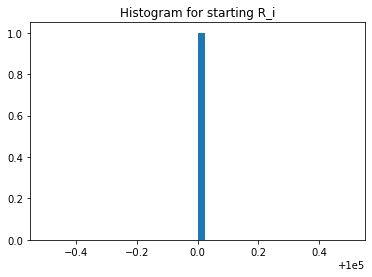

In [22]:
import matplotlib.pyplot as plt
a = starting_Ri.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_i")
plt.show()

In [23]:
experiments.UNI_Qi.unique()

array([200000., 264945., 263889., ..., 198949., 182917., 194018.])

In [24]:
experiments.UNI_Si.unique()

array([10000., 14678., 14882., 14879., 14872., 15020., 14679., 14870.,
       15018., 14809., 14822., 14745., 15085., 14949., 15104., 14742.,
       14876., 15027., 14680., 14881., 14795., 14948., 14671., 15086.,
       14808., 14878., 14951., 15011., 14815., 15029., 14740., 15013.,
       14812., 14883., 14816., 14744., 14886., 14820., 15025., 15096.,
       15015., 14803., 15024., 15026., 14814., 14810., 14889., 15161.,
       14792., 14806., 14959., 14738., 14664., 15177., 14884., 14673.,
       14887., 14880., 14747., 14952., 14743., 15095., 14804., 15023.,
       14869., 14956., 15033., 15098., 14890., 14950., 14746., 14735.,
       14692., 14957., 14800., 14750., 14807., 14811., 14944., 14823.,
       15160., 15012., 15107., 14667., 14819., 15008., 14947., 14672.,
       14943., 14875., 15247., 14942., 14863., 14960., 15019., 15016.,
       14955., 14813., 15093., 14669., 14873., 14877., 14674., 14614.,
       15101., 14885., 15092., 14682., 14963., 14958., 15010., 14732.,
      

In [25]:
experiments.UNI_Qj.unique()

array([200000.])

In [26]:
experiments.UNI_Rj.unique()

array([100000.])

In [27]:
starting_Rj = experiments[experiments.timestep == 0]
starting_Rj = starting_Rj['UNI_Rj']
starting_Rj.reset_index(drop=True)
starting_Rj.unique()

array([100000.])

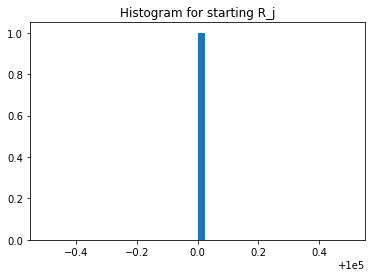

In [28]:
a = starting_Rj.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_j")
plt.show()

In [29]:
experiments.UNI_Sj.unique()

array([10000], dtype=int64)

In [30]:
experiments.UNI_ij.unique()

array([100000.])

In [31]:
experiments.UNI_ji.unique()

array([100000.])

In [32]:
experiments.UNI_Sij.unique()

array([1.e+10])

In [33]:
def get_M(k, v):
    if k == 'sim_config':
        k, v = 'M', v['M']
    return k, v

config_ids = [
    dict(
        get_M(k, v) for k, v in config.__dict__.items() if k in ['simulation_id', 'run_id', 'sim_config', 'subset_id']
    ) for config in configs
]

# Agent sequences

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


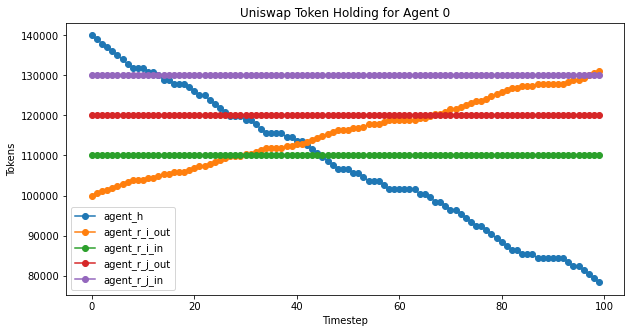

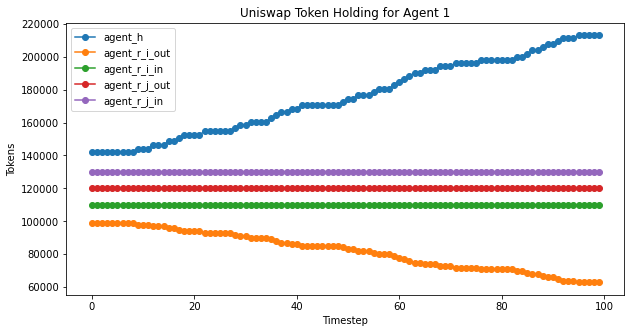

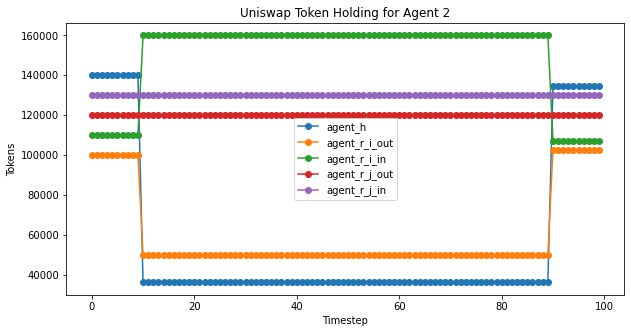

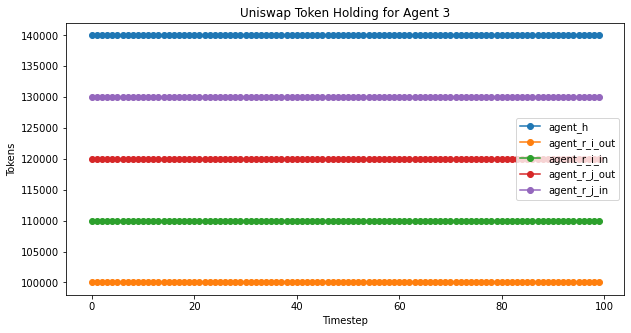

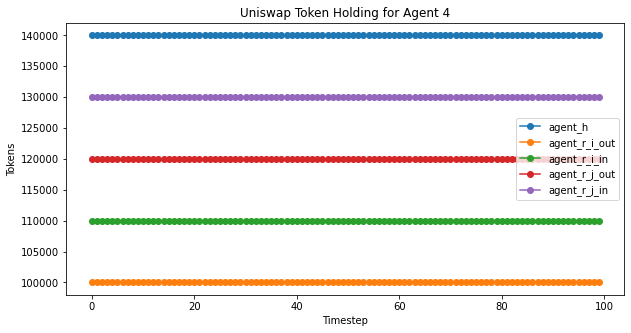

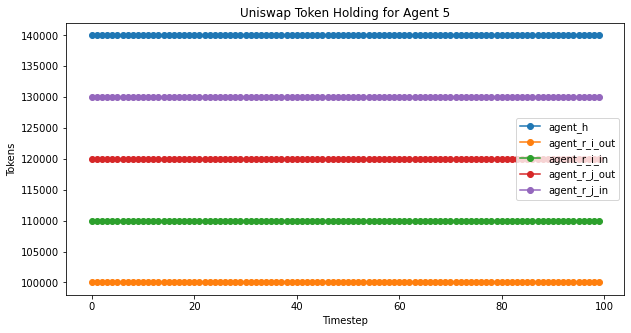

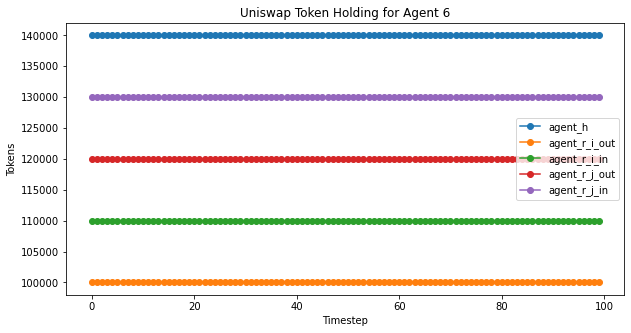

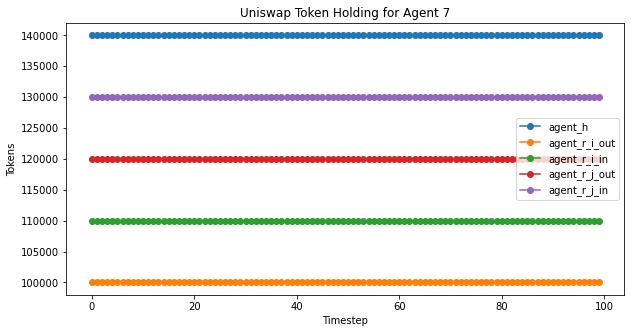

In [34]:
agent_plot(experiment2,'Uniswap Token Holding for Agent ', 100) #,4,'j')

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


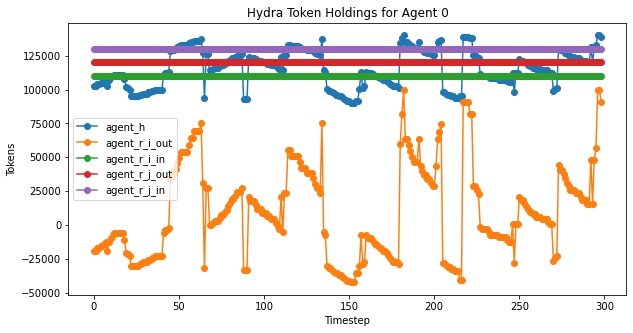

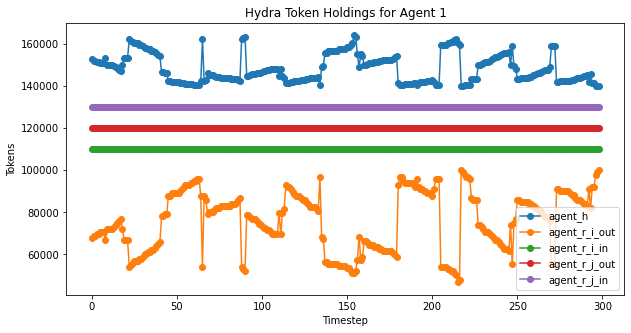

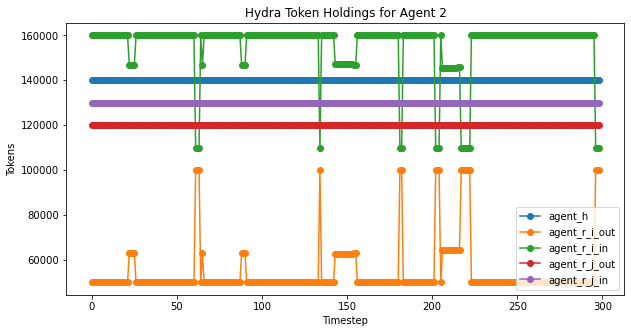

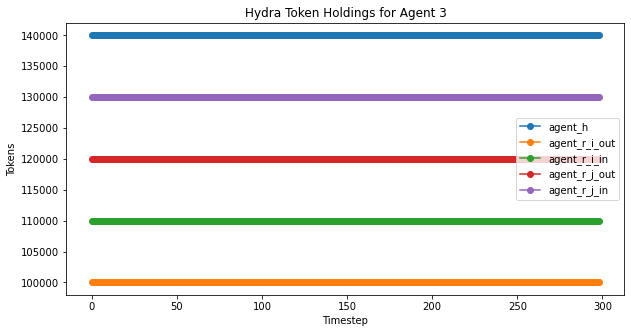

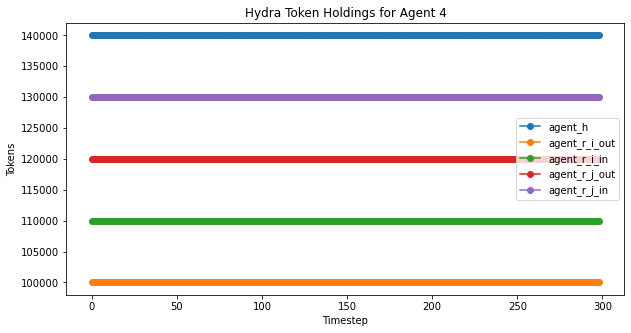

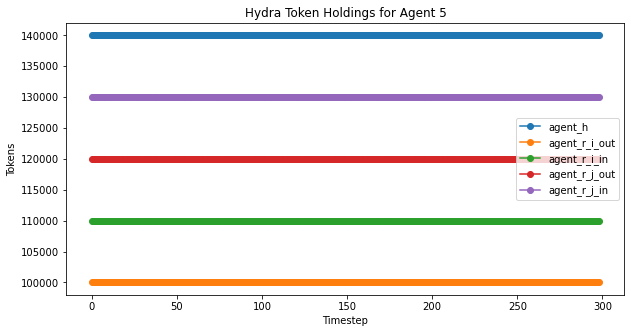

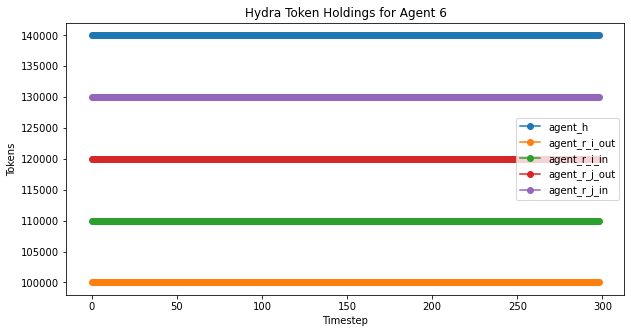

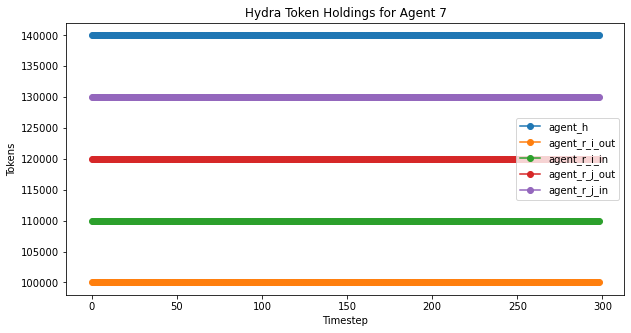

In [35]:
hydra_agent_plot(experiments,'Hydra Token Holdings for Agent ', 299)

# Liquidity dynamics

Movement of the Uniswap variables

- 'UNI_Ri', 'UNI_Qi', 'UNI_Si'
- 'UNI_Rj', 'UNI_Qj', 'UNI_Sj'
- 'UNI_ij', 'UNI_ji', 'UNI_Sij'

## Uniswap -- Ri-Q instance

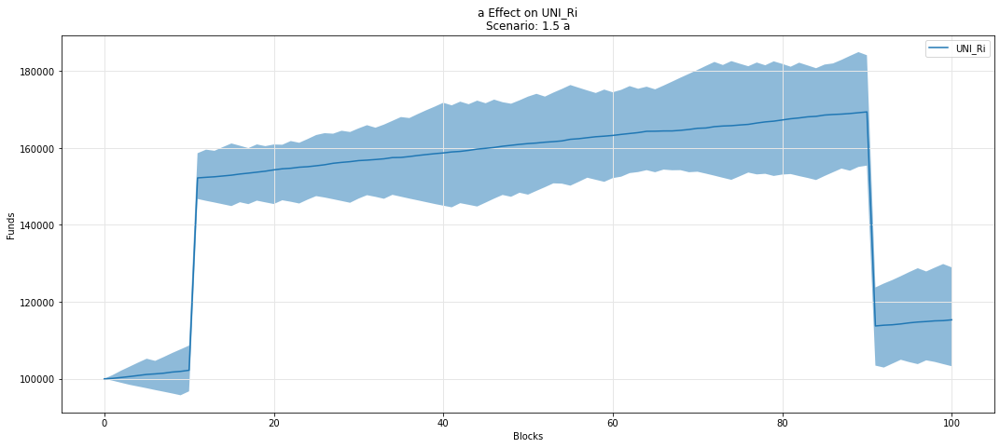

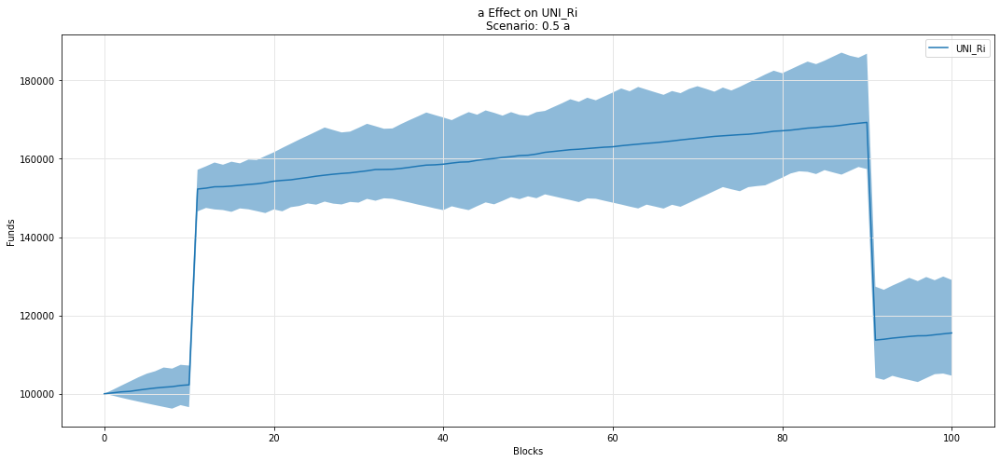

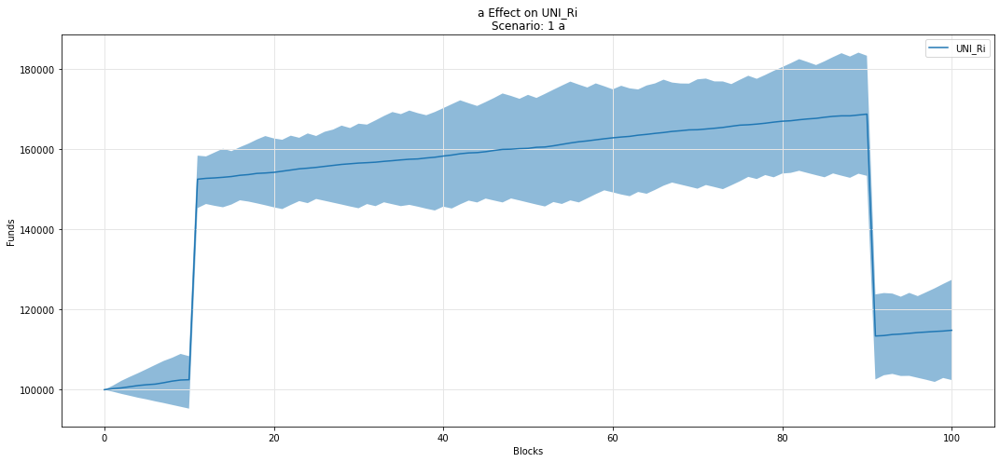

In [36]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Ri')

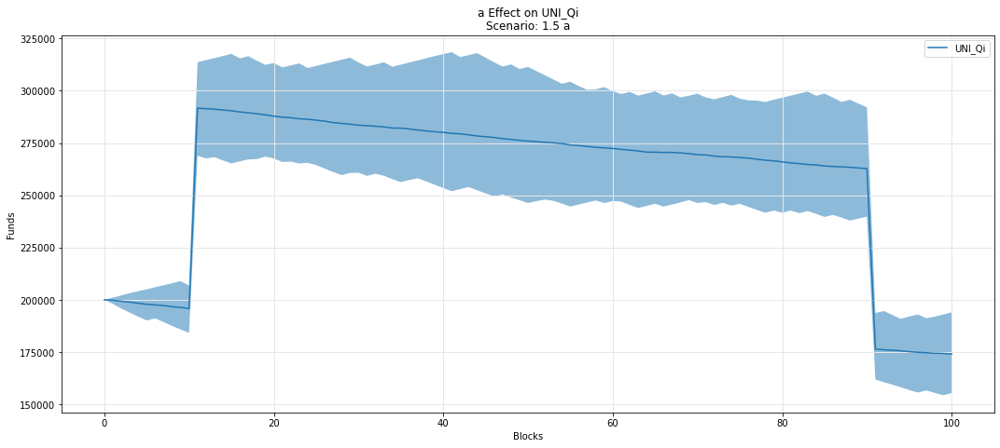

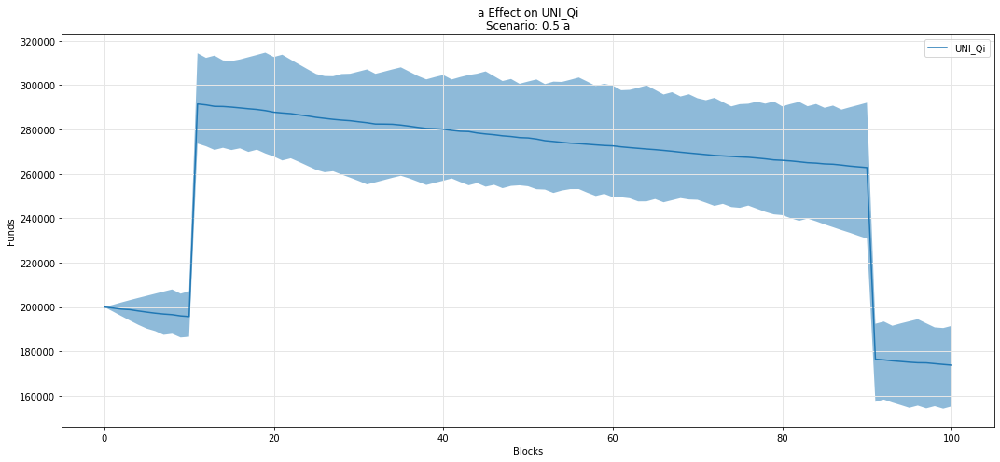

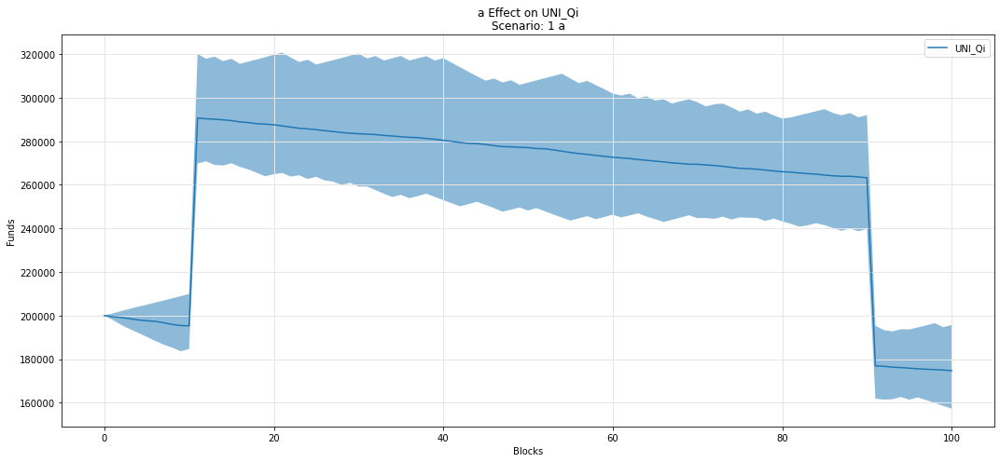

In [37]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qi')

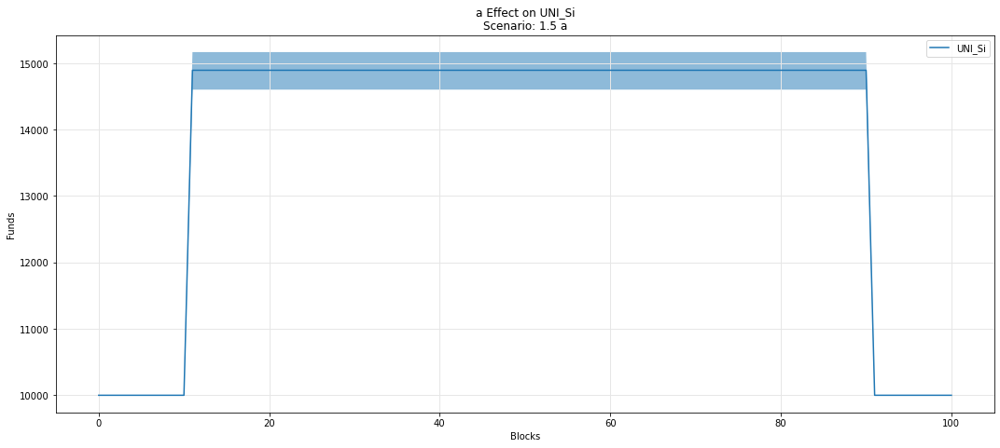

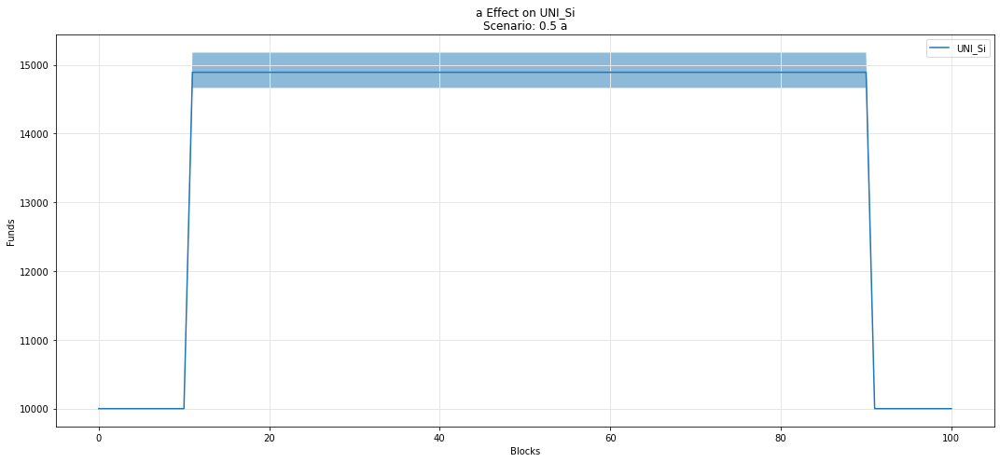

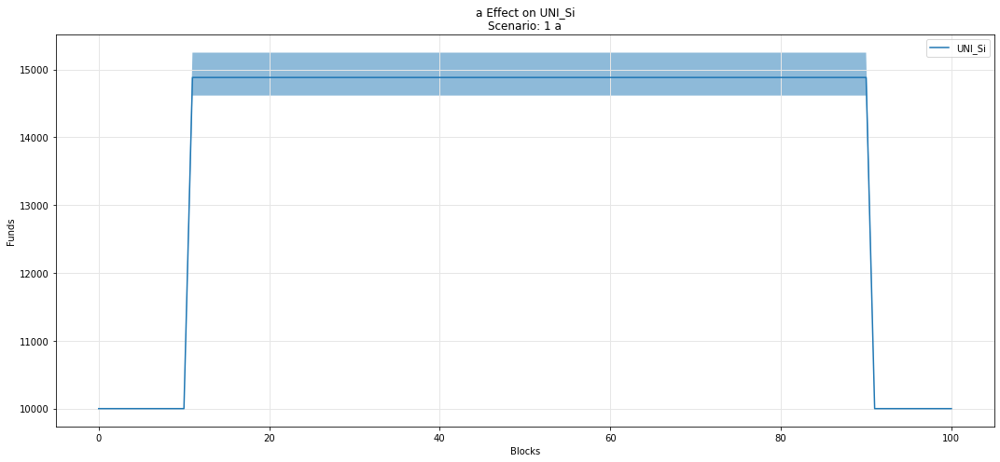

In [38]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Si')

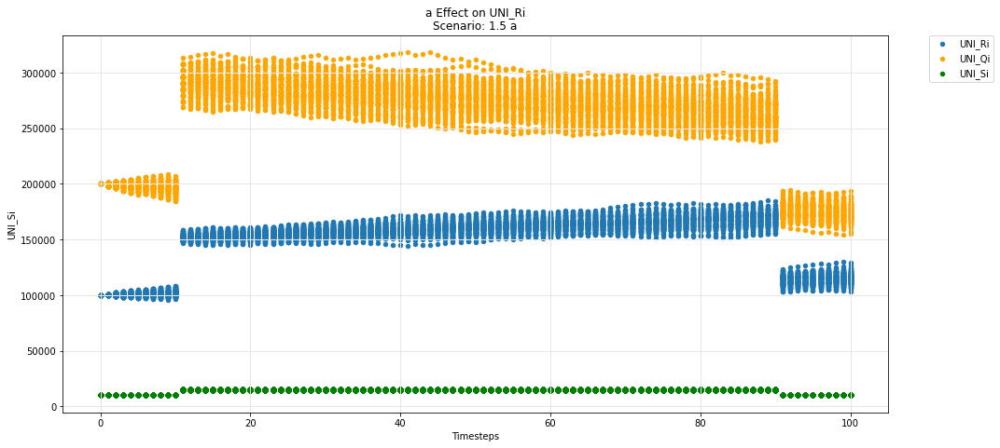

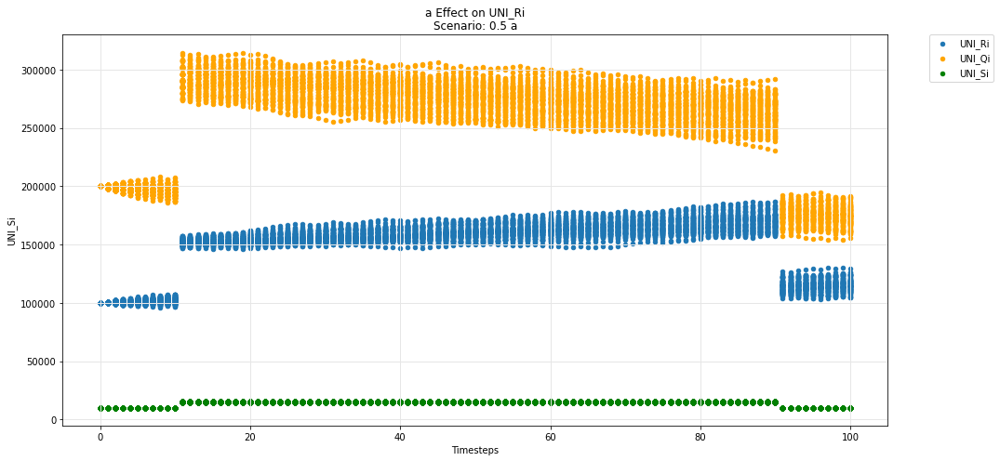

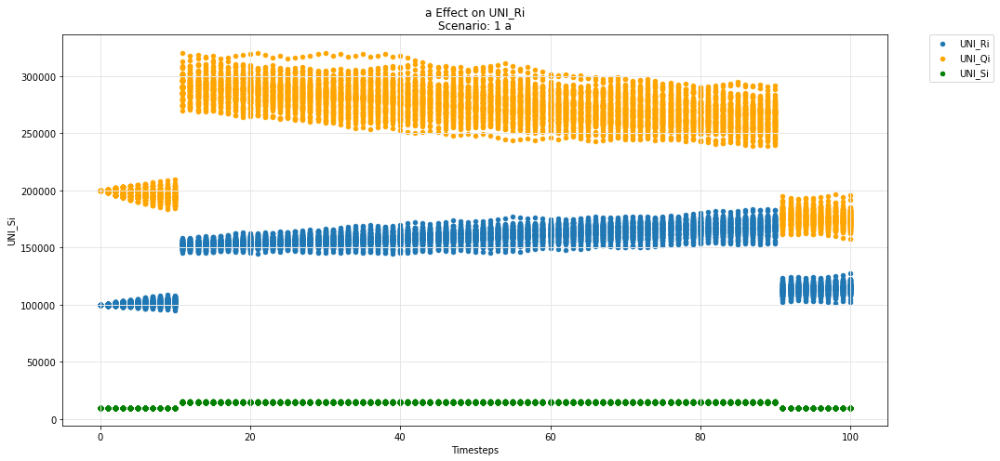

In [39]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Ri', 'UNI_Qi', 'UNI_Si')

## Uniswap -- Rj-Q instance

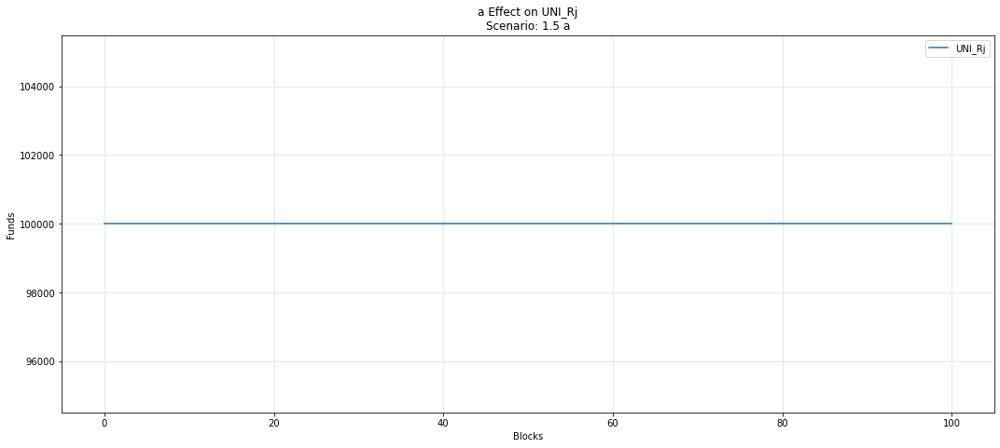

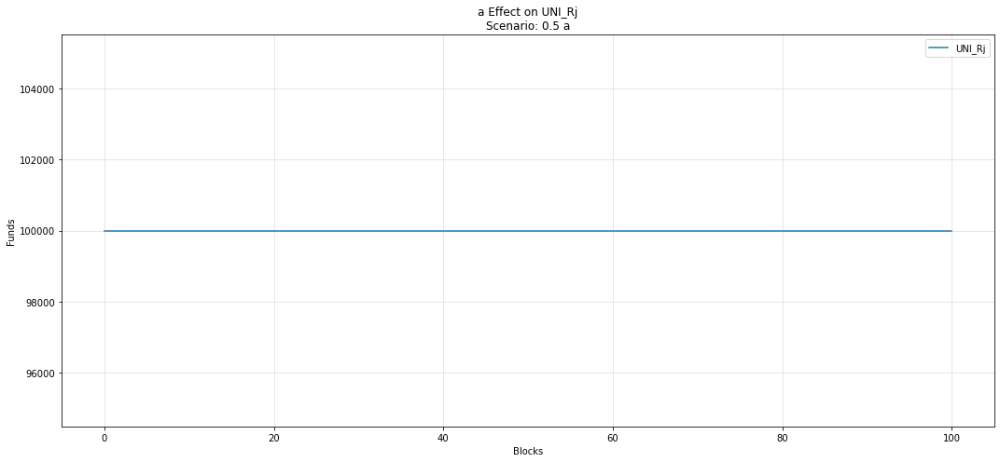

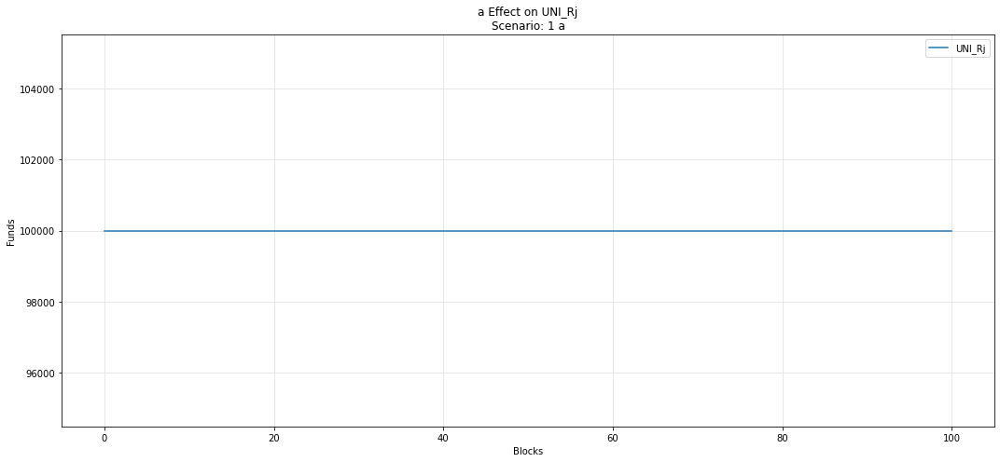

In [40]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Rj')

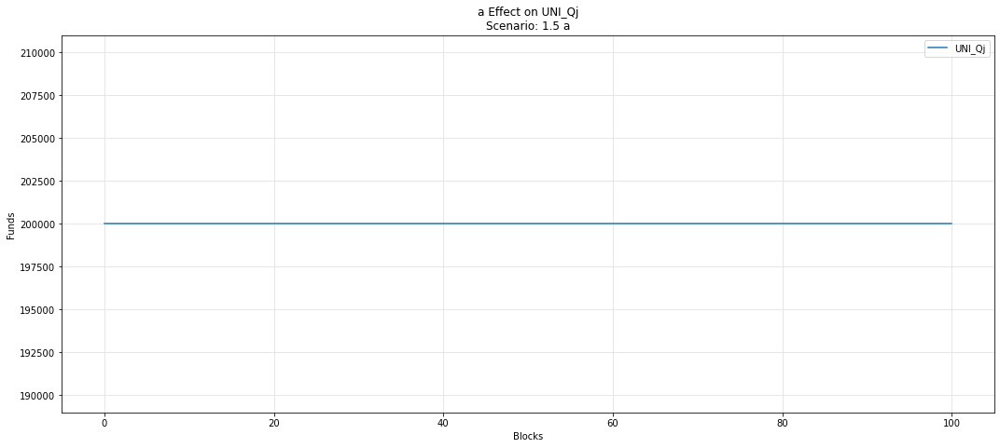

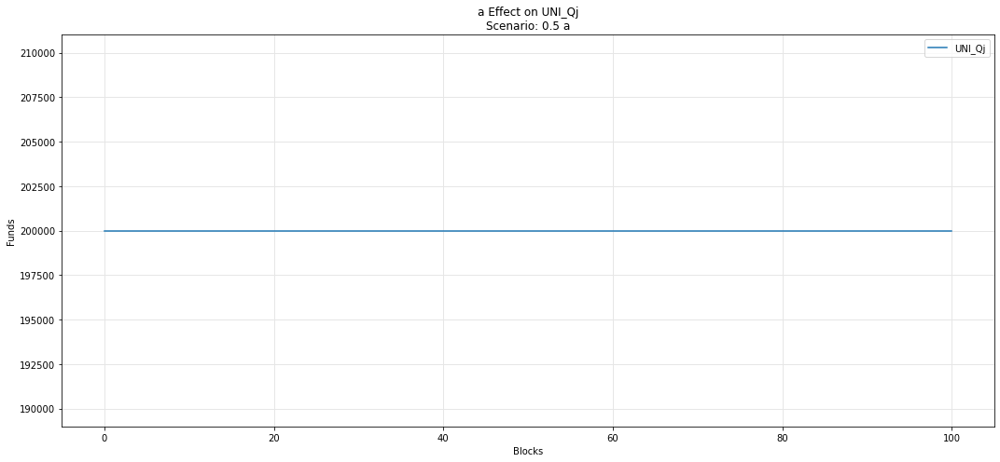

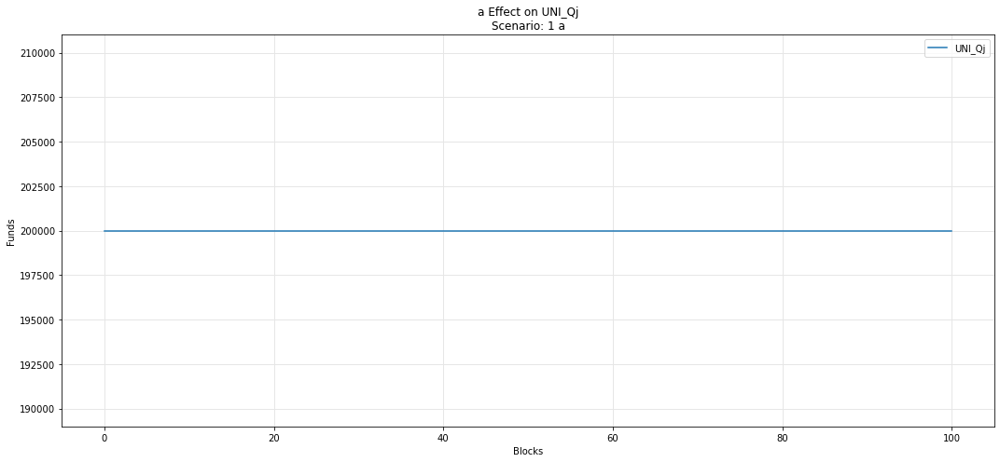

In [41]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qj')

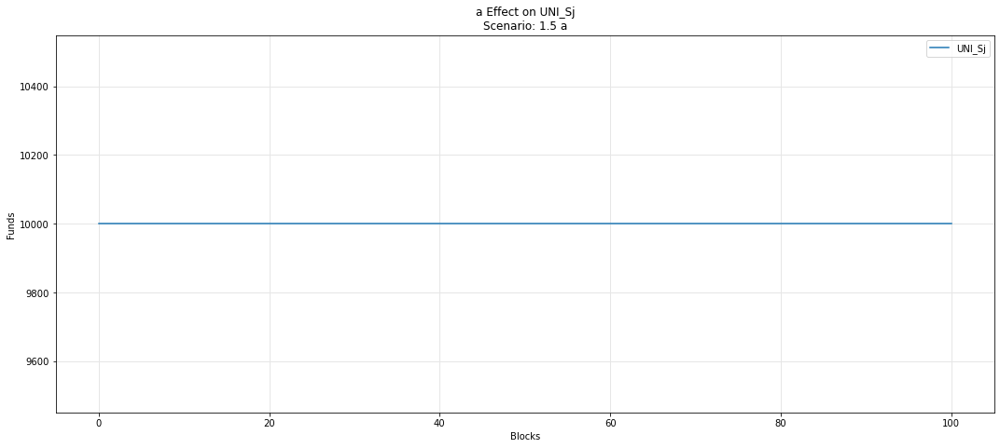

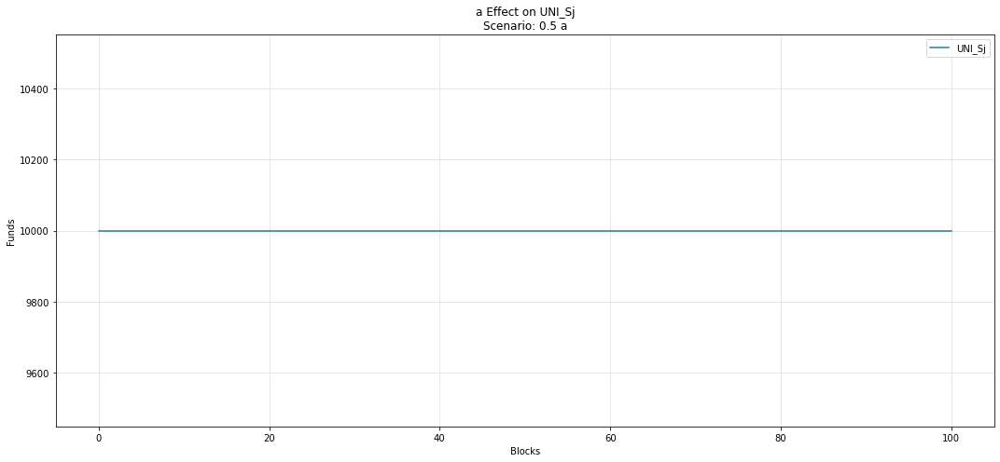

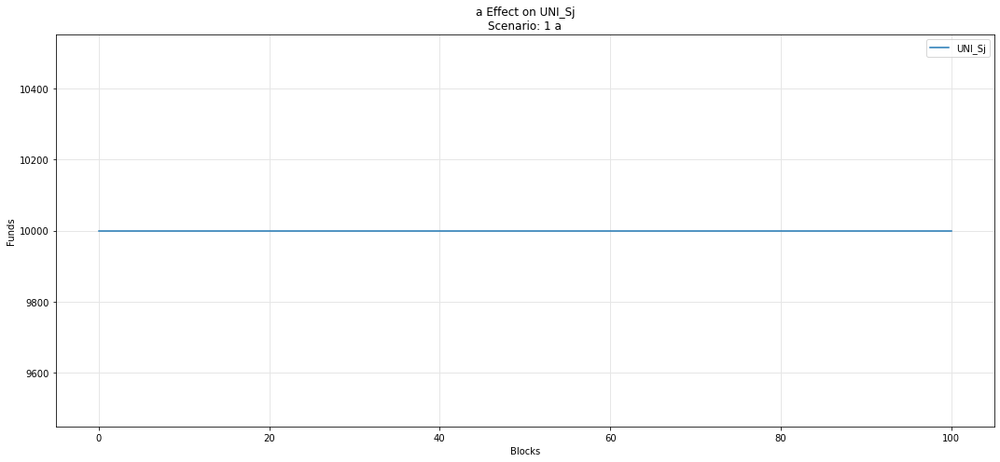

In [42]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sj')

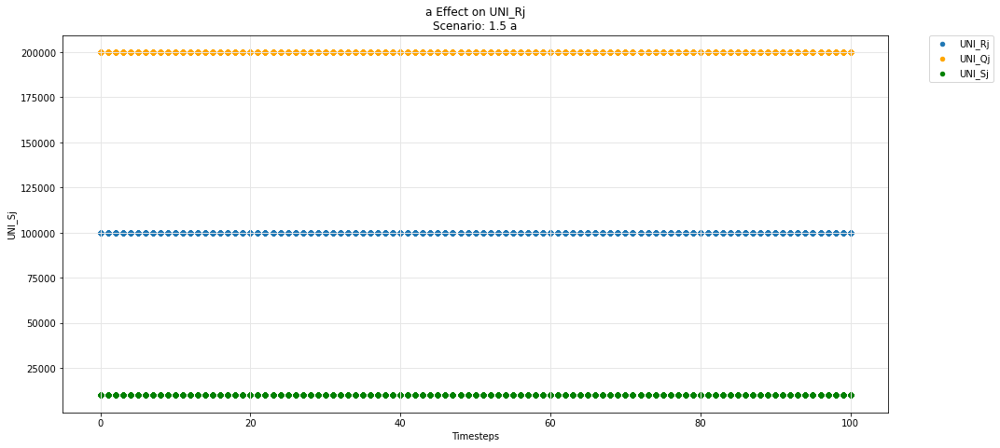

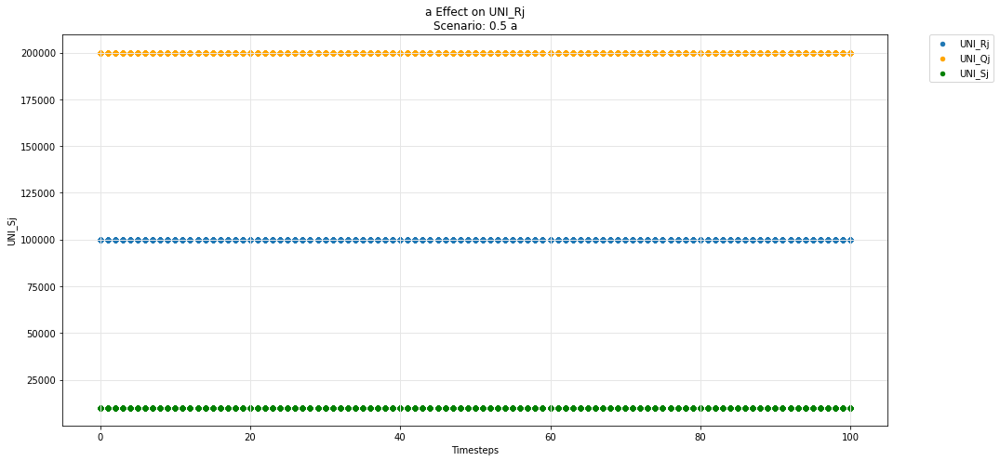

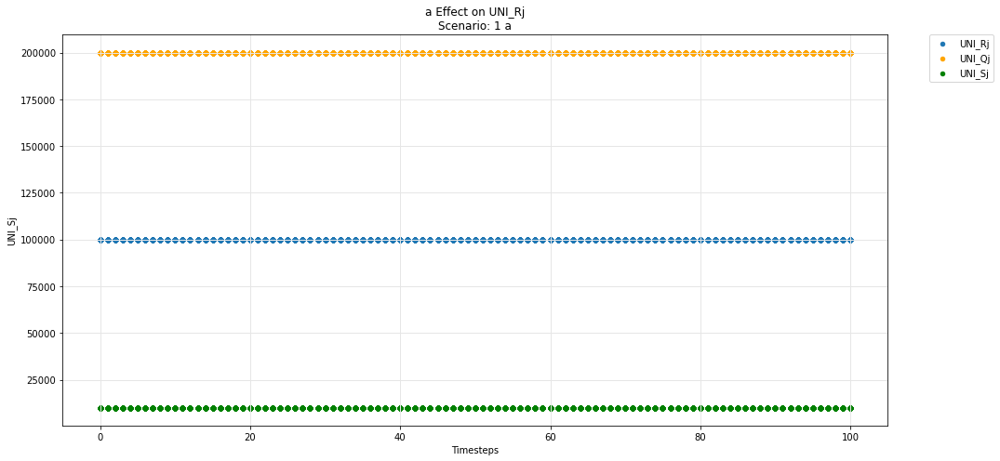

In [43]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Rj', 'UNI_Qj', 'UNI_Sj')

## Uniswap -- ij-Q instance

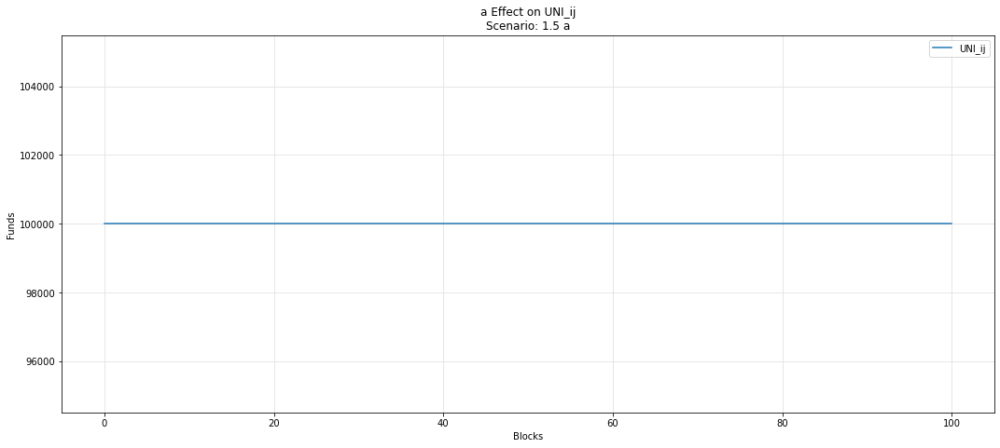

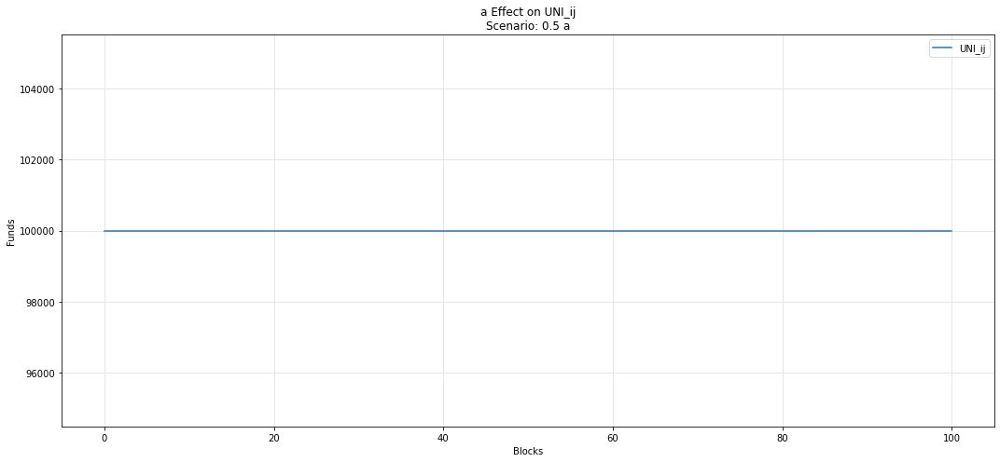

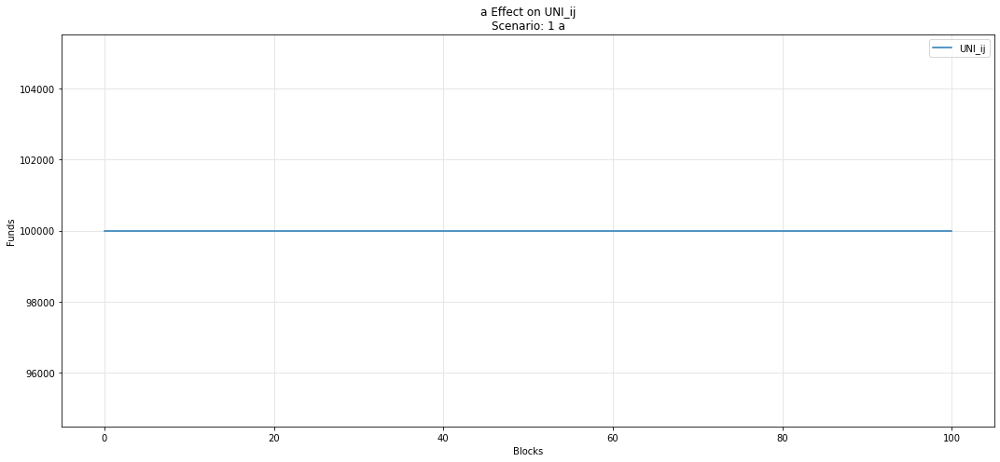

In [44]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ij')

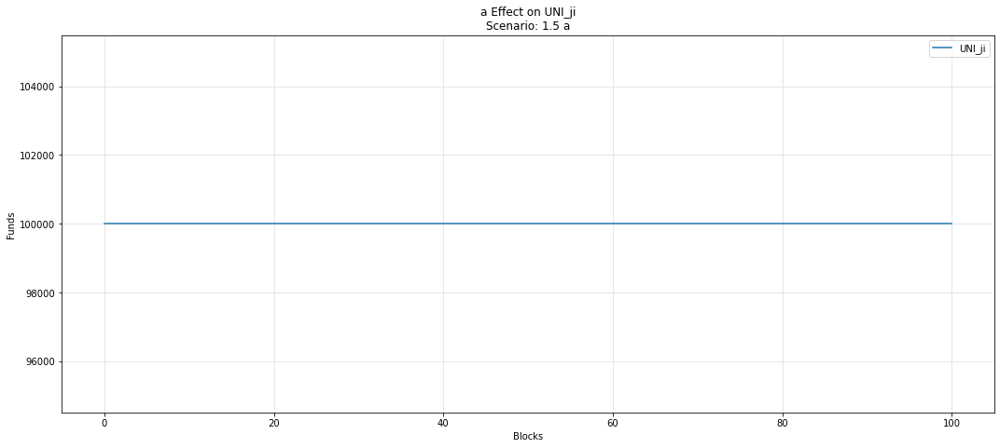

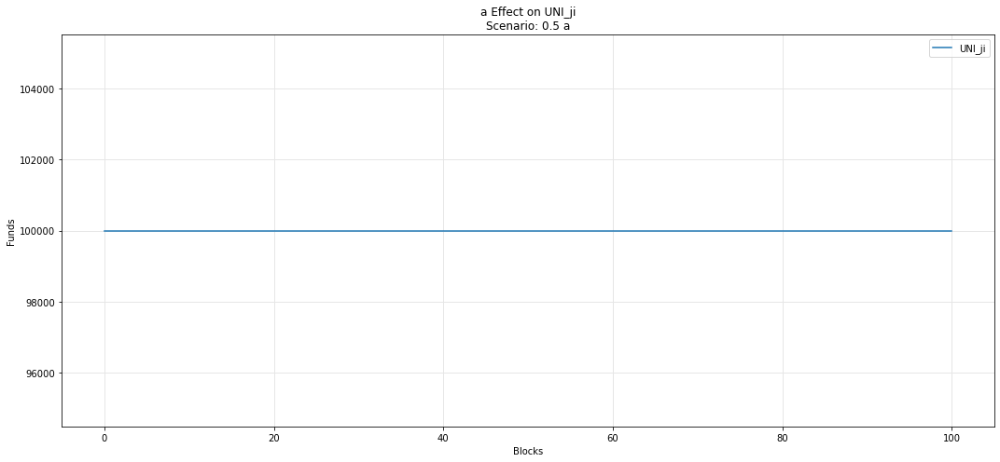

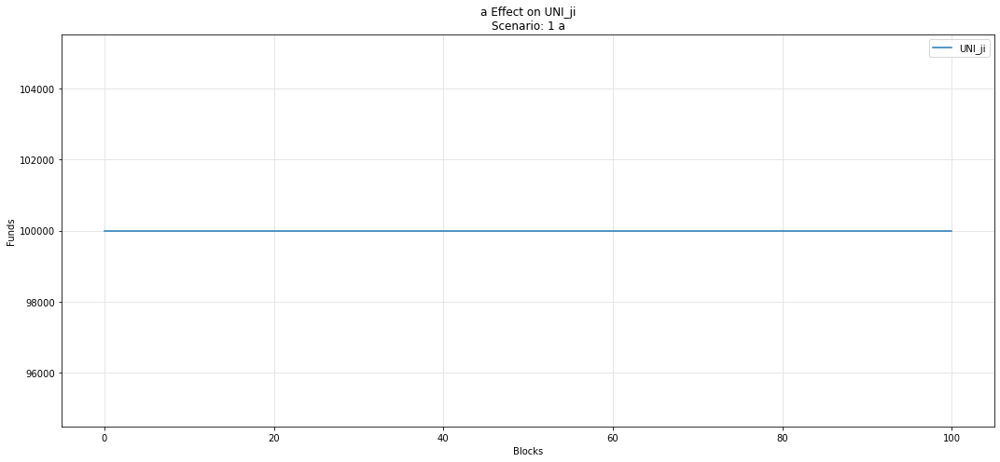

In [45]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ji')

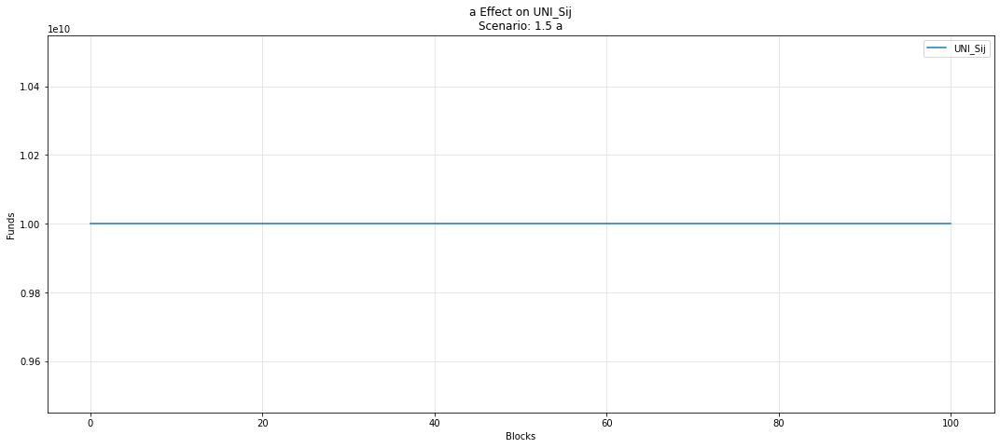

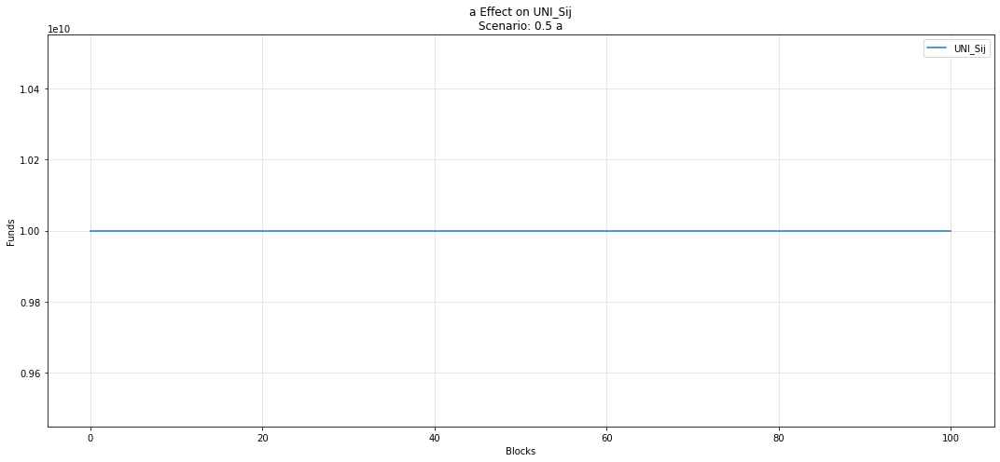

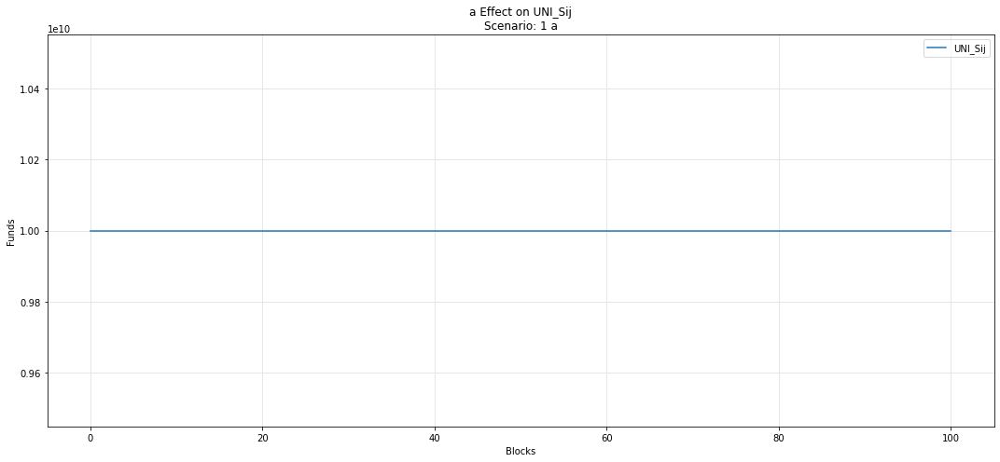

In [46]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sij')

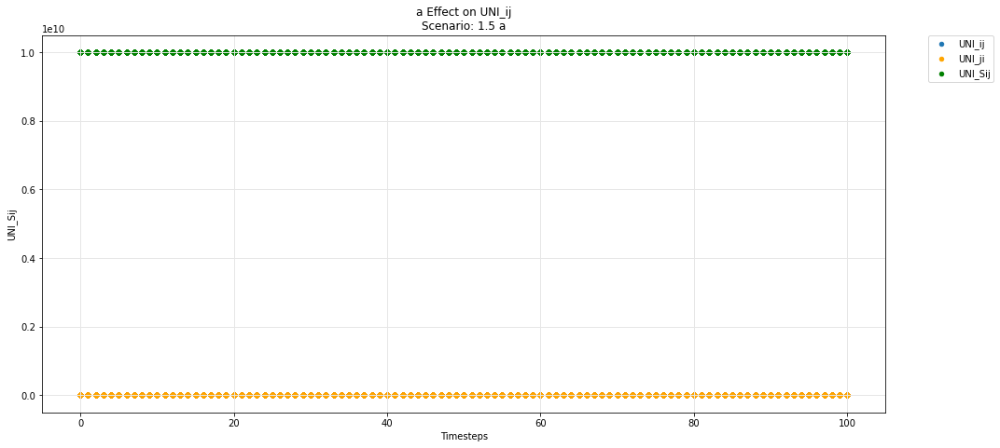

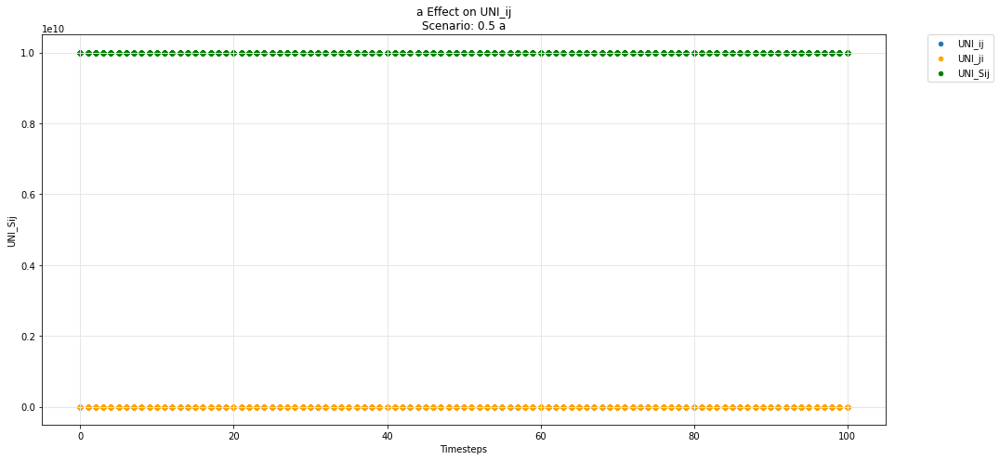

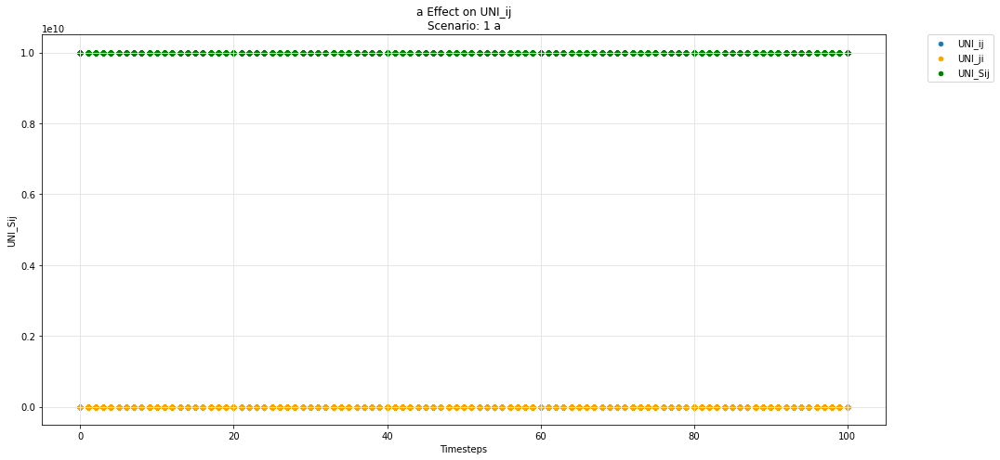

In [47]:
param_test_plot(experiments, config_ids, 'a', 'UNI_ij', 'UNI_ji', 'UNI_Sij')

## Hydra -- base

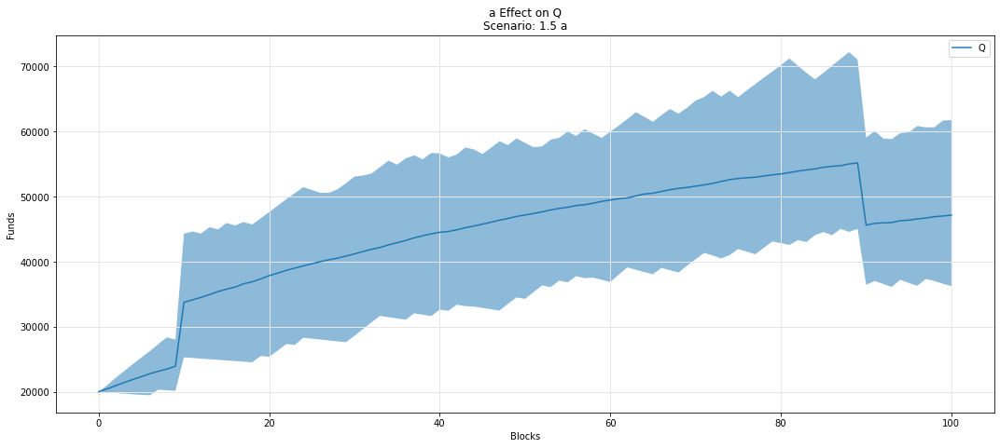

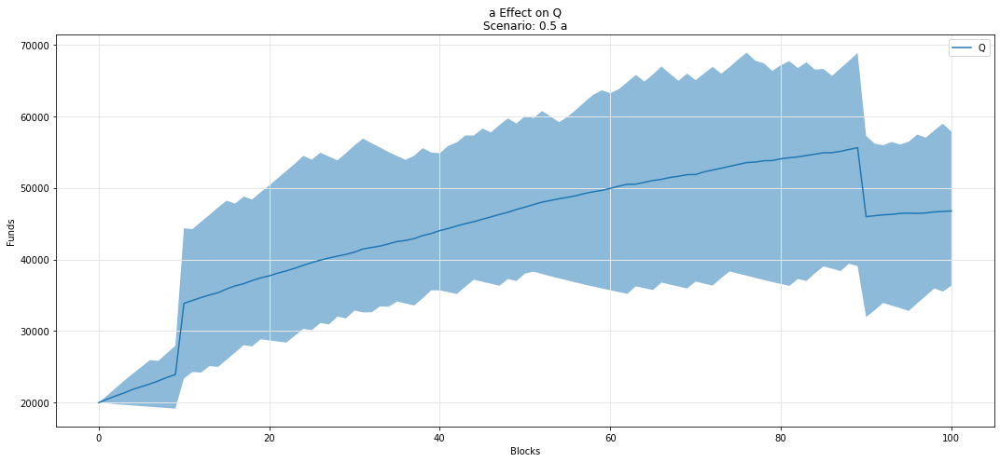

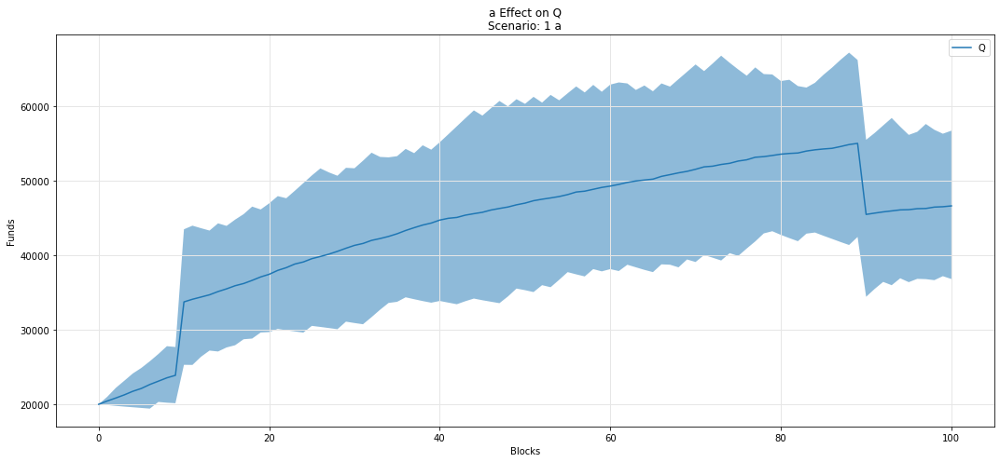

In [48]:
param_fan_plot3(experiments, config_ids, 'a','Q')

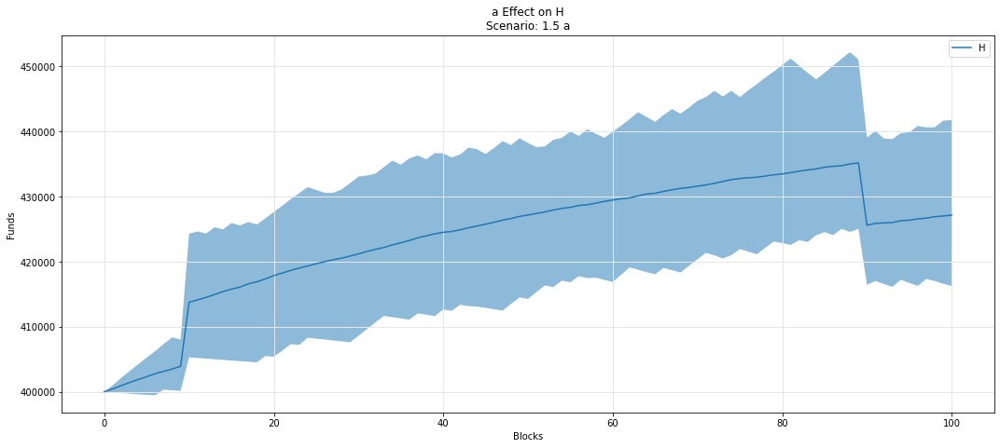

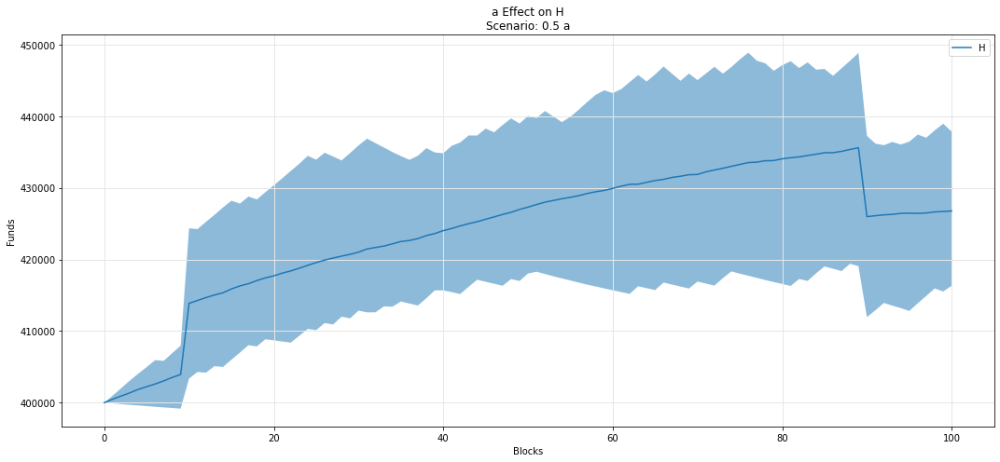

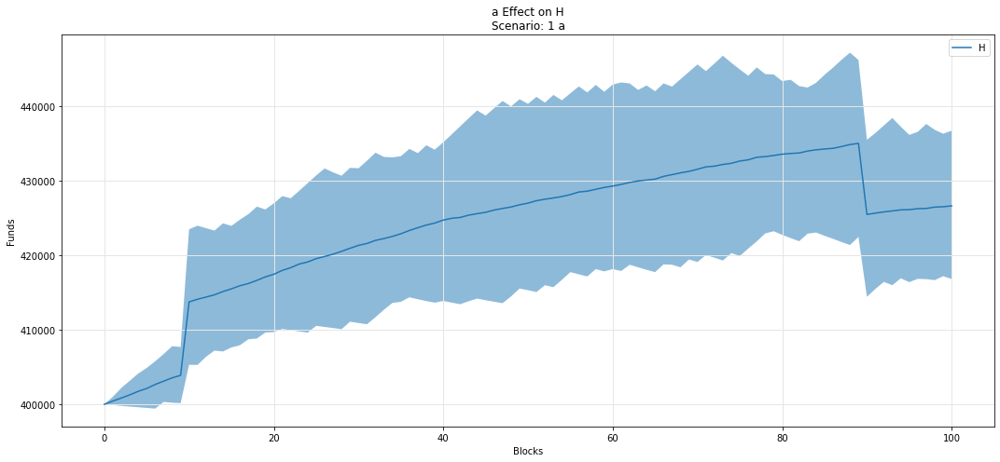

In [49]:
param_fan_plot3(experiments, config_ids, 'a','H')

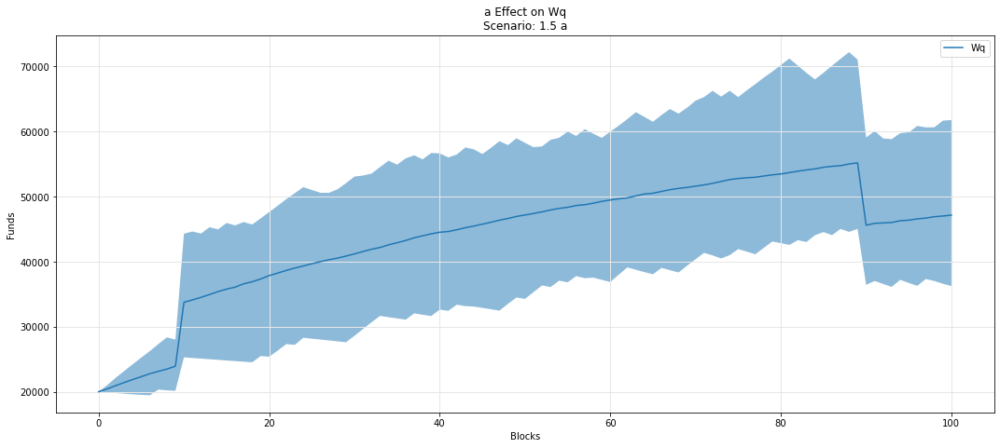

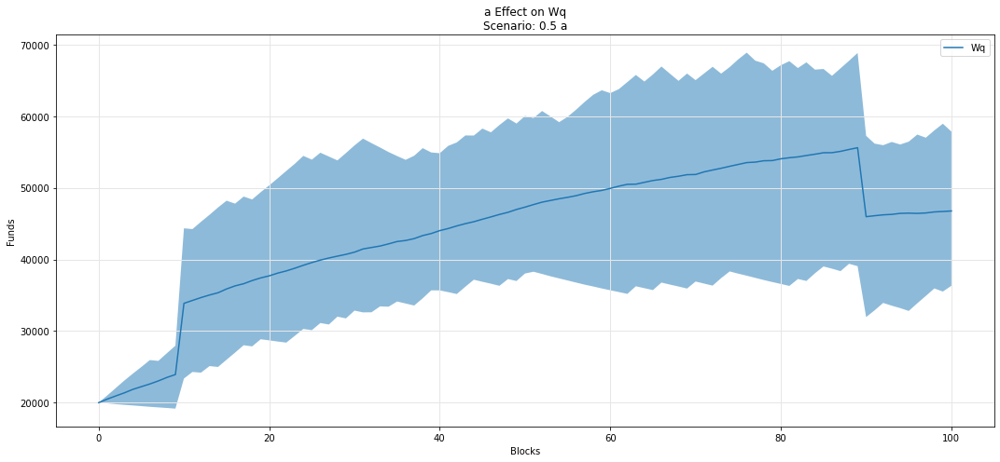

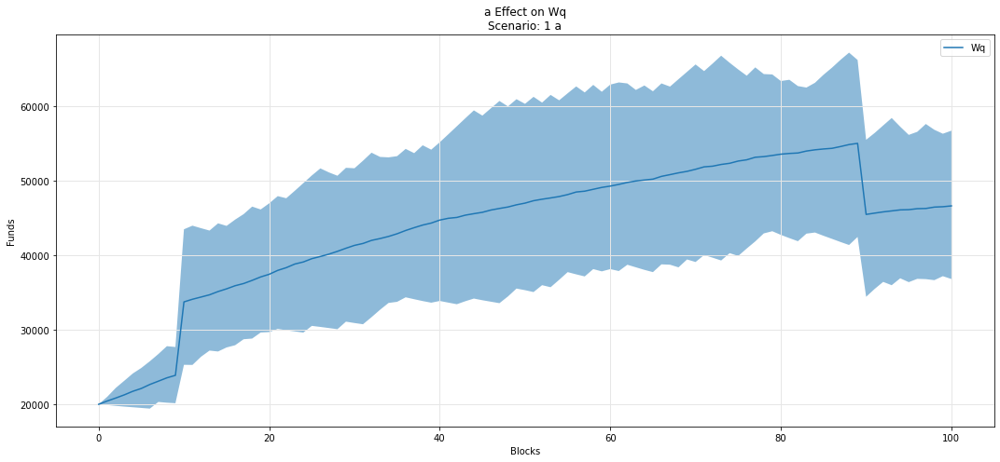

In [50]:
param_fan_plot3(experiments, config_ids, 'a','Wq')

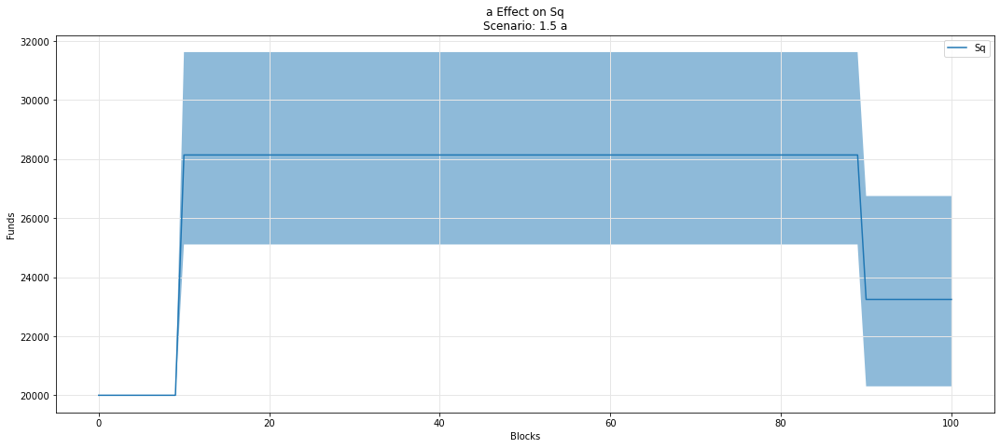

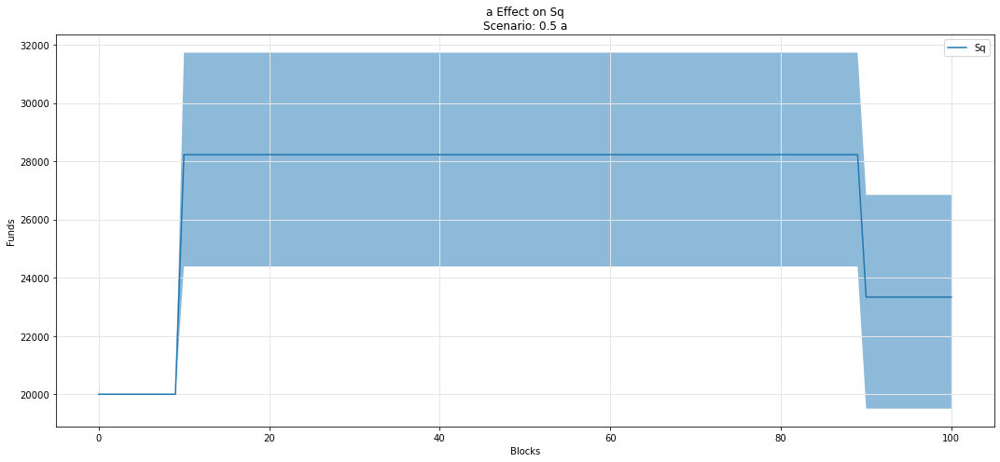

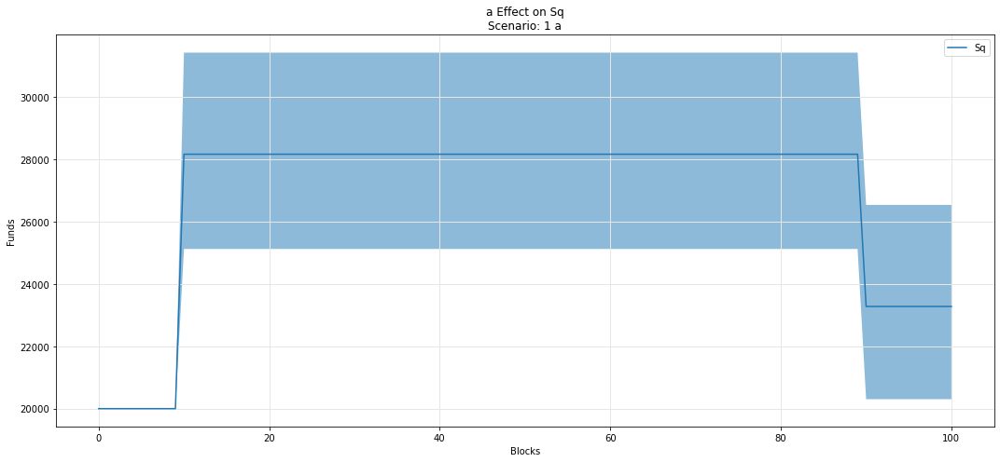

In [51]:
param_fan_plot3(experiments, config_ids, 'a','Sq')

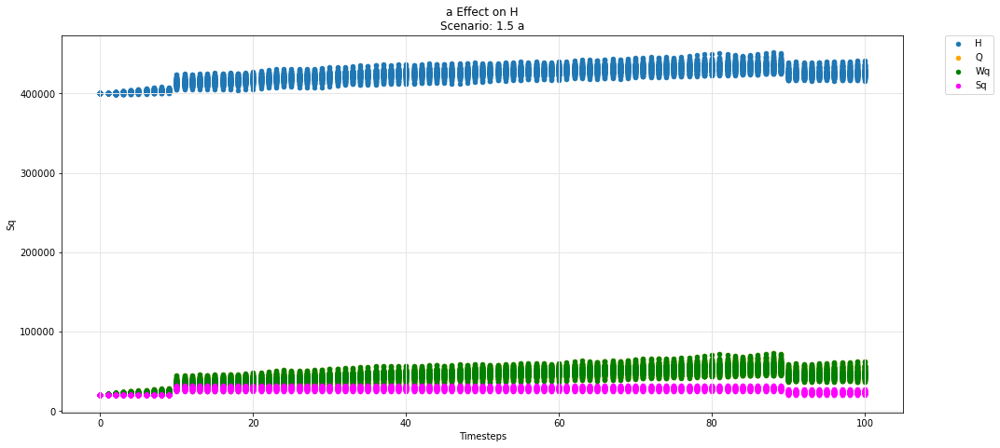

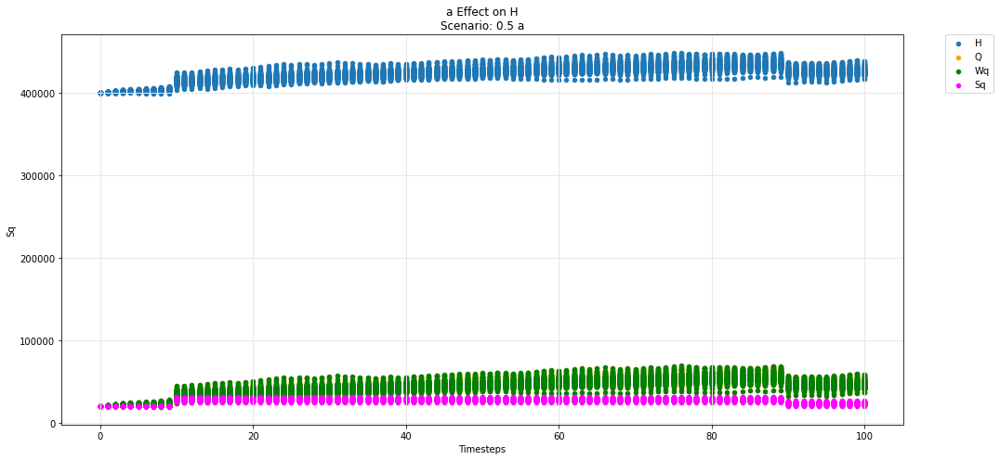

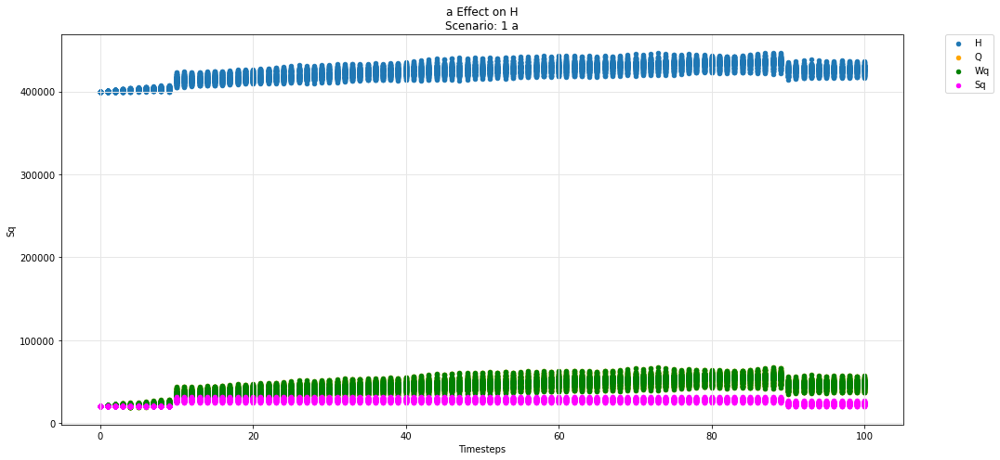

In [52]:
param_test_plot(experiments, config_ids, 'a', 'H', 'Q', 'Wq', 'Sq')

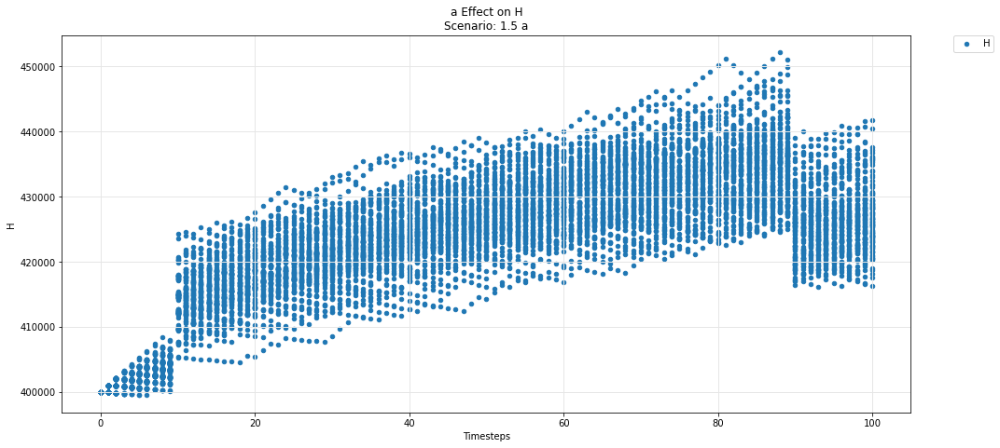

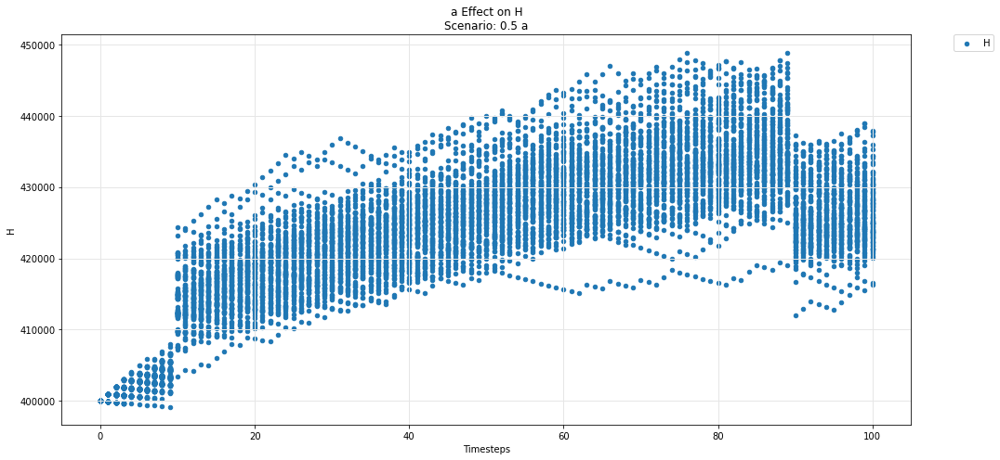

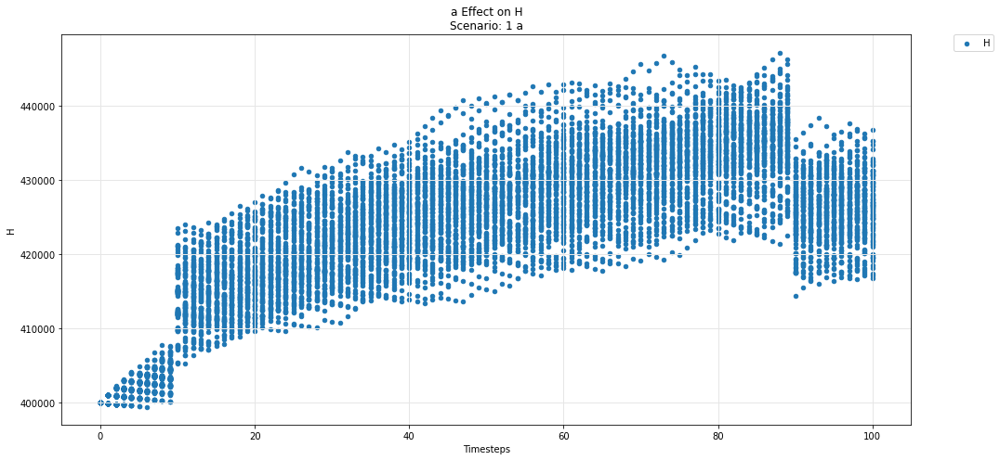

In [53]:
param_test_plot(experiments, config_ids, 'a', 'H')

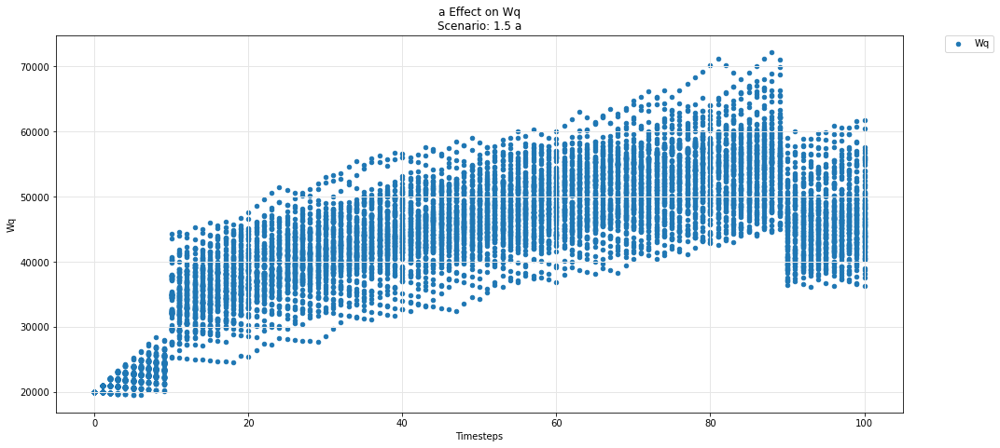

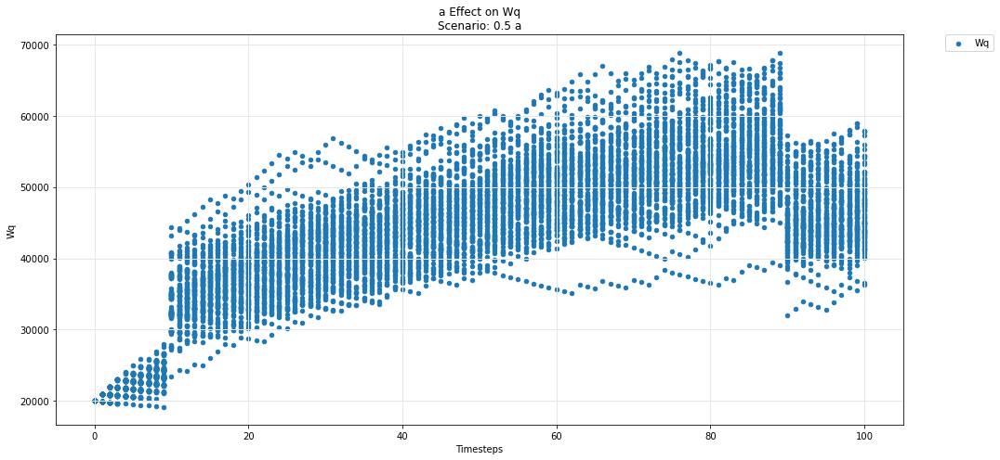

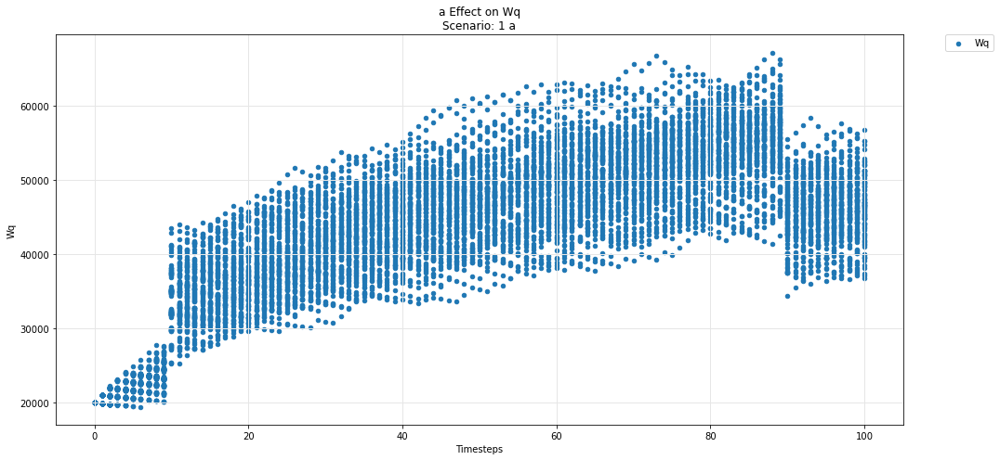

In [54]:
param_test_plot(experiments, config_ids, 'a', 'Wq')

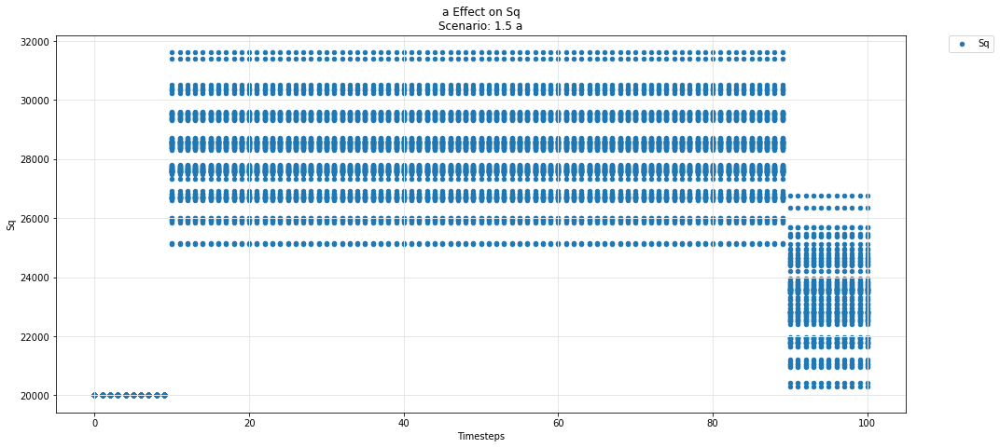

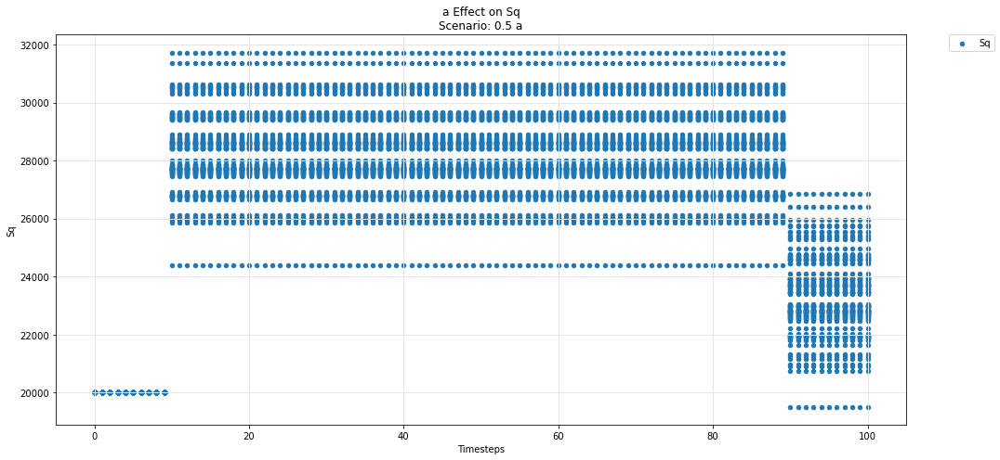

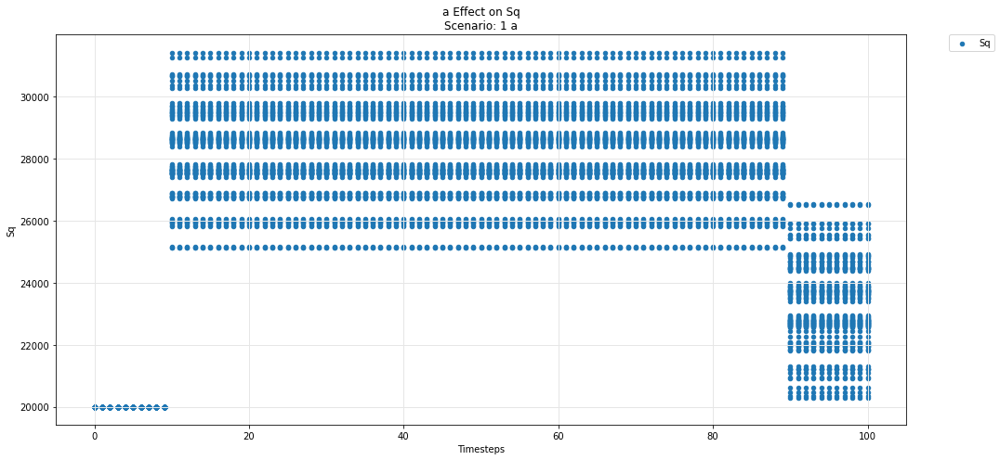

In [55]:
param_test_plot(experiments, config_ids, 'a', 'Sq')

## Hydra -- pool

Movement of the Omnipool variables
- Asset i
- Asset j
- Asset k

over the course of the simulation

In [56]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

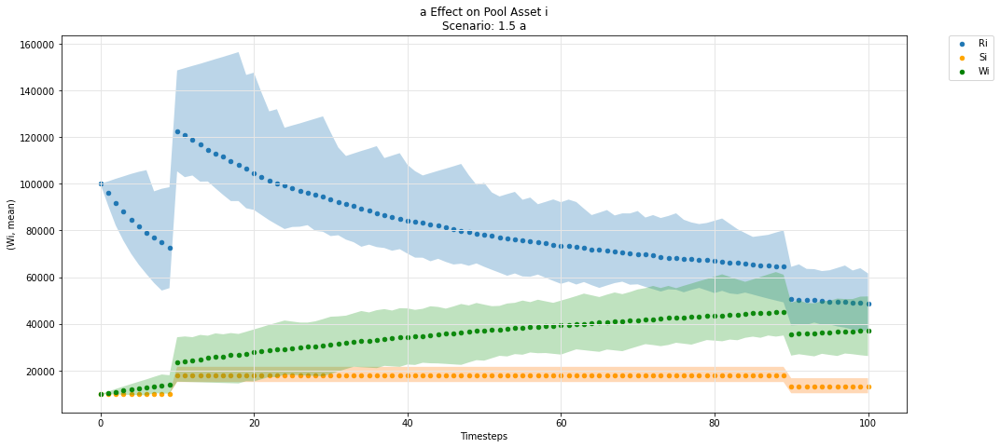

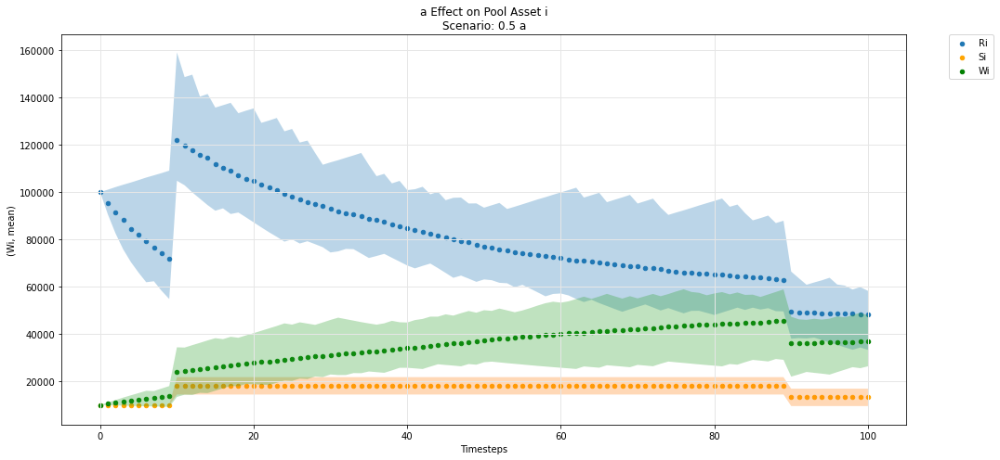

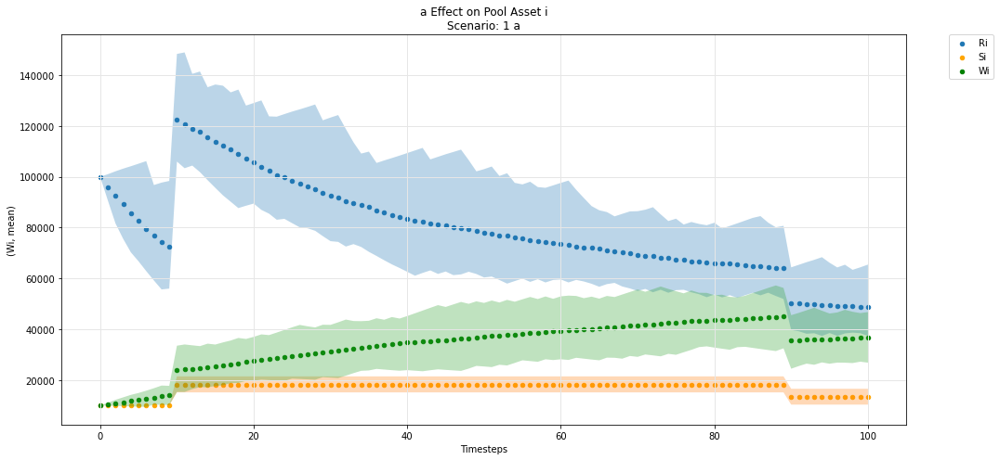

In [57]:
param_pool_simulation_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

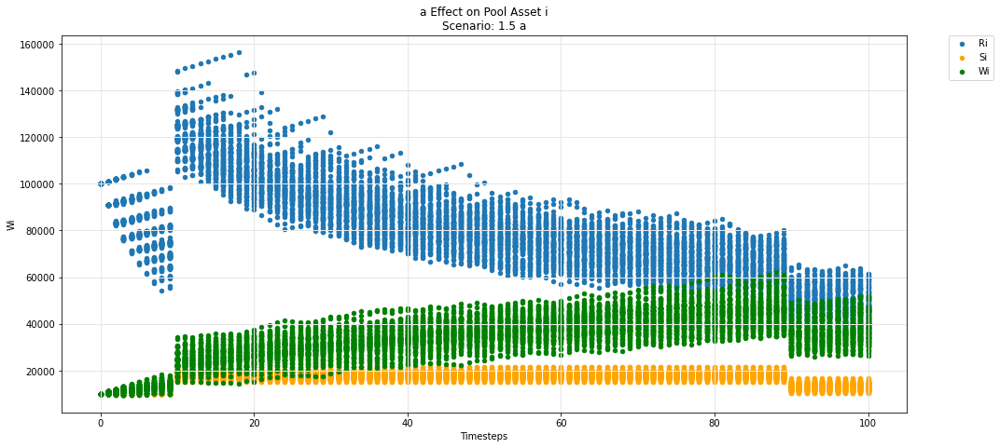

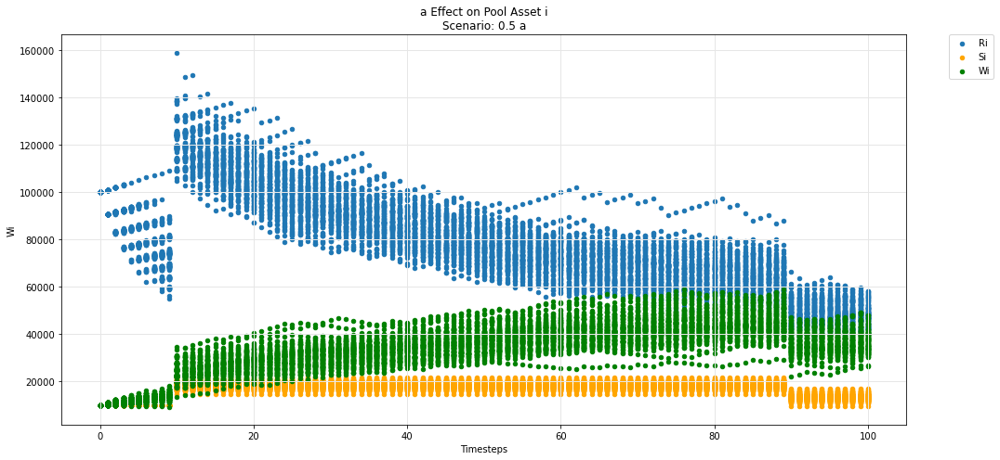

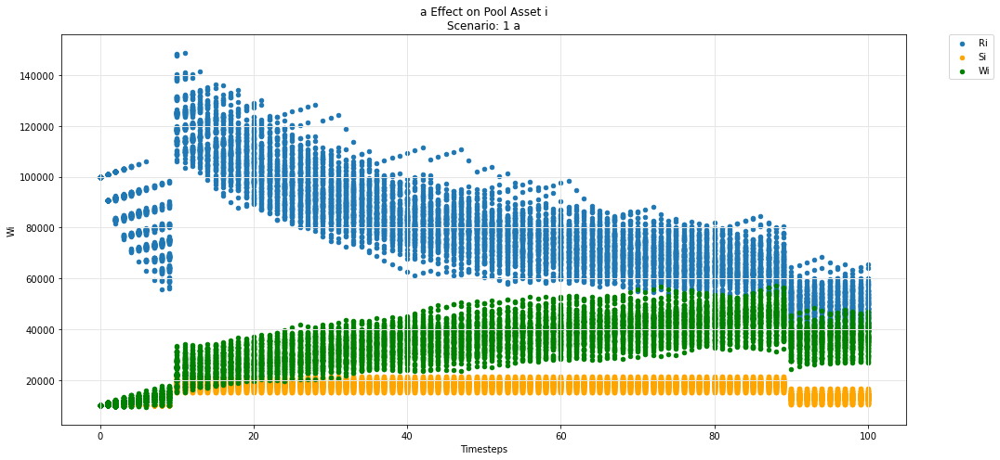

In [58]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

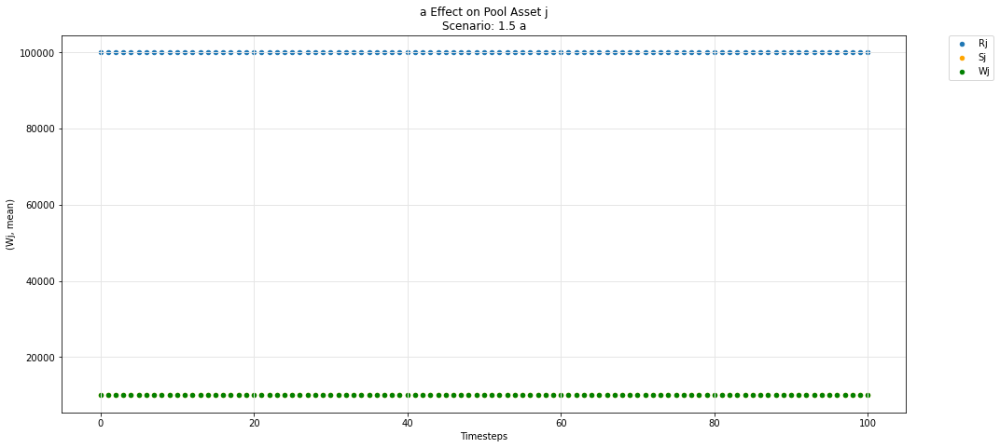

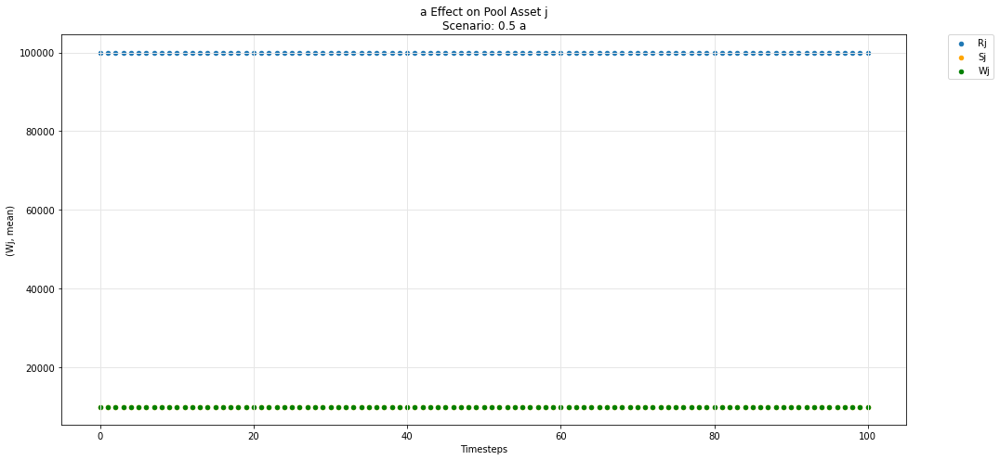

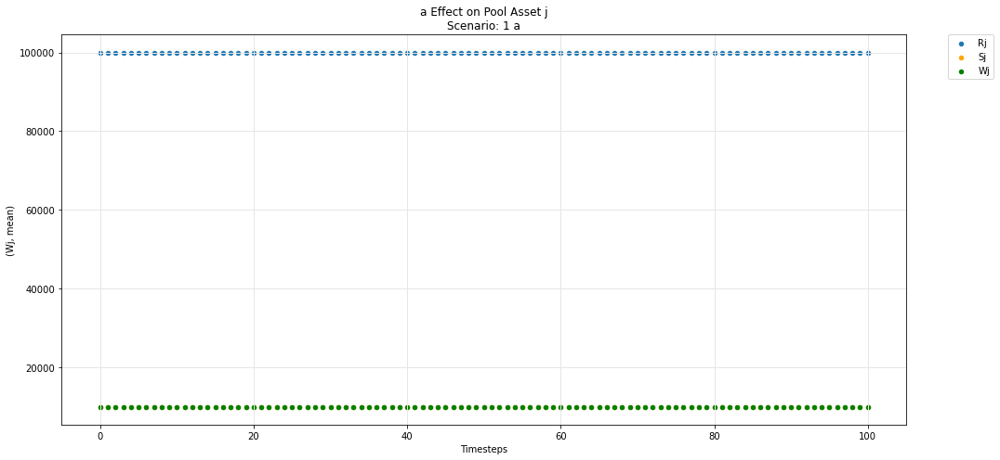

In [59]:
param_pool_simulation_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

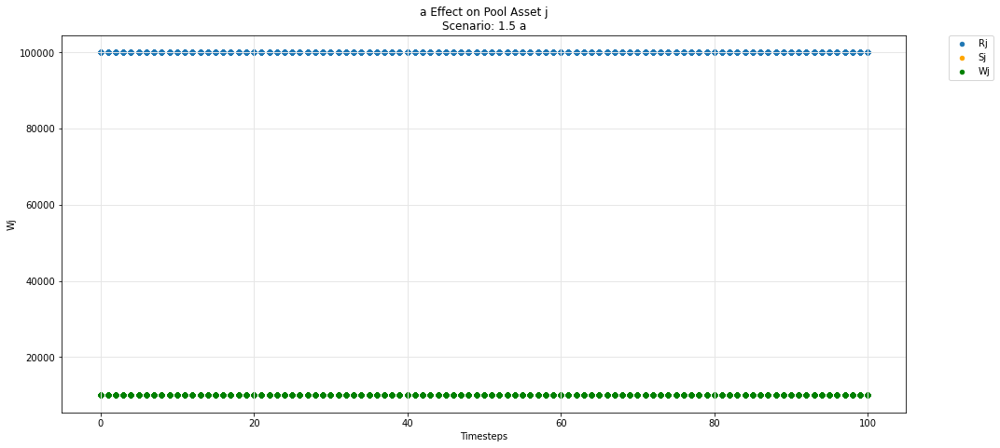

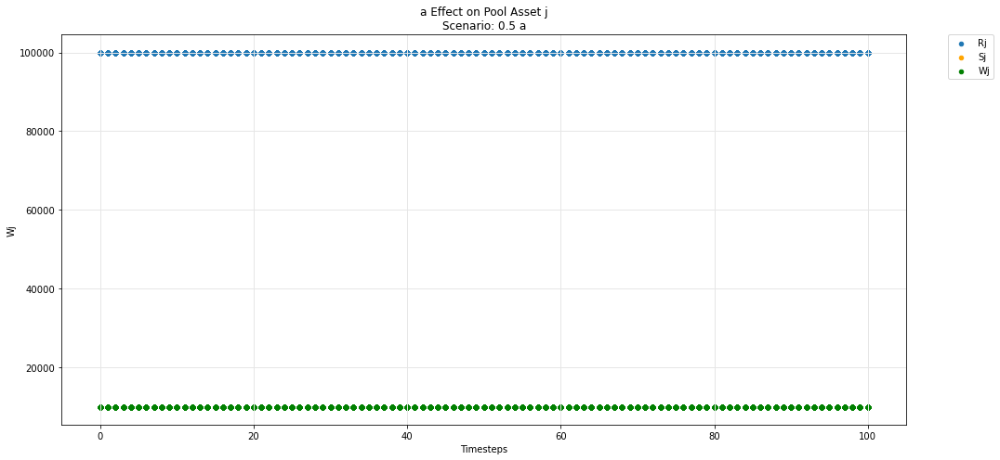

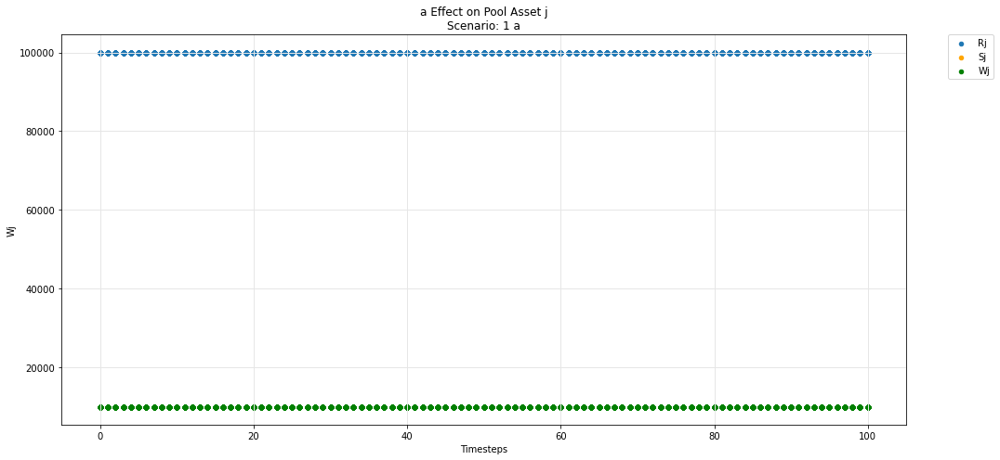

In [60]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

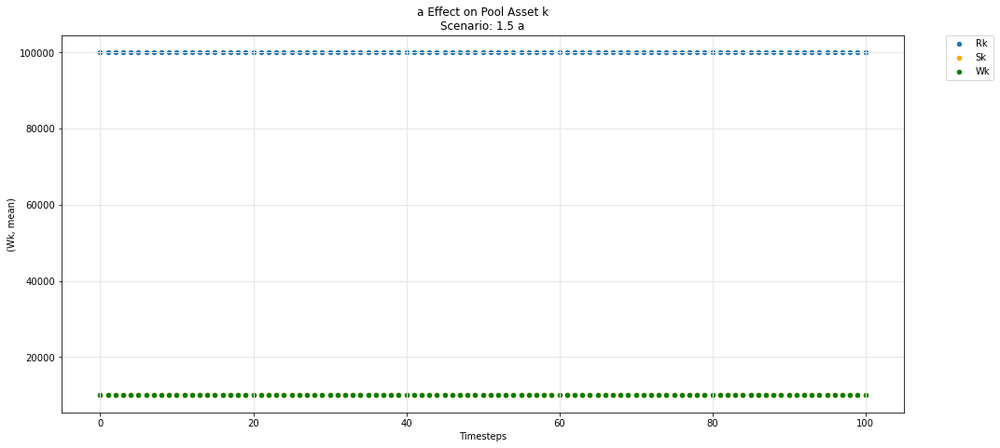

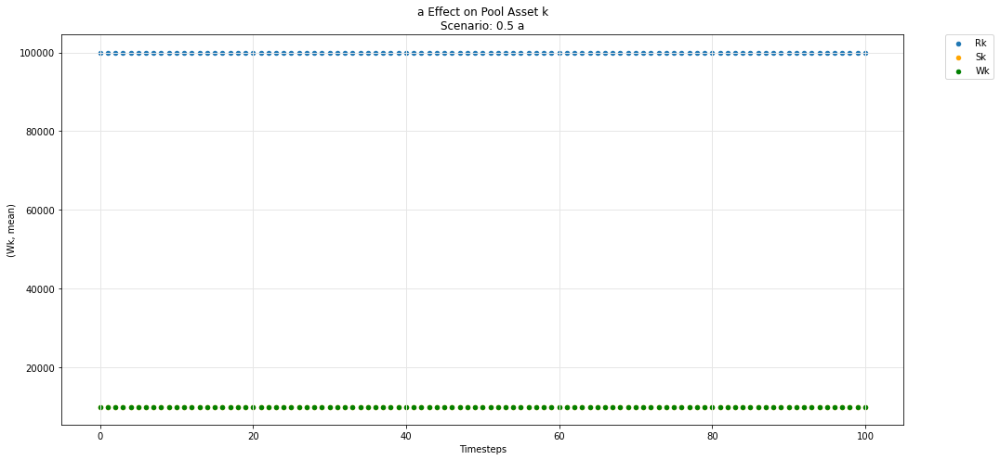

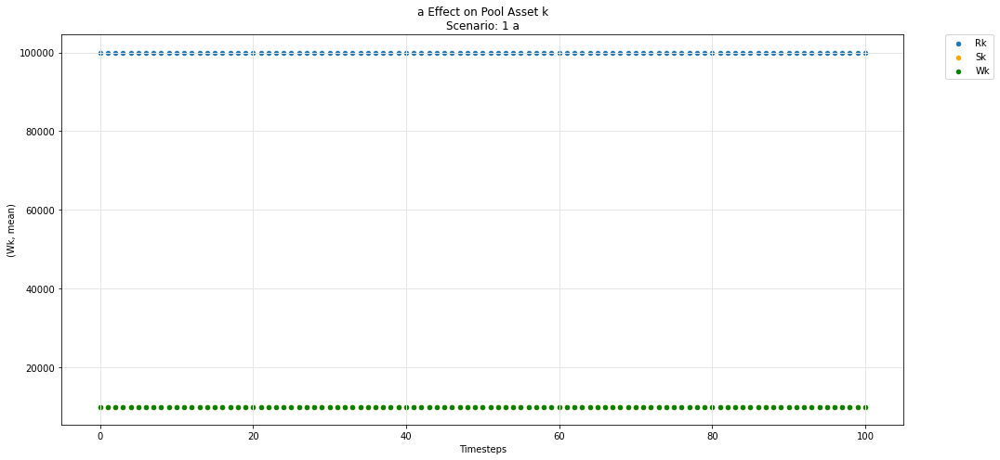

In [61]:
param_pool_simulation_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

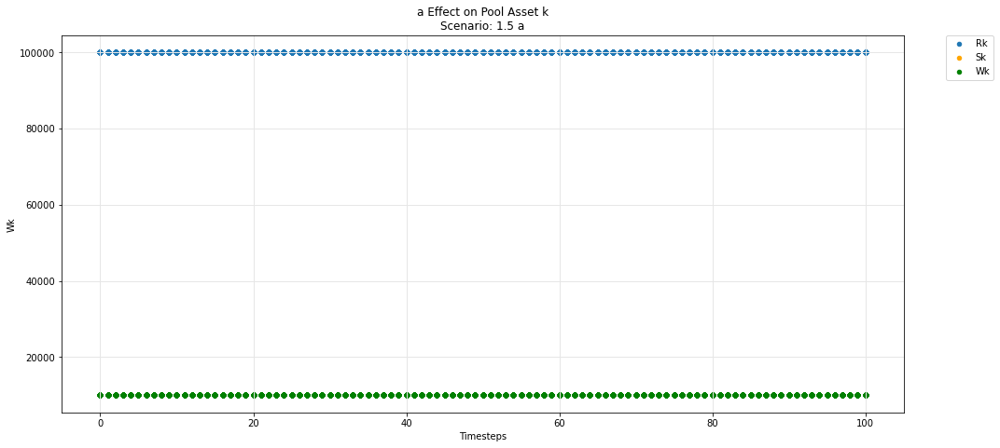

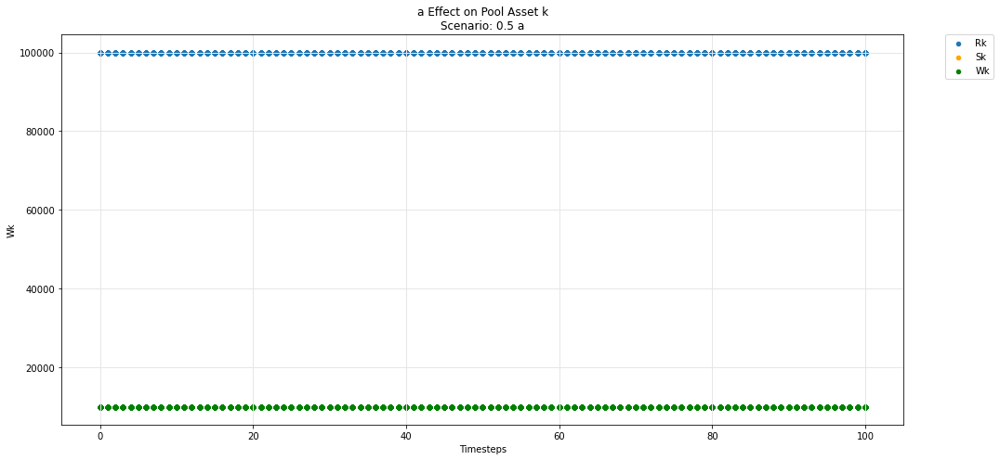

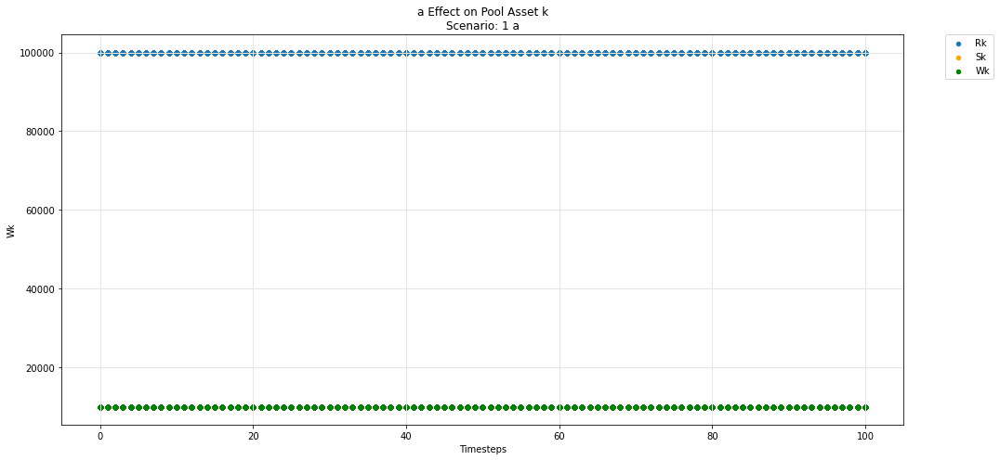

In [62]:
param_pool_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

In [63]:
def param_pool_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=df_label, label=df_label, ax=ax, legend=True, kind ='scatter')

        for count, arg in enumerate(args):
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))

            df.plot(x='timestep', y=df_arg_label, label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

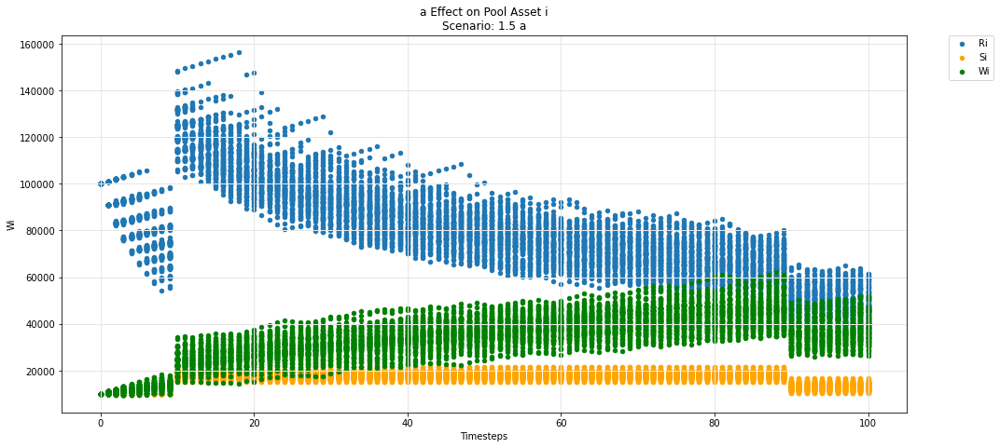

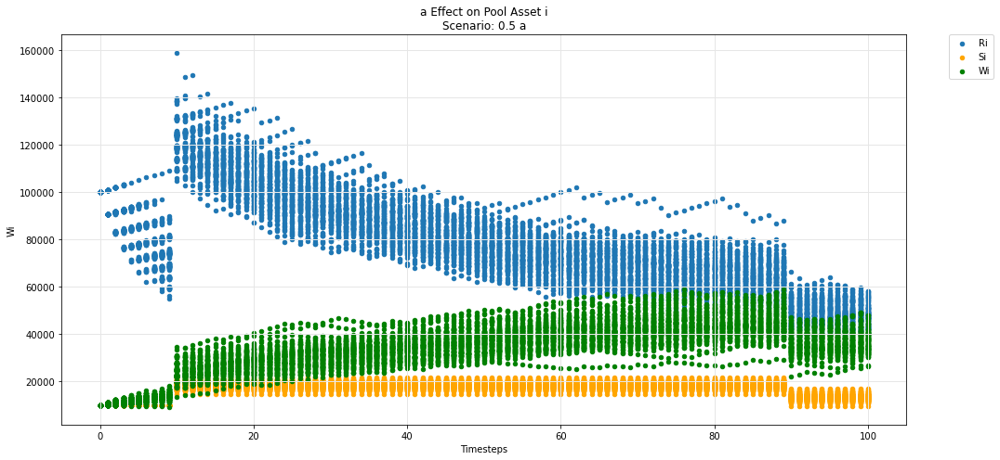

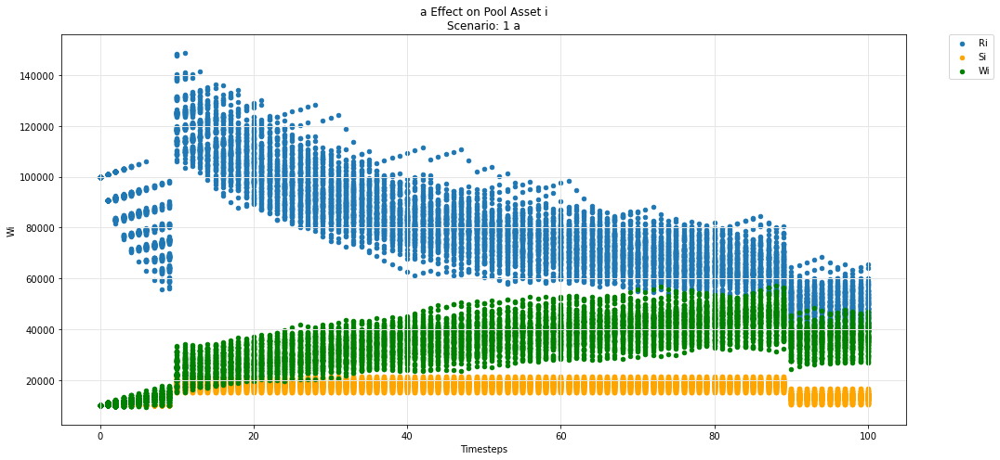

In [64]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

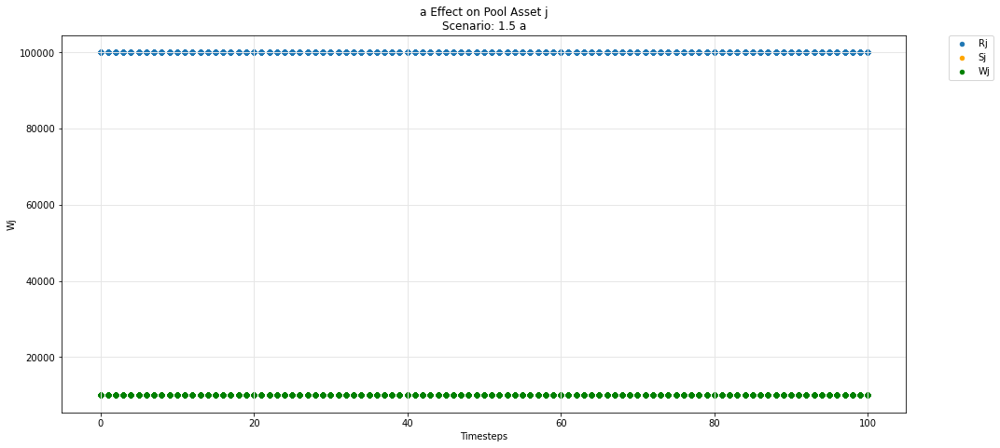

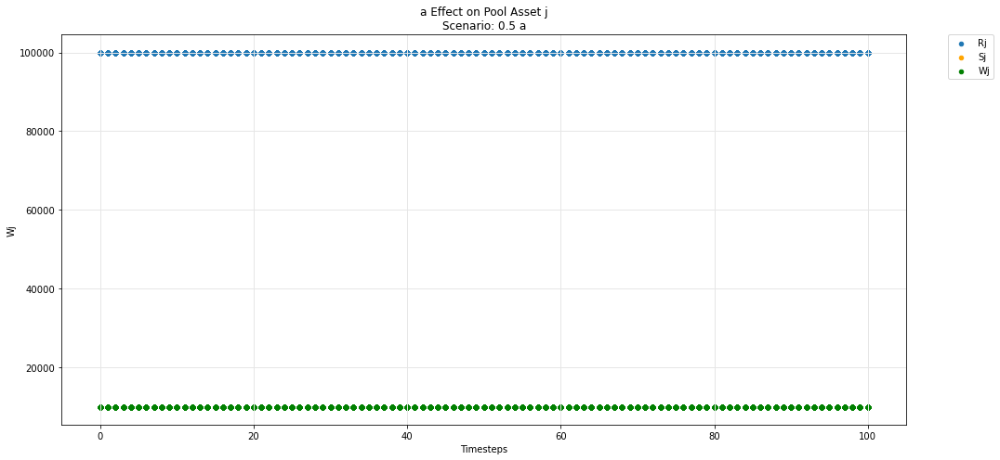

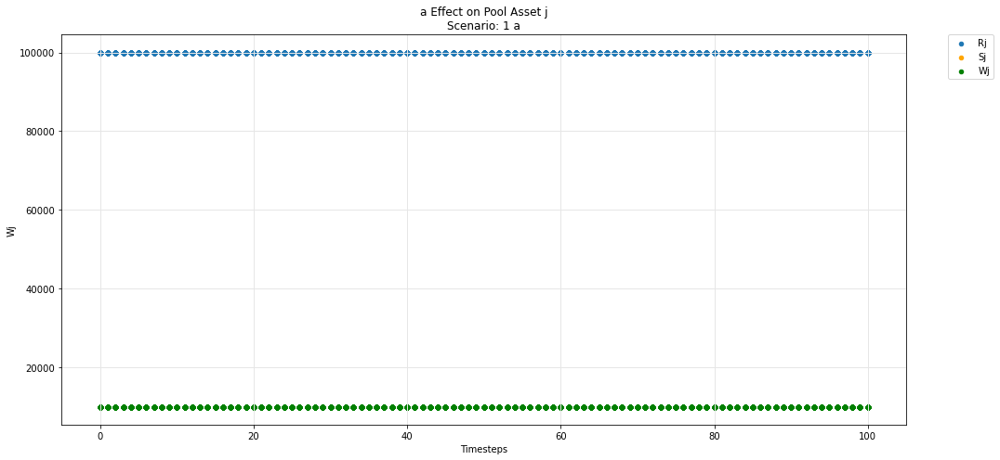

In [65]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

In [66]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

# Prices

## Uniswap

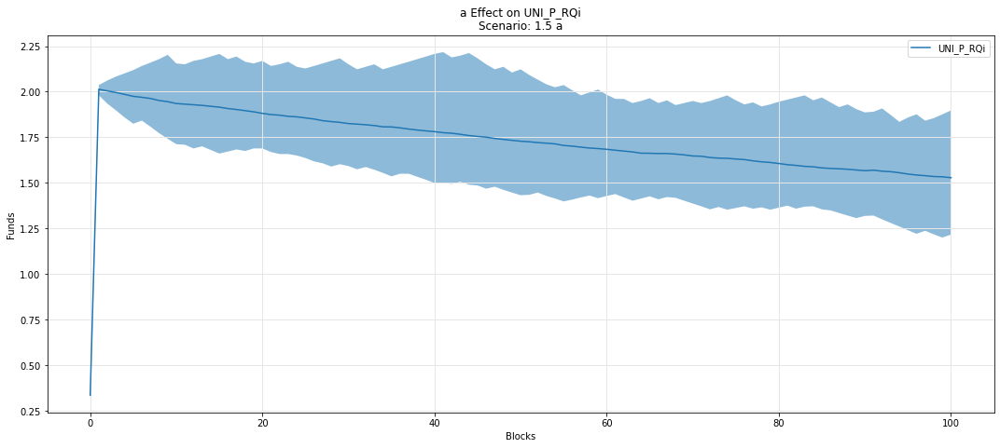

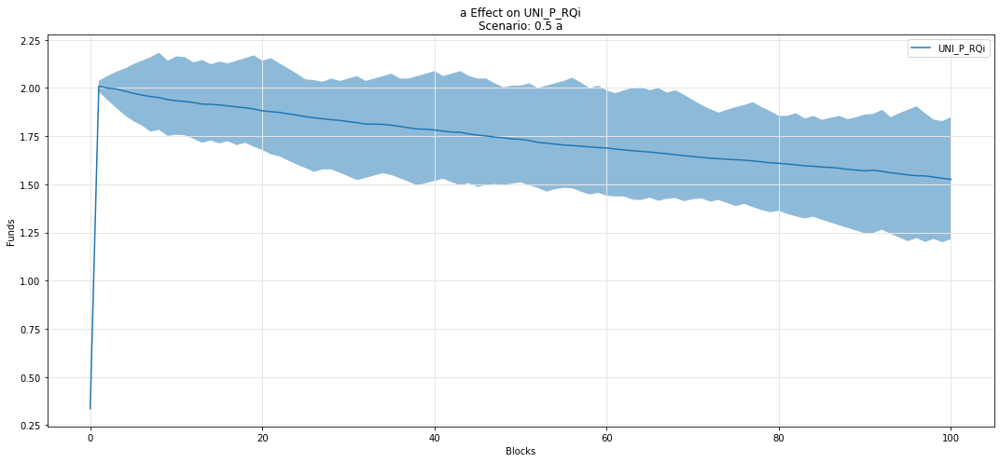

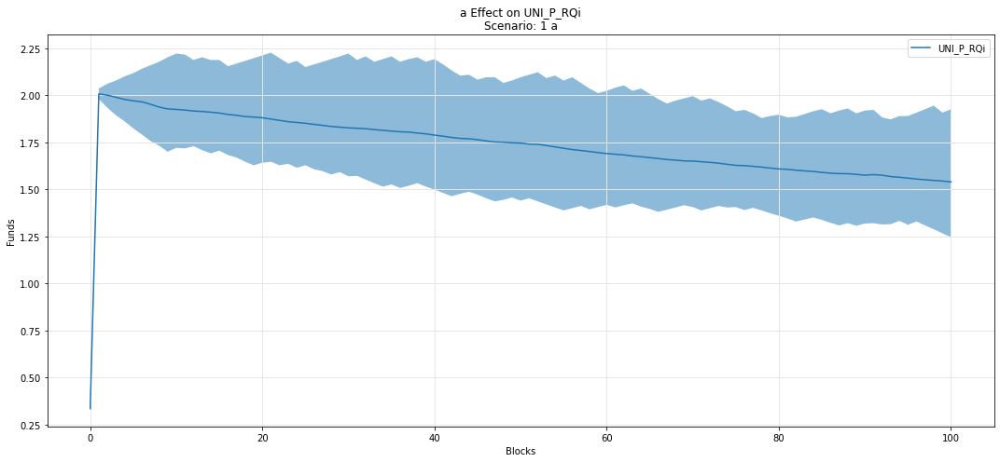

In [67]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQi')

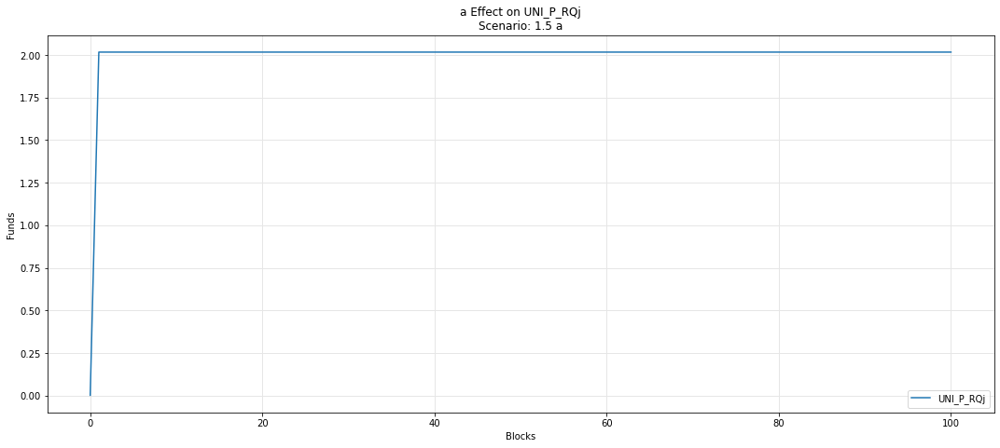

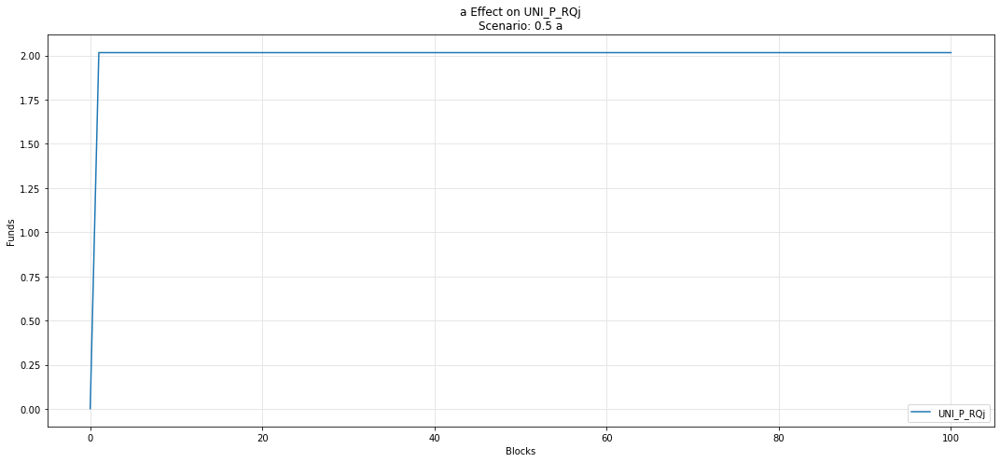

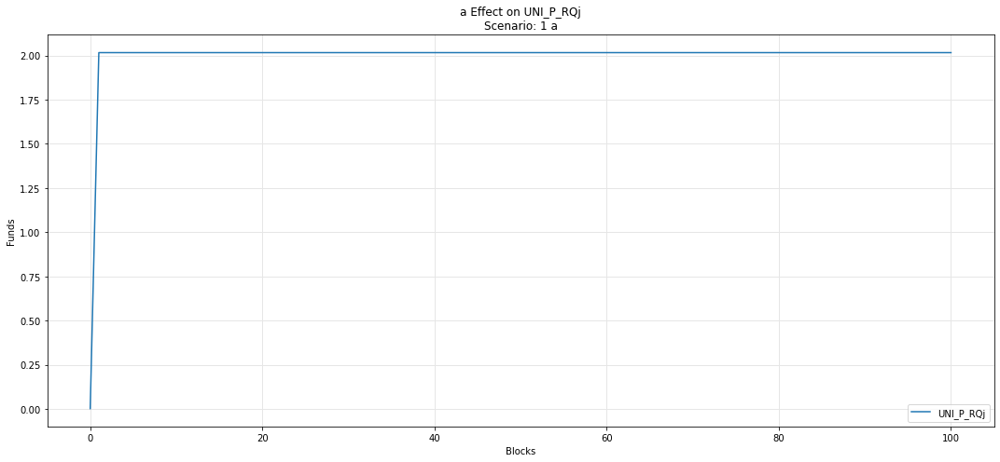

In [68]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQj')

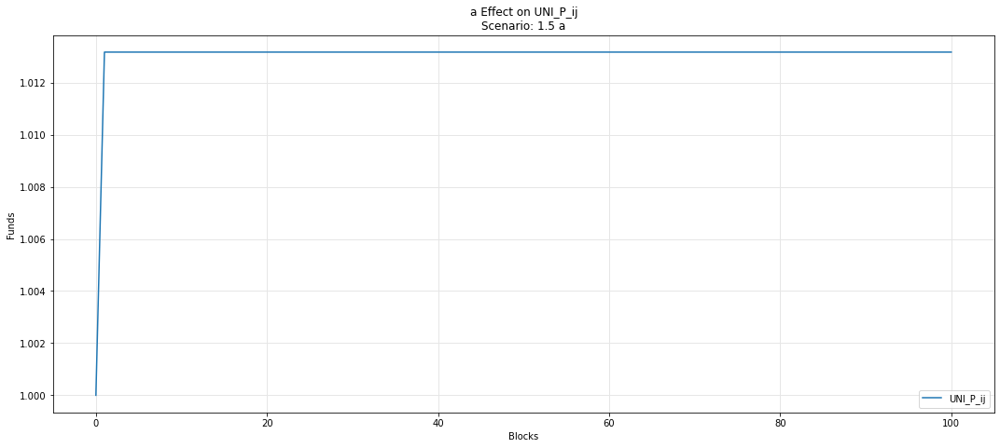

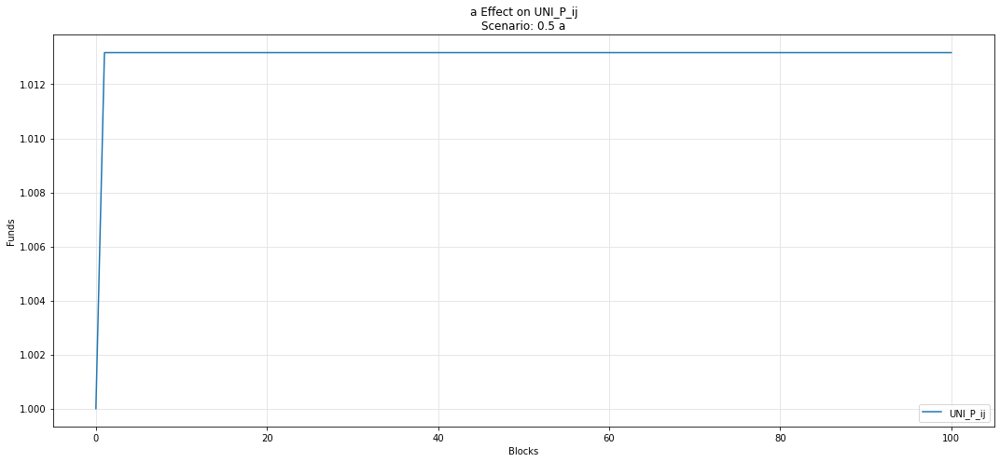

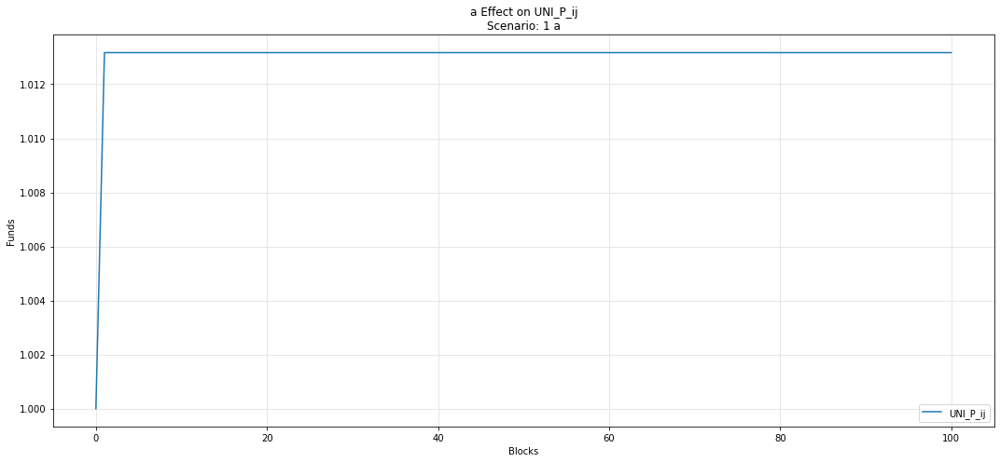

In [69]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_ij')

## Omnipool

## Asset i

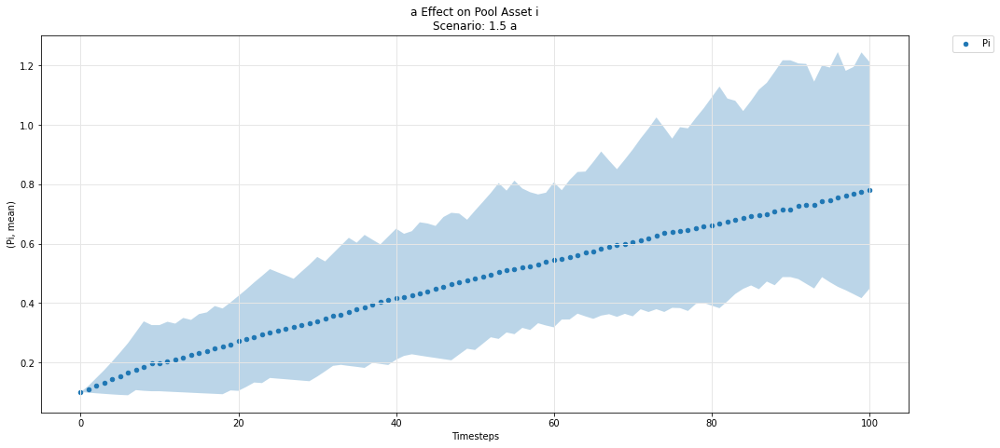

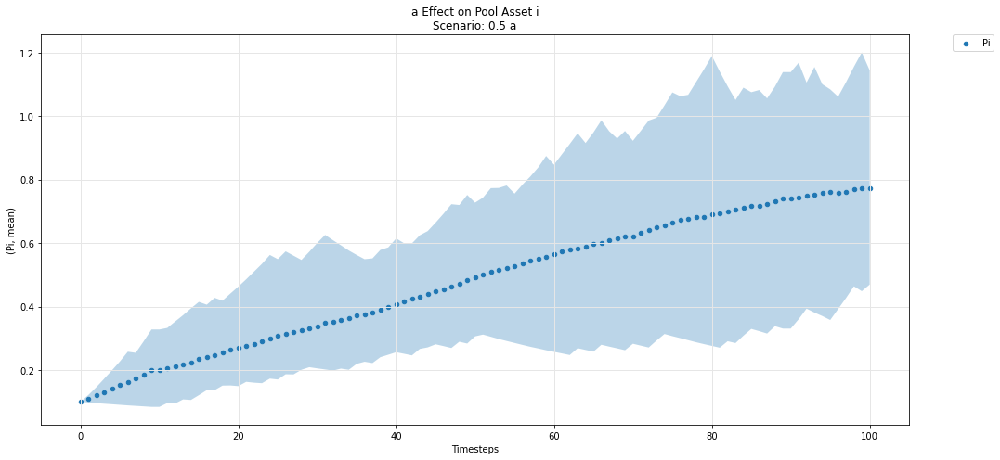

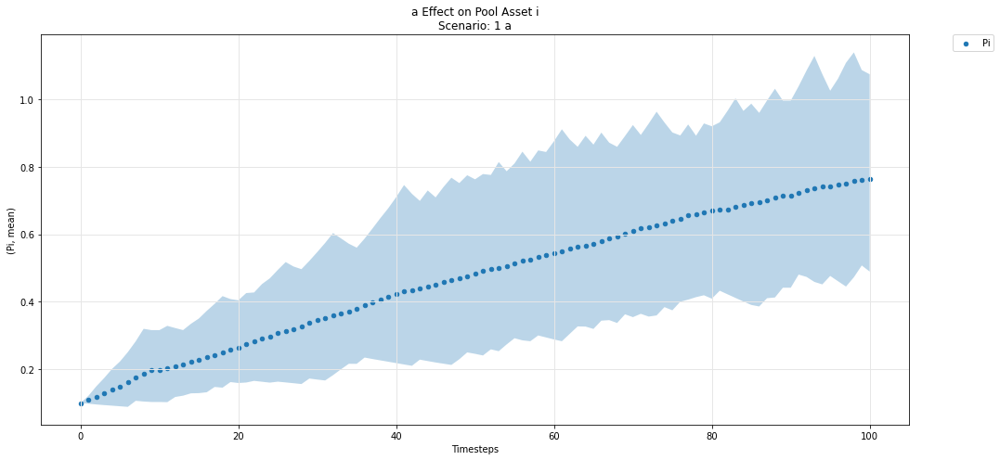

In [70]:
param_pool_simulation_plot(experiments, config_ids, 'a','i','P')

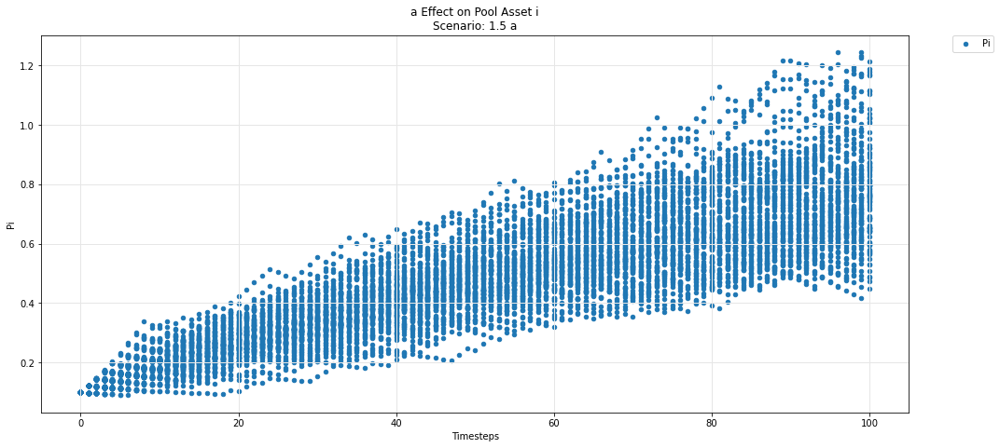

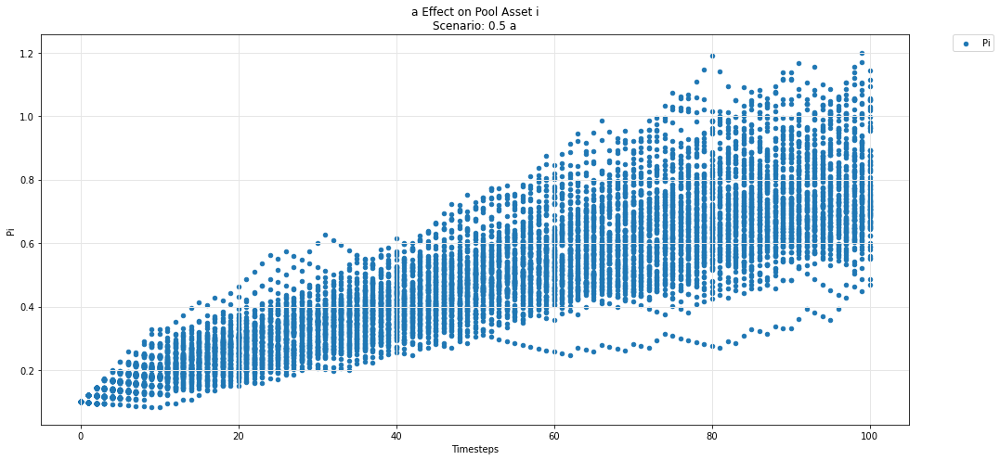

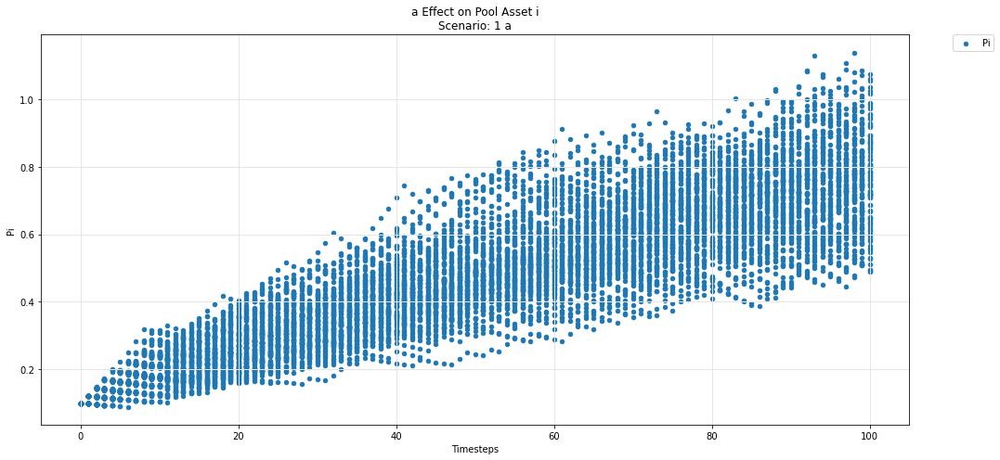

In [71]:
param_pool_plot(experiments, config_ids, 'a','i','P')

## Asset j

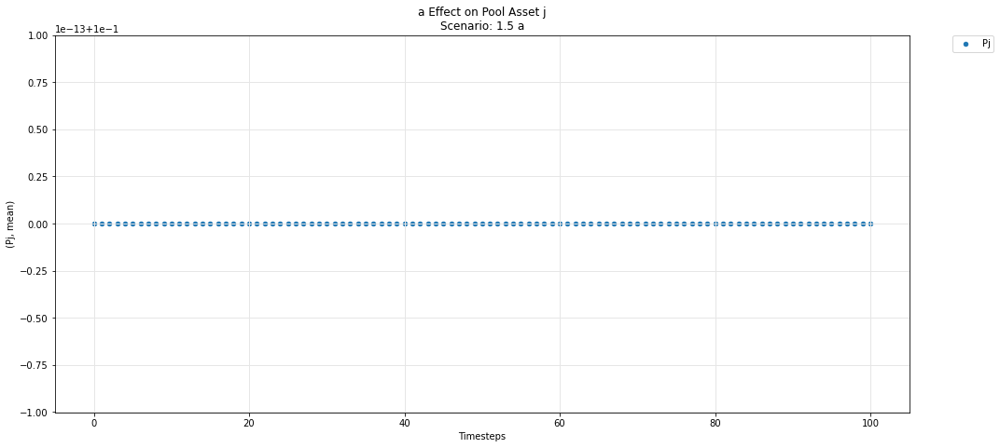

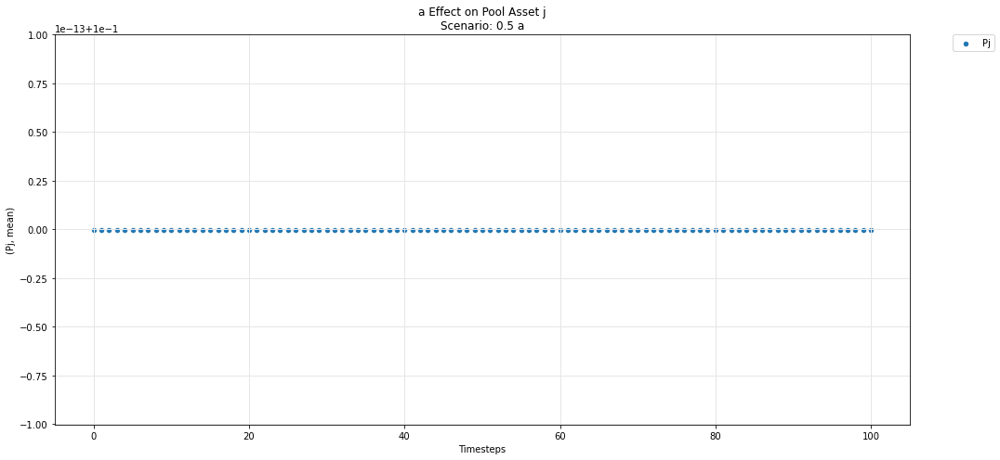

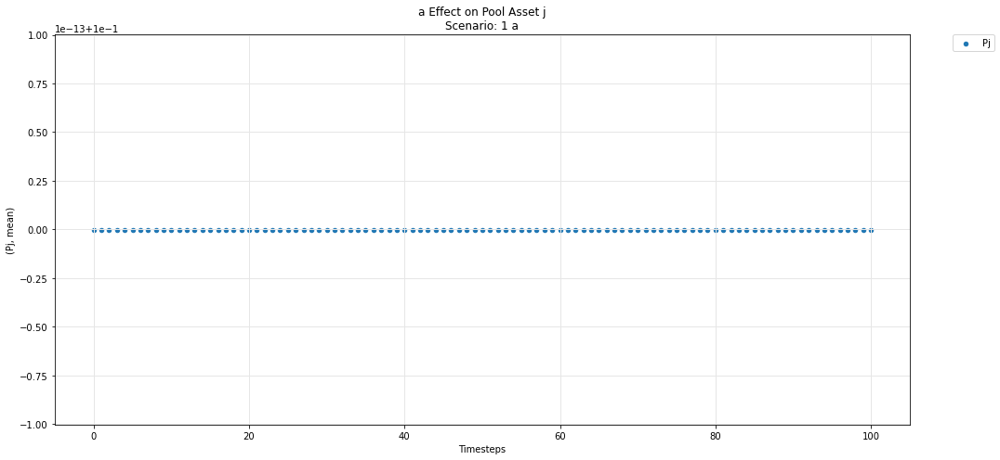

In [72]:
param_pool_simulation_plot(experiments, config_ids, 'a','j','P')

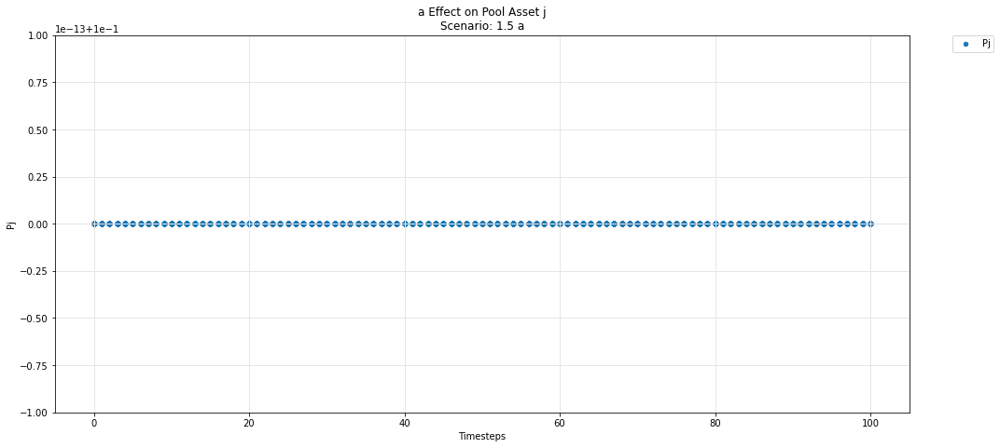

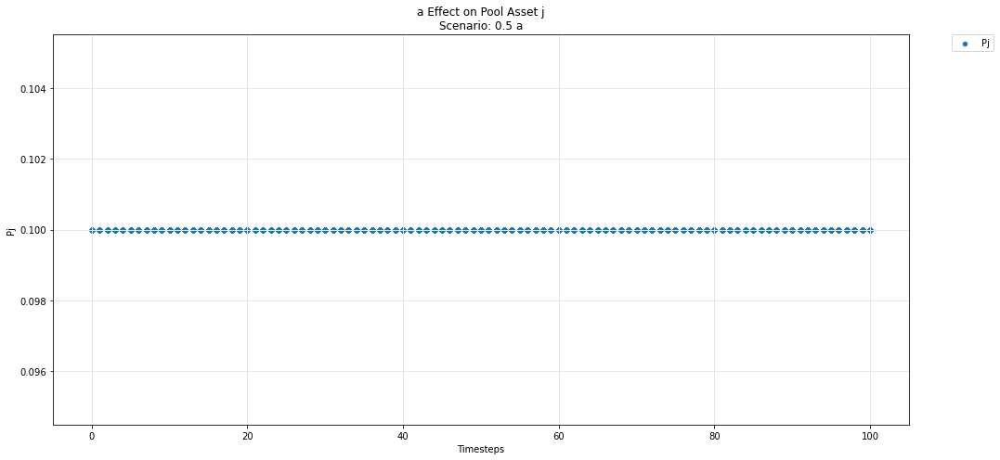

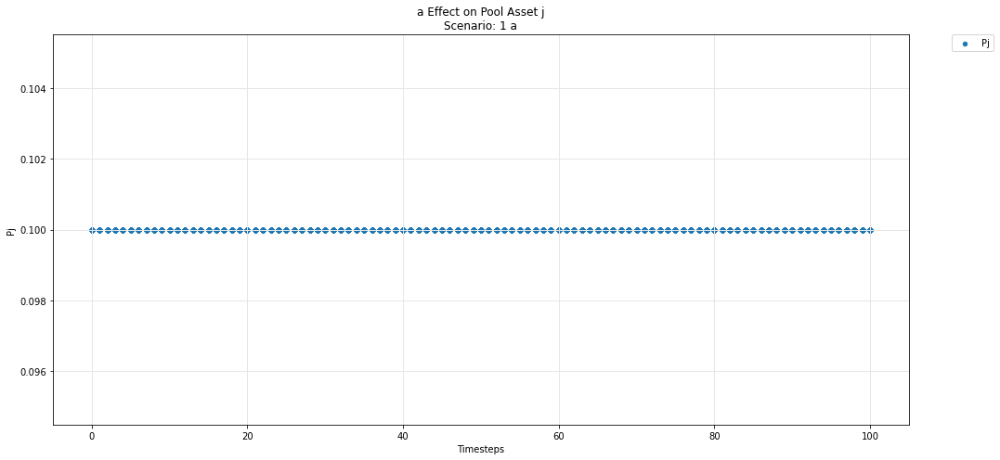

In [73]:
param_pool_plot(experiments, config_ids, 'a','j','P')

## Asset k

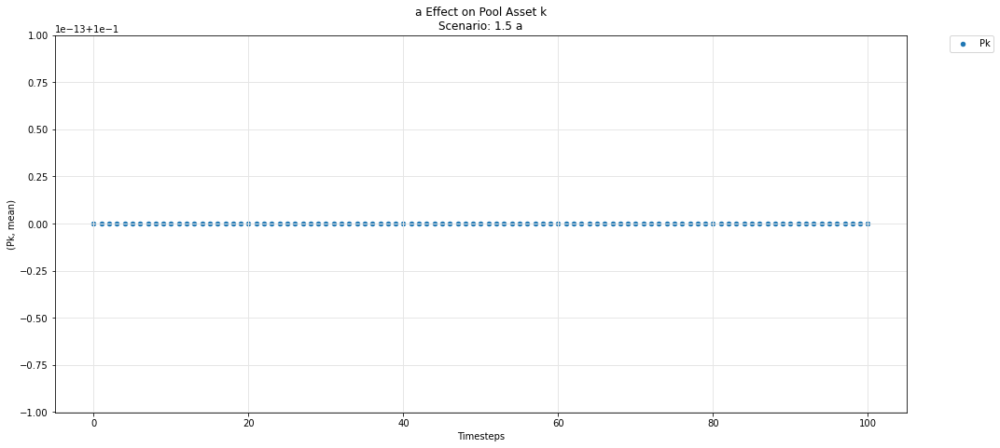

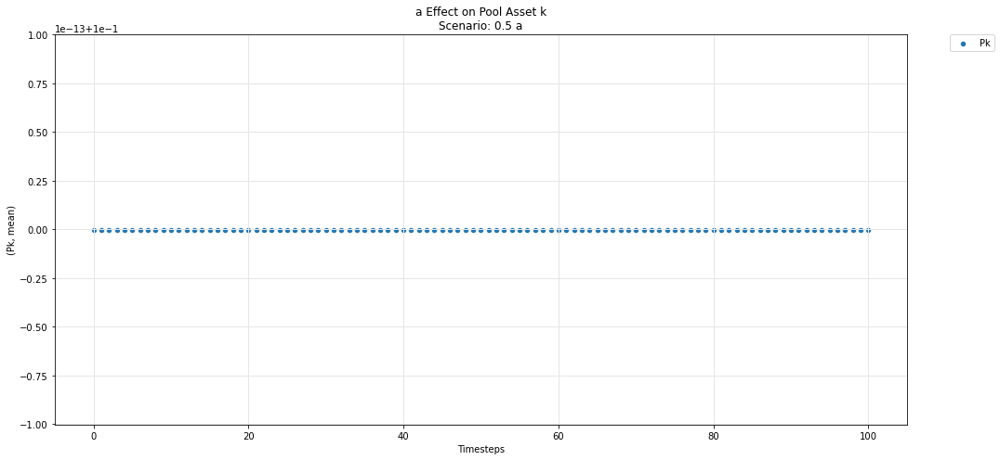

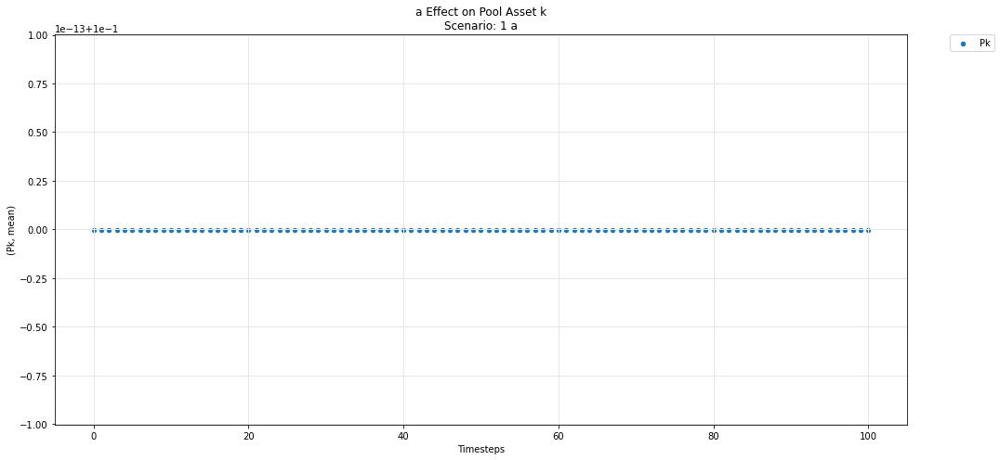

In [74]:
param_pool_simulation_plot(experiments, config_ids, 'a','k','P')

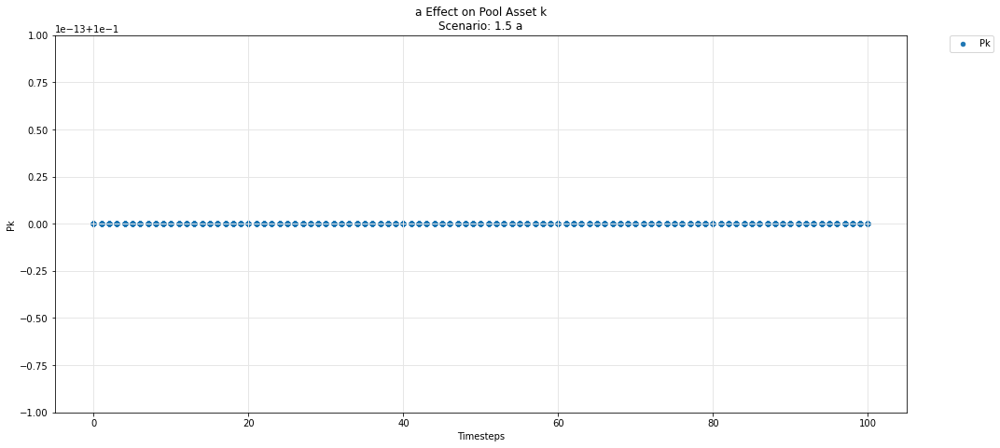

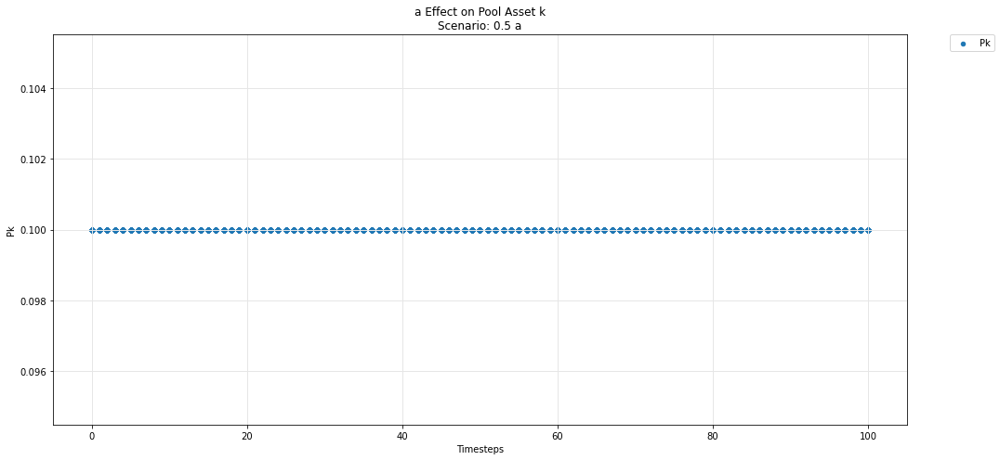

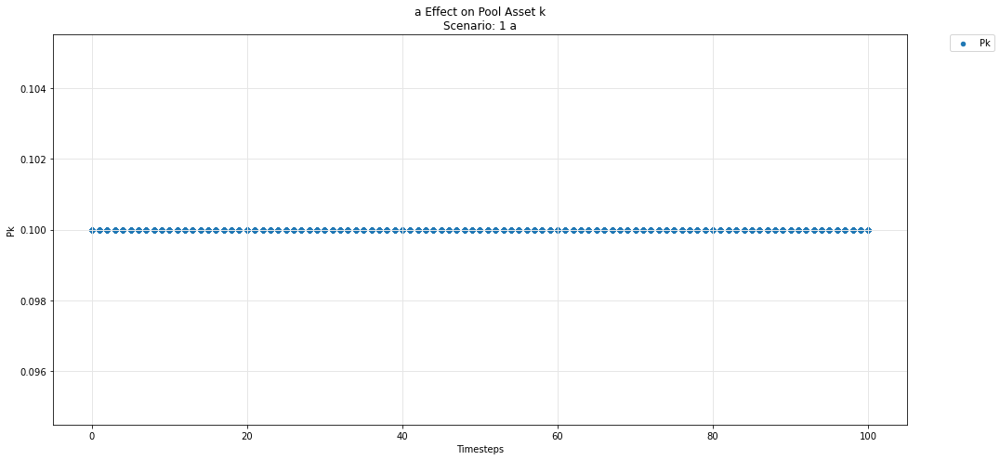

In [75]:
param_pool_plot(experiments, config_ids, 'a','k','P')